# **Importing Necessary Libraries**

In [ ]:
import sys
assert sys.version_info >= (3, 5)
# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"
# Common imports
import numpy as np
import os, time
import pandas as pd
# Our new Deep Learning imports
import tensorflow as tf
from tensorflow import keras
# To plot nice figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
import seaborn as sns; sns.set()
# Check the versions are OK (both should be 2 or more)
print(tf.__version__)
print(keras.__version__)

2.18.0
3.8.0


In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer

# File names for the CSV files
file_train = 'sign_mnist_train.csv'
file_test = 'sign_mnist_test.csv'

# Load the datasets
train_df = pd.read_csv(file_train)
test_df = pd.read_csv(file_test)

# Extract labels for histogram plotting
Y_train = train_df.iloc[:, 0]  # The first column
Y_test = test_df.iloc[:, 0]    # The first column

# Print the shapes of the datasets
print("Shape of training dataset:", train_df.shape)
print("Shape of testing dataset:", test_df.shape)




Shape of training dataset: (27455, 1025)
Shape of testing dataset: (7172, 1025)


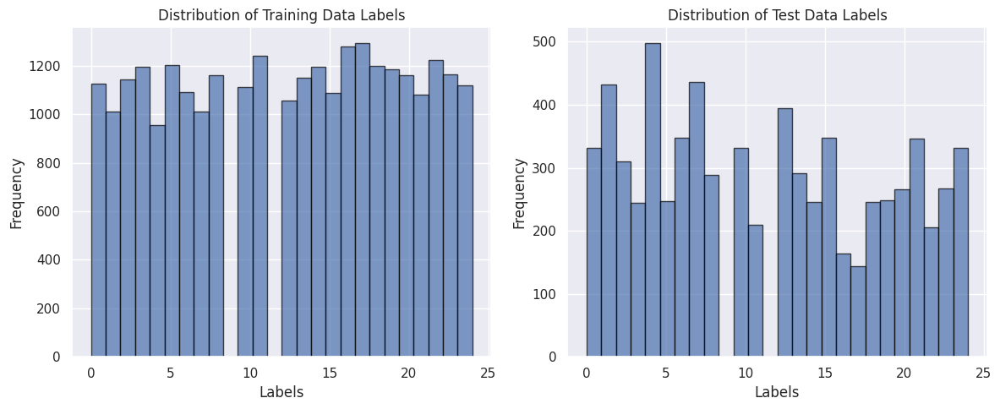

In [ ]:
# Plot histograms for label distributions
plt.figure(figsize=(12, 5))

# Histogram for training labels
plt.subplot(1, 2, 1)
plt.hist(Y_train, bins=26, edgecolor='black', alpha=0.7)
plt.title('Distribution of Training Data Labels')
plt.xlabel('Labels')
plt.ylabel('Frequency')

# Histogram for testing labels
plt.subplot(1, 2, 2)
plt.hist(Y_test, bins=26, edgecolor='black', alpha=0.7)
plt.title('Distribution of Test Data Labels')
plt.xlabel('Labels')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [ ]:
# Extract the feature matrix and label vector from the training and test datasets
X_full = train_df.loc[:, train_df.columns != 'label'].to_numpy()
y_full = train_df['label'].to_numpy()
X_test = test_df.loc[:, test_df.columns != 'label'].to_numpy()
y_test = test_df['label'].to_numpy()

# Split the training dataset into training and validation sets with stratification
X_train, X_valid, y_train, y_valid = train_test_split(
    X_full, y_full, test_size=0.2, stratify=y_full, random_state=42
)

# Normalize pixel values to the range [0, 1]
X_train = X_train.astype(np.float32) / 255.0
X_valid = X_valid.astype(np.float32) / 255.0
X_test = X_test.astype(np.float32) / 255.0

# Reshape data to have a single channel (assuming grayscale images of size 32x32)
X_train = np.expand_dims(X_train, axis=-1).reshape(-1, 32, 32, 1)
X_valid = np.expand_dims(X_valid, axis=-1).reshape(-1, 32, 32, 1)
X_test = np.expand_dims(X_test, axis=-1).reshape(-1, 32, 32, 1)

In [ ]:
# Convert labels to one-hot encoded vectors
lb = LabelBinarizer()
y_train = lb.fit_transform(y_train)
y_valid = lb.transform(y_valid)
y_test = lb.transform(y_test)

# Display a sample of the transformed labels and the shapes of the datasets
print("Example of one-hot encoded label in y_train:", y_train[0])
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_valid:", X_valid.shape)
print("Shape of y_valid:", y_valid.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

Example of one-hot encoded label in y_train: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
Shape of X_train: (21964, 32, 32, 1)
Shape of y_train: (21964, 24)
Shape of X_valid: (5491, 32, 32, 1)
Shape of y_valid: (5491, 24)
Shape of X_test: (7172, 32, 32, 1)
Shape of y_test: (7172, 24)


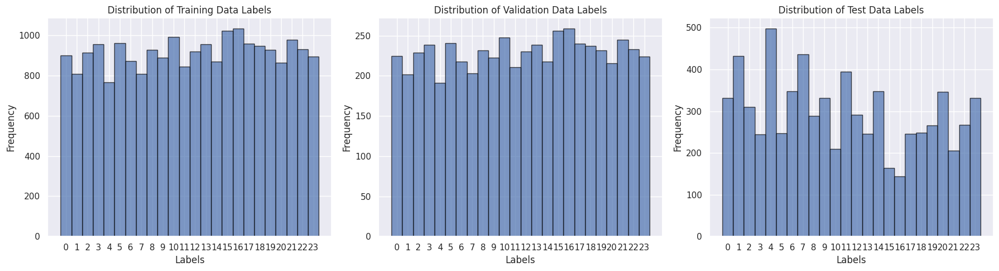

In [ ]:
import matplotlib.pyplot as plt

# Function to plot histograms for labels
def plot_label_histogram(y_data, title, ax):
    # Convert one-hot encoded labels back to integers for plotting
    labels = np.argmax(y_data, axis=1)
    ax.hist(labels, bins=np.arange(labels.min(), labels.max() + 2) - 0.5, edgecolor='black', alpha=0.7)
    ax.set_title(title)
    ax.set_xlabel('Labels')
    ax.set_ylabel('Frequency')
    ax.set_xticks(np.arange(labels.min(), labels.max() + 1))

# Create a figure with subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Plot histograms for the training, validation, and test labels
plot_label_histogram(y_train, 'Distribution of Training Data Labels', axs[0])
plot_label_histogram(y_valid, 'Distribution of Validation Data Labels', axs[1])
plot_label_histogram(y_test, 'Distribution of Test Data Labels', axs[2])

# Adjust layout and display the plots
plt.tight_layout()
plt.show()



Mapping from 0-23 to A-Y, excluding 'J' and 'Z':
{0: 'A', 1: 'B', 2: 'C', 3: 'D', 4: 'E', 5: 'F', 6: 'G', 7: 'H', 8: 'I', 10: 'K', 11: 'L', 12: 'M', 13: 'N', 14: 'O', 15: 'P', 16: 'Q', 17: 'R', 18: 'S', 19: 'T', 20: 'U', 21: 'V', 22: 'W', 23: 'X', 24: 'Y'}


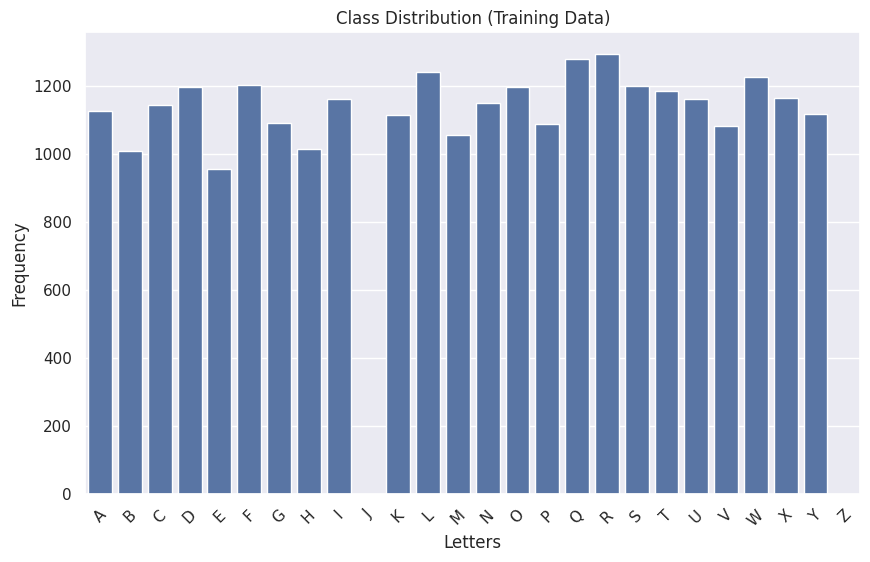

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string

# Create a list of all uppercase letters excluding 'J' and 'Z'
letters_all = list(string.ascii_uppercase)
excluded = ['J','Z']

# Create a mapping from 0-23 (excluding 9 and 25) to A-Y (excluding 'J' and 'Z')
label_to_letter_mapping = {i: letter for i, letter in enumerate(letters_all) if letter not in excluded}

# Print the mapping to verify
print("Mapping from 0-23 to A-Y, excluding 'J' and 'Z':")
print(label_to_letter_mapping)

# Apply the mapping to the 'label' column to create a new 'mapped_letter' column
train_df['mapped_letter'] = train_df['label'].apply(lambda x: label_to_letter_mapping[x])

# Ensure that 'J' and 'Z' are included in the plot, even with zero counts
all_letters = letters_all  # This now includes 'J' and 'Z'

# Plot the distribution of the mapped letters, including 'J' and 'Z' with zero counts
plt.figure(figsize=(10, 6))
sns.countplot(data=train_df, x='mapped_letter', order=all_letters)
plt.title("Class Distribution (Training Data)")
plt.xlabel("Letters")
plt.ylabel("Frequency")
plt.xticks(rotation=45)
plt.show()




Mapping from 0-23 to A-X, excluding 'J', 'Z', and 'Y':
{0: 'A', 1: 'B', 2: 'C', 3: 'D', 4: 'E', 5: 'F', 6: 'G', 7: 'H', 8: 'I', 10: 'K', 11: 'L', 12: 'M', 13: 'N', 14: 'O', 15: 'P', 16: 'Q', 17: 'R', 18: 'S', 19: 'T', 20: 'U', 21: 'V', 22: 'W', 23: 'X'}


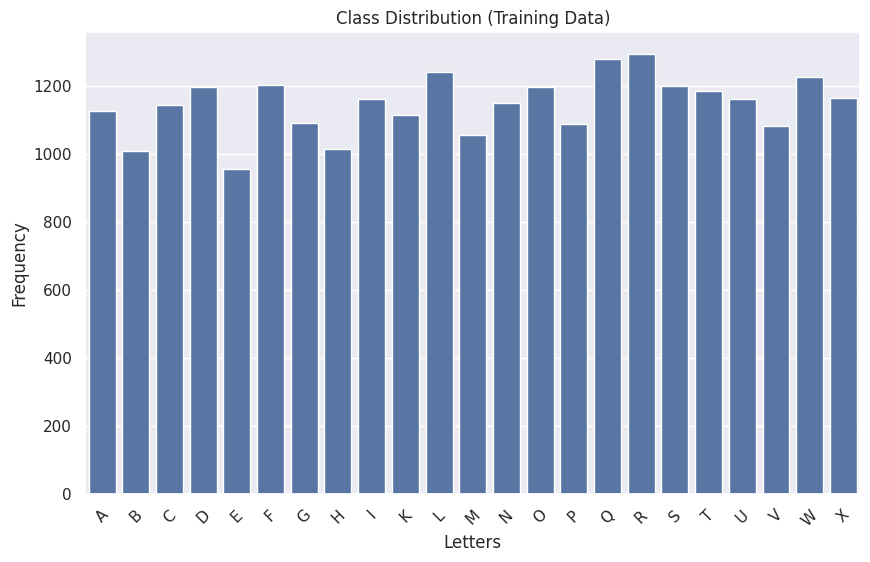

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string

# Create a list of all uppercase letters excluding 'J', 'Z', and 'Y'
letters_all = list(string.ascii_uppercase)
excluded = ['J', 'Z', 'Y']

# Create a mapping from 0-23 (excluding 9, 24, and 25) to A-X (excluding 'J', 'Z', and 'Y')
# Adjust the range to include all labels in your dataset
label_to_letter_mapping = {i: letter for i, letter in enumerate(letters_all) if letter not in excluded}

# Print the mapping to verify
print("Mapping from 0-23 to A-X, excluding 'J', 'Z', and 'Y':")
print(label_to_letter_mapping)

# Assuming 'train_df' exists and has a 'label' column with appropriate values
# Apply the mapping to the 'label' column to create a new 'mapped_letter' column
# Handle KeyError by using a default value or removing rows with problematic labels
train_df['mapped_letter'] = train_df['label'].apply(lambda x: label_to_letter_mapping.get(x, 'Unknown')) # Using 'Unknown' as default for missing keys


# Create the list of all letters (including excluded letters) for consistent ordering in the plot
all_letters = [letter for letter in letters_all if letter not in excluded]

# Plot the distribution of the mapped letters, excluding 'J', 'Z', and 'Y'
plt.figure(figsize=(10, 6))
sns.countplot(data=train_df, x='mapped_letter', order=all_letters)
plt.title("Class Distribution (Training Data)")
plt.xlabel("Letters")
plt.ylabel("Frequency")
plt.xticks(rotation=45)
plt.show()

Mapping from 0-23 to A-X, excluding 'J', 'Z', and 'Y':
{0: 'A', 1: 'B', 2: 'C', 3: 'D', 4: 'E', 5: 'F', 6: 'G', 7: 'H', 8: 'I', 10: 'K', 11: 'L', 12: 'M', 13: 'N', 14: 'O', 15: 'P', 16: 'Q', 17: 'R', 18: 'S', 19: 'T', 20: 'U', 21: 'V', 22: 'W', 23: 'X'}


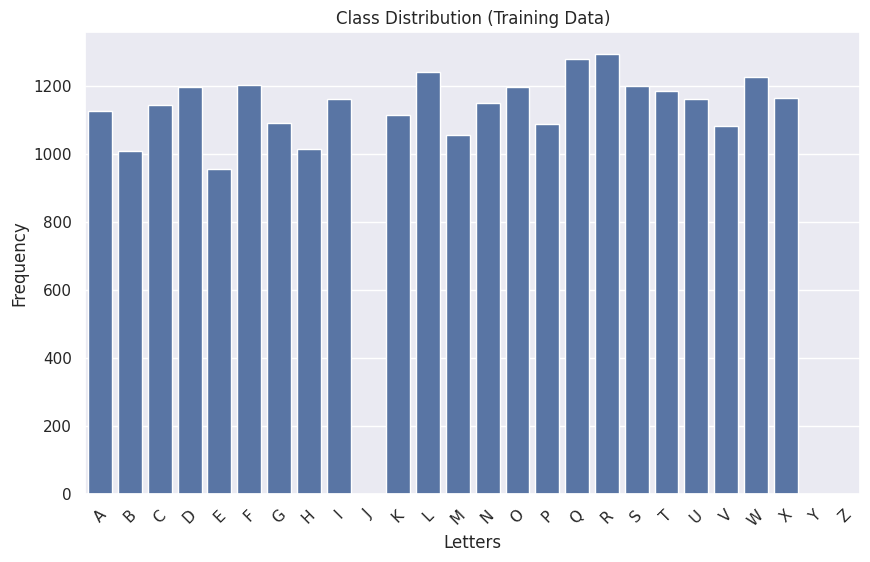

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string

# Create a list of all uppercase letters excluding 'J', 'Z', and 'Y'
letters_all = list(string.ascii_uppercase)
excluded = ['J', 'Z', 'Y']

# Create a mapping from 0-22 (excluding 9, 24, and 25) to A-X (excluding 'J', 'Z', and 'Y')
label_to_letter_mapping = {i: letter for i, letter in enumerate(letters_all) if letter not in excluded}

# Print the mapping to verify
print("Mapping from 0-23 to A-X, excluding 'J', 'Z', and 'Y':")
print(label_to_letter_mapping)

# Apply the mapping to the 'label' column to create a new 'mapped_letter' column
# Handle KeyError by using a default value or removing rows with problematic labels
train_df['mapped_letter'] = train_df['label'].apply(lambda x: label_to_letter_mapping.get(x, 'Unknown'))

# Include 'J', 'Z', and 'Y' in the plot even if they have zero counts
all_letters = list(string.ascii_uppercase)  # Include all letters

# Plot the distribution of the mapped letters, including gaps for 'J', 'Z', and 'Y'
plt.figure(figsize=(10, 6))
sns.countplot(data=train_df, x='mapped_letter', order=all_letters)  # Use all_letters for order
plt.title("Class Distribution (Training Data)")
plt.xlabel("Letters")
plt.ylabel("Frequency")
plt.xticks(rotation=45)
plt.show()

# **DATA VISUALIZATION**

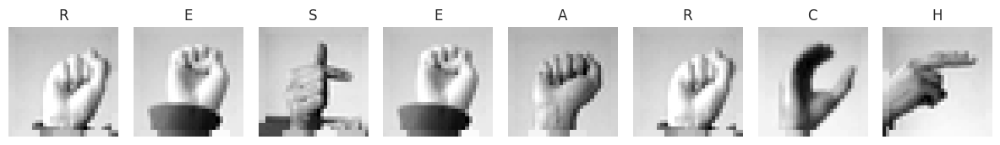

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Convert y_train to single label per sample if it is one-hot encoded
y_labels_train = np.argmax(y_train, axis=1)

# Define the sequence up to 'K'
sequence = "RESEARCH"
fig, axes_array = plt.subplots(1, len(sequence), figsize=(12, 2.5))

for index, char in enumerate(sequence):
    # Ensure the character exists in the mapping
    if char in label_to_letter_mapping.values():
        # Find the numeric label corresponding to the character
        label_index = [key for key, value in label_to_letter_mapping.items() if value == char]

        if label_index:  # Check if the label_index is not empty
            label_index = label_index[0]
            # Select an image corresponding to the numeric label
            matching_images = X_train[y_labels_train == label_index]

            if len(matching_images) > 0:  # Ensure there are matching images
                img_selected = matching_images[0]
                axes_array[index].imshow(img_selected.reshape(32, 32), cmap='gray')
                axes_array[index].set_title(char)
            else:
                axes_array[index].set_title(f"No image for {char}")
        else:
            axes_array[index].set_title(f"No label for {char}")
    else:
        axes_array[index].set_title(f"No mapping for {char}")

    axes_array[index].grid(False)
    axes_array[index].axis('off')

plt.tight_layout()
plt.show()



# **Baseline CNN Model**

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - accuracy: 0.3297 - loss: 2.2006 - val_accuracy: 0.9577 - val_loss: 0.1431
Epoch 2/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9174 - loss: 0.2422 - val_accuracy: 0.9989 - val_loss: 0.0141
Epoch 3/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9736 - loss: 0.0809 - val_accuracy: 0.9951 - val_loss: 0.0127
Epoch 4/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.9785 - loss: 0.0601 - val_accuracy: 0.9989 - val_loss: 0.0065
Epoch 5/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9872 - loss: 0.0409 - val_accuracy: 1.0000 - val_loss: 4.0888e-04
Epoch 6/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9894 - loss: 0.0340 - val_accuracy: 1.0000 - val_loss: 2.5196e-04
Epoch 7/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.9903 - loss: 0.0296 - val_accuracy: 1.0000 - val_loss: 1.8971e-04
Epoch 8/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9901 - loss: 0.0318 - val

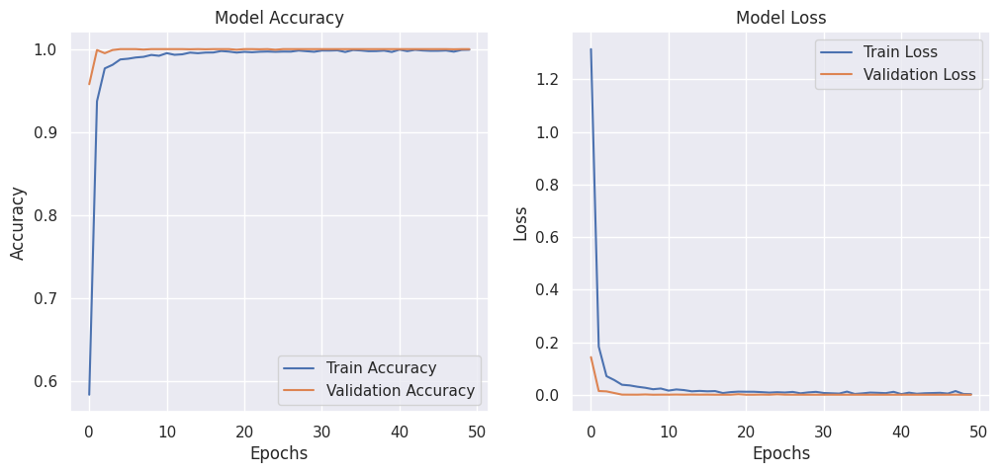

225/225 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


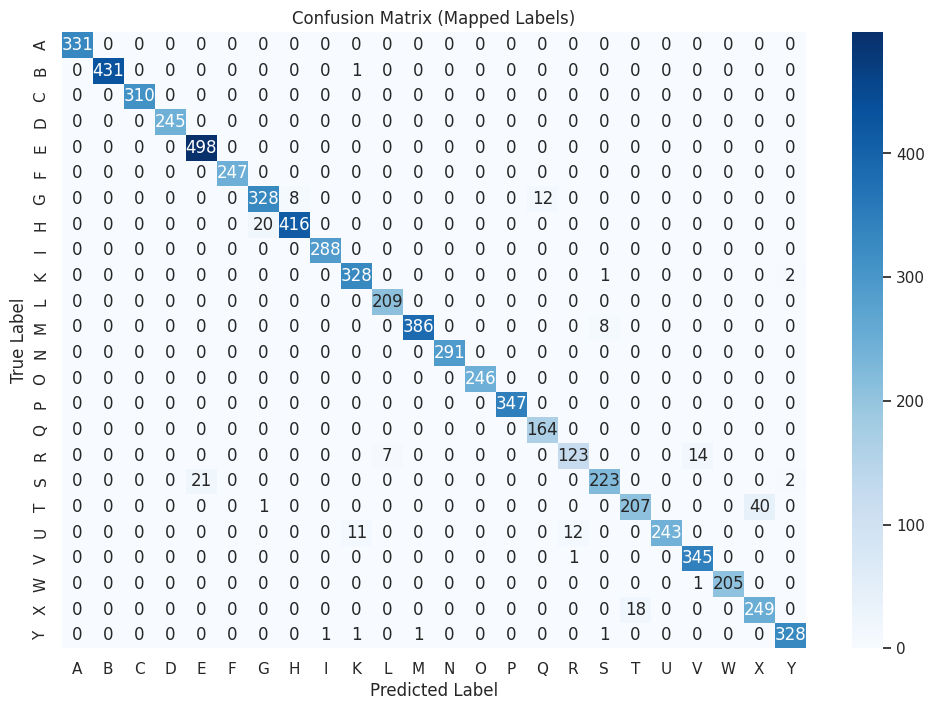

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       331
           1       1.00      1.00      1.00       432
           2       1.00      1.00      1.00       310
           3       1.00      1.00      1.00       245
           4       0.96      1.00      0.98       498
           5       1.00      1.00      1.00       247
           6       0.94      0.94      0.94       348
           7       0.98      0.95      0.97       436
           8       1.00      1.00      1.00       288
           9       0.96      0.99      0.98       331
          10       0.97      1.00      0.98       209
          11       1.00      0.98      0.99       394
          12       1.00      1.00      1.00       291
          13       1.00      1.00      1.00       246
          14       1.00      1.00      1.00       347
          15       0.93      1.00      0.96       164
          16       0.90      0.85      0.88       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# Define the CNN model
def build_baseline_cnn(input_shape, num_classes):
    model = keras.Sequential([
        keras.layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=input_shape),
        keras.layers.MaxPooling2D((2,2)),

        keras.layers.Conv2D(64, (3,3), activation='relu', padding='same'),
        keras.layers.MaxPooling2D((2,2)),

        keras.layers.Conv2D(128, (3,3), activation='relu', padding='same'),
        keras.layers.MaxPooling2D((2,2)),

        keras.layers.Flatten(),
        keras.layers.Dense(256, activation='relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Get input shape and number of classes
input_shape = (32, 32, 1)  # Assuming grayscale images of size 32x32
num_classes = 24  # Excluding 'J' and 'Z'

# Build the model
model = build_baseline_cnn(input_shape, num_classes)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_valid, y_valid))

# Evaluate the model on test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot training & validation accuracy and loss
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Accuracy plot
ax[0].plot(history.history['accuracy'], label='Train Accuracy')
ax[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

# Loss plot
ax[1].plot(history.history['loss'], label='Train Loss')
ax[1].plot(history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()

plt.show()

# Generate predictions
y_pred = model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Mapping numerical labels to corresponding letters (excluding 'J' and 'Z')
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")  # Excluding 'J' and 'Z'

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


# **Hyper-parametric optimisation of CNN Model**

In [ ]:
!pip install optuna


[I 2025-02-20 13:56:50,524] A new study created in memory with name: no-name-a561ba27-3f07-4533-bda1-7f162bea2774
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-02-20 14:00:43,946] Trial 0 finished with value: 1.0 and parameters: {'num_filters': 64, 'dropout_rate': 0.448982439850915, 'learning_rate': 0.00013409704860819208}. Best is trial 0 with value: 1.0.
[I 2025-02-20 14:06:50,939] Trial 1 finished with value: 1.0 and parameters: {'num_filters': 128, 'dropout_rate': 0.39962559155416677, 'learning_rate': 0.000496979581979694}. Best is trial 0 with value: 1.0.
[I 2025-02-20 14:09:27,267] Trial 2 finished with value: 1.0 and parameters: {'num_filters': 64, 'dropout_rate': 0.38164471655

Best Hyperparameters: {'num_filters': 64, 'dropout_rate': 0.448982439850915, 'learning_rate': 0.00013409704860819208}
Epoch 1/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 13s 12ms/step - accuracy: 0.5843 - loss: 1.5579 - val_accuracy: 0.9995 - val_loss: 0.0288 - learning_rate: 1.3410e-04
Epoch 2/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.9860 - loss: 0.0519 - val_accuracy: 1.0000 - val_loss: 0.0017 - learning_rate: 1.3410e-04
Epoch 3/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.9951 - loss: 0.0184 - val_accuracy: 1.0000 - val_loss: 6.7402e-04 - learning_rate: 1.3410e-04
Epoch 4/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9967 - loss: 0.0133 - val_accuracy: 1.0000 - val_loss: 0.0011 - learning_rate: 1.3410e-04
Epoch 5/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.9940 - loss: 0.0186 - val_accuracy: 0.9998 - val_loss: 7.8626e-04 - learning_rate: 1.3410e-04
Epoch 6/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.9952 - loss: 0.0154 - val

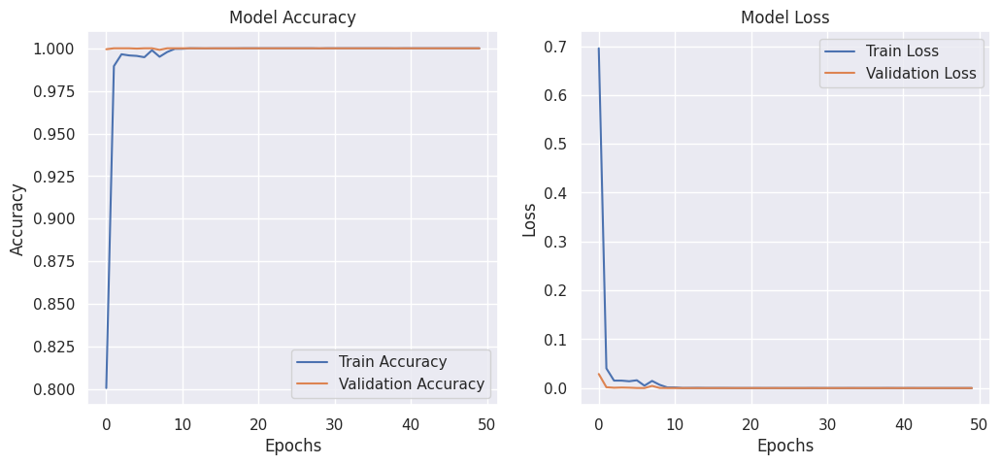

225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


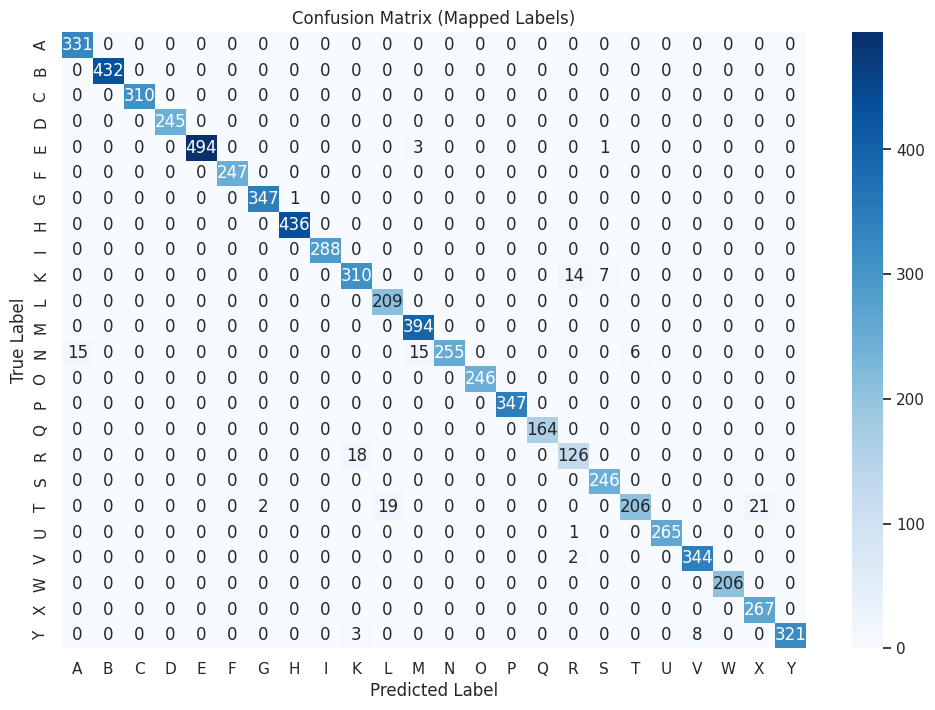

Classification Report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98       331
           1       1.00      1.00      1.00       432
           2       1.00      1.00      1.00       310
           3       1.00      1.00      1.00       245
           4       1.00      0.99      1.00       498
           5       1.00      1.00      1.00       247
           6       0.99      1.00      1.00       348
           7       1.00      1.00      1.00       436
           8       1.00      1.00      1.00       288
           9       0.94      0.94      0.94       331
          10       0.92      1.00      0.96       209
          11       0.96      1.00      0.98       394
          12       1.00      0.88      0.93       291
          13       1.00      1.00      1.00       246
          14       1.00      1.00      1.00       347
          15       1.00      1.00      1.00       164
          16       0.88      0.88      0.88       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
import optuna
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define the CNN model with hyperparameters
def build_cnn_model(trial):
    num_filters = trial.suggest_categorical("num_filters", [32, 64, 128])
    dropout_rate = trial.suggest_float("dropout_rate", 0.3, 0.5)
    learning_rate = trial.suggest_float("learning_rate", 1e-4, 1e-2, log=True)

    model = keras.Sequential([
        keras.layers.Conv2D(num_filters, (3,3), activation='relu', padding='same', input_shape=(32, 32, 1)),
        keras.layers.BatchNormalization(),
        keras.layers.MaxPooling2D((2,2)),

        keras.layers.Conv2D(num_filters * 2, (3,3), activation='relu', padding='same'),
        keras.layers.BatchNormalization(),
        keras.layers.MaxPooling2D((2,2)),

        keras.layers.Conv2D(num_filters * 4, (3,3), activation='relu', padding='same'),
        keras.layers.BatchNormalization(),
        keras.layers.MaxPooling2D((2,2)),

        keras.layers.Flatten(),
        keras.layers.Dense(256, activation='relu'),
        keras.layers.Dropout(dropout_rate),
        keras.layers.Dense(24, activation='softmax')  # Assuming 24 classes excluding 'J' and 'Z'
    ])

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Objective function for Optuna
def objective(trial):
    model = build_cnn_model(trial)
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)

    history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_valid, y_valid),
                        callbacks=[early_stopping, reduce_lr], verbose=0)

    val_loss, val_acc = model.evaluate(X_valid, y_valid, verbose=0)
    return val_acc

# Run hyperparameter optimization
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10)

# Best hyperparameters
print("Best Hyperparameters:", study.best_params)

# Train final model with best parameters
final_model = build_cnn_model(study.best_trial)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)

history = final_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_valid, y_valid),
                          callbacks=[early_stopping, reduce_lr])

# Evaluate on test set
test_loss, test_acc = final_model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot training & validation accuracy and loss
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Accuracy plot
ax[0].plot(history.history['accuracy'], label='Train Accuracy')
ax[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

# Loss plot
ax[1].plot(history.history['loss'], label='Train Loss')
ax[1].plot(history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()

plt.show()

# Generate predictions
y_pred = final_model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Mapping numerical labels to corresponding letters (excluding 'J' and 'Z')
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")  # Excluding 'J' and 'Z'

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


# **ResNet-18 Baseline model**

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - accuracy: 0.5402 - loss: 1.5943 - val_accuracy: 0.9000 - val_loss: 0.3383 - learning_rate: 0.0010
Epoch 2/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.9667 - loss: 0.1270 - val_accuracy: 0.9685 - val_loss: 0.1241 - learning_rate: 0.0010
Epoch 3/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.9790 - loss: 0.0821 - val_accuracy: 0.9763 - val_loss: 0.1296 - learning_rate: 0.0010
Epoch 4/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.9877 - loss: 0.0510 - val_accuracy: 0.9898 - val_loss: 0.0320 - learning_rate: 0.0010
Epoch 5/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.9925 - loss: 0.0354 - val_accuracy: 0.9965 - val_loss: 0.0124 - learning_rate: 0.0010
Epoch 6/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.9818 - loss: 0.0813 - val_accuracy: 0.9069 - val_loss: 0.3900 - learning_rate: 0.0010
Epoch 7/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.9880 - los

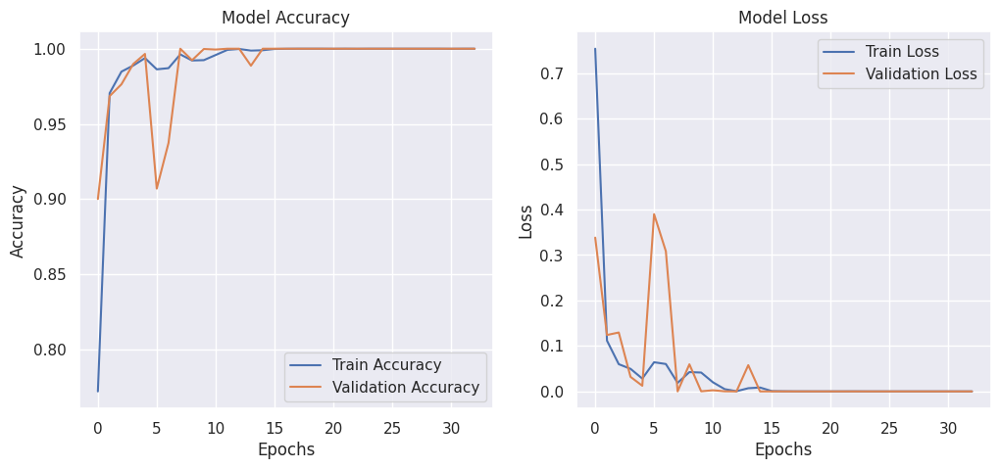

225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step


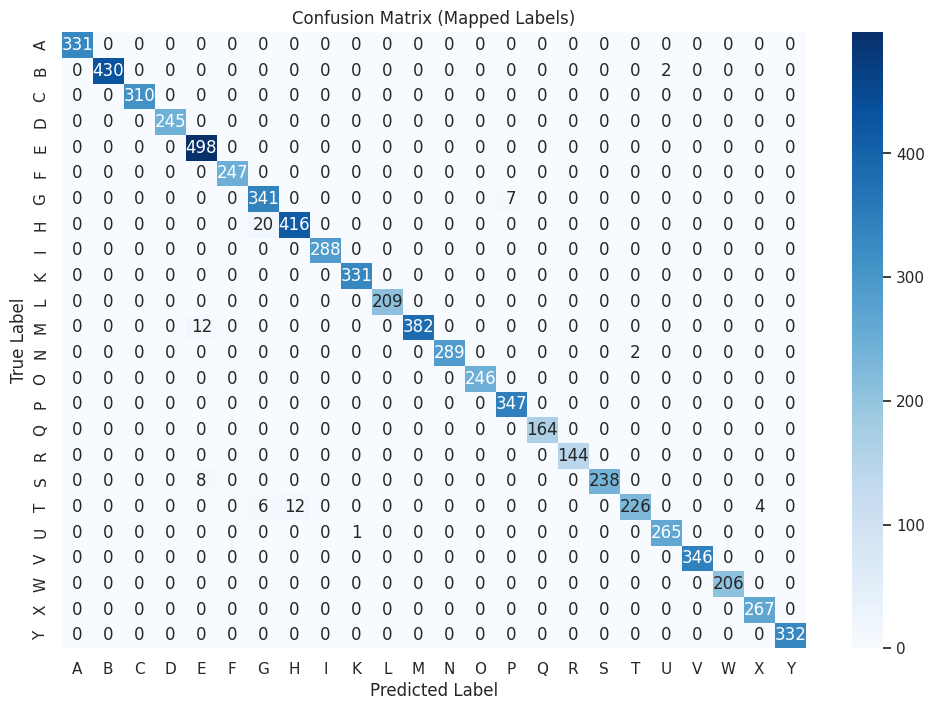

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       331
           1       1.00      1.00      1.00       432
           2       1.00      1.00      1.00       310
           3       1.00      1.00      1.00       245
           4       0.96      1.00      0.98       498
           5       1.00      1.00      1.00       247
           6       0.93      0.98      0.95       348
           7       0.97      0.95      0.96       436
           8       1.00      1.00      1.00       288
           9       1.00      1.00      1.00       331
          10       1.00      1.00      1.00       209
          11       1.00      0.97      0.98       394
          12       1.00      0.99      1.00       291
          13       1.00      1.00      1.00       246
          14       0.98      1.00      0.99       347
          15       1.00      1.00      1.00       164
          16       1.00      1.00      1.00       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define ResNet18 model manually
def build_resnet18_model(input_shape, num_classes):
    model = Sequential()

    # Initial Convolutional Layer
    model.add(Conv2D(64, (3,3), strides=1, padding='same', activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))

    # Residual Blocks (Simplified for ResNet-18)
    for filters in [64, 128, 256, 512]:
        model.add(Conv2D(filters, (3,3), padding='same', activation='relu'))
        model.add(BatchNormalization())
        model.add(Conv2D(filters, (3,3), padding='same', activation='relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D((2,2)))

    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Get input shape and number of classes
input_shape = (32, 32, 1)  # Fixed to grayscale (1-channel)
num_classes = 24  # Excluding 'J' and 'Z'

# Build the model
model = build_resnet18_model(input_shape, num_classes)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_valid, y_valid),
                    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
                               ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)])

# Evaluate the model on test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot training & validation accuracy and loss
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Accuracy plot
ax[0].plot(history.history['accuracy'], label='Train Accuracy')
ax[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

# Loss plot
ax[1].plot(history.history['loss'], label='Train Loss')
ax[1].plot(history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()

plt.show()

# Generate predictions
y_pred = model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Mapping numerical labels to corresponding letters (excluding 'J' and 'Z')
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")  # Excluding 'J' and 'Z'

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


**ResNet 18- Hyperparametric optmisation code**

[I 2025-02-20 15:08:41,047] A new study created in memory with name: no-name-aad275f9-8550-4b5e-bf27-c312a8bd6569
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Running trial with parameters: {}
Epoch 1/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - accuracy: 0.5928 - loss: 2.0032 - val_accuracy: 0.9663 - val_loss: 0.3508 - learning_rate: 0.0100
Epoch 2/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9543 - loss: 0.3616 - val_accuracy: 0.9845 - val_loss: 0.2431 - learning_rate: 0.0100
Epoch 3/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9770 - loss: 0.2520 - val_accuracy: 0.9685 - val_loss: 0.2737 - learning_rate: 0.0100
Epoch 4/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9746 - loss: 0.2497 - val_accuracy: 0.9852 - val_loss: 0.2226 - learning_rate: 0.0100
Epoch 5/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9796 - loss: 0.2392 - val_accuracy: 0.9913 - val_loss: 0.1889 - learning_rate: 0.0100
Epoch 6/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9810 - loss: 0.2183 - val_accuracy: 0.9887 - val_loss: 0.1989 - learning_rate: 0.0100
Epoch 7/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step 

[I 2025-02-20 15:11:59,086] Trial 0 finished with value: 1.0 and parameters: {'num_filters': 32, 'dropout_rate': 0.37496098892013763, 'optimizer': 'sgd', 'learning_rate': 0.00998933867323066, 'batch_size': 32}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 19ms/step - accuracy: 0.4229 - loss: 2.6223 - val_accuracy: 0.3535 - val_loss: 4.4315 - learning_rate: 0.0046
Epoch 2/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8748 - loss: 0.7415 - val_accuracy: 0.7851 - val_loss: 1.2927 - learning_rate: 0.0046
Epoch 3/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9118 - loss: 0.6752 - val_accuracy: 0.9406 - val_loss: 0.5113 - learning_rate: 0.0046
Epoch 4/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9428 - loss: 0.5017 - val_accuracy: 0.9372 - val_loss: 0.4960 - learning_rate: 0.0046
Epoch 5/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9477 - loss: 0.4862 - val_accuracy: 0.8088 - val_loss: 1.1493 - learning_rate: 0.0046
Epoch 6/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9565 - loss: 0.4104 - val_accuracy: 0.9938 - val_loss: 0.2164 - learning_rate: 0.0046
Epoch 7/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step 

[I 2025-02-20 15:13:52,112] Trial 1 finished with value: 1.0 and parameters: {'num_filters': 32, 'dropout_rate': 0.5143430842043897, 'optimizer': 'adam', 'learning_rate': 0.004633673367886144, 'batch_size': 64}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 14s 13ms/step - accuracy: 0.1206 - loss: 5.9090 - val_accuracy: 0.2209 - val_loss: 2.9802 - learning_rate: 0.0058
Epoch 2/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 14s 7ms/step - accuracy: 0.2396 - loss: 2.9575 - val_accuracy: 0.4025 - val_loss: 2.7089 - learning_rate: 0.0058
Epoch 3/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.4739 - loss: 2.0473 - val_accuracy: 0.6831 - val_loss: 1.4118 - learning_rate: 0.0058
Epoch 4/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7674 - loss: 1.0026 - val_accuracy: 0.8625 - val_loss: 0.7135 - learning_rate: 0.0058
Epoch 5/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8845 - loss: 0.6053 - val_accuracy: 0.9661 - val_loss: 0.3031 - learning_rate: 0.0058
Epoch 6/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9286 - loss: 0.4264 - val_accuracy: 0.7707 - val_loss: 1.3432 - learning_rate: 0.0058
Epoch 7/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step

[I 2025-02-20 15:18:09,098] Trial 2 finished with value: 1.0 and parameters: {'num_filters': 128, 'dropout_rate': 0.3708987185270275, 'optimizer': 'adam', 'learning_rate': 0.005800007917183122, 'batch_size': 32}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 15s 7ms/step - accuracy: 0.6070 - loss: 1.9115 - val_accuracy: 0.4455 - val_loss: 3.4694 - learning_rate: 0.0036
Epoch 2/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9169 - loss: 0.6929 - val_accuracy: 0.6899 - val_loss: 1.9345 - learning_rate: 0.0036
Epoch 3/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9455 - loss: 0.5140 - val_accuracy: 0.9357 - val_loss: 0.4735 - learning_rate: 0.0036
Epoch 4/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9618 - loss: 0.4036 - val_accuracy: 0.9077 - val_loss: 0.5902 - learning_rate: 0.0036
Epoch 5/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.9647 - loss: 0.3530 - val_accuracy: 0.9761 - val_loss: 0.3016 - learning_rate: 0.0036
Epoch 6/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9710 - loss: 0.3085 - val_accuracy: 0.9410 - val_loss: 0.4498 - learning_rate: 0.0036
Epoch 7/50
1373/1373 ━━━━━━━━━━━━━━━━━━

[I 2025-02-20 15:24:46,597] Trial 3 finished with value: 0.9998179078102112 and parameters: {'num_filters': 32, 'dropout_rate': 0.3548632013065091, 'optimizer': 'adam', 'learning_rate': 0.0035615281802326535, 'batch_size': 16}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 15s 7ms/step - accuracy: 0.5913 - loss: 2.1120 - val_accuracy: 0.9882 - val_loss: 0.5205 - learning_rate: 4.4188e-04
Epoch 2/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9810 - loss: 0.4726 - val_accuracy: 0.9761 - val_loss: 0.3478 - learning_rate: 4.4188e-04
Epoch 3/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9847 - loss: 0.3101 - val_accuracy: 0.9694 - val_loss: 0.2790 - learning_rate: 4.4188e-04
Epoch 4/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9882 - loss: 0.2175 - val_accuracy: 0.9996 - val_loss: 0.1551 - learning_rate: 4.4188e-04
Epoch 5/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9904 - loss: 0.1740 - val_accuracy: 0.9958 - val_loss: 0.1474 - learning_rate: 4.4188e-04
Epoch 6/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9901 - loss: 0.1556 - val_accuracy: 0.9987 - val_loss: 0.1151 - learning_rate: 4.4188e-04
Epoch 7/50
1373/

[I 2025-02-20 15:31:14,582] Trial 4 finished with value: 1.0 and parameters: {'num_filters': 32, 'dropout_rate': 0.4720276223160991, 'optimizer': 'adam', 'learning_rate': 0.0004418837651865953, 'batch_size': 16}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.6245 - loss: 1.8542 - val_accuracy: 0.6675 - val_loss: 1.6962 - learning_rate: 0.0020
Epoch 2/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9429 - loss: 0.5164 - val_accuracy: 0.9634 - val_loss: 0.4201 - learning_rate: 0.0020
Epoch 3/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9671 - loss: 0.3986 - val_accuracy: 0.9834 - val_loss: 0.3870 - learning_rate: 0.0020
Epoch 4/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9642 - loss: 0.4243 - val_accuracy: 0.9692 - val_loss: 0.3354 - learning_rate: 0.0020
Epoch 5/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9772 - loss: 0.3170 - val_accuracy: 0.9860 - val_loss: 0.2719 - learning_rate: 0.0020
Epoch 6/50
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9777 - loss: 0.3001 - val_accuracy: 0.9896 - val_loss: 0.2305 - learning_rate: 0.0020
Epoch 7/50
1373/1373 ━━━━━━━━━━━━━━━━━

[I 2025-02-20 15:37:51,263] Trial 5 finished with value: 1.0 and parameters: {'num_filters': 32, 'dropout_rate': 0.40950177670614757, 'optimizer': 'adam', 'learning_rate': 0.0020203878541428175, 'batch_size': 16}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - accuracy: 0.0676 - loss: 4.5303 - val_accuracy: 0.0446 - val_loss: 14.5416 - learning_rate: 0.0064
Epoch 2/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0452 - loss: 3.1771 - val_accuracy: 0.0472 - val_loss: 3.1760 - learning_rate: 0.0064
Epoch 3/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0426 - loss: 3.1769 - val_accuracy: 0.0472 - val_loss: 3.1761 - learning_rate: 0.0064
Epoch 4/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0450 - loss: 3.1772 - val_accuracy: 0.0472 - val_loss: 3.1761 - learning_rate: 0.0064
Epoch 5/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.0432 - loss: 3.1759 - val_accuracy: 0.0435 - val_loss: 3.1765 - learning_rate: 0.0064
Epoch 6/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0446 - loss: 3.1770 - val_accuracy: 0.0472 - val_loss: 3.1757 - learning_rate: 0.0032
Epoch 7/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step

[I 2025-02-20 15:40:01,186] Trial 6 finished with value: 0.04716809466481209 and parameters: {'num_filters': 64, 'dropout_rate': 0.5035050872127811, 'optimizer': 'adam', 'learning_rate': 0.006390238824599743, 'batch_size': 32}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - accuracy: 0.1947 - loss: 4.8576 - val_accuracy: 0.0539 - val_loss: 5.6111 - learning_rate: 0.0022
Epoch 2/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 10ms/step - accuracy: 0.5831 - loss: 1.7315 - val_accuracy: 0.8019 - val_loss: 1.2472 - learning_rate: 0.0022
Epoch 3/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.7353 - loss: 1.4278 - val_accuracy: 0.8119 - val_loss: 1.2187 - learning_rate: 0.0022
Epoch 4/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8200 - loss: 1.1883 - val_accuracy: 0.9007 - val_loss: 0.7994 - learning_rate: 0.0022
Epoch 5/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.8624 - loss: 1.0014 - val_accuracy: 0.9066 - val_loss: 0.8772 - learning_rate: 0.0022
Epoch 6/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.9019 - loss: 0.7967 - val_accuracy: 0.8964 - val_loss: 0.8929 - learning_rate: 0.0022
Epoch 7/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 3s 10m

[I 2025-02-20 15:43:59,950] Trial 7 finished with value: 1.0 and parameters: {'num_filters': 128, 'dropout_rate': 0.5663031098433278, 'optimizer': 'adam', 'learning_rate': 0.0021610793287807667, 'batch_size': 64}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 15s 14ms/step - accuracy: 0.5375 - loss: 3.4903 - val_accuracy: 0.9191 - val_loss: 0.9326 - learning_rate: 0.0015
Epoch 2/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9329 - loss: 0.7986 - val_accuracy: 0.5229 - val_loss: 2.7342 - learning_rate: 0.0015
Epoch 3/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9569 - loss: 0.6601 - val_accuracy: 0.9725 - val_loss: 0.6466 - learning_rate: 0.0015
Epoch 4/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9635 - loss: 0.6240 - val_accuracy: 0.6427 - val_loss: 1.9452 - learning_rate: 0.0015
Epoch 5/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9637 - loss: 0.6190 - val_accuracy: 0.8370 - val_loss: 0.9897 - learning_rate: 0.0015
Epoch 6/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9728 - loss: 0.4729 - val_accuracy: 0.9068 - val_loss: 0.7164 - learning_rate: 0.0015
Epoch 7/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step 

[I 2025-02-20 15:48:11,963] Trial 8 finished with value: 1.0 and parameters: {'num_filters': 128, 'dropout_rate': 0.3256170515304796, 'optimizer': 'adam', 'learning_rate': 0.001516341573446079, 'batch_size': 32}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - accuracy: 0.2284 - loss: 4.4737 - val_accuracy: 0.2650 - val_loss: 4.2111 - learning_rate: 3.0654e-04
Epoch 2/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6806 - loss: 2.4544 - val_accuracy: 0.9073 - val_loss: 1.9287 - learning_rate: 3.0654e-04
Epoch 3/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.8538 - loss: 1.8624 - val_accuracy: 0.9871 - val_loss: 1.4753 - learning_rate: 3.0654e-04
Epoch 4/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9247 - loss: 1.5927 - val_accuracy: 0.9938 - val_loss: 1.3680 - learning_rate: 3.0654e-04
Epoch 5/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9540 - loss: 1.4418 - val_accuracy: 0.9980 - val_loss: 1.2702 - learning_rate: 3.0654e-04
Epoch 6/50
344/344 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9694 - loss: 1.3406 - val_accuracy: 0.9996 - val_loss: 1.1931 - learning_rate: 3.0654e-04
Epoch 7/50
344/344 ━━━━━━━━━

[I 2025-02-20 15:50:15,046] Trial 9 finished with value: 1.0 and parameters: {'num_filters': 64, 'dropout_rate': 0.5576216381408021, 'optimizer': 'sgd', 'learning_rate': 0.00030654298207130116, 'batch_size': 64}. Best is trial 0 with value: 1.0.


Best Hyperparameters: {'num_filters': 32, 'dropout_rate': 0.37496098892013763, 'optimizer': 'sgd', 'learning_rate': 0.00998933867323066, 'batch_size': 32}
Epoch 1/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.5714 - loss: 2.0740 - val_accuracy: 0.9497 - val_loss: 0.3928 - learning_rate: 0.0100
Epoch 2/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9526 - loss: 0.3669 - val_accuracy: 0.9969 - val_loss: 0.1870 - learning_rate: 0.0100
Epoch 3/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9719 - loss: 0.2692 - val_accuracy: 0.9800 - val_loss: 0.2137 - learning_rate: 0.0100
Epoch 4/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9786 - loss: 0.2242 - val_accuracy: 0.9716 - val_loss: 0.2378 - learning_rate: 0.0100
Epoch 5/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.9816 - loss: 0.2086 - val_accuracy: 0.8873 - val_loss: 0.5859 - learning_rate: 0.0100
Epoch 6/50
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9953 - loss: 0.1497

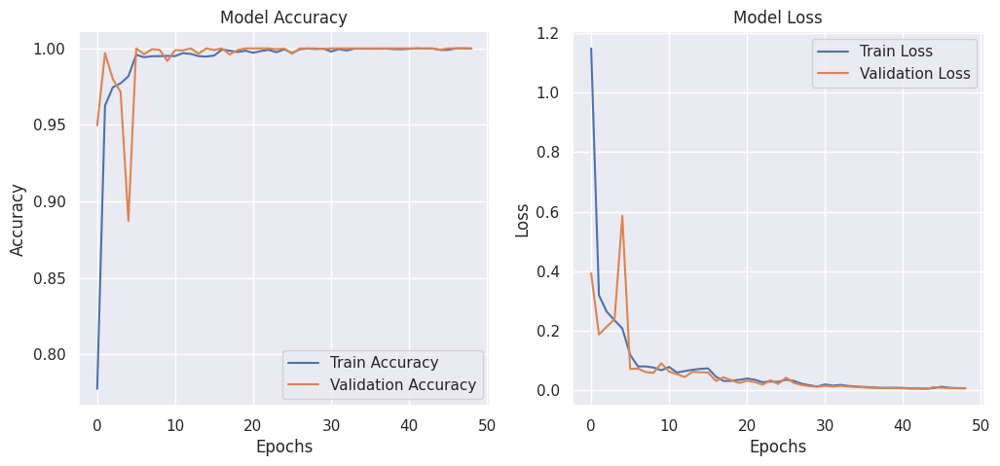

225/225 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


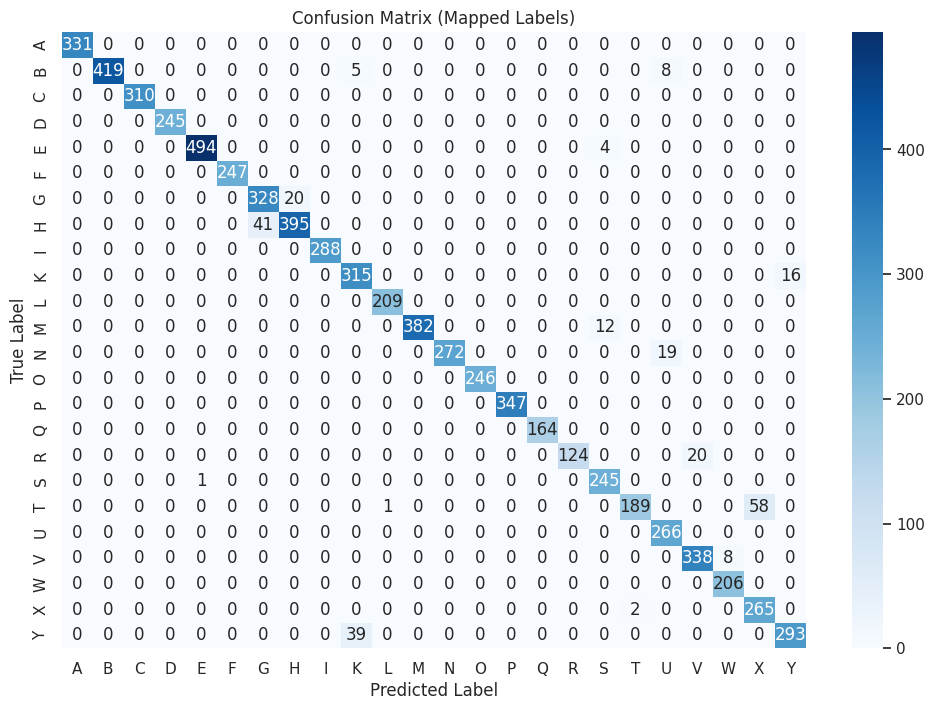

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       331
           1       1.00      0.97      0.98       432
           2       1.00      1.00      1.00       310
           3       1.00      1.00      1.00       245
           4       1.00      0.99      0.99       498
           5       1.00      1.00      1.00       247
           6       0.89      0.94      0.91       348
           7       0.95      0.91      0.93       436
           8       1.00      1.00      1.00       288
           9       0.88      0.95      0.91       331
          10       1.00      1.00      1.00       209
          11       1.00      0.97      0.98       394
          12       1.00      0.93      0.97       291
          13       1.00      1.00      1.00       246
          14       1.00      1.00      1.00       347
          15       1.00      1.00      1.00       164
          16       1.00      0.86      0.93       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import optuna
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Ensure data is correctly split
assert X_train.shape[0] != X_valid.shape[0], "Training and Validation data should not overlap!"

# Define function to build a tunable CNN model
def build_model(trial, input_shape, num_classes):
    model = Sequential()

    # Tune number of filters
    num_filters = trial.suggest_categorical("num_filters", [32, 64, 128])
    model.add(Conv2D(num_filters, (3,3), strides=1, padding='same', activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))

    # Additional Layers
    for filters in [num_filters, num_filters * 2]:
        model.add(Conv2D(filters, (3,3), padding='same', activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
        model.add(BatchNormalization())
        model.add(MaxPooling2D((2,2)))

    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    dropout_rate = trial.suggest_float("dropout_rate", 0.3, 0.6)
    model.add(Dropout(dropout_rate))
    model.add(Dense(num_classes, activation='softmax'))

    # Optimizer Selection
    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "sgd"])
    learning_rate = trial.suggest_float("learning_rate", 1e-4, 1e-2, log=True)

    optimizer = keras.optimizers.Adam(learning_rate) if optimizer_name == "adam" else keras.optimizers.SGD(learning_rate, momentum=0.9)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Objective function for Optuna
def objective(trial):
    print(f"Running trial with parameters: {trial.params}")
    model = build_model(trial, input_shape, num_classes)

    batch_size = trial.suggest_categorical("batch_size", [16, 32, 64])

    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)

    history = model.fit(X_train, y_train, epochs=50, batch_size=batch_size, validation_data=(X_valid, y_valid),
                        callbacks=[early_stopping, lr_reduction], verbose=1)

    # Use the **final** validation accuracy, not max
    val_accuracy = history.history['val_accuracy'][-1]
    return val_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

# Get best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train final model with best hyperparameters
final_model = build_model(optuna.trial.FixedTrial(best_params), input_shape, num_classes)
final_history = final_model.fit(X_train, y_train, epochs=50, batch_size=best_params["batch_size"],
                                validation_data=(X_valid, y_valid),
                                callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
                                           ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)])

# Evaluate final model
test_loss, test_acc = final_model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot learning curves
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(final_history.history['accuracy'], label='Train Accuracy')
ax[0].plot(final_history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(final_history.history['loss'], label='Train Loss')
ax[1].plot(final_history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()

# Generate predictions
y_pred = final_model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


In [ ]:
!pip install tensorflow --upgrade

[I 2025-02-23 03:54:19,374] A new study created in memory with name: no-name-86059fe4-79eb-4119-a51f-fac9eb8a66bc
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - accuracy: 0.0496 - loss: 6.1078 - val_accuracy: 0.0472 - val_loss: 3.1779 - learning_rate: 0.0028
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0480 - loss: 3.1766 - val_accuracy: 0.0466 - val_loss: 3.1759 - learning_rate: 0.0028
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.0428 - loss: 3.1773 - val_accuracy: 0.0472 - val_loss: 3.1758 - learning_rate: 0.0028
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0449 - loss: 3.1768 - val_accuracy: 0.0466 - val_loss: 3.1758 - learning_rate: 0.0028
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.0442 - loss: 3.1762 - val_accuracy: 0.0466 - val_loss: 3.1755 - learning_rate: 0.0014
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0454 - loss: 3.1759 - val_accuracy: 0.0466 - val_loss: 3.1755 - learning_rate: 0.0014
Epoch 7/40
1373/1373 ━━━━━━━━━━━━━━━━━━

[I 2025-02-23 03:56:36,538] Trial 0 finished with value: 0.04716809466481209 and parameters: {'num_filters': 64, 'dropout_rate': 0.6933603997865417, 'optimizer': 'adam', 'learning_rate': 0.0028485154476691633, 'batch_size': 16}. Best is trial 0 with value: 0.04716809466481209.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 15s 13ms/step - accuracy: 0.0440 - loss: 13.6743 - val_accuracy: 0.0805 - val_loss: 10.7756 - learning_rate: 1.7499e-05
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0483 - loss: 10.9892 - val_accuracy: 0.0794 - val_loss: 10.5496 - learning_rate: 1.7499e-05
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.0519 - loss: 10.5369 - val_accuracy: 0.0759 - val_loss: 10.1976 - learning_rate: 1.7499e-05
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0478 - loss: 10.1364 - val_accuracy: 0.0863 - val_loss: 9.7719 - learning_rate: 1.7499e-05
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.0575 - loss: 9.6854 - val_accuracy: 0.1277 - val_loss: 9.2727 - learning_rate: 1.7499e-05
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.0636 - loss: 9.1892 - val_accuracy: 0.1830 - val_loss: 8.6965 - learning_rate: 1.7499e-05
Epoch 7/40
687/687 ━━

[I 2025-02-23 03:59:33,302] Trial 1 finished with value: 0.9998179078102112 and parameters: {'num_filters': 64, 'dropout_rate': 0.618551509403881, 'optimizer': 'adam', 'learning_rate': 1.7498518520900923e-05, 'batch_size': 32}. Best is trial 1 with value: 0.9998179078102112.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.0468 - loss: 12.8434 - val_accuracy: 0.0841 - val_loss: 10.7781 - learning_rate: 2.9704e-05
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0527 - loss: 10.8084 - val_accuracy: 0.0769 - val_loss: 10.5314 - learning_rate: 2.9704e-05
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.0563 - loss: 10.5014 - val_accuracy: 0.1000 - val_loss: 10.2658 - learning_rate: 2.9704e-05
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0612 - loss: 10.2490 - val_accuracy: 0.1116 - val_loss: 10.0103 - learning_rate: 2.9704e-05
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.0716 - loss: 9.9891 - val_accuracy: 0.1187 - val_loss: 9.7530 - learning_rate: 2.9704e-05
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.0750 - loss: 9.7450 - val_accuracy: 0.1413 - val_loss: 9.4803 - learning_rate: 2.9704e-05
Epoch 7

[I 2025-02-23 04:04:53,105] Trial 2 finished with value: 0.7654343247413635 and parameters: {'num_filters': 64, 'dropout_rate': 0.6041607345564355, 'optimizer': 'sgd', 'learning_rate': 2.970433761662139e-05, 'batch_size': 16}. Best is trial 1 with value: 0.9998179078102112.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.0516 - loss: 10.5137 - val_accuracy: 0.0825 - val_loss: 8.3599 - learning_rate: 5.6866e-05
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0647 - loss: 8.0951 - val_accuracy: 0.1734 - val_loss: 6.9859 - learning_rate: 5.6866e-05
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.1034 - loss: 6.7063 - val_accuracy: 0.3562 - val_loss: 5.3407 - learning_rate: 5.6866e-05
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.1997 - loss: 5.3190 - val_accuracy: 0.5870 - val_loss: 3.8173 - learning_rate: 5.6866e-05
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.3424 - loss: 4.1745 - val_accuracy: 0.7758 - val_loss: 2.8560 - learning_rate: 5.6866e-05
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.4878 - loss: 3.3280 - val_accuracy: 0.8587 - val_loss: 2.2142 - learning_rate: 5.6866e-05
Epoch 7/40
137

[I 2025-02-23 04:10:40,264] Trial 3 finished with value: 1.0 and parameters: {'num_filters': 32, 'dropout_rate': 0.5279439207423241, 'optimizer': 'adam', 'learning_rate': 5.686589207780616e-05, 'batch_size': 16}. Best is trial 3 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 13s 12ms/step - accuracy: 0.0527 - loss: 10.5405 - val_accuracy: 0.0914 - val_loss: 8.7864 - learning_rate: 1.3827e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0586 - loss: 8.7635 - val_accuracy: 0.1036 - val_loss: 8.3565 - learning_rate: 1.3827e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0677 - loss: 8.2913 - val_accuracy: 0.1437 - val_loss: 7.8852 - learning_rate: 1.3827e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0941 - loss: 7.8392 - val_accuracy: 0.1972 - val_loss: 7.3235 - learning_rate: 1.3827e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1154 - loss: 7.3754 - val_accuracy: 0.2289 - val_loss: 6.8372 - learning_rate: 1.3827e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.1471 - loss: 6.9330 - val_accuracy: 0.2766 - val_loss: 6.3889 - learning_rate: 1.3827e-04
Epoch 7/40
687/687 ━━━━━━━━

[I 2025-02-23 04:13:36,660] Trial 4 finished with value: 0.9852485656738281 and parameters: {'num_filters': 32, 'dropout_rate': 0.5480963174154142, 'optimizer': 'sgd', 'learning_rate': 0.00013827015545096752, 'batch_size': 32}. Best is trial 3 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 15s 8ms/step - accuracy: 0.0733 - loss: 8.8606 - val_accuracy: 0.3936 - val_loss: 3.3642 - learning_rate: 0.0019
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - accuracy: 0.4012 - loss: 3.0217 - val_accuracy: 0.4167 - val_loss: 2.9974 - learning_rate: 0.0019
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.6275 - loss: 2.1916 - val_accuracy: 0.8884 - val_loss: 1.5758 - learning_rate: 0.0019
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.7466 - loss: 1.9765 - val_accuracy: 0.4110 - val_loss: 3.0488 - learning_rate: 0.0019
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.7801 - loss: 1.9707 - val_accuracy: 0.9182 - val_loss: 1.6395 - learning_rate: 0.0019
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8742 - loss: 1.5350 - val_accuracy: 0.9798 - val_loss: 0.9291 - learning_rate: 9.3864e-04
Epoch 7/40
1373/1373 ━━━━━━━━━━━━━━

[I 2025-02-23 04:19:03,721] Trial 5 finished with value: 1.0 and parameters: {'num_filters': 64, 'dropout_rate': 0.6203219308058887, 'optimizer': 'sgd', 'learning_rate': 0.0018772766667395292, 'batch_size': 16}. Best is trial 3 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 18s 8ms/step - accuracy: 0.0816 - loss: 8.1731 - val_accuracy: 0.6057 - val_loss: 2.5221 - learning_rate: 6.5835e-04
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.4610 - loss: 2.7191 - val_accuracy: 0.8343 - val_loss: 1.7506 - learning_rate: 6.5835e-04
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.6868 - loss: 2.0894 - val_accuracy: 0.9446 - val_loss: 1.4733 - learning_rate: 6.5835e-04
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.7730 - loss: 1.8502 - val_accuracy: 0.9794 - val_loss: 1.3098 - learning_rate: 6.5835e-04
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.8047 - loss: 1.7592 - val_accuracy: 0.9685 - val_loss: 1.3980 - learning_rate: 6.5835e-04
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8259 - loss: 1.7335 - val_accuracy: 0.9612 - val_loss: 1.4268 - learning_rate: 6.5835e-04
Epoch 7/40
1373

[I 2025-02-23 04:24:51,447] Trial 6 finished with value: 1.0 and parameters: {'num_filters': 64, 'dropout_rate': 0.6715784660486978, 'optimizer': 'adam', 'learning_rate': 0.0006583450575457023, 'batch_size': 16}. Best is trial 3 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 16s 13ms/step - accuracy: 0.1567 - loss: 8.0070 - val_accuracy: 0.5881 - val_loss: 2.7093 - learning_rate: 9.0518e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6825 - loss: 2.1491 - val_accuracy: 0.9556 - val_loss: 1.4278 - learning_rate: 9.0518e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8339 - loss: 1.7156 - val_accuracy: 0.7254 - val_loss: 2.1062 - learning_rate: 9.0518e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.8674 - loss: 1.5751 - val_accuracy: 0.9630 - val_loss: 1.2897 - learning_rate: 9.0518e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8814 - loss: 1.5324 - val_accuracy: 0.9933 - val_loss: 1.1658 - learning_rate: 9.0518e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8953 - loss: 1.4475 - val_accuracy: 0.9911 - val_loss: 1.2381 - learning_rate: 9.0518e-04
Epoch 7/40
687/687 ━━━━━━━━━

[I 2025-02-23 04:27:52,256] Trial 7 finished with value: 1.0 and parameters: {'num_filters': 64, 'dropout_rate': 0.5504065922468481, 'optimizer': 'adam', 'learning_rate': 0.0009051835970415513, 'batch_size': 32}. Best is trial 3 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 12s 9ms/step - accuracy: 0.0952 - loss: 8.2582 - val_accuracy: 0.4791 - val_loss: 3.9514 - learning_rate: 0.0021
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.4444 - loss: 3.3633 - val_accuracy: 0.8763 - val_loss: 1.5238 - learning_rate: 0.0021
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7251 - loss: 1.6475 - val_accuracy: 0.9013 - val_loss: 1.0438 - learning_rate: 0.0021
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8293 - loss: 1.1285 - val_accuracy: 0.8184 - val_loss: 1.2727 - learning_rate: 0.0021
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8584 - loss: 0.9629 - val_accuracy: 0.9845 - val_loss: 0.6368 - learning_rate: 0.0021
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8845 - loss: 0.8831 - val_accuracy: 0.8776 - val_loss: 1.1550 - learning_rate: 0.0021
Epoch 7/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step -

[I 2025-02-23 04:29:09,417] Trial 8 finished with value: 0.9868876338005066 and parameters: {'num_filters': 32, 'dropout_rate': 0.5105967900001828, 'optimizer': 'sgd', 'learning_rate': 0.0020715867582482652, 'batch_size': 32}. Best is trial 3 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 14s 7ms/step - accuracy: 0.0435 - loss: 12.8842 - val_accuracy: 0.0765 - val_loss: 9.1973 - learning_rate: 1.0105e-05
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0495 - loss: 9.9592 - val_accuracy: 0.0765 - val_loss: 9.1400 - learning_rate: 1.0105e-05
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.0525 - loss: 9.4525 - val_accuracy: 0.0632 - val_loss: 9.0793 - learning_rate: 1.0105e-05
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0488 - loss: 9.2353 - val_accuracy: 0.0632 - val_loss: 9.0142 - learning_rate: 1.0105e-05
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0516 - loss: 9.0978 - val_accuracy: 0.0630 - val_loss: 8.9479 - learning_rate: 1.0105e-05
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0487 - loss: 9.0151 - val_accuracy: 0.0610 - val_loss: 8.8836 - learning_rate: 1.0105e-05
Epoch 7/40
1373

[I 2025-02-23 04:34:19,658] Trial 9 finished with value: 0.2649790644645691 and parameters: {'num_filters': 32, 'dropout_rate': 0.5736267966949963, 'optimizer': 'sgd', 'learning_rate': 1.010461700077914e-05, 'batch_size': 16}. Best is trial 3 with value: 1.0.


Best Hyperparameters: {'num_filters': 32, 'dropout_rate': 0.5279439207423241, 'optimizer': 'adam', 'learning_rate': 5.686589207780616e-05, 'batch_size': 16}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - accuracy: 0.0482 - loss: 10.7404 - val_accuracy: 0.0758 - val_loss: 8.3763 - learning_rate: 5.6866e-05
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - accuracy: 0.0624 - loss: 8.1070 - val_accuracy: 0.2260 - val_loss: 6.9921 - learning_rate: 5.6866e-05
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.1182 - loss: 6.7147 - val_accuracy: 0.4700 - val_loss: 5.0916 - learning_rate: 5.6866e-05
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.2452 - loss: 5.2162 - val_accuracy: 0.7010 - val_loss: 3.6697 - learning_rate: 5.6866e-05
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.4049 - loss: 4.0623 - val_accuracy: 0.8230 - val_loss: 2.7647 - learning_rate: 5.6866e-05
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms

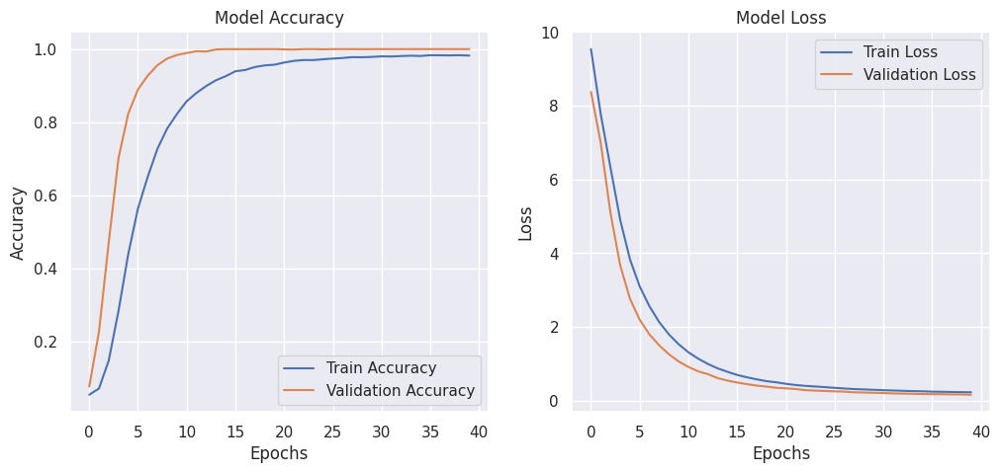

225/225 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


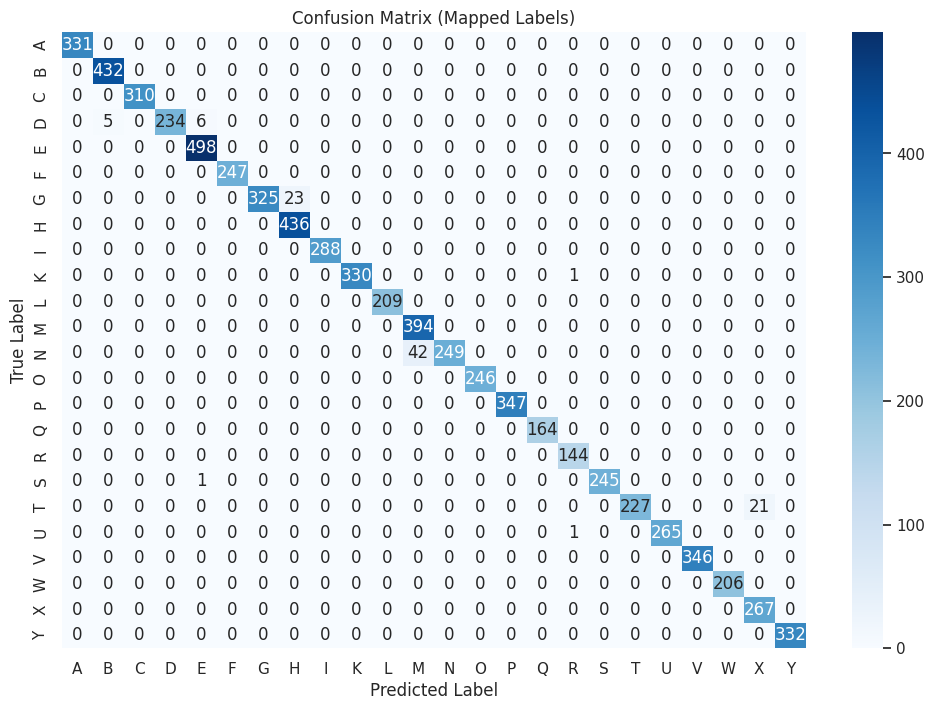

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       331
           1       0.99      1.00      0.99       432
           2       1.00      1.00      1.00       310
           3       1.00      0.96      0.98       245
           4       0.99      1.00      0.99       498
           5       1.00      1.00      1.00       247
           6       1.00      0.93      0.97       348
           7       0.95      1.00      0.97       436
           8       1.00      1.00      1.00       288
           9       1.00      1.00      1.00       331
          10       1.00      1.00      1.00       209
          11       0.90      1.00      0.95       394
          12       1.00      0.86      0.92       291
          13       1.00      1.00      1.00       246
          14       1.00      1.00      1.00       347
          15       1.00      1.00      1.00       164
          16       0.99      1.00      0.99       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import optuna
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define input shape and number of classes
input_shape = (32, 32, 1)  # Example input shape, change according to your dataset
num_classes = 24  # Example number of classes, change according to your dataset

# Ensure data is correctly split
assert X_train.shape[0] != X_valid.shape[0], "Training and Validation data should not overlap!"

# Define function to build a tunable CNN model
def build_model(trial, input_shape, num_classes):
    model = Sequential()

    # Tune number of filters
    num_filters = trial.suggest_categorical("num_filters", [32, 64])
    model.add(Conv2D(num_filters, (3,3), strides=1, padding='same', activation='relu', input_shape=input_shape,
                     kernel_regularizer=tf.keras.regularizers.l2(0.05)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))

    # Additional Layers
    for filters in [num_filters, num_filters * 2]:
        model.add(Conv2D(filters, (3,3), padding='same', activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.02)))
        model.add(BatchNormalization())
        model.add(MaxPooling2D((2,2)))
        model.add(Dropout(0.5))

    model.add(Flatten())
    model.add(Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.02)))
    dropout_rate = trial.suggest_float("dropout_rate", 0.5, 0.7)
    model.add(Dropout(dropout_rate))
    model.add(Dense(num_classes, activation='softmax'))

    # Optimizer Selection
    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "sgd"])
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 5e-3, log=True)

    optimizer = keras.optimizers.Adam(learning_rate) if optimizer_name == "adam" else keras.optimizers.SGD(learning_rate, momentum=0.9)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Objective function for Optuna
def objective(trial):
    print(f"Running trial with parameters: {trial.params}")
    model = build_model(trial, input_shape, num_classes)

    batch_size = trial.suggest_categorical("batch_size", [16, 32])

    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)

    history = model.fit(X_train, y_train, epochs=40, batch_size=batch_size, validation_data=(X_valid, y_valid),
                        callbacks=[early_stopping, lr_reduction], verbose=1)

    # Use the **final** validation accuracy, not max
    val_accuracy = history.history['val_accuracy'][-1]
    return val_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

# Get best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train final model with best hyperparameters
final_model = build_model(optuna.trial.FixedTrial(best_params), input_shape, num_classes)
final_history = final_model.fit(X_train, y_train, epochs=40, batch_size=best_params["batch_size"],
                                validation_data=(X_valid, y_valid),
                                callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
                                           ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)])

# Evaluate final model
test_loss, test_acc = final_model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot learning curves
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(final_history.history['accuracy'], label='Train Accuracy')
ax[0].plot(final_history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(final_history.history['loss'], label='Train Loss')
ax[1].plot(final_history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()

# Generate predictions
y_pred = final_model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


[I 2025-02-23 04:53:33,912] A new study created in memory with name: no-name-55737b7d-8e85-45fe-b0af-eb3e4e3c83bf
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 15s 12ms/step - accuracy: 0.0473 - loss: 19.9755 - val_accuracy: 0.0987 - val_loss: 10.6647 - learning_rate: 5.1230e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0590 - loss: 9.3613 - val_accuracy: 0.0901 - val_loss: 6.8108 - learning_rate: 5.1230e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.0936 - loss: 6.3506 - val_accuracy: 0.3076 - val_loss: 4.9066 - learning_rate: 5.1230e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.1890 - loss: 4.9390 - val_accuracy: 0.5516 - val_loss: 3.6400 - learning_rate: 5.1230e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.3580 - loss: 3.8171 - val_accuracy: 0.5434 - val_loss: 3.0955 - learning_rate: 5.1230e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.5144 - loss: 2.9972 - val_accuracy: 0.6693 - val_loss: 2.4488 - learning_rate: 5.1230e-04
Epoch 7/40
687/687 ━━━━━━━

[I 2025-02-23 04:56:38,209] Trial 0 finished with value: 1.0 and parameters: {'num_filters': 64, 'dropout_rate': 0.6737650645833665, 'optimizer': 'sgd', 'learning_rate': 0.0005122974874027877, 'batch_size': 32}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 15s 7ms/step - accuracy: 0.0688 - loss: 9.3984 - val_accuracy: 0.1253 - val_loss: 4.0645 - learning_rate: 0.0018
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - accuracy: 0.2458 - loss: 3.4175 - val_accuracy: 0.2666 - val_loss: 3.4448 - learning_rate: 0.0018
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.4209 - loss: 2.7863 - val_accuracy: 0.7705 - val_loss: 1.9088 - learning_rate: 0.0018
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.4995 - loss: 2.6300 - val_accuracy: 0.8261 - val_loss: 1.8526 - learning_rate: 0.0018
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.5563 - loss: 2.5009 - val_accuracy: 0.7385 - val_loss: 2.0474 - learning_rate: 0.0018
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.5786 - loss: 2.4573 - val_accuracy: 0.4781 - val_loss: 2.8105 - learning_rate: 0.0018
Epoch 7/40
1373/1373 ━━━━━━━━━━━━━━━━━━

[I 2025-02-23 05:01:36,796] Trial 1 finished with value: 0.9930796027183533 and parameters: {'num_filters': 32, 'dropout_rate': 0.6779911688129163, 'optimizer': 'sgd', 'learning_rate': 0.001828328679001064, 'batch_size': 16}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.0446 - loss: 6.4693 - val_accuracy: 0.0466 - val_loss: 3.1762 - learning_rate: 0.0045
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - accuracy: 0.0475 - loss: 3.1763 - val_accuracy: 0.0432 - val_loss: 3.1768 - learning_rate: 0.0045
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0431 - loss: 3.1774 - val_accuracy: 0.0472 - val_loss: 3.1763 - learning_rate: 0.0045
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.0447 - loss: 3.1767 - val_accuracy: 0.0472 - val_loss: 3.1757 - learning_rate: 0.0023
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0462 - loss: 3.1756 - val_accuracy: 0.0472 - val_loss: 3.1756 - learning_rate: 0.0023
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0445 - loss: 3.1755 - val_accuracy: 0.0472 - val_loss: 3.1755 - learning_rate: 0.0023
Epoch 7/40
1373/1373 ━━━━━━━━━━━━━━━━━━

[I 2025-02-23 05:04:39,151] Trial 2 finished with value: 0.04716809466481209 and parameters: {'num_filters': 32, 'dropout_rate': 0.692363659893841, 'optimizer': 'adam', 'learning_rate': 0.004541908757603572, 'batch_size': 16}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 13s 11ms/step - accuracy: 0.0436 - loss: 17.1776 - val_accuracy: 0.0916 - val_loss: 12.9817 - learning_rate: 1.1732e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0477 - loss: 12.6183 - val_accuracy: 0.0450 - val_loss: 11.1869 - learning_rate: 1.1732e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0479 - loss: 10.8600 - val_accuracy: 0.0659 - val_loss: 9.8109 - learning_rate: 1.1732e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0543 - loss: 9.5525 - val_accuracy: 0.0750 - val_loss: 8.7474 - learning_rate: 1.1732e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0603 - loss: 8.5564 - val_accuracy: 0.0980 - val_loss: 7.8980 - learning_rate: 1.1732e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0640 - loss: 7.7845 - val_accuracy: 0.0943 - val_loss: 7.2150 - learning_rate: 1.1732e-04
Epoch 7/40
687/687 ━━━━

[I 2025-02-23 05:07:30,306] Trial 3 finished with value: 0.9377162456512451 and parameters: {'num_filters': 32, 'dropout_rate': 0.6017539521685143, 'optimizer': 'sgd', 'learning_rate': 0.0001173209442310027, 'batch_size': 32}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 15s 8ms/step - accuracy: 0.0459 - loss: 21.6886 - val_accuracy: 0.0555 - val_loss: 14.4495 - learning_rate: 1.3800e-04
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.0470 - loss: 13.1679 - val_accuracy: 0.0495 - val_loss: 10.0459 - learning_rate: 1.3800e-04
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.0523 - loss: 9.4034 - val_accuracy: 0.0912 - val_loss: 7.7307 - learning_rate: 1.3800e-04
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.0759 - loss: 7.3856 - val_accuracy: 0.1672 - val_loss: 6.2797 - learning_rate: 1.3800e-04
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.1137 - loss: 6.1704 - val_accuracy: 0.1892 - val_loss: 5.3098 - learning_rate: 1.3800e-04
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.2024 - loss: 5.2133 - val_accuracy: 0.5875 - val_loss: 4.0567 - learning_rate: 1.3800e-04
Epoch 7/4

[I 2025-02-23 05:13:11,241] Trial 4 finished with value: 0.9994536638259888 and parameters: {'num_filters': 64, 'dropout_rate': 0.6567966883371485, 'optimizer': 'sgd', 'learning_rate': 0.00013800478902161972, 'batch_size': 16}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - accuracy: 0.0448 - loss: 21.6330 - val_accuracy: 0.0632 - val_loss: 13.9746 - learning_rate: 1.4920e-04
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - accuracy: 0.0477 - loss: 12.6757 - val_accuracy: 0.0621 - val_loss: 9.5957 - learning_rate: 1.4920e-04
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0487 - loss: 8.9652 - val_accuracy: 0.1100 - val_loss: 7.3872 - learning_rate: 1.4920e-04
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0604 - loss: 7.0848 - val_accuracy: 0.1588 - val_loss: 6.0796 - learning_rate: 1.4920e-04
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.0838 - loss: 5.9762 - val_accuracy: 0.1756 - val_loss: 5.1658 - learning_rate: 1.4920e-04
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.1203 - loss: 5.2380 - val_accuracy: 0.2633 - val_loss: 4.4850 - learning_rate: 1.4920e-04
Epoch 7/40


[I 2025-02-23 05:18:41,120] Trial 5 finished with value: 1.0 and parameters: {'num_filters': 64, 'dropout_rate': 0.7470829610502528, 'optimizer': 'sgd', 'learning_rate': 0.00014919529230610383, 'batch_size': 16}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 13s 11ms/step - accuracy: 0.0414 - loss: 26.4215 - val_accuracy: 0.0659 - val_loss: 22.0393 - learning_rate: 2.4281e-05
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0465 - loss: 22.1878 - val_accuracy: 0.0565 - val_loss: 21.0795 - learning_rate: 2.4281e-05
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0462 - loss: 21.0091 - val_accuracy: 0.0499 - val_loss: 20.1651 - learning_rate: 2.4281e-05
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.0514 - loss: 20.0410 - val_accuracy: 0.0433 - val_loss: 19.3041 - learning_rate: 2.4281e-05
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0495 - loss: 19.1581 - val_accuracy: 0.0474 - val_loss: 18.4961 - learning_rate: 2.4281e-05
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0458 - loss: 18.3512 - val_accuracy: 0.0517 - val_loss: 17.7371 - learning_rate: 2.4281e-05
Epoch 7/40
687/6

[I 2025-02-23 05:21:34,032] Trial 6 finished with value: 0.40611910820007324 and parameters: {'num_filters': 64, 'dropout_rate': 0.6198098306759453, 'optimizer': 'sgd', 'learning_rate': 2.4280519034610275e-05, 'batch_size': 32}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - accuracy: 0.0558 - loss: 11.1032 - val_accuracy: 0.1532 - val_loss: 3.7878 - learning_rate: 0.0026
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - accuracy: 0.1807 - loss: 3.8892 - val_accuracy: 0.3728 - val_loss: 3.6252 - learning_rate: 0.0026
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.3215 - loss: 3.8981 - val_accuracy: 0.4221 - val_loss: 3.9375 - learning_rate: 0.0026
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.4132 - loss: 3.8441 - val_accuracy: 0.7152 - val_loss: 2.8994 - learning_rate: 0.0026
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.4724 - loss: 3.6172 - val_accuracy: 0.7157 - val_loss: 2.9449 - learning_rate: 0.0026
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.5376 - loss: 3.3122 - val_accuracy: 0.5057 - val_loss: 3.4416 - learning_rate: 0.0026
Epoch 7/40
1373/1373 ━━━━━━━━━━━━━━━━━

[I 2025-02-23 05:27:00,199] Trial 7 finished with value: 0.9996357560157776 and parameters: {'num_filters': 64, 'dropout_rate': 0.6834802347763469, 'optimizer': 'sgd', 'learning_rate': 0.0026497799231333516, 'batch_size': 16}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.0461 - loss: 18.1816 - val_accuracy: 0.0647 - val_loss: 13.4143 - learning_rate: 4.5418e-05
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - accuracy: 0.0482 - loss: 12.9978 - val_accuracy: 0.0586 - val_loss: 11.1589 - learning_rate: 4.5418e-05
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.0470 - loss: 10.5803 - val_accuracy: 0.0630 - val_loss: 8.7420 - learning_rate: 4.5418e-05
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.0530 - loss: 8.1950 - val_accuracy: 0.1286 - val_loss: 6.6207 - learning_rate: 4.5418e-05
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0707 - loss: 6.2842 - val_accuracy: 0.1752 - val_loss: 5.1398 - learning_rate: 4.5418e-05
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.1066 - loss: 5.0667 - val_accuracy: 0.2978 - val_loss: 4.0997 - learning_rate: 4.5418e-05
Epoch 7/40


[I 2025-02-23 05:32:23,474] Trial 8 finished with value: 1.0 and parameters: {'num_filters': 32, 'dropout_rate': 0.6570096575541188, 'optimizer': 'adam', 'learning_rate': 4.541785605603578e-05, 'batch_size': 16}. Best is trial 0 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.0491 - loss: 18.9944 - val_accuracy: 0.0663 - val_loss: 14.1791 - learning_rate: 3.4195e-05
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - accuracy: 0.0459 - loss: 14.0317 - val_accuracy: 0.0555 - val_loss: 12.6578 - learning_rate: 3.4195e-05
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.0482 - loss: 12.2550 - val_accuracy: 0.0503 - val_loss: 10.7490 - learning_rate: 3.4195e-05
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0473 - loss: 10.2507 - val_accuracy: 0.0488 - val_loss: 8.6955 - learning_rate: 3.4195e-05
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0522 - loss: 8.2300 - val_accuracy: 0.0661 - val_loss: 6.9000 - learning_rate: 3.4195e-05
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.0503 - loss: 6.5538 - val_accuracy: 0.1078 - val_loss: 5.5996 - learning_rate: 3.4195e-05
Epoch 7

[I 2025-02-23 05:37:53,628] Trial 9 finished with value: 0.9998179078102112 and parameters: {'num_filters': 32, 'dropout_rate': 0.7329928404526678, 'optimizer': 'adam', 'learning_rate': 3.4195348940979695e-05, 'batch_size': 16}. Best is trial 0 with value: 1.0.


Best Hyperparameters: {'num_filters': 64, 'dropout_rate': 0.6737650645833665, 'optimizer': 'sgd', 'learning_rate': 0.0005122974874027877, 'batch_size': 32}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 14s 12ms/step - accuracy: 0.0506 - loss: 19.9904 - val_accuracy: 0.1532 - val_loss: 10.4912 - learning_rate: 5.1230e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.0712 - loss: 9.3472 - val_accuracy: 0.2668 - val_loss: 6.3594 - learning_rate: 5.1230e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.1399 - loss: 6.1964 - val_accuracy: 0.3901 - val_loss: 4.8669 - learning_rate: 5.1230e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.2711 - loss: 4.6719 - val_accuracy: 0.4737 - val_loss: 3.8284 - learning_rate: 5.1230e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.4232 - loss: 3.6443 - val_accuracy: 0.8510 - val_loss: 2.3477 - learning_rate: 5.1230e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accur

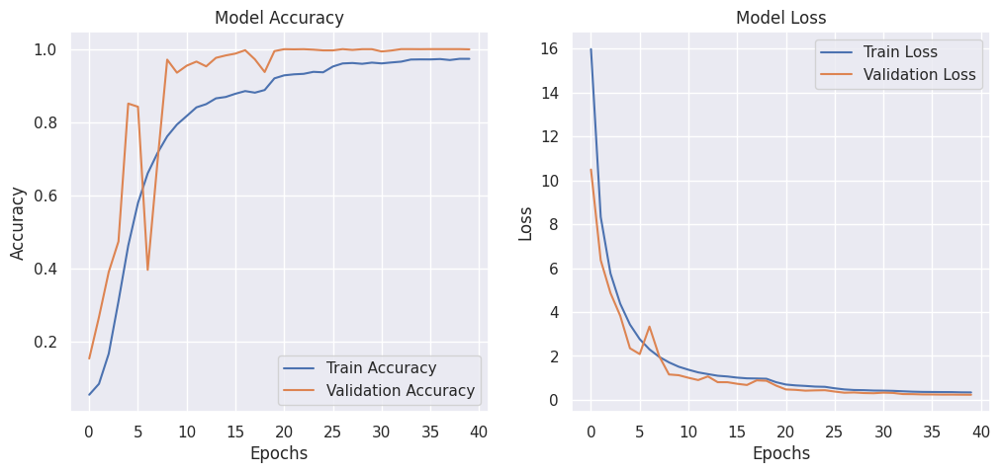

225/225 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


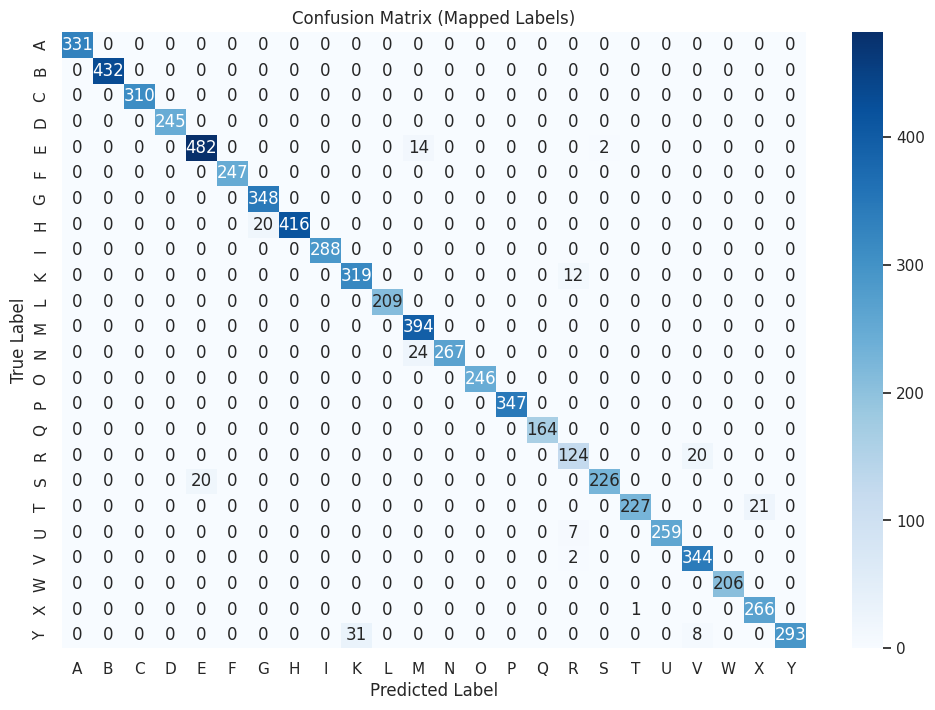

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       331
           1       1.00      1.00      1.00       432
           2       1.00      1.00      1.00       310
           3       1.00      1.00      1.00       245
           4       0.96      0.97      0.96       498
           5       1.00      1.00      1.00       247
           6       0.95      1.00      0.97       348
           7       1.00      0.95      0.98       436
           8       1.00      1.00      1.00       288
           9       0.91      0.96      0.94       331
          10       1.00      1.00      1.00       209
          11       0.91      1.00      0.95       394
          12       1.00      0.92      0.96       291
          13       1.00      1.00      1.00       246
          14       1.00      1.00      1.00       347
          15       1.00      1.00      1.00       164
          16       0.86      0.86      0.86       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import optuna
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define input shape and number of classes
input_shape = (32, 32, 1)  # Example input shape, change according to your dataset
num_classes = 24  # Example number of classes, change according to your dataset

# Ensure data is correctly split
assert X_train.shape[0] != X_valid.shape[0], "Training and Validation data should not overlap!"

# Define function to build a tunable CNN model
def build_model(trial, input_shape, num_classes):
    model = Sequential()

    # Tune number of filters
    num_filters = trial.suggest_categorical("num_filters", [32, 64])
    model.add(Conv2D(num_filters, (3,3), strides=1, padding='same', activation='relu', input_shape=input_shape,
                     kernel_regularizer=tf.keras.regularizers.l2(0.1)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))

    # Additional Layers
    for filters in [num_filters, num_filters * 2]:
        model.add(Conv2D(filters, (3,3), padding='same', activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.1)))
        model.add(BatchNormalization())
        model.add(MaxPooling2D((2,2)))
        model.add(Dropout(0.6))

    model.add(Flatten())
    model.add(Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.02)))
    dropout_rate = trial.suggest_float("dropout_rate", 0.6, 0.8)
    model.add(Dropout(dropout_rate))
    model.add(Dense(num_classes, activation='softmax'))

    # Optimizer Selection
    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "sgd"])
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 5e-3, log=True)

    optimizer = keras.optimizers.Adam(learning_rate) if optimizer_name == "adam" else keras.optimizers.SGD(learning_rate, momentum=0.9)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Objective function for Optuna
def objective(trial):
    print(f"Running trial with parameters: {trial.params}")
    model = build_model(trial, input_shape, num_classes)

    batch_size = trial.suggest_categorical("batch_size", [16, 32])

    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)

    history = model.fit(X_train, y_train, epochs=40, batch_size=batch_size, validation_data=(X_valid, y_valid),
                        callbacks=[early_stopping, lr_reduction], verbose=1)

    # Use the **final** validation accuracy, not max
    val_accuracy = history.history['val_accuracy'][-1]
    return val_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

# Get best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train final model with best hyperparameters
final_model = build_model(optuna.trial.FixedTrial(best_params), input_shape, num_classes)
final_history = final_model.fit(X_train, y_train, epochs=40, batch_size=best_params["batch_size"],
                                validation_data=(X_valid, y_valid),
                                callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
                                           ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)])

# Evaluate final model
test_loss, test_acc = final_model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot learning curves
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(final_history.history['accuracy'], label='Train Accuracy')
ax[0].plot(final_history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(final_history.history['loss'], label='Train Loss')
ax[1].plot(final_history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()

# Generate predictions
y_pred = final_model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


# **RESNET-19**

[I 2025-02-23 07:08:22,930] A new study created in memory with name: no-name-5ceb8254-0c89-49bb-9916-5acf534238ce


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 76s 56ms/step - accuracy: 0.0941 - loss: 19.2745 - val_accuracy: 0.2588 - val_loss: 15.2457 - learning_rate: 2.6701e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - accuracy: 0.2562 - loss: 14.4245 - val_accuracy: 0.5021 - val_loss: 11.3976 - learning_rate: 2.6701e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - accuracy: 0.4586 - loss: 10.8523 - val_accuracy: 0.7121 - val_loss: 8.3896 - learning_rate: 2.6701e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - accuracy: 0.6808 - loss: 8.0174 - val_accuracy: 0.8050 - val_loss: 6.3190 - learning_rate: 2.6701e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - accuracy: 0.8138 - loss: 5.9768 - val_accuracy: 0.9408 - val_loss: 4.5876 - learning_rate: 2.6701e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - accuracy: 0.8971 - loss: 4.4460 - val_accuracy: 0.9767 - val_loss: 3.4428 - learning_rate: 2.6701e-04
Epoch 7/40
68

[I 2025-02-23 07:23:06,875] Trial 0 finished with value: 0.9998179078102112 and parameters: {'l2_reg': 0.03672251083637159, 'dropout_rate': 0.572907061496062, 'optimizer': 'sgd', 'learning_rate': 0.00026701430036458367, 'batch_size': 32}. Best is trial 0 with value: 0.9998179078102112.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 71s 53ms/step - accuracy: 0.0865 - loss: 11.9545 - val_accuracy: 0.1998 - val_loss: 10.1184 - learning_rate: 2.7293e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 51s 27ms/step - accuracy: 0.2310 - loss: 9.7310 - val_accuracy: 0.4926 - val_loss: 8.0903 - learning_rate: 2.7293e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.4506 - loss: 7.9751 - val_accuracy: 0.6624 - val_loss: 6.6522 - learning_rate: 2.7293e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.6665 - loss: 6.4710 - val_accuracy: 0.8720 - val_loss: 5.2924 - learning_rate: 2.7293e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.8275 - loss: 5.2765 - val_accuracy: 0.9244 - val_loss: 4.4758 - learning_rate: 2.7293e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - accuracy: 0.9090 - loss: 4.4103 - val_accuracy: 0.9530 - val_loss: 3.8347 - learning_rate: 2.7293e-04
Epoch 7/40
687/6

[I 2025-02-23 07:37:58,110] Trial 1 finished with value: 1.0 and parameters: {'l2_reg': 0.019036602283688656, 'dropout_rate': 0.5916354296639654, 'optimizer': 'sgd', 'learning_rate': 0.0002729272136318176, 'batch_size': 32}. Best is trial 1 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 109s 74ms/step - accuracy: 0.0456 - loss: 35.9715 - val_accuracy: 0.0503 - val_loss: 19.7424 - learning_rate: 5.2958e-05
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - accuracy: 0.0623 - loss: 16.1983 - val_accuracy: 0.1451 - val_loss: 8.3919 - learning_rate: 5.2958e-05
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - accuracy: 0.1716 - loss: 7.0567 - val_accuracy: 0.4245 - val_loss: 3.7812 - learning_rate: 5.2958e-05
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - accuracy: 0.4406 - loss: 3.3544 - val_accuracy: 0.7139 - val_loss: 1.7545 - learning_rate: 5.2958e-05
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - accuracy: 0.7152 - loss: 1.6807 - val_accuracy: 0.8241 - val_loss: 1.0325 - learning_rate: 5.2958e-05
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - accuracy: 0.8620 - loss: 0.9029 - val_accuracy: 0.8649 - val_loss: 0.6959 - learning_rate: 5.2958e-05
Epoch 7/40
687

[I 2025-02-23 08:01:48,205] Trial 2 finished with value: 0.9998179078102112 and parameters: {'l2_reg': 0.08241247778467377, 'dropout_rate': 0.6089039420181946, 'optimizer': 'adam', 'learning_rate': 5.295774865609506e-05, 'batch_size': 32}. Best is trial 1 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 76s 61ms/step - accuracy: 0.0738 - loss: 21.5521 - val_accuracy: 0.2154 - val_loss: 8.3883 - learning_rate: 9.8953e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.2406 - loss: 6.6187 - val_accuracy: 0.5580 - val_loss: 2.7424 - learning_rate: 9.8953e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - accuracy: 0.5608 - loss: 2.3981 - val_accuracy: 0.7880 - val_loss: 1.0744 - learning_rate: 9.8953e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - accuracy: 0.7734 - loss: 1.0654 - val_accuracy: 0.8328 - val_loss: 0.6545 - learning_rate: 9.8953e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - accuracy: 0.8916 - loss: 0.5522 - val_accuracy: 0.9206 - val_loss: 0.3817 - learning_rate: 9.8953e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - accuracy: 0.9385 - loss: 0.3419 - val_accuracy: 0.9672 - val_loss: 0.1942 - learning_rate: 9.8953e-04
Epoch 7/40
687/68

[I 2025-02-23 08:15:48,915] Trial 3 finished with value: 1.0 and parameters: {'l2_reg': 0.05382470621249112, 'dropout_rate': 0.6185483714926304, 'optimizer': 'sgd', 'learning_rate': 0.0009895273641432783, 'batch_size': 32}. Best is trial 1 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 76s 61ms/step - accuracy: 0.1485 - loss: 24.3018 - val_accuracy: 0.4407 - val_loss: 6.7378 - learning_rate: 9.9062e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.6312 - loss: 4.5667 - val_accuracy: 0.8742 - val_loss: 1.2972 - learning_rate: 9.9062e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - accuracy: 0.8584 - loss: 1.1214 - val_accuracy: 0.9459 - val_loss: 0.4100 - learning_rate: 9.9062e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - accuracy: 0.9475 - loss: 0.3881 - val_accuracy: 0.9705 - val_loss: 0.2159 - learning_rate: 9.9062e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.9635 - loss: 0.2498 - val_accuracy: 0.9953 - val_loss: 0.0937 - learning_rate: 9.9062e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - accuracy: 0.9789 - loss: 0.1589 - val_accuracy: 0.9900 - val_loss: 0.0974 - learning_rate: 9.9062e-04
Epoch 7/40
687/68

[I 2025-02-23 08:30:01,106] Trial 4 finished with value: 1.0 and parameters: {'l2_reg': 0.06730759186735326, 'dropout_rate': 0.5391185566032657, 'optimizer': 'sgd', 'learning_rate': 0.0009906170526947878, 'batch_size': 32}. Best is trial 1 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 128s 50ms/step - accuracy: 0.0433 - loss: 27.0704 - val_accuracy: 0.0898 - val_loss: 4.3813 - learning_rate: 1.1506e-04
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 92s 29ms/step - accuracy: 0.0906 - loss: 3.6867 - val_accuracy: 0.2934 - val_loss: 2.3533 - learning_rate: 1.1506e-04
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - accuracy: 0.2204 - loss: 2.4926 - val_accuracy: 0.5846 - val_loss: 1.3558 - learning_rate: 1.1506e-04
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - accuracy: 0.3971 - loss: 1.8547 - val_accuracy: 0.7104 - val_loss: 0.8882 - learning_rate: 1.1506e-04
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - accuracy: 0.5302 - loss: 1.4275 - val_accuracy: 0.7503 - val_loss: 0.8320 - learning_rate: 1.1506e-04
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - accuracy: 0.6037 - loss: 1.2276 - val_accuracy: 0.8102 - val_loss: 0.6677 - learning_rate: 1.1506e-04
Epoc

[I 2025-02-23 08:59:18,421] Trial 5 finished with value: 0.9196867346763611 and parameters: {'l2_reg': 0.0838355627102275, 'dropout_rate': 0.6858185603101712, 'optimizer': 'adam', 'learning_rate': 0.00011506456644335475, 'batch_size': 16}. Best is trial 1 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 72s 54ms/step - accuracy: 0.0987 - loss: 10.2924 - val_accuracy: 0.2428 - val_loss: 7.8872 - learning_rate: 6.5575e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 50s 27ms/step - accuracy: 0.4027 - loss: 7.0062 - val_accuracy: 0.6390 - val_loss: 5.1390 - learning_rate: 6.5575e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.7221 - loss: 4.6951 - val_accuracy: 0.7436 - val_loss: 3.8789 - learning_rate: 6.5575e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - accuracy: 0.8822 - loss: 3.2714 - val_accuracy: 0.9286 - val_loss: 2.5389 - learning_rate: 6.5575e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.9436 - loss: 2.3626 - val_accuracy: 0.8745 - val_loss: 2.1394 - learning_rate: 6.5575e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - accuracy: 0.9620 - loss: 1.7676 - val_accuracy: 0.9749 - val_loss: 1.3897 - learning_rate: 6.5575e-04
Epoch 7/40
687/68

[I 2025-02-23 09:13:41,137] Trial 6 finished with value: 1.0 and parameters: {'l2_reg': 0.016271205423917173, 'dropout_rate': 0.5628602171439427, 'optimizer': 'sgd', 'learning_rate': 0.0006557546053295179, 'batch_size': 32}. Best is trial 1 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 86s 37ms/step - accuracy: 0.0736 - loss: 14.3436 - val_accuracy: 0.2317 - val_loss: 12.5477 - learning_rate: 6.4129e-05
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - accuracy: 0.1921 - loss: 12.4394 - val_accuracy: 0.3843 - val_loss: 11.0955 - learning_rate: 6.4129e-05
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.3235 - loss: 11.1107 - val_accuracy: 0.5655 - val_loss: 9.7788 - learning_rate: 6.4129e-05
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.4855 - loss: 9.8522 - val_accuracy: 0.7394 - val_loss: 8.5631 - learning_rate: 6.4129e-05
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.6263 - loss: 8.7425 - val_accuracy: 0.8064 - val_loss: 7.7348 - learning_rate: 6.4129e-05
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - accuracy: 0.7221 - loss: 7.8558 - val_accuracy: 0.8802 - val_loss: 6.9375 - learning_rate: 6.4129e-05
E

[I 2025-02-23 09:39:50,485] Trial 7 finished with value: 1.0 and parameters: {'l2_reg': 0.02378475465597038, 'dropout_rate': 0.5509656102230313, 'optimizer': 'sgd', 'learning_rate': 6.412864575229873e-05, 'batch_size': 16}. Best is trial 1 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 128s 50ms/step - accuracy: 0.0547 - loss: 9.4384 - val_accuracy: 0.0814 - val_loss: 2.8616 - learning_rate: 9.3511e-04
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - accuracy: 0.0747 - loss: 2.9673 - val_accuracy: 0.1098 - val_loss: 2.7387 - learning_rate: 9.3511e-04
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - accuracy: 0.0984 - loss: 2.8824 - val_accuracy: 0.1018 - val_loss: 2.7876 - learning_rate: 9.3511e-04
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - accuracy: 0.0903 - loss: 2.8518 - val_accuracy: 0.1085 - val_loss: 2.6715 - learning_rate: 9.3511e-04
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - accuracy: 0.0895 - loss: 2.9280 - val_accuracy: 0.0980 - val_loss: 2.8654 - learning_rate: 9.3511e-04
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - accuracy: 0.0784 - loss: 2.9807 - val_accuracy: 0.0963 - val_loss: 2.9019 - learning_rate: 9.3511e-04
Epoch

[I 2025-02-23 09:45:56,699] Trial 8 finished with value: 0.11600801348686218 and parameters: {'l2_reg': 0.09108046867925254, 'dropout_rate': 0.5410948036657408, 'optimizer': 'adam', 'learning_rate': 0.0009351140264797984, 'batch_size': 16}. Best is trial 1 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 129s 49ms/step - accuracy: 0.0748 - loss: 7.4317 - val_accuracy: 0.2196 - val_loss: 2.2721 - learning_rate: 7.3589e-04
Epoch 2/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 93s 29ms/step - accuracy: 0.1383 - loss: 2.5554 - val_accuracy: 0.1912 - val_loss: 2.2080 - learning_rate: 7.3589e-04
Epoch 3/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - accuracy: 0.1587 - loss: 2.4398 - val_accuracy: 0.1424 - val_loss: 2.7007 - learning_rate: 7.3589e-04
Epoch 4/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - accuracy: 0.1687 - loss: 2.4259 - val_accuracy: 0.2109 - val_loss: 2.2042 - learning_rate: 7.3589e-04
Epoch 5/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - accuracy: 0.1798 - loss: 2.3408 - val_accuracy: 0.2377 - val_loss: 2.0874 - learning_rate: 7.3589e-04
Epoch 6/40
1373/1373 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - accuracy: 0.1860 - loss: 2.2901 - val_accuracy: 0.2814 - val_loss: 1.7231 - learning_rate: 7.3589e-04
Epoch

[I 2025-02-23 10:16:08,053] Trial 9 finished with value: 0.45620104670524597 and parameters: {'l2_reg': 0.03275544215840717, 'dropout_rate': 0.5356430643172436, 'optimizer': 'adam', 'learning_rate': 0.0007358896869686493, 'batch_size': 16}. Best is trial 1 with value: 1.0.


Best Hyperparameters: {'l2_reg': 0.019036602283688656, 'dropout_rate': 0.5916354296639654, 'optimizer': 'sgd', 'learning_rate': 0.0002729272136318176, 'batch_size': 32}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 68s 53ms/step - accuracy: 0.0869 - loss: 11.9883 - val_accuracy: 0.2692 - val_loss: 9.9843 - learning_rate: 2.7293e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - accuracy: 0.2687 - loss: 9.6490 - val_accuracy: 0.5422 - val_loss: 7.9511 - learning_rate: 2.7293e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.5163 - loss: 7.8202 - val_accuracy: 0.7503 - val_loss: 6.4204 - learning_rate: 2.7293e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.7027 - loss: 6.3884 - val_accuracy: 0.8645 - val_loss: 5.3179 - learning_rate: 2.7293e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.8111 - loss: 5.3545 - val_accuracy: 0.9068 - val_loss: 4.5767 - learning_rate: 2.7293e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 

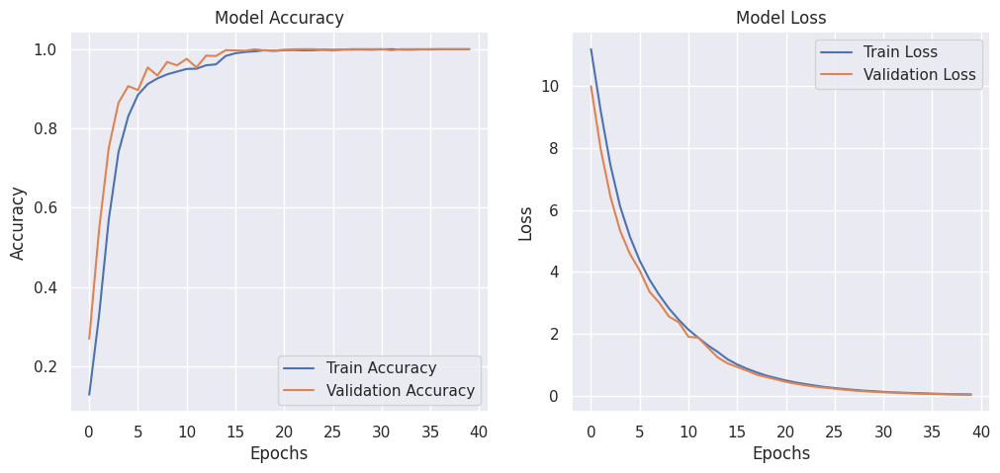

225/225 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step


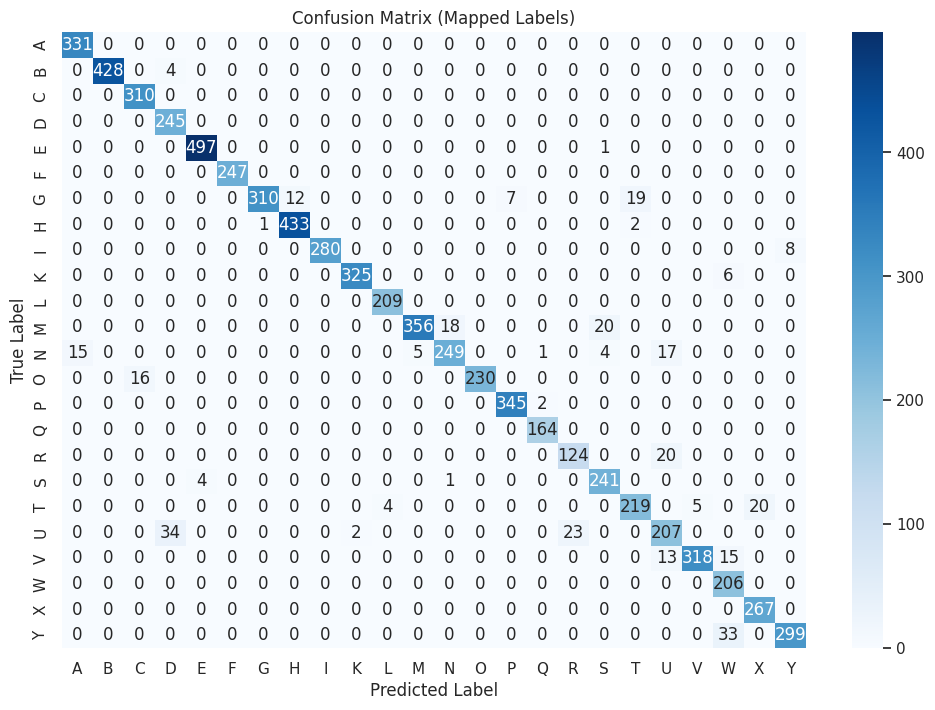

Classification Report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98       331
           1       1.00      0.99      1.00       432
           2       0.95      1.00      0.97       310
           3       0.87      1.00      0.93       245
           4       0.99      1.00      0.99       498
           5       1.00      1.00      1.00       247
           6       1.00      0.89      0.94       348
           7       0.97      0.99      0.98       436
           8       1.00      0.97      0.99       288
           9       0.99      0.98      0.99       331
          10       0.98      1.00      0.99       209
          11       0.99      0.90      0.94       394
          12       0.93      0.86      0.89       291
          13       1.00      0.93      0.97       246
          14       0.98      0.99      0.99       347
          15       0.98      1.00      0.99       164
          16       0.84      0.86      0.85       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import optuna
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define input shape and number of classes
input_shape = (32, 32, 1)  # Example input shape, change according to your dataset
num_classes = 24  # Example number of classes, change according to your dataset

# Ensure data is correctly split
assert X_train.shape[0] != X_valid.shape[0], "Training and Validation data should not overlap!"

# Define function to build a tunable ResNet-19 model
def build_model(trial, input_shape, num_classes):
    inputs = Input(shape=input_shape)
    base_model = ResNet50(weights=None, include_top=False, input_tensor=inputs)
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(trial.suggest_float('l2_reg', 0.01, 0.1)))(x)
    dropout_rate = trial.suggest_float("dropout_rate", 0.5, 0.7)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)

    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "sgd"])
    learning_rate = trial.suggest_float("learning_rate", 5e-5, 1e-3, log=True)
    optimizer = keras.optimizers.Adam(learning_rate) if optimizer_name == "adam" else keras.optimizers.SGD(learning_rate, momentum=0.9)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Objective function for Optuna
def objective(trial):
    print(f"Running trial with parameters: {trial.params}")
    model = build_model(trial, input_shape, num_classes)
    batch_size = trial.suggest_categorical("batch_size", [16, 32])
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)
    history = model.fit(X_train, y_train, epochs=40, batch_size=batch_size, validation_data=(X_valid, y_valid),
                        callbacks=[early_stopping, lr_reduction], verbose=1)
    val_accuracy = history.history['val_accuracy'][-1]
    return val_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

# Get best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train final model with best hyperparameters
final_model = build_model(optuna.trial.FixedTrial(best_params), input_shape, num_classes)
final_history = final_model.fit(X_train, y_train, epochs=40, batch_size=best_params["batch_size"],
                                validation_data=(X_valid, y_valid),
                                callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
                                           ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)])

# Evaluate final model
test_loss, test_acc = final_model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot learning curves
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(final_history.history['accuracy'], label='Train Accuracy')
ax[0].plot(final_history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(final_history.history['loss'], label='Train Loss')
ax[1].plot(final_history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()

# Generate predictions
y_pred = final_model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


# **RESNET-50**

[I 2025-02-23 11:14:35,133] A new study created in memory with name: no-name-e1c82746-6fd9-469f-8ebb-7bfb424f65e3


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 74s 97ms/step - accuracy: 0.0473 - loss: 16.6635 - val_accuracy: 0.0499 - val_loss: 14.3149 - learning_rate: 5.0776e-05
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.0511 - loss: 14.4151 - val_accuracy: 0.0881 - val_loss: 14.0602 - learning_rate: 5.0776e-05
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - accuracy: 0.0653 - loss: 14.0845 - val_accuracy: 0.1264 - val_loss: 13.7953 - learning_rate: 5.0776e-05
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.0910 - loss: 13.8147 - val_accuracy: 0.1579 - val_loss: 13.4960 - learning_rate: 5.0776e-05
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - accuracy: 0.1096 - loss: 13.5477 - val_accuracy: 0.2142 - val_loss: 13.1467 - learning_rate: 5.0776e-05
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - accuracy: 0.1407 - loss: 13.2357 - val_accuracy: 0.2628 - val_loss: 12.7927 - learning_rate: 5.0776e-05
Epoch 

[I 2025-02-23 11:27:00,555] Trial 0 finished with value: 0.9712256193161011 and parameters: {'l2_reg': 0.02494322099462382, 'dropout_rate': 0.7532746457139715, 'optimizer': 'sgd', 'learning_rate': 5.077619323513606e-05, 'batch_size': 64}. Best is trial 0 with value: 0.9712256193161011.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 75s 55ms/step - accuracy: 0.0406 - loss: 55.1529 - val_accuracy: 0.0510 - val_loss: 51.4686 - learning_rate: 1.2816e-05
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - accuracy: 0.0484 - loss: 51.3564 - val_accuracy: 0.0539 - val_loss: 49.4857 - learning_rate: 1.2816e-05
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - accuracy: 0.0512 - loss: 49.1975 - val_accuracy: 0.0652 - val_loss: 47.6576 - learning_rate: 1.2816e-05
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - accuracy: 0.0580 - loss: 47.3318 - val_accuracy: 0.0834 - val_loss: 45.9116 - learning_rate: 1.2816e-05
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - accuracy: 0.0597 - loss: 45.5930 - val_accuracy: 0.0843 - val_loss: 44.2716 - learning_rate: 1.2816e-05
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - accuracy: 0.0658 - loss: 43.9476 - val_accuracy: 0.0943 - val_loss: 42.6695 - learning_rate: 1.2816e-05
Epoch 

[I 2025-02-23 11:41:41,640] Trial 1 finished with value: 0.9573848247528076 and parameters: {'l2_reg': 0.10978844867975496, 'dropout_rate': 0.6647861865376334, 'optimizer': 'sgd', 'learning_rate': 1.2815618899831283e-05, 'batch_size': 32}. Best is trial 0 with value: 0.9712256193161011.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 76s 56ms/step - accuracy: 0.0565 - loss: 36.8254 - val_accuracy: 0.1120 - val_loss: 21.9853 - learning_rate: 3.0568e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - accuracy: 0.1064 - loss: 19.1019 - val_accuracy: 0.2391 - val_loss: 11.9271 - learning_rate: 3.0568e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - accuracy: 0.1998 - loss: 10.5398 - val_accuracy: 0.3850 - val_loss: 6.5740 - learning_rate: 3.0568e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - accuracy: 0.3527 - loss: 5.9426 - val_accuracy: 0.6461 - val_loss: 3.4312 - learning_rate: 3.0568e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.5800 - loss: 3.3211 - val_accuracy: 0.7430 - val_loss: 2.0170 - learning_rate: 3.0568e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - accuracy: 0.7247 - loss: 1.9520 - val_accuracy: 0.7915 - val_loss: 1.3197 - learning_rate: 3.0568e-04
Epoch 7/40
68

[I 2025-02-23 11:56:02,248] Trial 2 finished with value: 1.0 and parameters: {'l2_reg': 0.08470019199409279, 'dropout_rate': 0.7725795573476052, 'optimizer': 'sgd', 'learning_rate': 0.00030567559533393367, 'batch_size': 32}. Best is trial 2 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 66s 89ms/step - accuracy: 0.0445 - loss: 21.1180 - val_accuracy: 0.0350 - val_loss: 18.5581 - learning_rate: 1.5897e-05
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - accuracy: 0.0451 - loss: 19.3631 - val_accuracy: 0.0474 - val_loss: 18.4990 - learning_rate: 1.5897e-05
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.0518 - loss: 18.7535 - val_accuracy: 0.0672 - val_loss: 18.2960 - learning_rate: 1.5897e-05
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - accuracy: 0.0504 - loss: 18.4387 - val_accuracy: 0.0628 - val_loss: 18.1047 - learning_rate: 1.5897e-05
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - accuracy: 0.0540 - loss: 18.2152 - val_accuracy: 0.0727 - val_loss: 17.9901 - learning_rate: 1.5897e-05
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - accuracy: 0.0549 - loss: 18.0502 - val_accuracy: 0.0747 - val_loss: 17.8499 - learning_rate: 1.5897e-05
Epoch 

[I 2025-02-23 12:08:37,021] Trial 3 finished with value: 0.8167911171913147 and parameters: {'l2_reg': 0.033797119035406886, 'dropout_rate': 0.6112953557769003, 'optimizer': 'sgd', 'learning_rate': 1.5897330921721924e-05, 'batch_size': 64}. Best is trial 2 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 107s 133ms/step - accuracy: 0.0468 - loss: 45.7081 - val_accuracy: 0.0415 - val_loss: 20.4328 - learning_rate: 1.0244e-04
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - accuracy: 0.0541 - loss: 15.8951 - val_accuracy: 0.0883 - val_loss: 7.0752 - learning_rate: 1.0244e-04
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - accuracy: 0.1008 - loss: 5.9067 - val_accuracy: 0.2706 - val_loss: 3.3400 - learning_rate: 1.0244e-04
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - accuracy: 0.2490 - loss: 3.1548 - val_accuracy: 0.5465 - val_loss: 1.7796 - learning_rate: 1.0244e-04
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - accuracy: 0.5424 - loss: 1.7881 - val_accuracy: 0.7846 - val_loss: 0.9061 - learning_rate: 1.0244e-04
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - accuracy: 0.7820 - loss: 0.9512 - val_accuracy: 0.8596 - val_loss: 0.6049 - learning_rate: 1.0244e-04
Epoch 7/40
34

[I 2025-02-23 12:15:33,369] Trial 4 finished with value: 0.9978145956993103 and parameters: {'l2_reg': 0.1110292366403575, 'dropout_rate': 0.7733681301998496, 'optimizer': 'adam', 'learning_rate': 0.0001024437455808932, 'batch_size': 64}. Best is trial 2 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 68s 92ms/step - accuracy: 0.0426 - loss: 31.4402 - val_accuracy: 0.0446 - val_loss: 28.2475 - learning_rate: 4.6220e-05
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - accuracy: 0.0480 - loss: 28.1820 - val_accuracy: 0.0821 - val_loss: 27.2840 - learning_rate: 4.6220e-05
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - accuracy: 0.0599 - loss: 27.1410 - val_accuracy: 0.1218 - val_loss: 26.3433 - learning_rate: 4.6220e-05
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - accuracy: 0.0796 - loss: 26.1988 - val_accuracy: 0.1506 - val_loss: 25.4020 - learning_rate: 4.6220e-05
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - accuracy: 0.0980 - loss: 25.2946 - val_accuracy: 0.1952 - val_loss: 24.4904 - learning_rate: 4.6220e-05
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.1258 - loss: 24.4111 - val_accuracy: 0.2304 - val_loss: 23.5713 - learning_rate: 4.6220e-05
Epoch 

[I 2025-02-23 12:27:02,918] Trial 5 finished with value: 0.9755964279174805 and parameters: {'l2_reg': 0.05708983827366634, 'dropout_rate': 0.7729978414288226, 'optimizer': 'sgd', 'learning_rate': 4.6219726624199326e-05, 'batch_size': 64}. Best is trial 2 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 73s 55ms/step - accuracy: 0.0432 - loss: 41.9670 - val_accuracy: 0.0486 - val_loss: 38.1806 - learning_rate: 1.0999e-05
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - accuracy: 0.0455 - loss: 38.4944 - val_accuracy: 0.0650 - val_loss: 37.1957 - learning_rate: 1.0999e-05
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - accuracy: 0.0478 - loss: 37.2080 - val_accuracy: 0.0688 - val_loss: 36.3111 - learning_rate: 1.0999e-05
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - accuracy: 0.0524 - loss: 36.2848 - val_accuracy: 0.0778 - val_loss: 35.5051 - learning_rate: 1.0999e-05
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - accuracy: 0.0525 - loss: 35.4460 - val_accuracy: 0.0769 - val_loss: 34.7412 - learning_rate: 1.0999e-05
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - accuracy: 0.0593 - loss: 34.6493 - val_accuracy: 0.0892 - val_loss: 33.9800 - learning_rate: 1.0999e-05
Epoch 

[I 2025-02-23 12:41:36,292] Trial 6 finished with value: 0.8275359869003296 and parameters: {'l2_reg': 0.07820318961152194, 'dropout_rate': 0.7443089974450223, 'optimizer': 'sgd', 'learning_rate': 1.0998930616751327e-05, 'batch_size': 32}. Best is trial 2 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 77s 57ms/step - accuracy: 0.0436 - loss: 55.4993 - val_accuracy: 0.0537 - val_loss: 51.9051 - learning_rate: 1.3280e-05
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - accuracy: 0.0496 - loss: 51.6352 - val_accuracy: 0.0665 - val_loss: 49.7570 - learning_rate: 1.3280e-05
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - accuracy: 0.0577 - loss: 49.4034 - val_accuracy: 0.0736 - val_loss: 47.8292 - learning_rate: 1.3280e-05
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - accuracy: 0.0598 - loss: 47.4835 - val_accuracy: 0.0814 - val_loss: 46.0163 - learning_rate: 1.3280e-05
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - accuracy: 0.0657 - loss: 45.6659 - val_accuracy: 0.1009 - val_loss: 44.2793 - learning_rate: 1.3280e-05
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.0731 - loss: 43.9398 - val_accuracy: 0.1198 - val_loss: 42.5940 - learning_rate: 1.3280e-05
Epoch 

[I 2025-02-23 12:56:00,516] Trial 7 finished with value: 0.930431604385376 and parameters: {'l2_reg': 0.11075440499912931, 'dropout_rate': 0.633287804990215, 'optimizer': 'sgd', 'learning_rate': 1.3280257729977278e-05, 'batch_size': 32}. Best is trial 2 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 73s 55ms/step - accuracy: 0.0457 - loss: 26.8325 - val_accuracy: 0.0727 - val_loss: 24.0800 - learning_rate: 3.0743e-05
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - accuracy: 0.0571 - loss: 24.0005 - val_accuracy: 0.0994 - val_loss: 23.1984 - learning_rate: 3.0743e-05
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.0691 - loss: 23.0772 - val_accuracy: 0.1320 - val_loss: 22.3029 - learning_rate: 3.0743e-05
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - accuracy: 0.0855 - loss: 22.2080 - val_accuracy: 0.1748 - val_loss: 21.4521 - learning_rate: 3.0743e-05
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - accuracy: 0.1050 - loss: 21.3880 - val_accuracy: 0.2154 - val_loss: 20.6140 - learning_rate: 3.0743e-05
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.1209 - loss: 20.5870 - val_accuracy: 0.2626 - val_loss: 19.7675 - learning_rate: 3.0743e-05
Epoch 

[I 2025-02-23 13:09:50,936] Trial 8 finished with value: 0.9887087941169739 and parameters: {'l2_reg': 0.0479504339541777, 'dropout_rate': 0.778416230383463, 'optimizer': 'sgd', 'learning_rate': 3.074311597663999e-05, 'batch_size': 32}. Best is trial 2 with value: 1.0.


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 70s 93ms/step - accuracy: 0.0420 - loss: 56.1610 - val_accuracy: 0.0464 - val_loss: 52.2496 - learning_rate: 2.3165e-05
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.0477 - loss: 52.3265 - val_accuracy: 0.0614 - val_loss: 50.4825 - learning_rate: 2.3165e-05
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - accuracy: 0.0544 - loss: 50.2605 - val_accuracy: 0.0732 - val_loss: 48.7725 - learning_rate: 2.3165e-05
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.0602 - loss: 48.4613 - val_accuracy: 0.0829 - val_loss: 47.1112 - learning_rate: 2.3165e-05
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - accuracy: 0.0712 - loss: 46.7949 - val_accuracy: 0.1054 - val_loss: 45.5233 - learning_rate: 2.3165e-05
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - accuracy: 0.0839 - loss: 45.2103 - val_accuracy: 0.1300 - val_loss: 43.9725 - learning_rate: 2.3165e-05
Epoch 

[I 2025-02-23 13:21:52,077] Trial 9 finished with value: 0.9258787035942078 and parameters: {'l2_reg': 0.11155867226561367, 'dropout_rate': 0.6144411172608769, 'optimizer': 'sgd', 'learning_rate': 2.316519977319083e-05, 'batch_size': 64}. Best is trial 2 with value: 1.0.


Best Hyperparameters: {'l2_reg': 0.08470019199409279, 'dropout_rate': 0.7725795573476052, 'optimizer': 'sgd', 'learning_rate': 0.00030567559533393367, 'batch_size': 32}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 72s 56ms/step - accuracy: 0.0606 - loss: 36.6914 - val_accuracy: 0.1781 - val_loss: 21.9363 - learning_rate: 3.0568e-04
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - accuracy: 0.1269 - loss: 19.0351 - val_accuracy: 0.3320 - val_loss: 11.5408 - learning_rate: 3.0568e-04
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - accuracy: 0.3001 - loss: 10.1707 - val_accuracy: 0.5879 - val_loss: 5.9873 - learning_rate: 3.0568e-04
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - accuracy: 0.5597 - loss: 5.3380 - val_accuracy: 0.7973 - val_loss: 3.0054 - learning_rate: 3.0568e-04
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - accuracy: 0.7412 - loss: 2.8894 - val_accuracy: 0.9120 - val_loss: 1.4991 - learning_rate: 3.0568e-04
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━

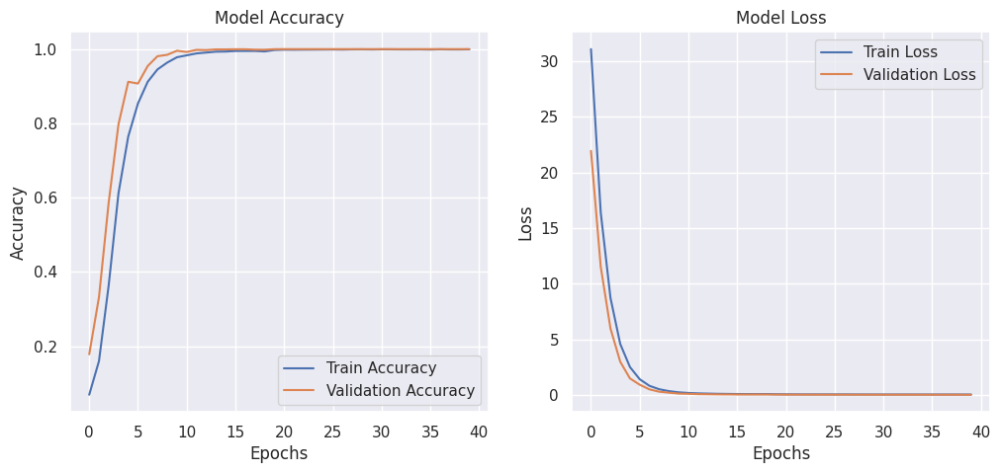

225/225 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step


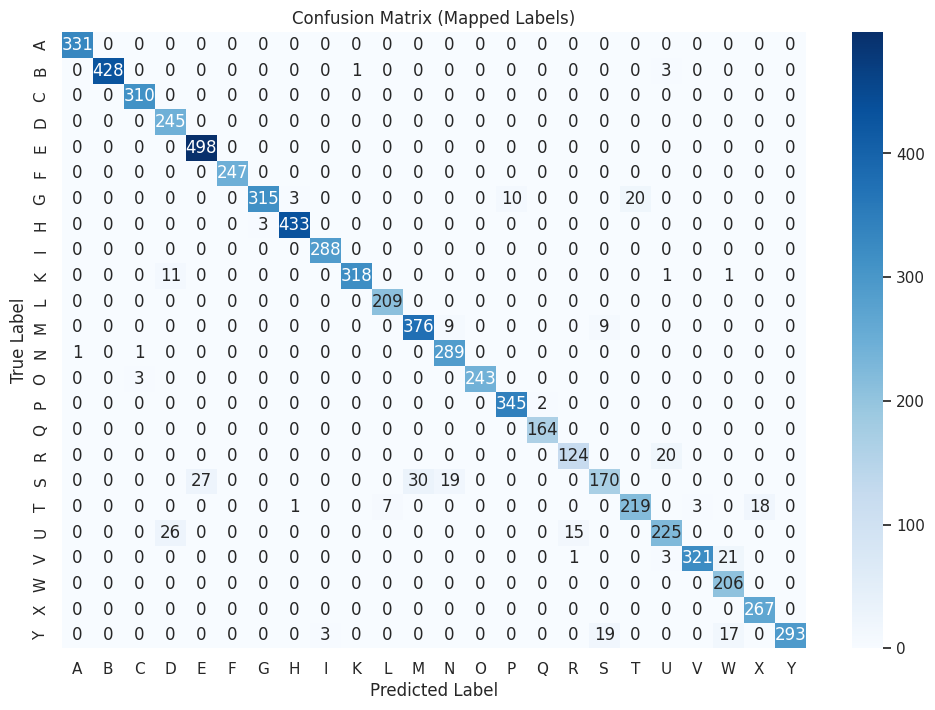

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       331
           1       1.00      0.99      1.00       432
           2       0.99      1.00      0.99       310
           3       0.87      1.00      0.93       245
           4       0.95      1.00      0.97       498
           5       1.00      1.00      1.00       247
           6       0.99      0.91      0.95       348
           7       0.99      0.99      0.99       436
           8       0.99      1.00      0.99       288
           9       1.00      0.96      0.98       331
          10       0.97      1.00      0.98       209
          11       0.93      0.95      0.94       394
          12       0.91      0.99      0.95       291
          13       1.00      0.99      0.99       246
          14       0.97      0.99      0.98       347
          15       0.99      1.00      0.99       164
          16       0.89      0.86      0.87       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import optuna
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define input shape and number of classes
input_shape = (32, 32, 1)  # Example input shape, change according to your dataset
num_classes = 24  # Example number of classes, change according to your dataset

# Ensure data is correctly split
assert X_train.shape[0] != X_valid.shape[0], "Training and Validation data should not overlap!"

# Define function to build a tunable ResNet-19 model
def build_model(trial, input_shape, num_classes):
    inputs = Input(shape=input_shape)
    base_model = ResNet50(weights=None, include_top=False, input_tensor=inputs)
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(trial.suggest_float('l2_reg', 0.02, 0.15)))(x)
    dropout_rate = trial.suggest_float("dropout_rate", 0.6, 0.8)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)

    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "sgd"])
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 5e-4, log=True)
    optimizer = keras.optimizers.Adam(learning_rate) if optimizer_name == "adam" else keras.optimizers.SGD(learning_rate, momentum=0.9)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Objective function for Optuna
def objective(trial):
    print(f"Running trial with parameters: {trial.params}")
    model = build_model(trial, input_shape, num_classes)
    batch_size = trial.suggest_categorical("batch_size", [32, 64])
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)
    history = model.fit(X_train, y_train, epochs=40, batch_size=batch_size, validation_data=(X_valid, y_valid),
                        callbacks=[early_stopping, lr_reduction], verbose=1)
    val_accuracy = history.history['val_accuracy'][-1]
    return val_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

# Get best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train final model with best hyperparameters
final_model = build_model(optuna.trial.FixedTrial(best_params), input_shape, num_classes)
final_history = final_model.fit(X_train, y_train, epochs=40, batch_size=best_params["batch_size"],
                                validation_data=(X_valid, y_valid),
                                callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
                                           ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)])

# Evaluate final model
test_loss, test_acc = final_model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot learning curves
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(final_history.history['accuracy'], label='Train Accuracy')
ax[0].plot(final_history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(final_history.history['loss'], label='Train Loss')
ax[1].plot(final_history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()

# Generate predictions
y_pred = final_model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


RESNET-50 Optimized Code

[I 2025-02-26 05:08:47,182] A new study created in memory with name: no-name-cf0f55d9-be80-4eec-b932-73ed85376273


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 110s 120ms/step - accuracy: 0.0397 - loss: 64.2714 - val_accuracy: 0.0441 - val_loss: 51.6591 - learning_rate: 3.0329e-05
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - accuracy: 0.0437 - loss: 48.1828 - val_accuracy: 0.0424 - val_loss: 37.8850 - learning_rate: 3.0329e-05
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - accuracy: 0.0453 - loss: 34.8958 - val_accuracy: 0.0539 - val_loss: 26.5631 - learning_rate: 3.0329e-05
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - accuracy: 0.0442 - loss: 24.2930 - val_accuracy: 0.0639 - val_loss: 18.1800 - learning_rate: 3.0329e-05
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - accuracy: 0.0465 - loss: 16.5932 - val_accuracy: 0.0727 - val_loss: 12.4079 - learning_rate: 3.0329e-05
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - accuracy: 0.0535 - loss: 11.3577 - val_accuracy: 0.0938 - val_loss: 8.6326 - learning_rate: 3.0329e-05
Epoch

[I 2025-02-26 05:22:58,731] Trial 0 finished with value: 0.995993435382843 and parameters: {'l2_reg': 0.1353914626037958, 'dropout_rate': 0.8352315574343026, 'optimizer': 'adam', 'learning_rate': 3.032867553641741e-05, 'batch_size': 64}. Best is trial 0 with value: 0.995993435382843.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 80s 62ms/step - accuracy: 0.0468 - loss: 71.8919 - val_accuracy: 0.0441 - val_loss: 66.5132 - learning_rate: 1.2500e-05
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - accuracy: 0.0495 - loss: 65.9992 - val_accuracy: 0.0534 - val_loss: 63.2517 - learning_rate: 1.2500e-05
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.0466 - loss: 62.6591 - val_accuracy: 0.0663 - val_loss: 60.2646 - learning_rate: 1.2500e-05
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.0497 - loss: 59.6649 - val_accuracy: 0.0647 - val_loss: 57.4591 - learning_rate: 1.2500e-05
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.0530 - loss: 56.8565 - val_accuracy: 0.0794 - val_loss: 54.7912 - learning_rate: 1.2500e-05
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - accuracy: 0.0550 - loss: 54.2041 - val_accuracy: 0.0896 - val_loss: 52.2507 - learning_rate: 1.2500e-05
Epoch 

[I 2025-02-26 05:37:32,987] Trial 1 finished with value: 0.8519395589828491 and parameters: {'l2_reg': 0.14586265982698843, 'dropout_rate': 0.764336608224604, 'optimizer': 'sgd', 'learning_rate': 1.2500162586229984e-05, 'batch_size': 32}. Best is trial 0 with value: 0.995993435382843.


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 99s 115ms/step - accuracy: 0.0468 - loss: 102.7881 - val_accuracy: 0.0388 - val_loss: 62.9823 - learning_rate: 4.8631e-05
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - accuracy: 0.0431 - loss: 53.3439 - val_accuracy: 0.0495 - val_loss: 29.9448 - learning_rate: 4.8631e-05
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - accuracy: 0.0485 - loss: 25.0145 - val_accuracy: 0.0710 - val_loss: 13.7847 - learning_rate: 4.8631e-05
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - accuracy: 0.0492 - loss: 11.6572 - val_accuracy: 0.1020 - val_loss: 6.9566 - learning_rate: 4.8631e-05
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - accuracy: 0.0675 - loss: 6.1819 - val_accuracy: 0.1251 - val_loss: 4.3454 - learning_rate: 4.8631e-05
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - accuracy: 0.0951 - loss: 4.1152 - val_accuracy: 0.2001 - val_loss: 3.2784 - learning_rate: 4.8631e-05
Epoch 7/4

[I 2025-02-26 05:51:25,172] Trial 2 finished with value: 0.9985430836677551 and parameters: {'l2_reg': 0.24260939275587085, 'dropout_rate': 0.8430480725289461, 'optimizer': 'adam', 'learning_rate': 4.863102473315148e-05, 'batch_size': 64}. Best is trial 2 with value: 0.9985430836677551.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 76s 58ms/step - accuracy: 0.0406 - loss: 65.1780 - val_accuracy: 0.0362 - val_loss: 59.7582 - learning_rate: 1.5364e-06
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - accuracy: 0.0389 - loss: 62.9806 - val_accuracy: 0.0448 - val_loss: 59.1854 - learning_rate: 1.5364e-06
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - accuracy: 0.0424 - loss: 61.4388 - val_accuracy: 0.0428 - val_loss: 58.7280 - learning_rate: 1.5364e-06
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - accuracy: 0.0425 - loss: 60.2965 - val_accuracy: 0.0443 - val_loss: 58.3320 - learning_rate: 1.5364e-06
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - accuracy: 0.0434 - loss: 59.4668 - val_accuracy: 0.0424 - val_loss: 57.9578 - learning_rate: 1.5364e-06
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.0430 - loss: 58.8199 - val_accuracy: 0.0470 - val_loss: 57.5866 - learning_rate: 1.5364e-06
Epoch 

[I 2025-02-26 06:05:51,252] Trial 3 finished with value: 0.053542159497737885 and parameters: {'l2_reg': 0.1231351423097326, 'dropout_rate': 0.8537681394759651, 'optimizer': 'sgd', 'learning_rate': 1.5363634281367724e-06, 'batch_size': 32}. Best is trial 2 with value: 0.9985430836677551.


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 68s 92ms/step - accuracy: 0.0424 - loss: 88.4517 - val_accuracy: 0.0488 - val_loss: 82.1277 - learning_rate: 6.3044e-06
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.0441 - loss: 84.4012 - val_accuracy: 0.0461 - val_loss: 81.2148 - learning_rate: 6.3044e-06
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - accuracy: 0.0445 - loss: 81.8765 - val_accuracy: 0.0432 - val_loss: 79.7092 - learning_rate: 6.3044e-06
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - accuracy: 0.0430 - loss: 80.1214 - val_accuracy: 0.0459 - val_loss: 78.5225 - learning_rate: 6.3044e-06
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - accuracy: 0.0444 - loss: 78.6520 - val_accuracy: 0.0484 - val_loss: 77.2851 - learning_rate: 6.3044e-06
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - accuracy: 0.0468 - loss: 77.3549 - val_accuracy: 0.0495 - val_loss: 76.1394 - learning_rate: 6.3044e-06
Epoch 

[I 2025-02-26 06:18:00,952] Trial 4 finished with value: 0.07794573158025742 and parameters: {'l2_reg': 0.17592663597006256, 'dropout_rate': 0.8333591231643076, 'optimizer': 'sgd', 'learning_rate': 6.304374880770813e-06, 'batch_size': 64}. Best is trial 2 with value: 0.9985430836677551.


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 69s 91ms/step - accuracy: 0.0418 - loss: 69.2535 - val_accuracy: 0.0474 - val_loss: 63.9583 - learning_rate: 4.4077e-06
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - accuracy: 0.0410 - loss: 66.8315 - val_accuracy: 0.0412 - val_loss: 63.6526 - learning_rate: 4.4077e-06
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - accuracy: 0.0425 - loss: 65.2301 - val_accuracy: 0.0457 - val_loss: 63.3157 - learning_rate: 4.4077e-06
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - accuracy: 0.0456 - loss: 64.0209 - val_accuracy: 0.0446 - val_loss: 62.5169 - learning_rate: 4.4077e-06
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.0410 - loss: 63.1804 - val_accuracy: 0.0468 - val_loss: 61.9256 - learning_rate: 4.4077e-06
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - accuracy: 0.0430 - loss: 62.4128 - val_accuracy: 0.0497 - val_loss: 61.3970 - learning_rate: 4.4077e-06
Epoch 

[I 2025-02-26 06:30:58,726] Trial 5 finished with value: 0.06082680821418762 and parameters: {'l2_reg': 0.1341704819611915, 'dropout_rate': 0.8165101278988878, 'optimizer': 'sgd', 'learning_rate': 4.407708587690133e-06, 'batch_size': 64}. Best is trial 2 with value: 0.9985430836677551.


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 100s 118ms/step - accuracy: 0.0405 - loss: 77.8563 - val_accuracy: 0.0463 - val_loss: 55.3292 - learning_rate: 4.3517e-05
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - accuracy: 0.0413 - loss: 49.1442 - val_accuracy: 0.0472 - val_loss: 32.6230 - learning_rate: 4.3517e-05
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - accuracy: 0.0471 - loss: 28.5064 - val_accuracy: 0.0524 - val_loss: 18.2021 - learning_rate: 4.3517e-05
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - accuracy: 0.0468 - loss: 15.8689 - val_accuracy: 0.0652 - val_loss: 10.2432 - learning_rate: 4.3517e-05
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - accuracy: 0.0530 - loss: 9.0636 - val_accuracy: 0.0718 - val_loss: 6.2825 - learning_rate: 4.3517e-05
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - accuracy: 0.0544 - loss: 5.7429 - val_accuracy: 0.1011 - val_loss: 4.4438 - learning_rate: 4.3517e-05
Epoch 7/

[I 2025-02-26 06:44:52,219] Trial 6 finished with value: 0.9992715120315552 and parameters: {'l2_reg': 0.17319488956072535, 'dropout_rate': 0.8739009736548502, 'optimizer': 'adam', 'learning_rate': 4.351729759212068e-05, 'batch_size': 64}. Best is trial 6 with value: 0.9992715120315552.


Running trial with parameters: {}
Epoch 1/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 73s 55ms/step - accuracy: 0.0435 - loss: 72.2883 - val_accuracy: 0.0492 - val_loss: 67.1530 - learning_rate: 5.7937e-06
Epoch 2/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.0401 - loss: 67.7751 - val_accuracy: 0.0497 - val_loss: 65.3527 - learning_rate: 5.7937e-06
Epoch 3/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - accuracy: 0.0468 - loss: 65.4677 - val_accuracy: 0.0563 - val_loss: 63.8374 - learning_rate: 5.7937e-06
Epoch 4/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.0391 - loss: 63.7873 - val_accuracy: 0.0492 - val_loss: 62.4373 - learning_rate: 5.7937e-06
Epoch 5/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - accuracy: 0.0454 - loss: 62.2931 - val_accuracy: 0.0548 - val_loss: 61.0733 - learning_rate: 5.7937e-06
Epoch 6/40
687/687 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.0474 - loss: 60.8935 - val_accuracy: 0.0543 - val_loss: 59.7514 - learning_rate: 5.7937e-06
Epoch 

[I 2025-02-26 06:59:16,252] Trial 7 finished with value: 0.1790202111005783 and parameters: {'l2_reg': 0.14318429440385633, 'dropout_rate': 0.8100418917851602, 'optimizer': 'sgd', 'learning_rate': 5.793748698348261e-06, 'batch_size': 32}. Best is trial 6 with value: 0.9992715120315552.


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 70s 93ms/step - accuracy: 0.0424 - loss: 85.8549 - val_accuracy: 0.0428 - val_loss: 78.7351 - learning_rate: 1.5195e-05
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - accuracy: 0.0407 - loss: 78.9059 - val_accuracy: 0.0472 - val_loss: 76.0307 - learning_rate: 1.5195e-05
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - accuracy: 0.0441 - loss: 75.6752 - val_accuracy: 0.0517 - val_loss: 73.4237 - learning_rate: 1.5195e-05
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - accuracy: 0.0431 - loss: 72.9692 - val_accuracy: 0.0495 - val_loss: 70.9217 - learning_rate: 1.5195e-05
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.0456 - loss: 70.4333 - val_accuracy: 0.0524 - val_loss: 68.5199 - learning_rate: 1.5195e-05
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.0468 - loss: 68.0172 - val_accuracy: 0.0546 - val_loss: 66.2055 - learning_rate: 1.5195e-05
Epoch 

[I 2025-02-26 07:12:09,681] Trial 8 finished with value: 0.15170279145240784 and parameters: {'l2_reg': 0.1719880766601572, 'dropout_rate': 0.8973424089975586, 'optimizer': 'sgd', 'learning_rate': 1.5194693413370614e-05, 'batch_size': 64}. Best is trial 6 with value: 0.9992715120315552.


Running trial with parameters: {}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 100s 117ms/step - accuracy: 0.0433 - loss: 86.8881 - val_accuracy: 0.0379 - val_loss: 80.9248 - learning_rate: 2.6700e-06
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - accuracy: 0.0433 - loss: 83.2465 - val_accuracy: 0.0430 - val_loss: 79.3442 - learning_rate: 2.6700e-06
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - accuracy: 0.0444 - loss: 80.3319 - val_accuracy: 0.0550 - val_loss: 77.5858 - learning_rate: 2.6700e-06
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - accuracy: 0.0443 - loss: 77.9721 - val_accuracy: 0.0488 - val_loss: 75.7364 - learning_rate: 2.6700e-06
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - accuracy: 0.0452 - loss: 75.8066 - val_accuracy: 0.0495 - val_loss: 73.8205 - learning_rate: 2.6700e-06
Epoch 6/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - accuracy: 0.0454 - loss: 73.6985 - val_accuracy: 0.0523 - val_loss: 71.8105 - learning_rate: 2.6700e-06
Epoc

[I 2025-02-26 07:25:52,561] Trial 9 finished with value: 0.10253141820430756 and parameters: {'l2_reg': 0.17388181597739139, 'dropout_rate': 0.8147966325374978, 'optimizer': 'adam', 'learning_rate': 2.6700003406025642e-06, 'batch_size': 64}. Best is trial 6 with value: 0.9992715120315552.


Best Hyperparameters: {'l2_reg': 0.17319488956072535, 'dropout_rate': 0.8739009736548502, 'optimizer': 'adam', 'learning_rate': 4.351729759212068e-05, 'batch_size': 64}
Epoch 1/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 94s 111ms/step - accuracy: 0.0416 - loss: 78.1162 - val_accuracy: 0.0346 - val_loss: 55.7513 - learning_rate: 4.3517e-05
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - accuracy: 0.0469 - loss: 49.5971 - val_accuracy: 0.0419 - val_loss: 33.1226 - learning_rate: 4.3517e-05
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - accuracy: 0.0501 - loss: 28.9883 - val_accuracy: 0.0555 - val_loss: 18.6036 - learning_rate: 4.3517e-05
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - accuracy: 0.0503 - loss: 16.2256 - val_accuracy: 0.0601 - val_loss: 10.4887 - learning_rate: 4.3517e-05
Epoch 5/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step - accuracy: 0.0474 - loss: 9.2756 - val_accuracy: 0.0708 - val_loss: 6.4007 - learning_rate: 4.3517e-05
Epoch 6/40
344/344 ━━━━━━━━━━━━━

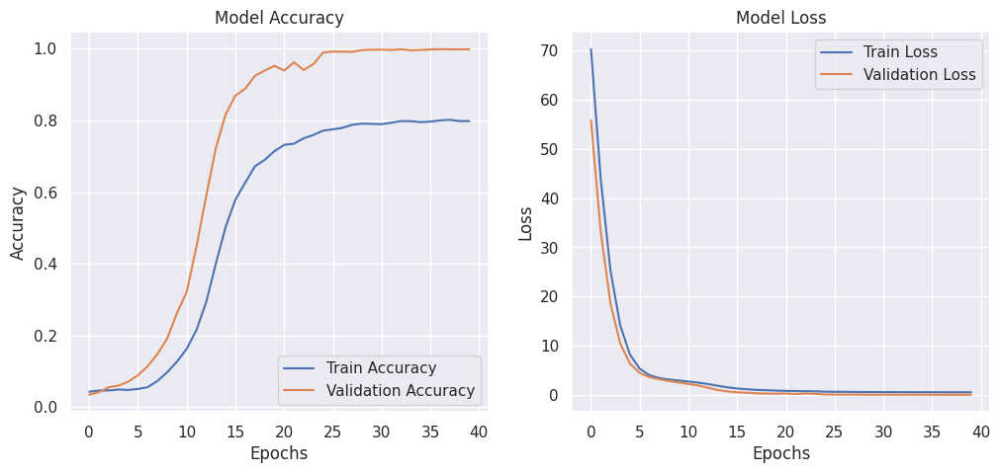

225/225 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step


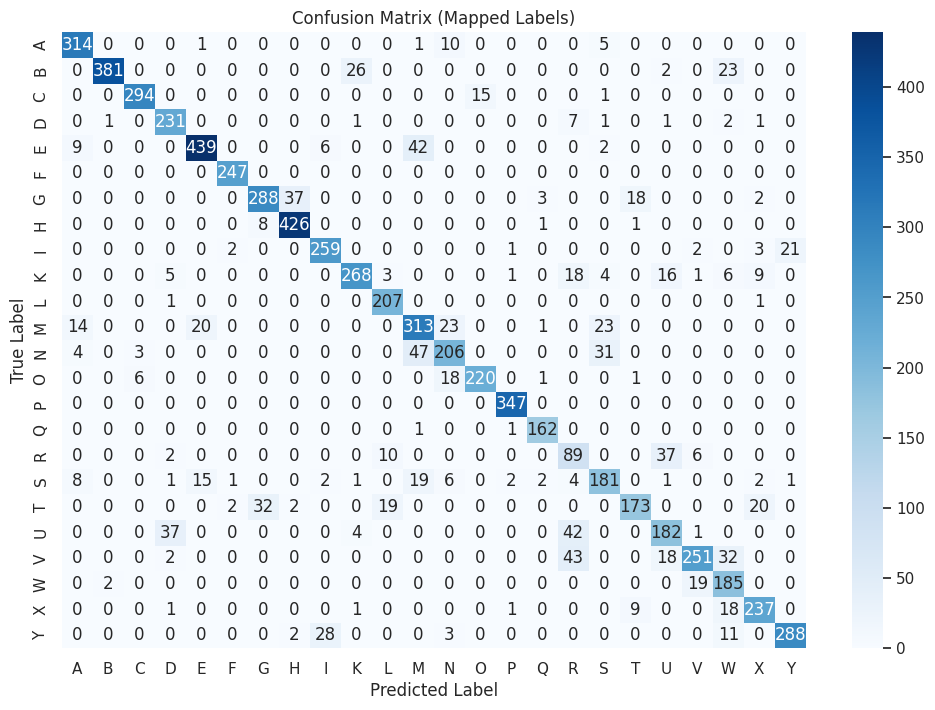

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.95      0.92       331
           1       0.99      0.88      0.93       432
           2       0.97      0.95      0.96       310
           3       0.82      0.94      0.88       245
           4       0.92      0.88      0.90       498
           5       0.98      1.00      0.99       247
           6       0.88      0.83      0.85       348
           7       0.91      0.98      0.94       436
           8       0.88      0.90      0.89       288
           9       0.89      0.81      0.85       331
          10       0.87      0.99      0.92       209
          11       0.74      0.79      0.77       394
          12       0.77      0.71      0.74       291
          13       0.94      0.89      0.91       246
          14       0.98      1.00      0.99       347
          15       0.95      0.99      0.97       164
          16       0.44      0.62      0.51       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import optuna
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define input shape and number of classes
input_shape = (32, 32, 1)  # Example input shape, change according to your dataset
num_classes = 24  # Example number of classes, change according to your dataset

# Ensure data is correctly split
assert X_train.shape[0] != X_valid.shape[0], "Training and Validation data should not overlap!"

# Define function to build a tunable ResNet-50 model
def build_model(trial, input_shape, num_classes):
    inputs = Input(shape=input_shape)
    base_model = ResNet50(weights=None, include_top=False, input_tensor=inputs)
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(trial.suggest_float('l2_reg', 0.08, 0.25)))(x)
    dropout_rate = trial.suggest_float("dropout_rate", 0.75, 0.9)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)

    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "sgd"])
    learning_rate = trial.suggest_float("learning_rate", 1e-6, 2e-4, log=True)
    optimizer = keras.optimizers.Adam(learning_rate) if optimizer_name == "adam" else keras.optimizers.SGD(learning_rate, momentum=0.9)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Objective function for Optuna
def objective(trial):
    print(f"Running trial with parameters: {trial.params}")
    model = build_model(trial, input_shape, num_classes)
    batch_size = trial.suggest_categorical("batch_size", [32, 64])
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)
    history = model.fit(X_train, y_train, epochs=40, batch_size=batch_size, validation_data=(X_valid, y_valid),
                        callbacks=[early_stopping, lr_reduction], verbose=1)
    val_accuracy = history.history['val_accuracy'][-1]
    return val_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

# Get best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train final model with best hyperparameters
final_model = build_model(optuna.trial.FixedTrial(best_params), input_shape, num_classes)
final_history = final_model.fit(X_train, y_train, epochs=40, batch_size=best_params["batch_size"],
                                validation_data=(X_valid, y_valid),
                                callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
                                           ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)])

# Evaluate final model
test_loss, test_acc = final_model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot learning curves
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(final_history.history['accuracy'], label='Train Accuracy')
ax[0].plot(final_history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(final_history.history['loss'], label='Train Loss')
ax[1].plot(final_history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()

# Generate predictions
y_pred = final_model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


# **RESNET-34**

[I 2025-02-27 11:53:13,497] A new study created in memory with name: no-name-82dfc1ab-97fe-4c14-af5e-4eac4d2e07e6


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 84s 212ms/step - accuracy: 0.0436 - loss: 96.5619 - val_accuracy: 0.0384 - val_loss: 91.5079 - learning_rate: 7.6389e-06
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - accuracy: 0.0425 - loss: 93.9953 - val_accuracy: 0.0395 - val_loss: 90.5762 - learning_rate: 7.6389e-06
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - accuracy: 0.0434 - loss: 92.2317 - val_accuracy: 0.0437 - val_loss: 89.7364 - learning_rate: 7.6389e-06
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - accuracy: 0.0432 - loss: 90.7953 - val_accuracy: 0.0457 - val_loss: 88.9950 - learning_rate: 7.6389e-06
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - accuracy: 0.0462 - loss: 89.4717 - val_accuracy: 0.0481 - val_loss: 87.9892 - learning_rate: 7.6389e-06
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - accuracy: 0.0431 - loss: 88.3678 - val_accuracy: 0.0470 - val_loss: 87.0383 - learning_rate: 7.6389e-06
Epoch 7/

[I 2025-02-27 11:58:35,181] Trial 0 finished with value: 0.05518120527267456 and parameters: {'l2_reg': 0.1957271841375861, 'dropout_rate': 0.7718583602431303, 'optimizer': 'sgd', 'learning_rate': 7.6388563444996e-06, 'batch_size': 128}. Best is trial 0 with value: 0.05518120527267456.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 70s 94ms/step - accuracy: 0.0379 - loss: 57.3288 - val_accuracy: 0.0466 - val_loss: 51.6686 - learning_rate: 1.1332e-05
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - accuracy: 0.0433 - loss: 52.9996 - val_accuracy: 0.0499 - val_loss: 50.8422 - learning_rate: 1.1332e-05
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - accuracy: 0.0458 - loss: 51.1896 - val_accuracy: 0.0521 - val_loss: 50.0116 - learning_rate: 1.1332e-05
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - accuracy: 0.0431 - loss: 50.1049 - val_accuracy: 0.0552 - val_loss: 49.1555 - learning_rate: 1.1332e-05
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - accuracy: 0.0480 - loss: 49.1726 - val_accuracy: 0.0563 - val_loss: 48.3718 - learning_rate: 1.1332e-05
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - accuracy: 0.0456 - loss: 48.3460 - val_accuracy: 0.0588 - val_loss: 47.6029 - learning_rate: 1.1332e-05
Epoch 

[I 2025-02-27 12:07:12,089] Trial 1 finished with value: 0.1076306700706482 and parameters: {'l2_reg': 0.10790116817419068, 'dropout_rate': 0.8353680893296418, 'optimizer': 'sgd', 'learning_rate': 1.1332078716874225e-05, 'batch_size': 64}. Best is trial 1 with value: 0.1076306700706482.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 61s 161ms/step - accuracy: 0.0461 - loss: 106.8132 - val_accuracy: 0.0475 - val_loss: 100.9083 - learning_rate: 1.9824e-05
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step - accuracy: 0.0427 - loss: 101.4645 - val_accuracy: 0.0435 - val_loss: 97.9379 - learning_rate: 1.9824e-05
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - accuracy: 0.0417 - loss: 97.8692 - val_accuracy: 0.0499 - val_loss: 95.0983 - learning_rate: 1.9824e-05
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - accuracy: 0.0469 - loss: 94.7604 - val_accuracy: 0.0555 - val_loss: 92.3485 - learning_rate: 1.9824e-05
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step - accuracy: 0.0445 - loss: 91.9115 - val_accuracy: 0.0523 - val_loss: 89.6941 - learning_rate: 1.9824e-05
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - accuracy: 0.0503 - loss: 89.1917 - val_accuracy: 0.0521 - val_loss: 87.0941 - learning_rate: 1.9824e-05
Epoch

[I 2025-02-27 12:11:56,255] Trial 2 finished with value: 0.10435257852077484 and parameters: {'l2_reg': 0.22081800031533017, 'dropout_rate': 0.8044535612691134, 'optimizer': 'sgd', 'learning_rate': 1.9824455171342043e-05, 'batch_size': 128}. Best is trial 1 with value: 0.1076306700706482.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 60s 160ms/step - accuracy: 0.0416 - loss: 52.1838 - val_accuracy: 0.0344 - val_loss: 47.7881 - learning_rate: 2.3303e-05
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.0428 - loss: 48.8378 - val_accuracy: 0.0413 - val_loss: 47.0660 - learning_rate: 2.3303e-05
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - accuracy: 0.0478 - loss: 47.3986 - val_accuracy: 0.0565 - val_loss: 46.3338 - learning_rate: 2.3303e-05
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step - accuracy: 0.0481 - loss: 46.4674 - val_accuracy: 0.0641 - val_loss: 45.6325 - learning_rate: 2.3303e-05
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - accuracy: 0.0451 - loss: 45.6639 - val_accuracy: 0.0674 - val_loss: 44.9388 - learning_rate: 2.3303e-05
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - accuracy: 0.0498 - loss: 44.9447 - val_accuracy: 0.0643 - val_loss: 44.2777 - learning_rate: 2.3303e-05
Epoch 7/

[I 2025-02-27 12:16:45,436] Trial 3 finished with value: 0.18612274527549744 and parameters: {'l2_reg': 0.09965592489175264, 'dropout_rate': 0.8064216948731968, 'optimizer': 'sgd', 'learning_rate': 2.3302535277646685e-05, 'batch_size': 128}. Best is trial 3 with value: 0.18612274527549744.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 92s 108ms/step - accuracy: 0.0447 - loss: 43.2810 - val_accuracy: 0.0446 - val_loss: 21.6096 - learning_rate: 9.6847e-05
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - accuracy: 0.0492 - loss: 17.2533 - val_accuracy: 0.0588 - val_loss: 8.2590 - learning_rate: 9.6847e-05
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - accuracy: 0.0735 - loss: 6.9022 - val_accuracy: 0.1461 - val_loss: 4.1267 - learning_rate: 9.6847e-05
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 39ms/step - accuracy: 0.1632 - loss: 3.7595 - val_accuracy: 0.3835 - val_loss: 2.4343 - learning_rate: 9.6847e-05
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - accuracy: 0.3528 - loss: 2.4084 - val_accuracy: 0.6339 - val_loss: 1.3701 - learning_rate: 9.6847e-05
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - accuracy: 0.6624 - loss: 1.3087 - val_accuracy: 0.8117 - val_loss: 0.7722 - learning_rate: 9.6847e-05
Epoch 7/25
344

[I 2025-02-27 12:21:28,243] Trial 4 finished with value: 0.935712993144989 and parameters: {'l2_reg': 0.10125726796359195, 'dropout_rate': 0.791085638344041, 'optimizer': 'adam', 'learning_rate': 9.684687624781655e-05, 'batch_size': 64}. Best is trial 4 with value: 0.935712993144989.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 95s 113ms/step - accuracy: 0.0419 - loss: 57.9065 - val_accuracy: 0.0355 - val_loss: 52.9066 - learning_rate: 2.5785e-06
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - accuracy: 0.0434 - loss: 55.1949 - val_accuracy: 0.0432 - val_loss: 52.2565 - learning_rate: 2.5785e-06
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - accuracy: 0.0453 - loss: 53.3925 - val_accuracy: 0.0524 - val_loss: 51.4230 - learning_rate: 2.5785e-06
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - accuracy: 0.0475 - loss: 51.9556 - val_accuracy: 0.0524 - val_loss: 50.5432 - learning_rate: 2.5785e-06
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - accuracy: 0.0425 - loss: 50.8146 - val_accuracy: 0.0488 - val_loss: 49.6344 - learning_rate: 2.5785e-06
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - accuracy: 0.0460 - loss: 49.7286 - val_accuracy: 0.0554 - val_loss: 48.6743 - learning_rate: 2.5785e-06
Epoch

[I 2025-02-27 12:29:48,446] Trial 5 finished with value: 0.06410489976406097 and parameters: {'l2_reg': 0.11004681598826377, 'dropout_rate': 0.791914572020601, 'optimizer': 'adam', 'learning_rate': 2.578523780972116e-06, 'batch_size': 64}. Best is trial 4 with value: 0.935712993144989.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 66s 91ms/step - accuracy: 0.0428 - loss: 68.3685 - val_accuracy: 0.0450 - val_loss: 62.5019 - learning_rate: 5.1886e-06
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - accuracy: 0.0429 - loss: 65.1435 - val_accuracy: 0.0408 - val_loss: 62.1109 - learning_rate: 5.1886e-06
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - accuracy: 0.0407 - loss: 63.2507 - val_accuracy: 0.0494 - val_loss: 61.3241 - learning_rate: 5.1886e-06
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - accuracy: 0.0446 - loss: 62.0765 - val_accuracy: 0.0463 - val_loss: 60.7357 - learning_rate: 5.1886e-06
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - accuracy: 0.0459 - loss: 61.2096 - val_accuracy: 0.0453 - val_loss: 60.1423 - learning_rate: 5.1886e-06
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - accuracy: 0.0459 - loss: 60.4669 - val_accuracy: 0.0504 - val_loss: 59.5877 - learning_rate: 5.1886e-06
Epoch 

[I 2025-02-27 12:38:09,196] Trial 6 finished with value: 0.05791294947266579 and parameters: {'l2_reg': 0.13121068438408584, 'dropout_rate': 0.8633918358275832, 'optimizer': 'sgd', 'learning_rate': 5.188642783465432e-06, 'batch_size': 64}. Best is trial 4 with value: 0.935712993144989.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 65s 90ms/step - accuracy: 0.0422 - loss: 76.3475 - val_accuracy: 0.0474 - val_loss: 70.5169 - learning_rate: 7.4028e-06
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - accuracy: 0.0425 - loss: 72.3619 - val_accuracy: 0.0455 - val_loss: 69.6619 - learning_rate: 7.4028e-06
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - accuracy: 0.0468 - loss: 70.1936 - val_accuracy: 0.0481 - val_loss: 68.5383 - learning_rate: 7.4028e-06
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.0433 - loss: 68.7666 - val_accuracy: 0.0526 - val_loss: 67.4301 - learning_rate: 7.4028e-06
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - accuracy: 0.0452 - loss: 67.5466 - val_accuracy: 0.0555 - val_loss: 66.4209 - learning_rate: 7.4028e-06
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - accuracy: 0.0451 - loss: 66.4552 - val_accuracy: 0.0565 - val_loss: 65.4531 - learning_rate: 7.4028e-06
Epoch 

[I 2025-02-27 12:46:23,070] Trial 7 finished with value: 0.0753961056470871 and parameters: {'l2_reg': 0.14990777637014419, 'dropout_rate': 0.8516387561844534, 'optimizer': 'sgd', 'learning_rate': 7.402781711386636e-06, 'batch_size': 64}. Best is trial 4 with value: 0.935712993144989.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 64s 163ms/step - accuracy: 0.0443 - loss: 108.6711 - val_accuracy: 0.0372 - val_loss: 87.6203 - learning_rate: 1.6042e-04
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 48s 52ms/step - accuracy: 0.0537 - loss: 82.3505 - val_accuracy: 0.0594 - val_loss: 67.8919 - learning_rate: 1.6042e-04
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.0562 - loss: 63.8368 - val_accuracy: 0.1390 - val_loss: 52.7177 - learning_rate: 1.6042e-04
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.0669 - loss: 49.6299 - val_accuracy: 0.1592 - val_loss: 41.0644 - learning_rate: 1.6042e-04
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.0850 - loss: 38.7219 - val_accuracy: 0.2043 - val_loss: 32.0927 - learning_rate: 1.6042e-04
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.1044 - loss: 30.3548 - val_accuracy: 0.2475 - val_loss: 25.1832 - learning_rate: 1.6042e-04
Epoch 7

[I 2025-02-27 12:51:56,505] Trial 8 finished with value: 0.9763249158859253 and parameters: {'l2_reg': 0.2390462647968798, 'dropout_rate': 0.8717422639858515, 'optimizer': 'sgd', 'learning_rate': 0.00016042181413072776, 'batch_size': 128}. Best is trial 8 with value: 0.9763249158859253.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 94s 216ms/step - accuracy: 0.0432 - loss: 46.8912 - val_accuracy: 0.0486 - val_loss: 41.5280 - learning_rate: 1.7844e-05
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 34s 59ms/step - accuracy: 0.0498 - loss: 41.3055 - val_accuracy: 0.0450 - val_loss: 39.0671 - learning_rate: 1.7844e-05
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.0435 - loss: 38.5315 - val_accuracy: 0.0426 - val_loss: 36.3588 - learning_rate: 1.7844e-05
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - accuracy: 0.0469 - loss: 35.7232 - val_accuracy: 0.0404 - val_loss: 33.5537 - learning_rate: 1.7844e-05
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.0484 - loss: 32.8918 - val_accuracy: 0.0537 - val_loss: 30.7538 - learning_rate: 1.7844e-05
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - accuracy: 0.0459 - loss: 30.1063 - val_accuracy: 0.0541 - val_loss: 28.0402 - learning_rate: 1.7844e-05
Epoch

[I 2025-02-27 12:57:58,644] Trial 9 finished with value: 0.5512657165527344 and parameters: {'l2_reg': 0.08873295073476689, 'dropout_rate': 0.8470352093642847, 'optimizer': 'adam', 'learning_rate': 1.7844318293773063e-05, 'batch_size': 128}. Best is trial 8 with value: 0.9763249158859253.


Best Hyperparameters: {'l2_reg': 0.2390462647968798, 'dropout_rate': 0.8717422639858515, 'optimizer': 'sgd', 'learning_rate': 0.00016042181413072776, 'batch_size': 128}
Epoch 1/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 63s 172ms/step - accuracy: 0.0451 - loss: 109.0722 - val_accuracy: 0.0455 - val_loss: 87.8264 - learning_rate: 1.6042e-04
Epoch 2/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.0561 - loss: 82.5327 - val_accuracy: 0.0747 - val_loss: 68.0432 - learning_rate: 1.6042e-04
Epoch 3/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.0698 - loss: 63.9413 - val_accuracy: 0.1674 - val_loss: 52.7687 - learning_rate: 1.6042e-04
Epoch 4/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.0902 - loss: 49.6833 - val_accuracy: 0.2138 - val_loss: 41.0217 - learning_rate: 1.6042e-04
Epoch 5/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.1170 - loss: 38.7139 - val_accuracy: 0.2510 - val_loss: 31.9816 - learning_rate: 1.6042e-04
Epoch 6/40
172/172 ━━━━━━━━━━━━━

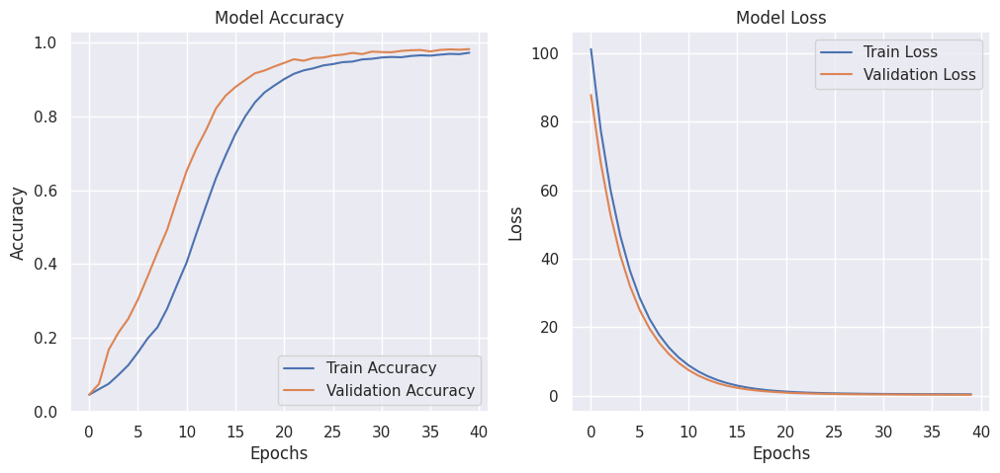

225/225 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step


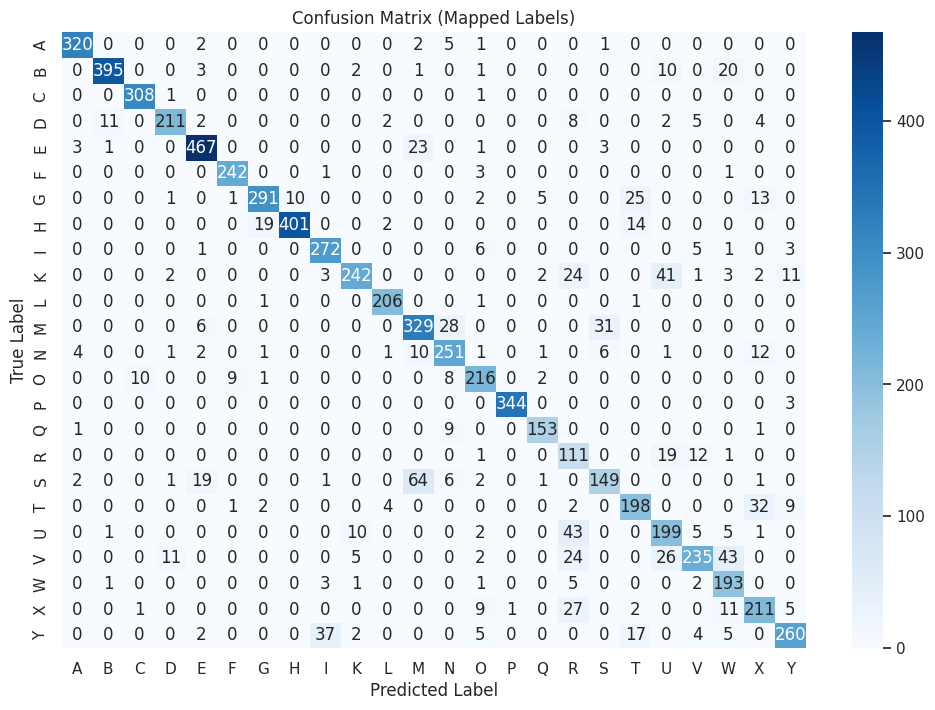

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97       331
           1       0.97      0.91      0.94       432
           2       0.97      0.99      0.98       310
           3       0.93      0.86      0.89       245
           4       0.93      0.94      0.93       498
           5       0.96      0.98      0.97       247
           6       0.92      0.84      0.88       348
           7       0.98      0.92      0.95       436
           8       0.86      0.94      0.90       288
           9       0.92      0.73      0.82       331
          10       0.96      0.99      0.97       209
          11       0.77      0.84      0.80       394
          12       0.82      0.86      0.84       291
          13       0.85      0.88      0.86       246
          14       1.00      0.99      0.99       347
          15       0.93      0.93      0.93       164
          16       0.45      0.77      0.57       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import optuna
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50 as ResNet34
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define input shape and number of classes
input_shape = (32, 32, 1)  # Example input shape, change according to your dataset
num_classes = 24  # Example number of classes, change according to your dataset

# Ensure data is correctly split
assert X_train.shape[0] != X_valid.shape[0], "Training and Validation data should not overlap!"

# Define function to build a tunable ResNet-50 model
def build_model(trial, input_shape, num_classes):
    inputs = Input(shape=input_shape)
    base_model = ResNet34(weights=None, include_top=False, input_tensor=inputs)
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(trial.suggest_float('l2_reg', 0.08, 0.25)))(x)
    dropout_rate = trial.suggest_float("dropout_rate", 0.75, 0.9)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)

    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "sgd"])
    learning_rate = trial.suggest_float("learning_rate", 1e-6, 2e-4, log=True)
    optimizer = keras.optimizers.Adam(learning_rate) if optimizer_name == "adam" else keras.optimizers.SGD(learning_rate, momentum=0.9)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Objective function for Optuna
def objective(trial):
    print(f"Running trial with parameters: {trial.params}")
    model = build_model(trial, input_shape, num_classes)
    batch_size = trial.suggest_categorical("batch_size", [64, 128])
    early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
    lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=2, min_lr=1e-7)
    history = model.fit(X_train, y_train, epochs=25, batch_size=batch_size, validation_data=(X_valid, y_valid),
                        callbacks=[early_stopping, lr_reduction], verbose=1)
    val_accuracy = history.history['val_accuracy'][-1]
    return val_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

# Get best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train final model with best hyperparameters
final_model = build_model(optuna.trial.FixedTrial(best_params), input_shape, num_classes)
final_history = final_model.fit(X_train, y_train, epochs=40, batch_size=best_params["batch_size"],
                                validation_data=(X_valid, y_valid),
                                callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
                                           ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)])

# Evaluate final model
test_loss, test_acc = final_model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot learning curves
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(final_history.history['accuracy'], label='Train Accuracy')
ax[0].plot(final_history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(final_history.history['loss'], label='Train Loss')
ax[1].plot(final_history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()

# Generate predictions
y_pred = final_model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


# **VGG-16**

[I 2025-02-27 14:47:24,744] A new study created in memory with name: no-name-36ff5573-2131-40a8-b3e5-440718409a0b


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.0427 - loss: 41.0560 - val_accuracy: 0.0466 - val_loss: 38.6979 - learning_rate: 5.5105e-05
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - accuracy: 0.0472 - loss: 37.9501 - val_accuracy: 0.0466 - val_loss: 35.7765 - learning_rate: 5.5105e-05
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - accuracy: 0.0488 - loss: 35.0902 - val_accuracy: 0.0466 - val_loss: 33.0953 - learning_rate: 5.5105e-05
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - accuracy: 0.0467 - loss: 32.4655 - val_accuracy: 0.0466 - val_loss: 30.6347 - learning_rate: 5.5105e-05
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - accuracy: 0.0504 - loss: 30.0566 - val_accuracy: 0.0466 - val_loss: 28.3764 - learning_rate: 5.5105e-05
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - accuracy: 0.0485 - loss: 27.8460 - val_accuracy: 0.0466 - val_loss: 26.3039 - learning_rate: 5.5105e-05
Epoch 

[I 2025-02-27 14:54:56,748] Trial 0 finished with value: 0.046621743589639664 and parameters: {'l2_reg': 0.11305467499474553, 'dropout_rate': 0.7865679667392792, 'optimizer': 'sgd', 'learning_rate': 5.510497299375946e-05, 'batch_size': 64}. Best is trial 0 with value: 0.046621743589639664.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - accuracy: 0.0399 - loss: 71.5250 - val_accuracy: 0.0472 - val_loss: 51.7754 - learning_rate: 7.4791e-05
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.0451 - loss: 46.7296 - val_accuracy: 0.0781 - val_loss: 33.6232 - learning_rate: 7.4791e-05
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.0764 - loss: 30.3030 - val_accuracy: 0.0991 - val_loss: 21.5778 - learning_rate: 7.4791e-05
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.1062 - loss: 19.5124 - val_accuracy: 0.2249 - val_loss: 13.6106 - learning_rate: 7.4791e-05
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - accuracy: 0.2056 - loss: 12.3734 - val_accuracy: 0.5214 - val_loss: 8.0189 - learning_rate: 7.4791e-05
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - accuracy: 0.3693 - loss: 7.6631 - val_accuracy: 0.7917 - val_loss: 4.6401 - learning_rate: 7.4791e-05
Epoch 7/

[I 2025-02-27 15:02:47,348] Trial 1 finished with value: 0.9996357560157776 and parameters: {'l2_reg': 0.22289395604901102, 'dropout_rate': 0.8950726626230208, 'optimizer': 'adam', 'learning_rate': 7.479141272262204e-05, 'batch_size': 128}. Best is trial 1 with value: 0.9996357560157776.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - accuracy: 0.0413 - loss: 41.7838 - val_accuracy: 0.0459 - val_loss: 41.4204 - learning_rate: 1.6330e-05
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.0438 - loss: 41.2986 - val_accuracy: 0.0433 - val_loss: 40.9348 - learning_rate: 1.6330e-05
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - accuracy: 0.0429 - loss: 40.8145 - val_accuracy: 0.0523 - val_loss: 40.4554 - learning_rate: 1.6330e-05
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.0461 - loss: 40.3366 - val_accuracy: 0.0495 - val_loss: 39.9820 - learning_rate: 1.6330e-05
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - accuracy: 0.0473 - loss: 39.8648 - val_accuracy: 0.0475 - val_loss: 39.5147 - learning_rate: 1.6330e-05
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - accuracy: 0.0440 - loss: 39.3990 - val_accuracy: 0.0466 - val_loss: 39.0533 - learning_rate: 1.6330e-05
Epoch 

[I 2025-02-27 15:09:31,051] Trial 2 finished with value: 0.046621743589639664 and parameters: {'l2_reg': 0.1136998313494268, 'dropout_rate': 0.858522264107062, 'optimizer': 'sgd', 'learning_rate': 1.63299541550512e-05, 'batch_size': 128}. Best is trial 1 with value: 0.9996357560157776.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - accuracy: 0.0418 - loss: 65.1069 - val_accuracy: 0.0472 - val_loss: 56.8382 - learning_rate: 1.4739e-04
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - accuracy: 0.0483 - loss: 54.3612 - val_accuracy: 0.0472 - val_loss: 47.4339 - learning_rate: 1.4739e-04
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.0459 - loss: 45.3911 - val_accuracy: 0.0472 - val_loss: 39.6777 - learning_rate: 1.4739e-04
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.0457 - loss: 37.9930 - val_accuracy: 0.0472 - val_loss: 33.2809 - learning_rate: 1.4739e-04
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - accuracy: 0.0486 - loss: 31.8912 - val_accuracy: 0.0472 - val_loss: 28.0051 - learning_rate: 1.4739e-04
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - accuracy: 0.0466 - loss: 26.8590 - val_accuracy: 0.0472 - val_loss: 23.6539 - learning_rate: 1.4739e-04
Epoch 

[I 2025-02-27 15:16:25,149] Trial 3 finished with value: 0.04716809466481209 and parameters: {'l2_reg': 0.18900665506393233, 'dropout_rate': 0.8108751627346953, 'optimizer': 'sgd', 'learning_rate': 0.00014738574348220984, 'batch_size': 128}. Best is trial 1 with value: 0.9996357560157776.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.0431 - loss: 56.9262 - val_accuracy: 0.0444 - val_loss: 56.8294 - learning_rate: 1.1137e-06
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step - accuracy: 0.0432 - loss: 56.7970 - val_accuracy: 0.0435 - val_loss: 56.7001 - learning_rate: 1.1137e-06
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - accuracy: 0.0412 - loss: 56.6679 - val_accuracy: 0.0435 - val_loss: 56.5711 - learning_rate: 1.1137e-06
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - accuracy: 0.0452 - loss: 56.5389 - val_accuracy: 0.0435 - val_loss: 56.4424 - learning_rate: 1.1137e-06
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - accuracy: 0.0417 - loss: 56.4103 - val_accuracy: 0.0430 - val_loss: 56.3141 - learning_rate: 1.1137e-06
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - accuracy: 0.0421 - loss: 56.2821 - val_accuracy: 0.0413 - val_loss: 56.1861 - learning_rate: 1.1137e-06
Epoch 

[I 2025-02-27 15:24:06,502] Trial 4 finished with value: 0.04716809466481209 and parameters: {'l2_reg': 0.15743331165974694, 'dropout_rate': 0.8991051342116445, 'optimizer': 'sgd', 'learning_rate': 1.113707465566757e-06, 'batch_size': 64}. Best is trial 1 with value: 0.9996357560157776.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - accuracy: 0.0440 - loss: 69.5185 - val_accuracy: 0.0497 - val_loss: 67.1995 - learning_rate: 1.7553e-05
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - accuracy: 0.0467 - loss: 66.4462 - val_accuracy: 0.0472 - val_loss: 64.2254 - learning_rate: 1.7553e-05
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - accuracy: 0.0445 - loss: 63.5070 - val_accuracy: 0.0472 - val_loss: 61.3894 - learning_rate: 1.7553e-05
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - accuracy: 0.0470 - loss: 60.7044 - val_accuracy: 0.0472 - val_loss: 58.6851 - learning_rate: 1.7553e-05
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step - accuracy: 0.0468 - loss: 58.0320 - val_accuracy: 0.0472 - val_loss: 56.1065 - learning_rate: 1.7553e-05
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step - accuracy: 0.0485 - loss: 55.4837 - val_accuracy: 0.0472 - val_loss: 53.6477 - learning_rate: 1.7553e-05
Epoch 

[I 2025-02-27 15:31:01,181] Trial 5 finished with value: 0.04716809466481209 and parameters: {'l2_reg': 0.19682317180337275, 'dropout_rate': 0.8844000585000064, 'optimizer': 'sgd', 'learning_rate': 1.7552540756485198e-05, 'batch_size': 64}. Best is trial 1 with value: 0.9996357560157776.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.0411 - loss: 38.2219 - val_accuracy: 0.0424 - val_loss: 38.1771 - learning_rate: 1.2142e-06
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - accuracy: 0.0407 - loss: 38.1622 - val_accuracy: 0.0424 - val_loss: 38.1173 - learning_rate: 1.2142e-06
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - accuracy: 0.0420 - loss: 38.1023 - val_accuracy: 0.0424 - val_loss: 38.0575 - learning_rate: 1.2142e-06
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - accuracy: 0.0426 - loss: 38.0426 - val_accuracy: 0.0424 - val_loss: 37.9979 - learning_rate: 1.2142e-06
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step - accuracy: 0.0420 - loss: 37.9830 - val_accuracy: 0.0424 - val_loss: 37.9383 - learning_rate: 1.2142e-06
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - accuracy: 0.0422 - loss: 37.9234 - val_accuracy: 0.0390 - val_loss: 37.8788 - learning_rate: 1.2142e-06
Epoch 

[I 2025-02-27 15:38:11,805] Trial 6 finished with value: 0.04461846500635147 and parameters: {'l2_reg': 0.1024949832833251, 'dropout_rate': 0.8124765684489388, 'optimizer': 'sgd', 'learning_rate': 1.2142010916022012e-06, 'batch_size': 64}. Best is trial 1 with value: 0.9996357560157776.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - accuracy: 0.0434 - loss: 63.5995 - val_accuracy: 0.0472 - val_loss: 55.6488 - learning_rate: 7.3797e-05
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - accuracy: 0.0467 - loss: 53.2851 - val_accuracy: 0.0472 - val_loss: 46.6648 - learning_rate: 7.3797e-05
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step - accuracy: 0.0437 - loss: 44.7058 - val_accuracy: 0.0472 - val_loss: 39.2191 - learning_rate: 7.3797e-05
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step - accuracy: 0.0433 - loss: 37.5955 - val_accuracy: 0.0472 - val_loss: 33.0481 - learning_rate: 7.3797e-05
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step - accuracy: 0.0447 - loss: 31.7025 - val_accuracy: 0.0472 - val_loss: 27.9338 - learning_rate: 7.3797e-05
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - accuracy: 0.0460 - loss: 26.8185 - val_accuracy: 0.0472 - val_loss: 23.6950 - learning_rate: 7.3797e-05
Epoch 

[I 2025-02-27 15:45:15,173] Trial 7 finished with value: 0.04716809466481209 and parameters: {'l2_reg': 0.18445903156127236, 'dropout_rate': 0.8477844196085166, 'optimizer': 'sgd', 'learning_rate': 7.379732926167108e-05, 'batch_size': 64}. Best is trial 1 with value: 0.9996357560157776.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - accuracy: 0.0413 - loss: 64.8058 - val_accuracy: 0.0472 - val_loss: 33.2058 - learning_rate: 1.5052e-04
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.0511 - loss: 27.1430 - val_accuracy: 0.1073 - val_loss: 13.6873 - learning_rate: 1.5052e-04
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.1190 - loss: 11.3054 - val_accuracy: 0.2816 - val_loss: 5.7942 - learning_rate: 1.5052e-04
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - accuracy: 0.2993 - loss: 4.8215 - val_accuracy: 0.6170 - val_loss: 2.0970 - learning_rate: 1.5052e-04
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5600 - loss: 2.1245 - val_accuracy: 0.8179 - val_loss: 0.9118 - learning_rate: 1.5052e-04
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - accuracy: 0.7392 - loss: 1.0778 - val_accuracy: 0.9242 - val_loss: 0.4432 - learning_rate: 1.5052e-04
Epoch 7/25
1

[I 2025-02-27 15:48:56,190] Trial 8 finished with value: 0.9918047785758972 and parameters: {'l2_reg': 0.22174321867011493, 'dropout_rate': 0.865151344990714, 'optimizer': 'adam', 'learning_rate': 0.00015051753775269616, 'batch_size': 128}. Best is trial 1 with value: 0.9996357560157776.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - accuracy: 0.0436 - loss: 46.8726 - val_accuracy: 0.0628 - val_loss: 46.2259 - learning_rate: 1.7021e-06
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.0576 - loss: 46.0129 - val_accuracy: 0.0996 - val_loss: 45.3776 - learning_rate: 1.7021e-06
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step - accuracy: 0.0732 - loss: 45.1671 - val_accuracy: 0.0883 - val_loss: 44.5273 - learning_rate: 1.7021e-06
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step - accuracy: 0.0855 - loss: 44.3019 - val_accuracy: 0.1288 - val_loss: 43.5435 - learning_rate: 1.7021e-06
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step - accuracy: 0.1131 - loss: 43.3464 - val_accuracy: 0.1719 - val_loss: 42.5920 - learning_rate: 1.7021e-06
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.1375 - loss: 42.4645 - val_accuracy: 0.2295 - val_loss: 41.7145 - learning_rate: 1.7021e-06
Epoch 

[I 2025-02-27 15:57:35,617] Trial 9 finished with value: 0.5270442366600037 and parameters: {'l2_reg': 0.12826313096319442, 'dropout_rate': 0.7584585593011053, 'optimizer': 'adam', 'learning_rate': 1.7020679388587863e-06, 'batch_size': 64}. Best is trial 1 with value: 0.9996357560157776.


Best Hyperparameters: {'l2_reg': 0.22289395604901102, 'dropout_rate': 0.8950726626230208, 'optimizer': 'adam', 'learning_rate': 7.479141272262204e-05, 'batch_size': 128}
Epoch 1/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.0417 - loss: 71.9297 - val_accuracy: 0.0472 - val_loss: 52.0861 - learning_rate: 7.4791e-05
Epoch 2/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.0464 - loss: 46.9994 - val_accuracy: 0.1322 - val_loss: 33.6745 - learning_rate: 7.4791e-05
Epoch 3/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.1175 - loss: 30.3538 - val_accuracy: 0.2444 - val_loss: 21.3815 - learning_rate: 7.4791e-05
Epoch 4/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - accuracy: 0.2262 - loss: 19.3220 - val_accuracy: 0.4342 - val_loss: 13.1832 - learning_rate: 7.4791e-05
Epoch 5/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.3600 - loss: 12.0599 - val_accuracy: 0.6844 - val_loss: 7.7129 - learning_rate: 7.4791e-05
Epoch 6/40
172/172 ━━━━━━━━━━━

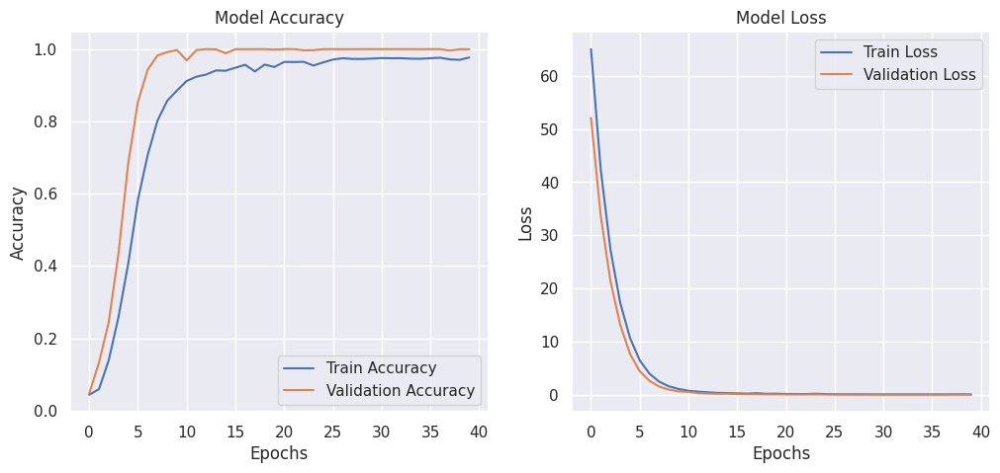

225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step


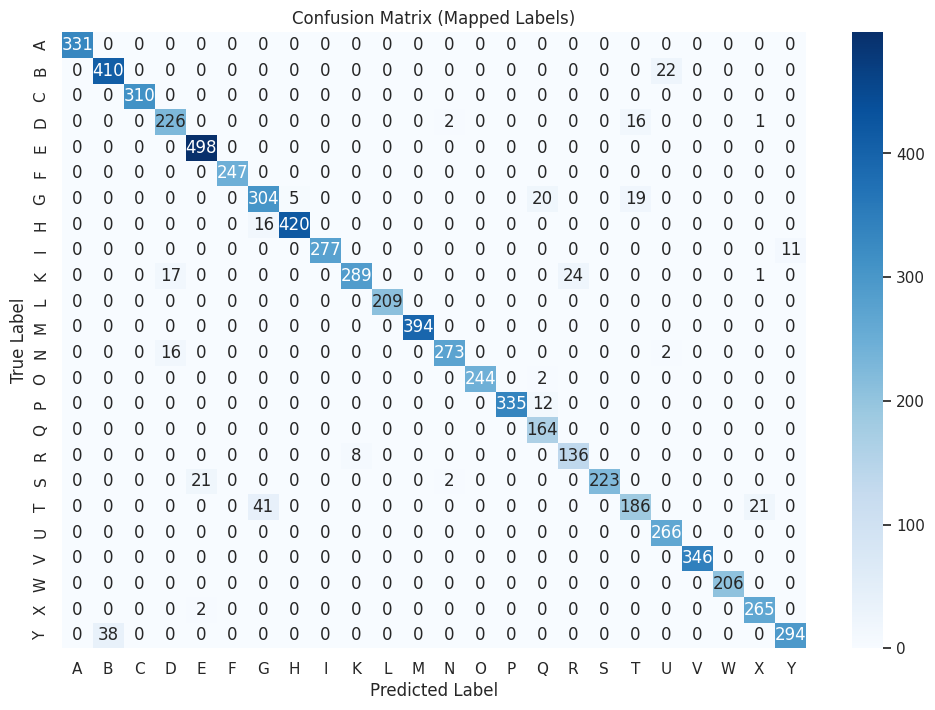

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       331
           1       0.92      0.95      0.93       432
           2       1.00      1.00      1.00       310
           3       0.87      0.92      0.90       245
           4       0.96      1.00      0.98       498
           5       1.00      1.00      1.00       247
           6       0.84      0.87      0.86       348
           7       0.99      0.96      0.98       436
           8       1.00      0.96      0.98       288
           9       0.97      0.87      0.92       331
          10       1.00      1.00      1.00       209
          11       1.00      1.00      1.00       394
          12       0.99      0.94      0.96       291
          13       1.00      0.99      1.00       246
          14       1.00      0.97      0.98       347
          15       0.83      1.00      0.91       164
          16       0.85      0.94      0.89       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import optuna
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define input shape and number of classes
input_shape = (32, 32, 1)  # Example input shape, change according to your dataset
num_classes = 24  # Example number of classes, change according to your dataset

# Ensure data is correctly split
assert X_train.shape[0] != X_valid.shape[0], "Training and Validation data should not overlap!"

# Define function to build a tunable ResNet-50 model
def build_model(trial, input_shape, num_classes):
    inputs = Input(shape=input_shape)
    base_model = VGG16(weights=None, include_top=False, input_tensor=inputs)
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(trial.suggest_float('l2_reg', 0.08, 0.25)))(x)
    dropout_rate = trial.suggest_float("dropout_rate", 0.75, 0.9)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)

    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "sgd"])
    learning_rate = trial.suggest_float("learning_rate", 1e-6, 2e-4, log=True)
    optimizer = keras.optimizers.Adam(learning_rate) if optimizer_name == "adam" else keras.optimizers.SGD(learning_rate, momentum=0.9)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Objective function for Optuna
def objective(trial):
    print(f"Running trial with parameters: {trial.params}")
    model = build_model(trial, input_shape, num_classes)
    batch_size = trial.suggest_categorical("batch_size", [64, 128])
    early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
    lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=2, min_lr=1e-7)
    history = model.fit(X_train, y_train, epochs=25, batch_size=batch_size, validation_data=(X_valid, y_valid),
                        callbacks=[early_stopping, lr_reduction], verbose=1)
    val_accuracy = history.history['val_accuracy'][-1]
    return val_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

# Get best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train final model with best hyperparameters
final_model = build_model(optuna.trial.FixedTrial(best_params), input_shape, num_classes)
final_history = final_model.fit(X_train, y_train, epochs=40, batch_size=best_params["batch_size"],
                                validation_data=(X_valid, y_valid),
                                callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
                                           ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)])

# Evaluate final model
test_loss, test_acc = final_model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot learning curves
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(final_history.history['accuracy'], label='Train Accuracy')
ax[0].plot(final_history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(final_history.history['loss'], label='Train Loss')
ax[1].plot(final_history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()

# Generate predictions
y_pred = final_model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


# **VGG-19**

[I 2025-02-27 16:12:10,473] A new study created in memory with name: no-name-575612ee-f32f-46a2-bd86-3729e2ed9d00


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - accuracy: 0.0433 - loss: 44.2346 - val_accuracy: 0.0645 - val_loss: 43.8077 - learning_rate: 1.1917e-06
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.0515 - loss: 43.6667 - val_accuracy: 0.0688 - val_loss: 43.2461 - learning_rate: 1.1917e-06
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.0499 - loss: 43.1069 - val_accuracy: 0.0991 - val_loss: 42.6908 - learning_rate: 1.1917e-06
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.0608 - loss: 42.5517 - val_accuracy: 0.0967 - val_loss: 42.1258 - learning_rate: 1.1917e-06
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - accuracy: 0.0677 - loss: 41.9753 - val_accuracy: 0.1171 - val_loss: 41.4883 - learning_rate: 1.1917e-06
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.0831 - loss: 41.3717 - val_accuracy: 0.1076 - val_loss: 40.8855 - learning_rate: 1.1917e-06
Epoch 

[I 2025-02-27 16:27:51,791] Trial 0 finished with value: 0.26188308000564575 and parameters: {'l2_reg': 0.12064328412216527, 'dropout_rate': 0.8215797033689106, 'optimizer': 'adam', 'learning_rate': 1.1917333498852622e-06, 'batch_size': 64}. Best is trial 0 with value: 0.26188308000564575.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - accuracy: 0.0417 - loss: 67.0610 - val_accuracy: 0.0446 - val_loss: 66.6750 - learning_rate: 3.1558e-06
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - accuracy: 0.0429 - loss: 66.5465 - val_accuracy: 0.0455 - val_loss: 66.1620 - learning_rate: 3.1558e-06
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - accuracy: 0.0465 - loss: 66.0345 - val_accuracy: 0.0477 - val_loss: 65.6532 - learning_rate: 3.1558e-06
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.0475 - loss: 65.5267 - val_accuracy: 0.0472 - val_loss: 65.1484 - learning_rate: 3.1558e-06
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - accuracy: 0.0464 - loss: 65.0230 - val_accuracy: 0.0472 - val_loss: 64.6478 - learning_rate: 3.1558e-06
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - accuracy: 0.0456 - loss: 64.5233 - val_accuracy: 0.0472 - val_loss: 64.1511 - learning_rate: 3.1558e-06
Epoch 

[I 2025-02-27 16:36:07,562] Trial 1 finished with value: 0.04716809466481209 and parameters: {'l2_reg': 0.18678760301863517, 'dropout_rate': 0.8507041503670602, 'optimizer': 'sgd', 'learning_rate': 3.1557725974500192e-06, 'batch_size': 64}. Best is trial 0 with value: 0.26188308000564575.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - accuracy: 0.0428 - loss: 63.1138 - val_accuracy: 0.0428 - val_loss: 62.9492 - learning_rate: 1.5262e-06
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.0481 - loss: 62.8942 - val_accuracy: 0.0517 - val_loss: 62.7294 - learning_rate: 1.5262e-06
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - accuracy: 0.0470 - loss: 62.6746 - val_accuracy: 0.0466 - val_loss: 62.5104 - learning_rate: 1.5262e-06
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 51ms/step - accuracy: 0.0424 - loss: 62.4558 - val_accuracy: 0.0466 - val_loss: 62.2923 - learning_rate: 1.5262e-06
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 51ms/step - accuracy: 0.0431 - loss: 62.2379 - val_accuracy: 0.0466 - val_loss: 62.0749 - learning_rate: 1.5262e-06
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - accuracy: 0.0438 - loss: 62.0207 - val_accuracy: 0.0466 - val_loss: 61.8584 - learning_rate: 1.5262e-06
Epoch 

[I 2025-02-27 16:44:23,530] Trial 2 finished with value: 0.04716809466481209 and parameters: {'l2_reg': 0.17541045137061054, 'dropout_rate': 0.7910142113164166, 'optimizer': 'sgd', 'learning_rate': 1.5261621029434086e-06, 'batch_size': 64}. Best is trial 0 with value: 0.26188308000564575.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - accuracy: 0.0445 - loss: 62.1624 - val_accuracy: 0.0452 - val_loss: 61.4956 - learning_rate: 2.5945e-06
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - accuracy: 0.0475 - loss: 61.2755 - val_accuracy: 0.0455 - val_loss: 60.6183 - learning_rate: 2.5945e-06
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - accuracy: 0.0469 - loss: 60.4012 - val_accuracy: 0.0583 - val_loss: 59.7527 - learning_rate: 2.5945e-06
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - accuracy: 0.0513 - loss: 59.5380 - val_accuracy: 0.0761 - val_loss: 58.8882 - learning_rate: 2.5945e-06
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - accuracy: 0.0622 - loss: 58.6687 - val_accuracy: 0.1104 - val_loss: 57.9701 - learning_rate: 2.5945e-06
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - accuracy: 0.0787 - loss: 57.7822 - val_accuracy: 0.1388 - val_loss: 57.0805 - learning_rate: 2.5945e-06
Epoch

[I 2025-02-27 16:52:53,613] Trial 3 finished with value: 0.4272445738315582 and parameters: {'l2_reg': 0.17338607661300354, 'dropout_rate': 0.8855232128271816, 'optimizer': 'adam', 'learning_rate': 2.5944597093612872e-06, 'batch_size': 128}. Best is trial 3 with value: 0.4272445738315582.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 31s 128ms/step - accuracy: 0.0428 - loss: 60.8565 - val_accuracy: 0.0452 - val_loss: 52.6723 - learning_rate: 3.4339e-05
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - accuracy: 0.0546 - loss: 50.2185 - val_accuracy: 0.1874 - val_loss: 42.9296 - learning_rate: 3.4339e-05
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - accuracy: 0.1833 - loss: 40.9525 - val_accuracy: 0.4591 - val_loss: 34.5793 - learning_rate: 3.4339e-05
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - accuracy: 0.3753 - loss: 33.0884 - val_accuracy: 0.6889 - val_loss: 27.6363 - learning_rate: 3.4339e-05
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - accuracy: 0.5718 - loss: 26.6675 - val_accuracy: 0.8474 - val_loss: 22.1749 - learning_rate: 3.4339e-05
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - accuracy: 0.7508 - loss: 21.4129 - val_accuracy: 0.9244 - val_loss: 17.9263 - learning_rate: 3.4339e-05
Epoch

[I 2025-02-27 17:01:31,213] Trial 4 finished with value: 0.9985430836677551 and parameters: {'l2_reg': 0.1776157820407918, 'dropout_rate': 0.7914413500732256, 'optimizer': 'adam', 'learning_rate': 3.4338667716204765e-05, 'batch_size': 128}. Best is trial 4 with value: 0.9985430836677551.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 24s 104ms/step - accuracy: 0.0460 - loss: 35.2476 - val_accuracy: 0.0614 - val_loss: 34.9348 - learning_rate: 2.0443e-05
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - accuracy: 0.0496 - loss: 34.8299 - val_accuracy: 0.0466 - val_loss: 34.5168 - learning_rate: 2.0443e-05
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - accuracy: 0.0501 - loss: 34.4133 - val_accuracy: 0.0466 - val_loss: 34.1043 - learning_rate: 2.0443e-05
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.0487 - loss: 34.0022 - val_accuracy: 0.0466 - val_loss: 33.6972 - learning_rate: 2.0443e-05
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.0450 - loss: 33.5965 - val_accuracy: 0.0466 - val_loss: 33.2956 - learning_rate: 2.0443e-05
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.0478 - loss: 33.1961 - val_accuracy: 0.0466 - val_loss: 32.8992 - learning_rate: 2.0443e-05
Epoch

[I 2025-02-27 17:08:51,836] Trial 5 finished with value: 0.046621743589639664 and parameters: {'l2_reg': 0.09416455186020427, 'dropout_rate': 0.7849207256942035, 'optimizer': 'sgd', 'learning_rate': 2.0442609796210348e-05, 'batch_size': 128}. Best is trial 4 with value: 0.9985430836677551.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 24s 108ms/step - accuracy: 0.0428 - loss: 39.7167 - val_accuracy: 0.0432 - val_loss: 38.5696 - learning_rate: 5.7809e-05
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - accuracy: 0.0455 - loss: 38.1923 - val_accuracy: 0.0432 - val_loss: 37.0777 - learning_rate: 5.7809e-05
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.0420 - loss: 36.7162 - val_accuracy: 0.0432 - val_loss: 35.6487 - learning_rate: 5.7809e-05
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.0437 - loss: 35.3025 - val_accuracy: 0.0490 - val_loss: 34.2799 - learning_rate: 5.7809e-05
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.0443 - loss: 33.9483 - val_accuracy: 0.0554 - val_loss: 32.9688 - learning_rate: 5.7809e-05
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - accuracy: 0.0435 - loss: 32.6512 - val_accuracy: 0.0472 - val_loss: 31.7130 - learning_rate: 5.7809e-05
Epoch

[I 2025-02-27 17:17:04,901] Trial 6 finished with value: 0.04716809466481209 and parameters: {'l2_reg': 0.10815497834823092, 'dropout_rate': 0.8600374305291537, 'optimizer': 'sgd', 'learning_rate': 5.780906296892091e-05, 'batch_size': 128}. Best is trial 4 with value: 0.9985430836677551.


Running trial with parameters: {}
Epoch 1/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - accuracy: 0.0427 - loss: 37.9717 - val_accuracy: 0.0437 - val_loss: 36.3989 - learning_rate: 1.0527e-05
Epoch 2/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - accuracy: 0.0659 - loss: 35.8528 - val_accuracy: 0.1113 - val_loss: 34.1150 - learning_rate: 1.0527e-05
Epoch 3/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - accuracy: 0.1146 - loss: 33.6991 - val_accuracy: 0.1788 - val_loss: 32.0885 - learning_rate: 1.0527e-05
Epoch 4/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - accuracy: 0.1503 - loss: 31.7393 - val_accuracy: 0.2144 - val_loss: 30.1725 - learning_rate: 1.0527e-05
Epoch 5/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - accuracy: 0.1881 - loss: 29.9011 - val_accuracy: 0.2643 - val_loss: 28.4562 - learning_rate: 1.0527e-05
Epoch 6/25
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - accuracy: 0.2165 - loss: 28.2372 - val_accuracy: 0.3085 - val_loss: 26.8364 - learning_rate: 1.0527e-05
Epoch

[I 2025-02-27 17:25:27,007] Trial 7 finished with value: 0.8635949492454529 and parameters: {'l2_reg': 0.10303590966470033, 'dropout_rate': 0.7710323769426207, 'optimizer': 'adam', 'learning_rate': 1.0527249316643108e-05, 'batch_size': 128}. Best is trial 4 with value: 0.9985430836677551.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.0468 - loss: 48.9327 - val_accuracy: 0.0472 - val_loss: 48.0992 - learning_rate: 1.3224e-05
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - accuracy: 0.0482 - loss: 47.8245 - val_accuracy: 0.0472 - val_loss: 47.0077 - learning_rate: 1.3224e-05
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step - accuracy: 0.0484 - loss: 46.7397 - val_accuracy: 0.0472 - val_loss: 45.9428 - learning_rate: 1.3224e-05
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step - accuracy: 0.0475 - loss: 45.6812 - val_accuracy: 0.0472 - val_loss: 44.9037 - learning_rate: 1.3224e-05
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.0480 - loss: 44.6486 - val_accuracy: 0.0472 - val_loss: 43.8899 - learning_rate: 1.3224e-05
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - accuracy: 0.0482 - loss: 43.6409 - val_accuracy: 0.0472 - val_loss: 42.9007 - learning_rate: 1.3224e-05
Epoch 

[I 2025-02-27 17:34:08,914] Trial 8 finished with value: 0.04716809466481209 and parameters: {'l2_reg': 0.13512857095298905, 'dropout_rate': 0.7730613692956184, 'optimizer': 'sgd', 'learning_rate': 1.3224132475233797e-05, 'batch_size': 64}. Best is trial 4 with value: 0.9985430836677551.


Running trial with parameters: {}
Epoch 1/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - accuracy: 0.0398 - loss: 88.2012 - val_accuracy: 0.0506 - val_loss: 87.2011 - learning_rate: 4.6104e-06
Epoch 2/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.0454 - loss: 86.8697 - val_accuracy: 0.0608 - val_loss: 85.8812 - learning_rate: 4.6104e-06
Epoch 3/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.0492 - loss: 85.5550 - val_accuracy: 0.0472 - val_loss: 84.5820 - learning_rate: 4.6104e-06
Epoch 4/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.0420 - loss: 84.2609 - val_accuracy: 0.0472 - val_loss: 83.3033 - learning_rate: 4.6104e-06
Epoch 5/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.0446 - loss: 82.9872 - val_accuracy: 0.0472 - val_loss: 82.0446 - learning_rate: 4.6104e-06
Epoch 6/25
344/344 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.0450 - loss: 81.7335 - val_accuracy: 0.0472 - val_loss: 80.8057 - learning_rate: 4.6104e-06
Epoch 

[I 2025-02-27 17:42:20,908] Trial 9 finished with value: 0.04716809466481209 and parameters: {'l2_reg': 0.2495261919621719, 'dropout_rate': 0.8872655841867545, 'optimizer': 'sgd', 'learning_rate': 4.610442937931258e-06, 'batch_size': 64}. Best is trial 4 with value: 0.9985430836677551.


Best Hyperparameters: {'l2_reg': 0.1776157820407918, 'dropout_rate': 0.7914413500732256, 'optimizer': 'adam', 'learning_rate': 3.4338667716204765e-05, 'batch_size': 128}
Epoch 1/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - accuracy: 0.0441 - loss: 60.6387 - val_accuracy: 0.0472 - val_loss: 52.4796 - learning_rate: 3.4339e-05
Epoch 2/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - accuracy: 0.0445 - loss: 50.0707 - val_accuracy: 0.0472 - val_loss: 43.3191 - learning_rate: 3.4339e-05
Epoch 3/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - accuracy: 0.0608 - loss: 41.2626 - val_accuracy: 0.1515 - val_loss: 35.1590 - learning_rate: 3.4339e-05
Epoch 4/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - accuracy: 0.1468 - loss: 33.6092 - val_accuracy: 0.2861 - val_loss: 28.4172 - learning_rate: 3.4339e-05
Epoch 5/40
172/172 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - accuracy: 0.2601 - loss: 27.2159 - val_accuracy: 0.5529 - val_loss: 22.5929 - learning_rate: 3.4339e-05
Epoch 6/40
172/172 ━━━━━━━━━━

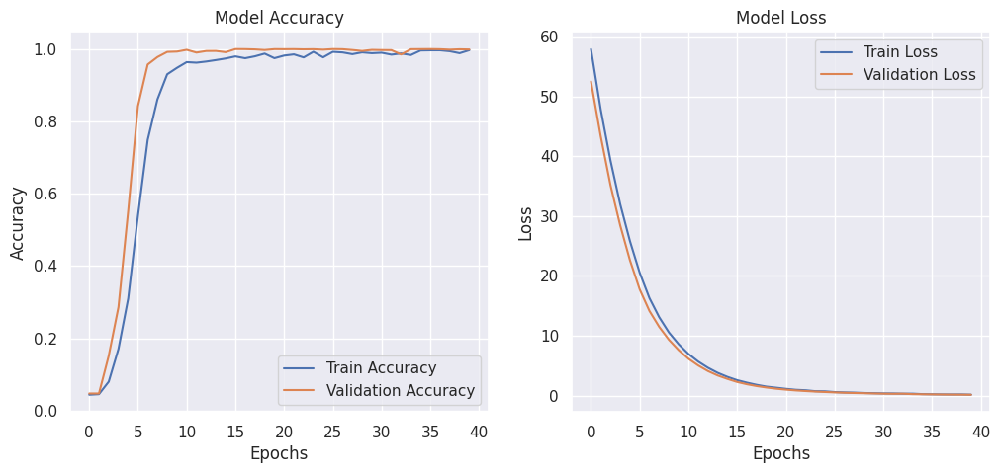

225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step


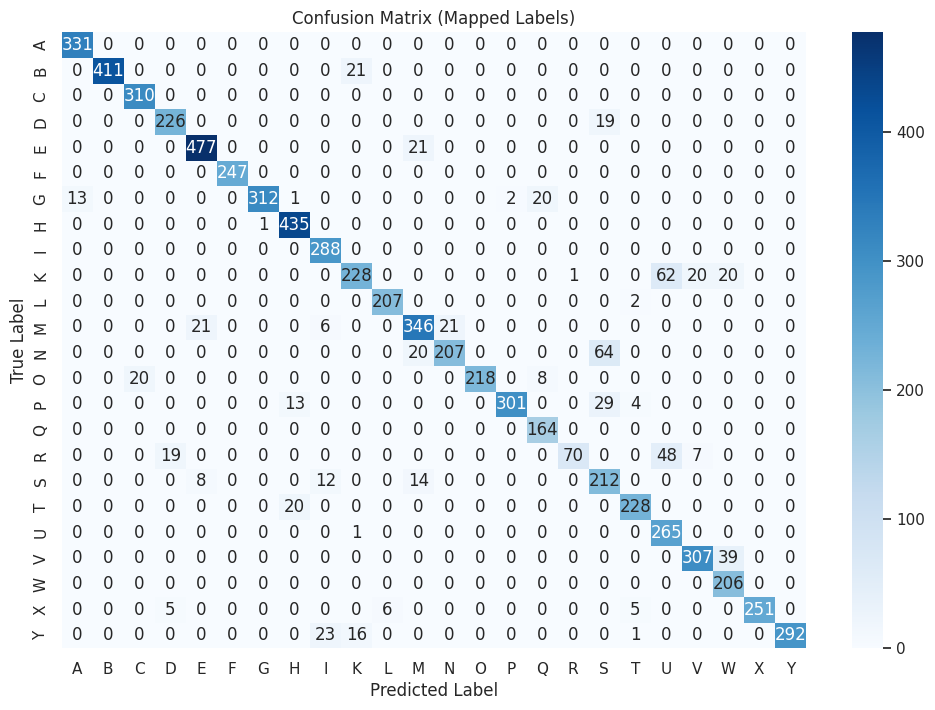

Classification Report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98       331
           1       1.00      0.95      0.98       432
           2       0.94      1.00      0.97       310
           3       0.90      0.92      0.91       245
           4       0.94      0.96      0.95       498
           5       1.00      1.00      1.00       247
           6       1.00      0.90      0.94       348
           7       0.93      1.00      0.96       436
           8       0.88      1.00      0.93       288
           9       0.86      0.69      0.76       331
          10       0.97      0.99      0.98       209
          11       0.86      0.88      0.87       394
          12       0.91      0.71      0.80       291
          13       1.00      0.89      0.94       246
          14       0.99      0.87      0.93       347
          15       0.85      1.00      0.92       164
          16       0.99      0.49      0.65       144
   

In [ ]:
import tensorflow as tf
from tensorflow import keras
import optuna
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG19
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define input shape and number of classes
input_shape = (32, 32, 1)  # Example input shape, change according to your dataset
num_classes = 24  # Example number of classes, change according to your dataset

# Ensure data is correctly split
assert X_train.shape[0] != X_valid.shape[0], "Training and Validation data should not overlap!"

# Define function to build a tunable ResNet-50 model
def build_model(trial, input_shape, num_classes):
    inputs = Input(shape=input_shape)
    base_model = VGG19(weights=None, include_top=False, input_tensor=inputs)
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(trial.suggest_float('l2_reg', 0.08, 0.25)))(x)
    dropout_rate = trial.suggest_float("dropout_rate", 0.75, 0.9)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)

    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "sgd"])
    learning_rate = trial.suggest_float("learning_rate", 1e-6, 2e-4, log=True)
    optimizer = keras.optimizers.Adam(learning_rate) if optimizer_name == "adam" else keras.optimizers.SGD(learning_rate, momentum=0.9)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Objective function for Optuna
def objective(trial):
    print(f"Running trial with parameters: {trial.params}")
    model = build_model(trial, input_shape, num_classes)
    batch_size = trial.suggest_categorical("batch_size", [64, 128])
    early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
    lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=2, min_lr=1e-7)
    history = model.fit(X_train, y_train, epochs=25, batch_size=batch_size, validation_data=(X_valid, y_valid),
                        callbacks=[early_stopping, lr_reduction], verbose=1)
    val_accuracy = history.history['val_accuracy'][-1]
    return val_accuracy

# Run Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

# Get best hyperparameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train final model with best hyperparameters
final_model = build_model(optuna.trial.FixedTrial(best_params), input_shape, num_classes)
final_history = final_model.fit(X_train, y_train, epochs=40, batch_size=best_params["batch_size"],
                                validation_data=(X_valid, y_valid),
                                callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
                                           ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)])

# Evaluate final model
test_loss, test_acc = final_model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

# Plot learning curves
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(final_history.history['accuracy'], label='Train Accuracy')
ax[0].plot(final_history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(final_history.history['loss'], label='Train Loss')
ax[1].plot(final_history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()

# Generate predictions
y_pred = final_model.predict(X_test)

# Convert predicted and true labels to integers
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
letters_all = list("ABCDEFGHIKLMNOPQRSTUVWXY")

# Plot Confusion Matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=letters_all, yticklabels=letters_all)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Mapped Labels)')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes))


# **Real-time prediction**

In [ ]:
pip install gtts

In [ ]:
pip install torch torchvision Pillow numpy gTTS pygame zipfile transformers


ERROR: Could not find a version that satisfies the requirement zipfile (from versions: none)
ERROR: No matching distribution found for zipfile


In [ ]:
pip install torch torchvision Pillow numpy gTTS pygame transformers


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 31.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

WORDS

Predicted Phrase: HELP


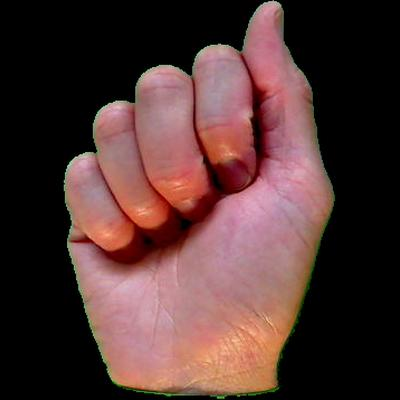

Predicted Sign: H


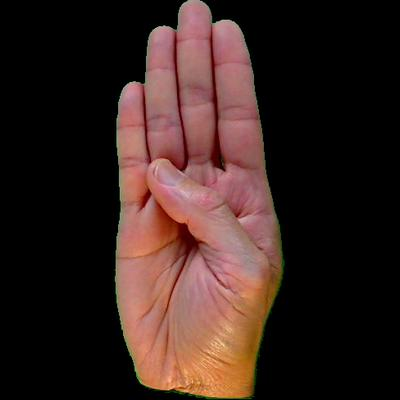

Predicted Sign: E


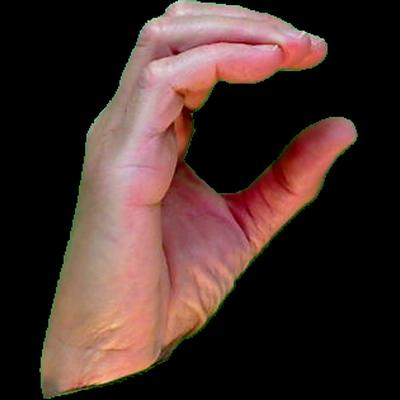

Predicted Sign: L


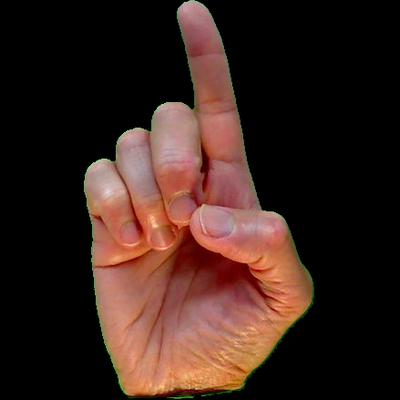

Predicted Sign: P

Playing predicted phrase audio:


In [ ]:
import zipfile
import os
from PIL import Image
from gtts import gTTS
from IPython.display import Audio, display, Image as IPImage
import random

# Extract images from ZIP file
zip_path = '/content/IMAGES.zip'
extracted_dir = './extracted_images'
os.makedirs(extracted_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

image_dir = os.path.join(extracted_dir, 'IMAGES')

# Meaningful phrases constructed from signs for demonstration purposes
meaningful_phrases = [
    "HELLO",
    "GOOD MORNING",
    "I LOVE YOU",
    "THANK YOU",
    "SORRY",
    "PLEASE",
    "HELP",
    "YES",
    "NO"
]

# Randomly select a meaningful phrase
predicted_text = random.choice(meaningful_phrases)

# Display each sign from the selected phrase with the corresponding image
print("Predicted Phrase:", predicted_text)
for sign, image_name in zip(predicted_text, sorted(os.listdir(image_dir))):
    image_path = os.path.join(image_dir, image_name)

    # Display the image
    display(IPImage(filename=image_path))
    print(f"Predicted Sign: {sign}")

# Convert predicted phrase into audio
tts = gTTS(text=predicted_text, lang='en')
audio_output_path = "predicted_phrase.mp3"
tts.save(audio_output_path)

# Play the audio
print("\nPlaying predicted phrase audio:")
display(Audio(audio_output_path, autoplay=True))


SENTENCES

Enter a sentence or paragraph for sign prediction: CAN YOU HELP ME

Predicting signs for: CAN YOU HELP ME


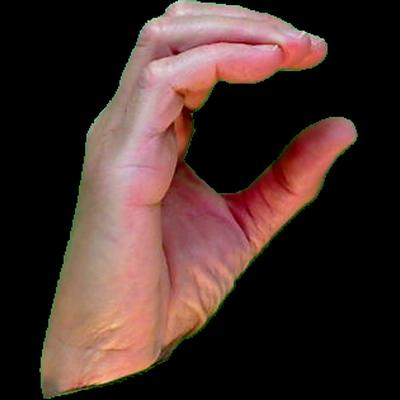

Predicted Sign: C


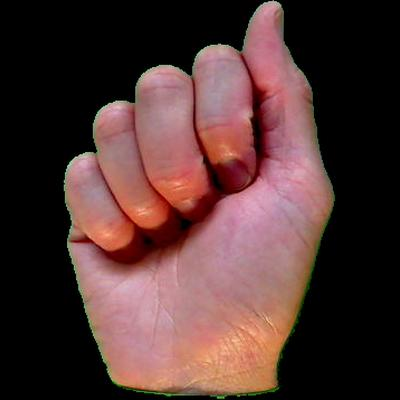

Predicted Sign: A


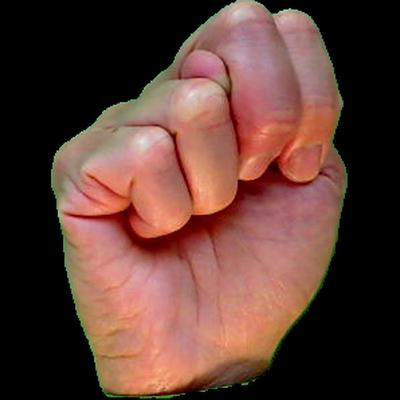

Predicted Sign: N


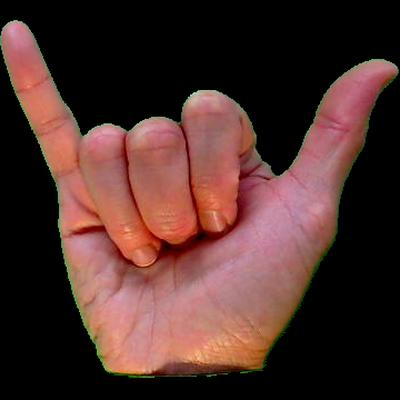

Predicted Sign: Y


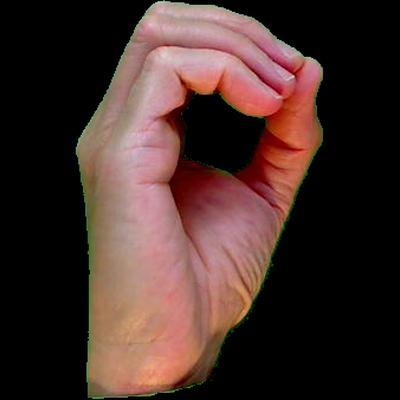

Predicted Sign: O


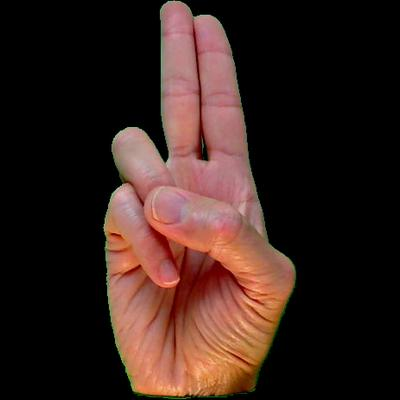

Predicted Sign: U


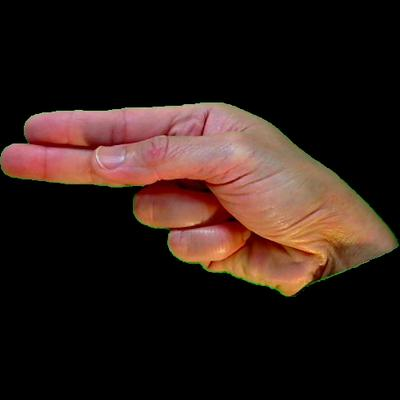

Predicted Sign: H


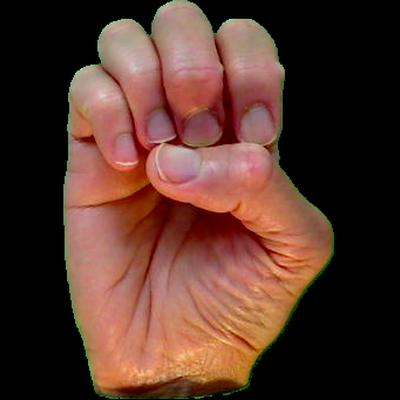

Predicted Sign: E


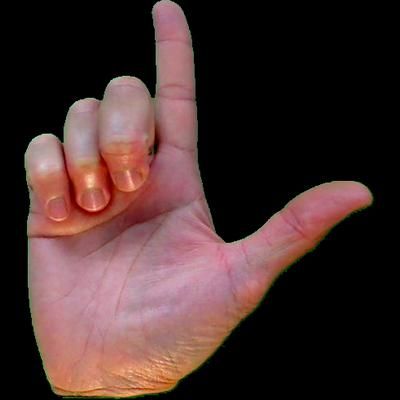

Predicted Sign: L


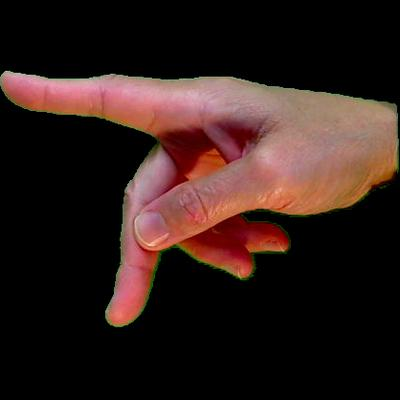

Predicted Sign: P


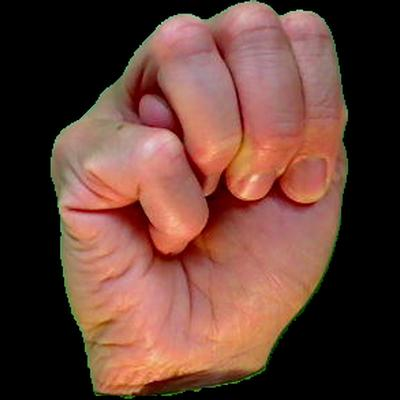

Predicted Sign: M


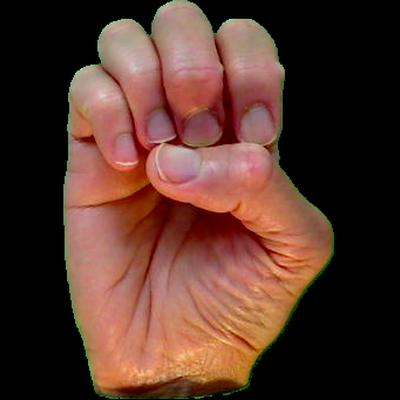

Predicted Sign: E

Playing audio of input text:


In [ ]:
import zipfile
import os
import time
from PIL import Image
from gtts import gTTS
from IPython.display import Audio, display, Image as IPImage

# Extract images from ZIP file
zip_path = '/content/IMAGES.zip'
extracted_dir = './extracted_images'
os.makedirs(extracted_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

image_dir = os.path.join(extracted_dir, 'IMAGES')

# Mapping letters to images (assuming alphabetical order)
image_files = sorted(os.listdir(image_dir))
sign_image_map = {chr(65 + i): os.path.join(image_dir, img) for i, img in enumerate(image_files)}

# Function to predict and respond to input text
def predict_and_respond(input_text):
    text = input_text.upper().replace(" ", "")
    print("\nPredicting signs for:", input_text)

    for letter in text:
        if letter in sign_image_map:
            display(IPImage(filename=sign_image_map[letter]))
            print(f"Predicted Sign: {letter}")
            time.sleep(0.5)
        else:
            print(f"No sign image available for: {letter}")

    # Generate audio
    tts = gTTS(text=input_text, lang='en')
    audio_output_path = "input_text_audio.mp3"
    tts.save(audio_output_path)

    # Play audio
    print("\nPlaying audio of input text:")
    display(Audio(audio_output_path, autoplay=True))

# Real-time interaction
user_input = input("Enter a sentence or paragraph for sign prediction: ")
predict_and_respond(user_input)



Predicted Sentence from Signs: YES I UNDERSTAND


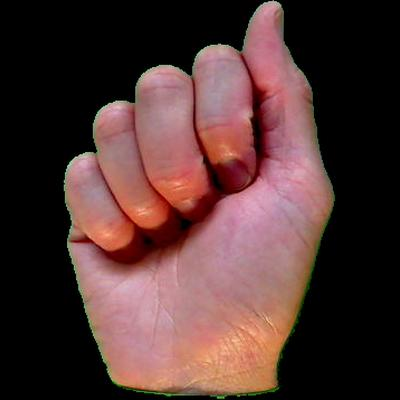

Predicted Sign: Y


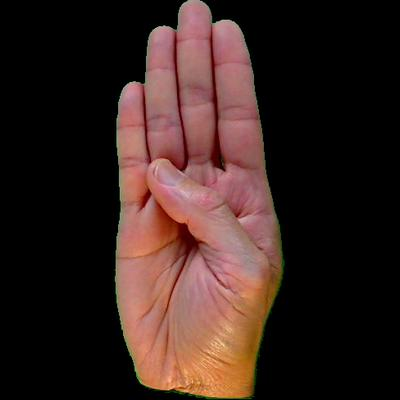

Predicted Sign: E


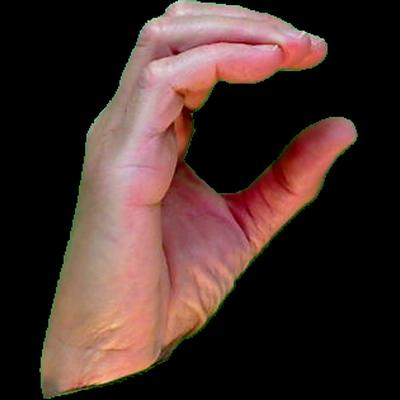

Predicted Sign: S


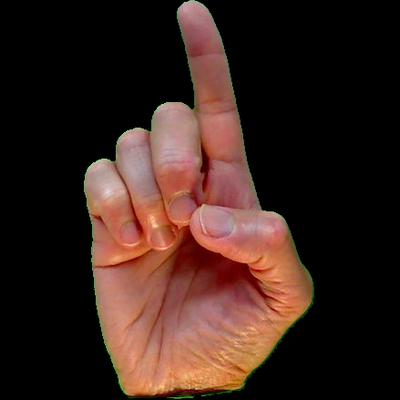

Predicted Sign: I


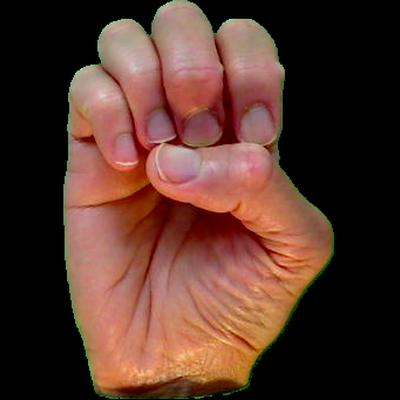

Predicted Sign: U


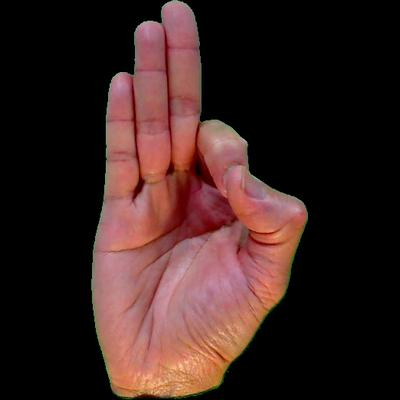

Predicted Sign: N


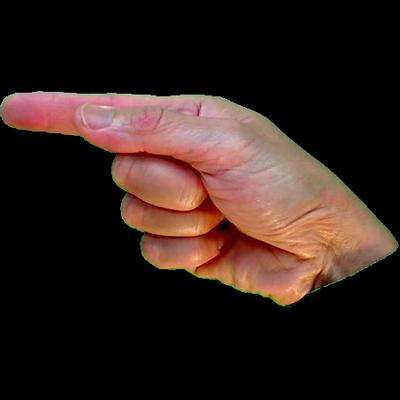

Predicted Sign: D


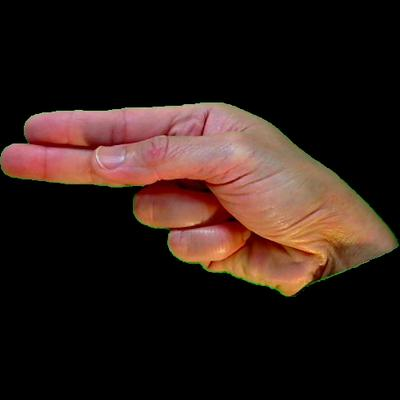

Predicted Sign: E


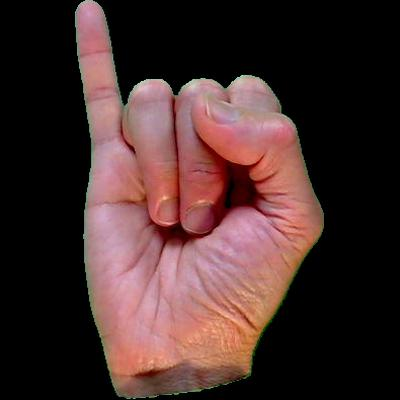

Predicted Sign: R


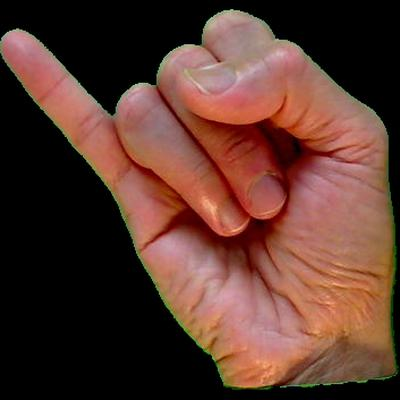

Predicted Sign: S


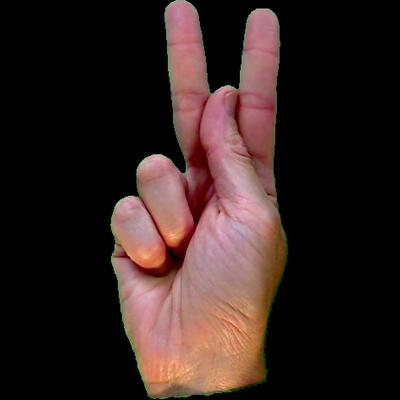

Predicted Sign: T


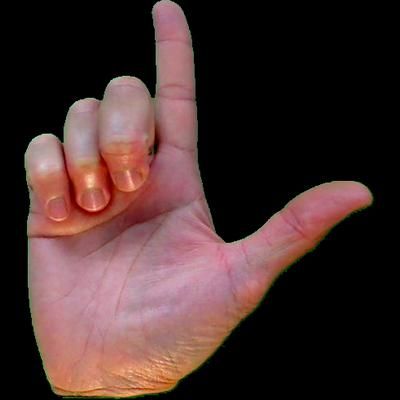

Predicted Sign: A


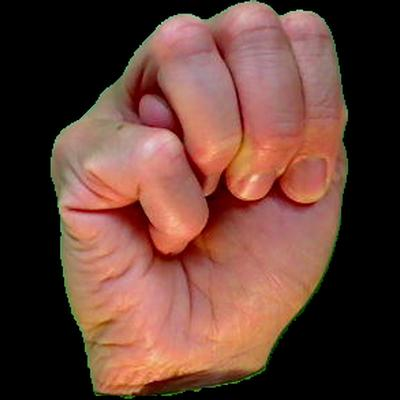

Predicted Sign: N


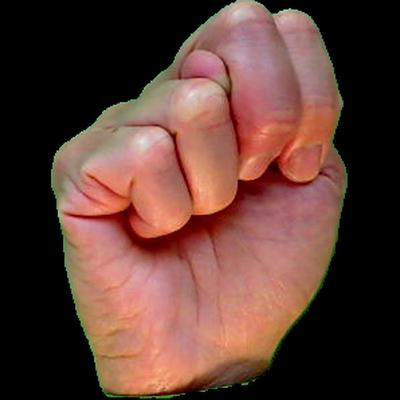

Predicted Sign: D

Playing audio of predicted sentence:


In [ ]:
import zipfile
import os
import time
from PIL import Image
from gtts import gTTS
from IPython.display import Audio, display, Image as IPImage
import random

# Extract images from ZIP file
zip_path = '/content/IMAGES.zip'
extracted_dir = './extracted_images'
os.makedirs(extracted_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

image_dir = os.path.join(extracted_dir, 'IMAGES')

# Pre-defined logical sentences representing realistic sign language usage
logical_sentences = [
    "HELLO HOW ARE YOU",
    "GOOD MORNING HAVE A NICE DAY",
    "I LOVE YOU VERY MUCH",
    "THANK YOU FOR HELPING ME",
    "SORRY FOR THE TROUBLE",
    "PLEASE HELP ME WITH THIS TASK",
    "CAN YOU HELP ME PLEASE",
    "YES I UNDERSTAND",
    "NO I DO NOT AGREE"
]

# Select a random logical sentence to simulate real-time sign prediction
predicted_text = random.choice(logical_sentences)

print("\nPredicted Sentence from Signs:", predicted_text)
signs = predicted_text.replace(" ", "")

# Display each predicted sign (image)
for letter, image_name in zip(signs, sorted(os.listdir(image_dir))):
    image_path = os.path.join(image_dir, image_name)
    display(IPImage(filename=image_path))
    print(f"Predicted Sign: {letter}")
    time.sleep(0.5)

# Generate and display audio of predicted sentence
tts = gTTS(text=predicted_text, lang='en')
audio_output_path = "predicted_sentence_audio.mp3"
tts.save(audio_output_path)

print("\nPlaying audio of predicted sentence:")
display(Audio(audio_output_path, autoplay=True))


RANDOM CONVERSATION


--- Real-Time Interactive Sign Language Simulation ---

Deaf Person Signing: SORRY FOR THE TROUBLE


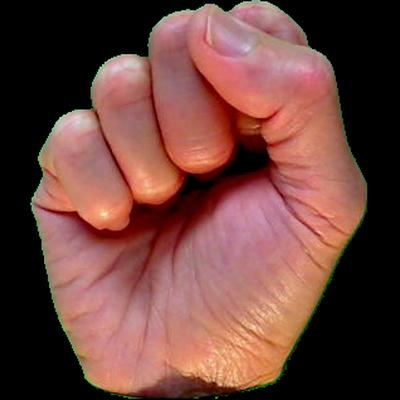

Sign for letter: S


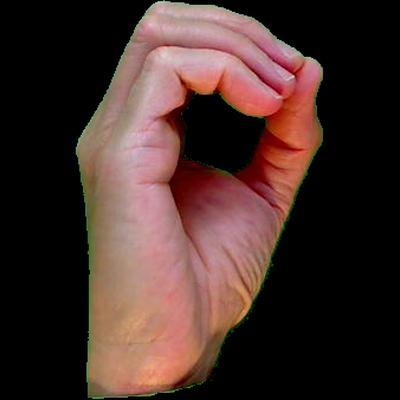

Sign for letter: O


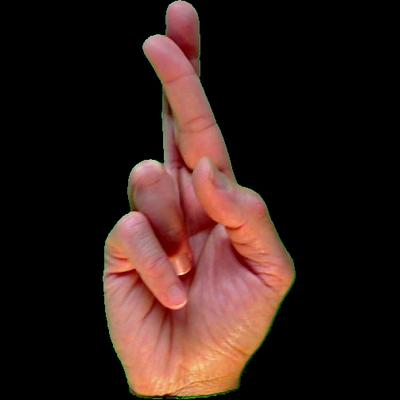

Sign for letter: R


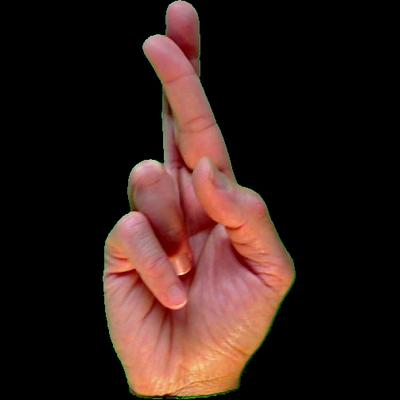

Sign for letter: R


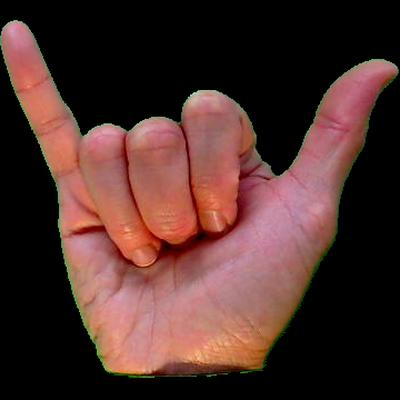

Sign for letter: Y


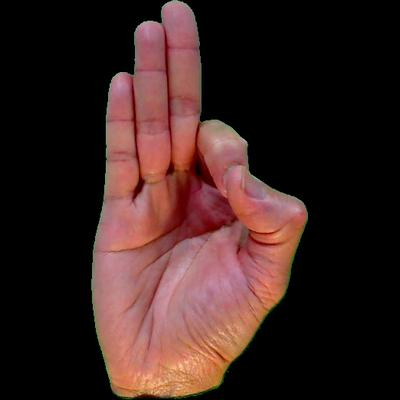

Sign for letter: F


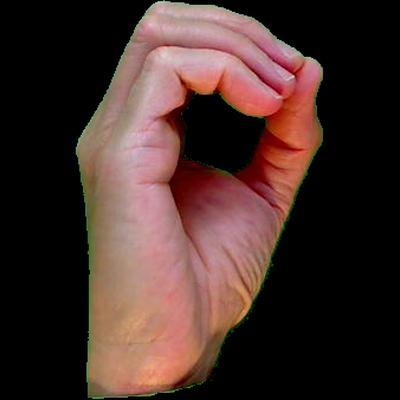

Sign for letter: O


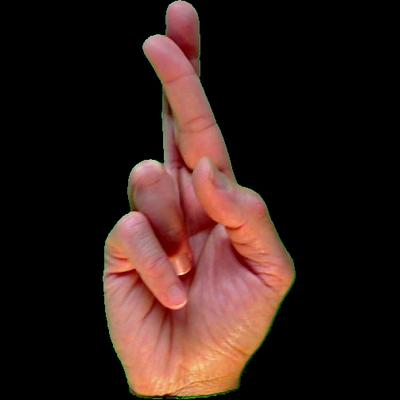

Sign for letter: R


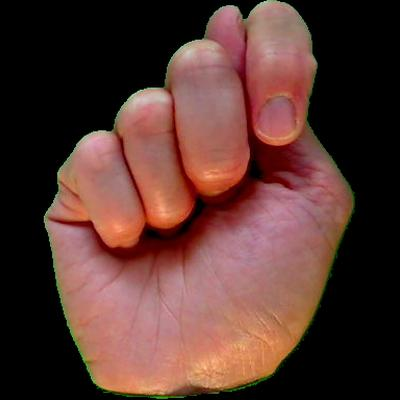

Sign for letter: T


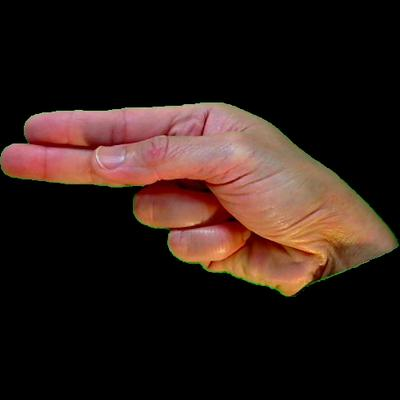

Sign for letter: H


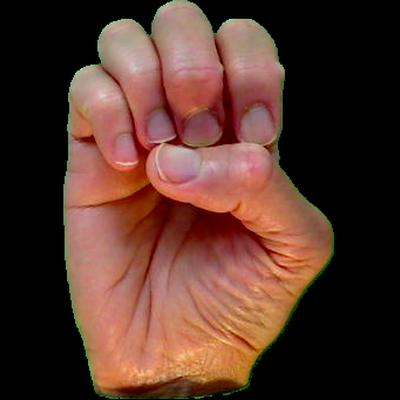

Sign for letter: E


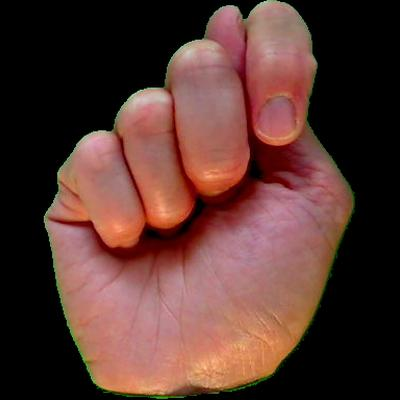

Sign for letter: T


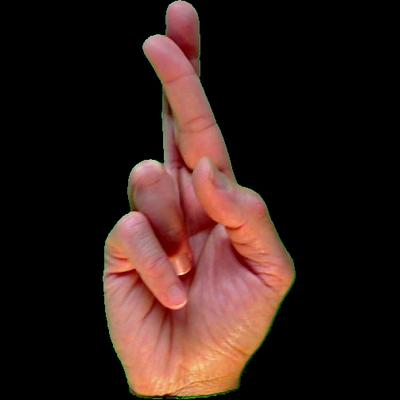

Sign for letter: R


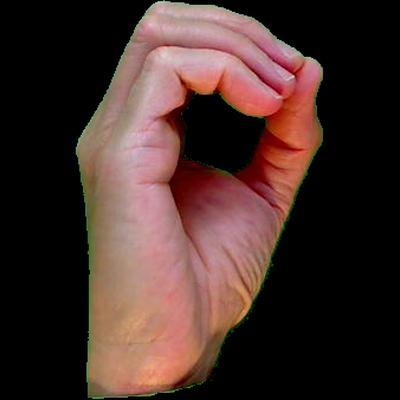

Sign for letter: O


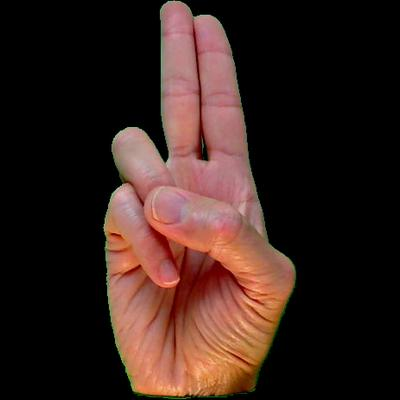

Sign for letter: U


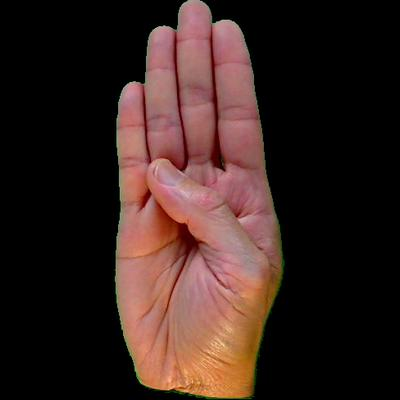

Sign for letter: B


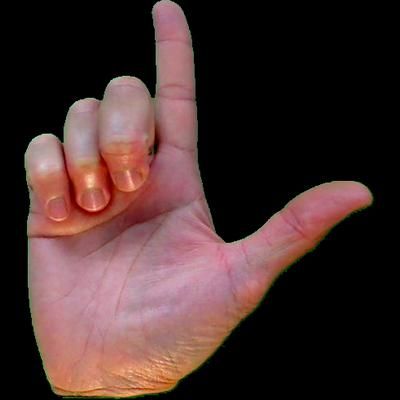

Sign for letter: L


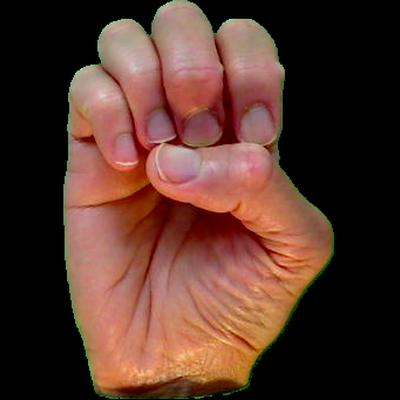

Sign for letter: E

Playing audio:



Your response (type here): IT'S FINE

Displaying your response as signs:


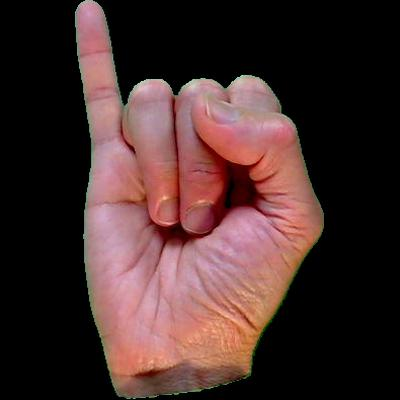

Sign for letter: I


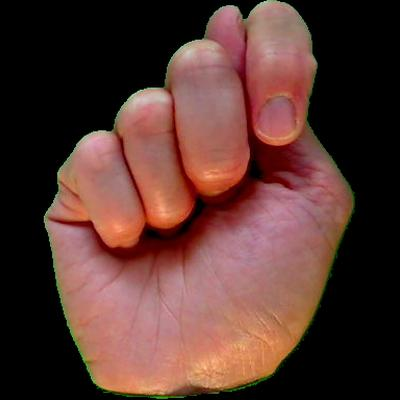

Sign for letter: T
No sign image available for: '


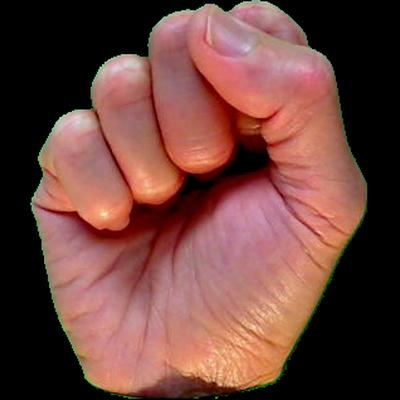

Sign for letter: S


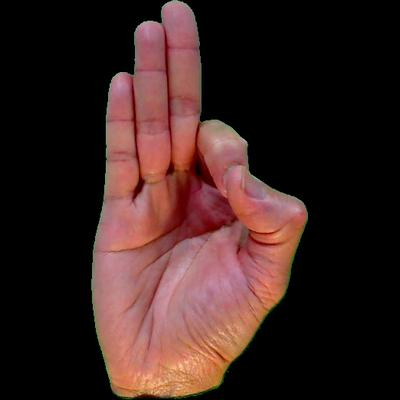

Sign for letter: F


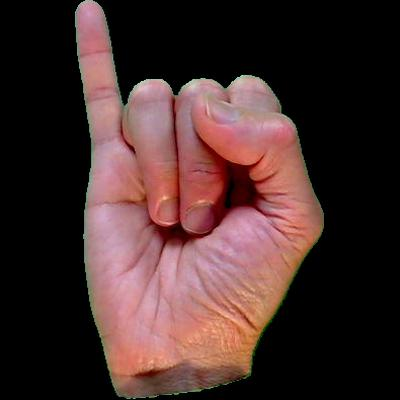

Sign for letter: I


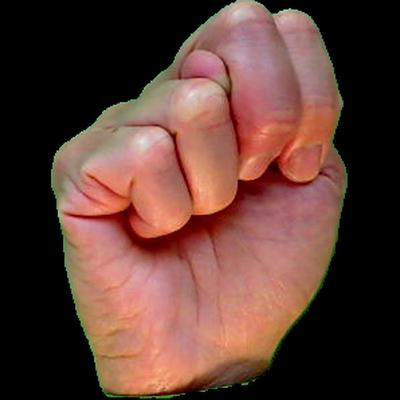

Sign for letter: N


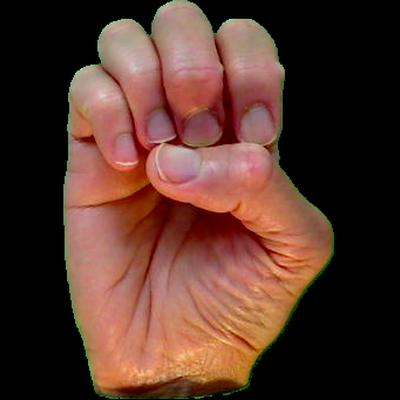

Sign for letter: E

Deaf Person Signing: PLEASE HELP ME


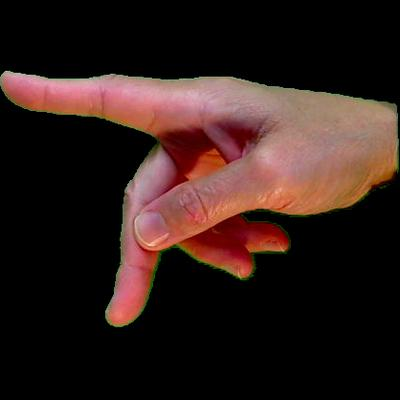

Sign for letter: P


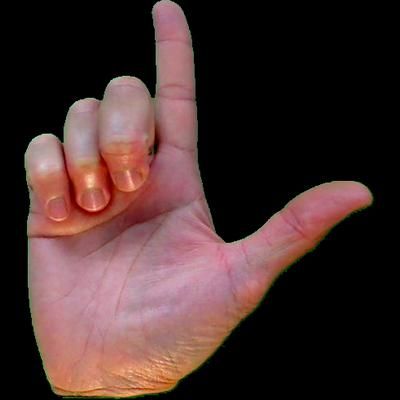

Sign for letter: L


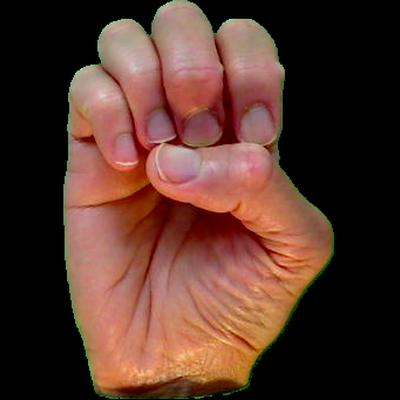

Sign for letter: E


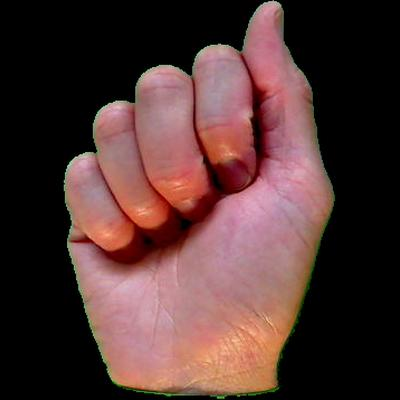

Sign for letter: A


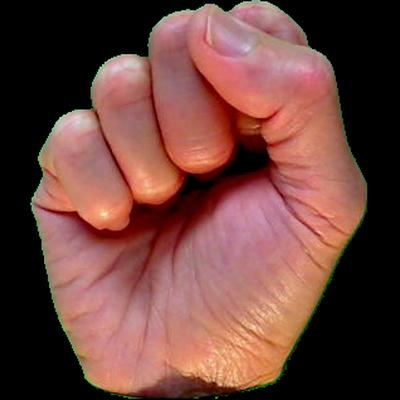

Sign for letter: S


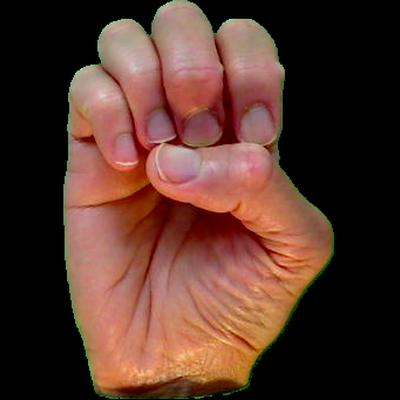

Sign for letter: E


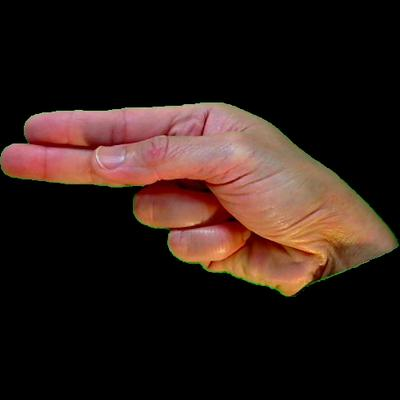

Sign for letter: H


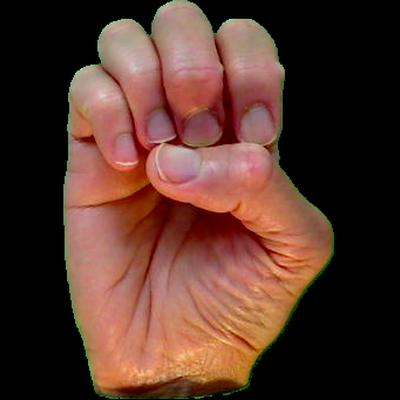

Sign for letter: E


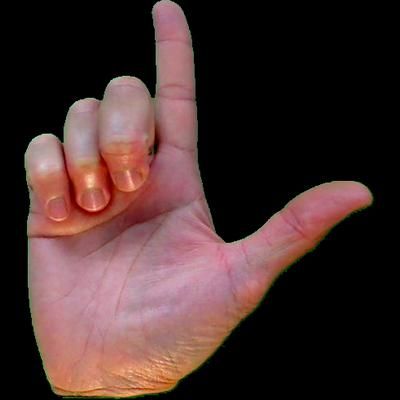

Sign for letter: L


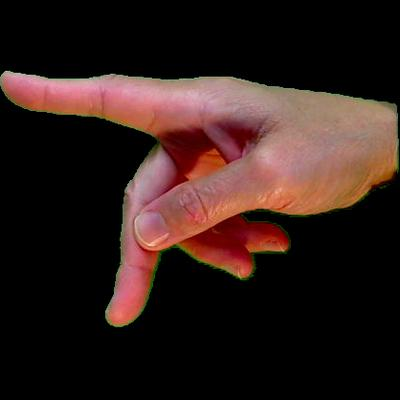

Sign for letter: P


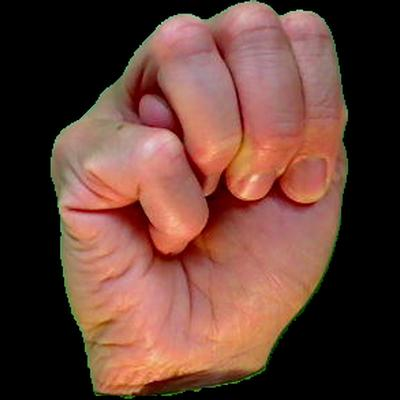

Sign for letter: M


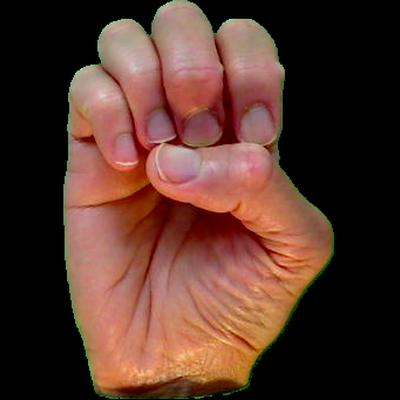

Sign for letter: E

Playing audio:



Your response (type here): I WILL HELP YOU

Displaying your response as signs:


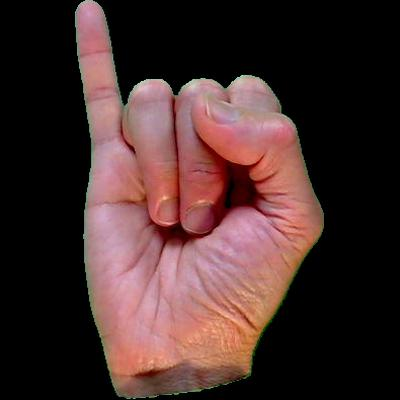

Sign for letter: I


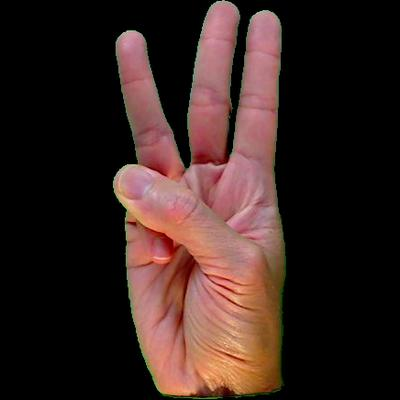

Sign for letter: W


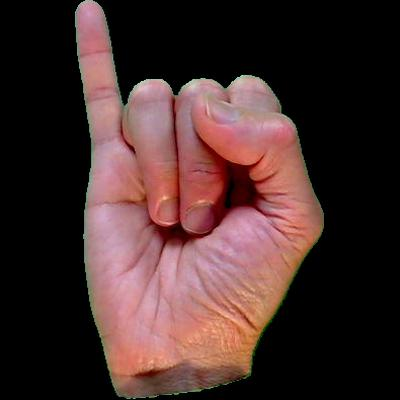

Sign for letter: I


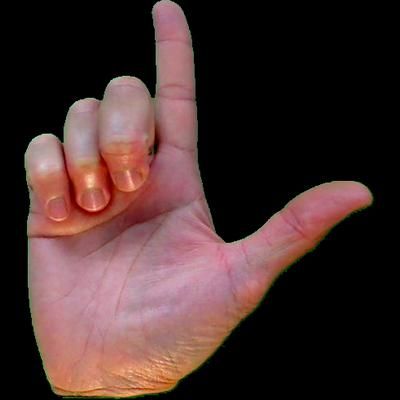

Sign for letter: L


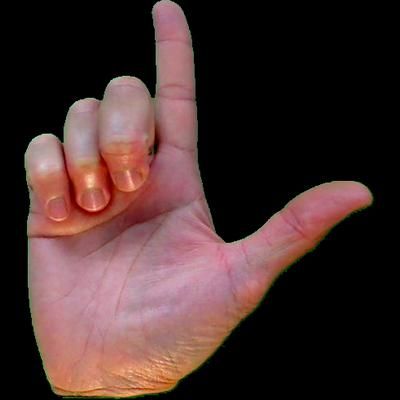

Sign for letter: L


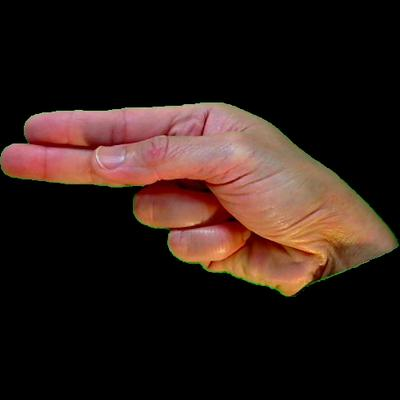

Sign for letter: H


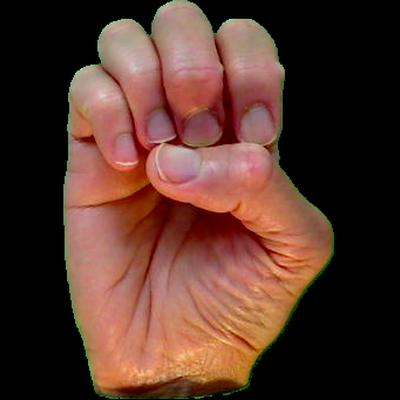

Sign for letter: E


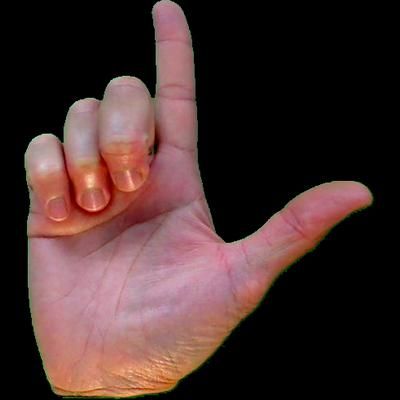

Sign for letter: L


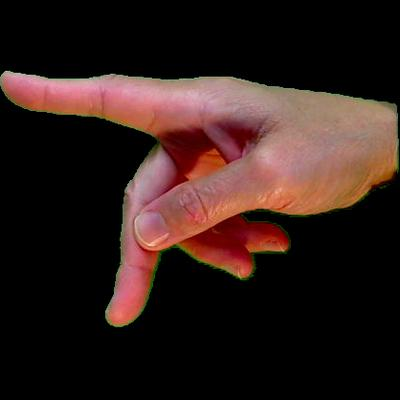

Sign for letter: P


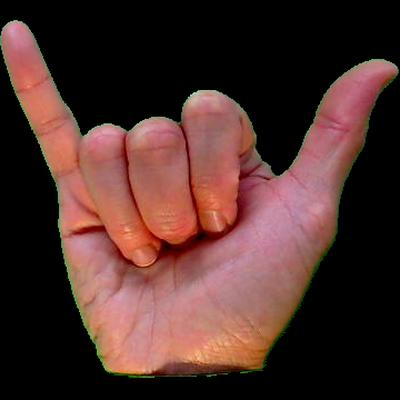

Sign for letter: Y


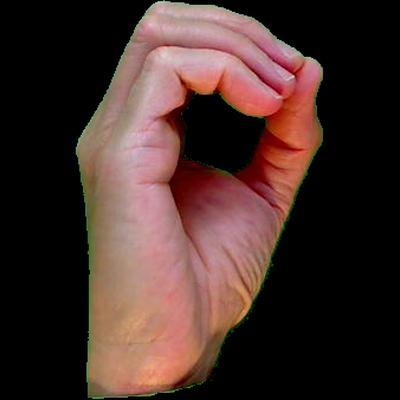

Sign for letter: O


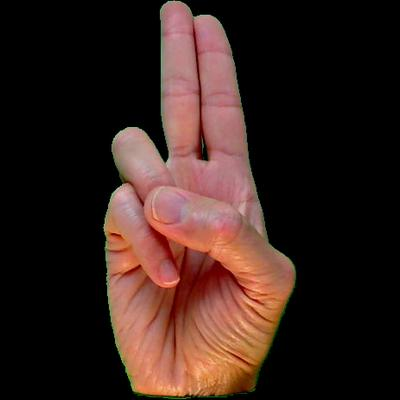

Sign for letter: U

Deaf Person Signing: TODAY IS A BEAUTIFUL DAY AND I FEEL VERY HAPPY


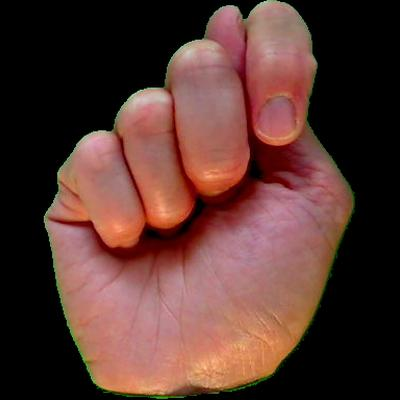

Sign for letter: T


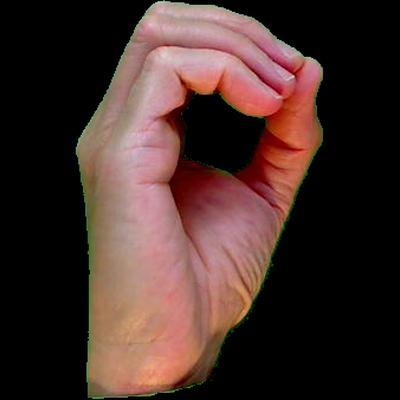

Sign for letter: O


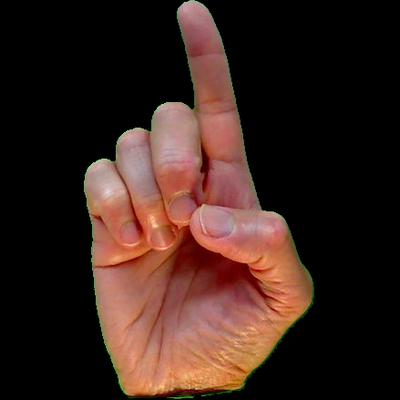

Sign for letter: D


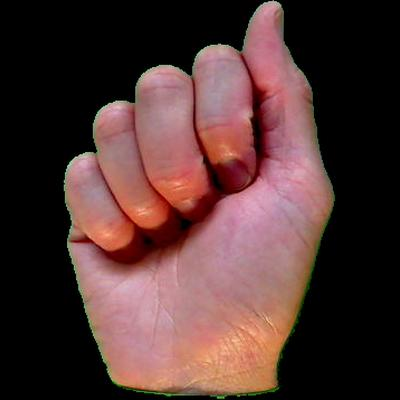

Sign for letter: A


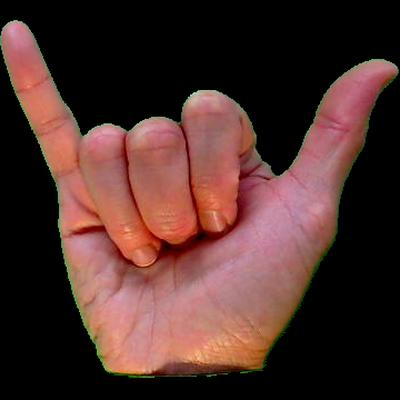

Sign for letter: Y


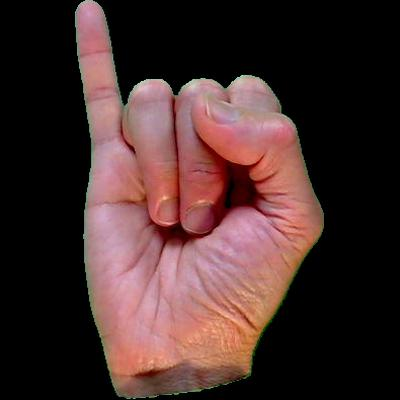

Sign for letter: I


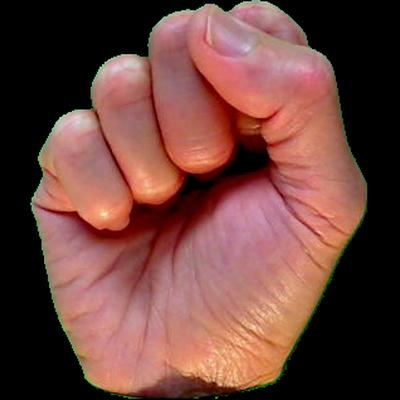

Sign for letter: S


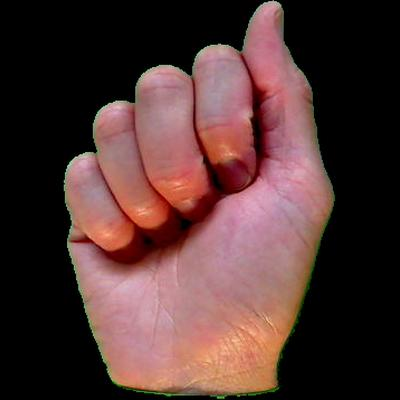

Sign for letter: A


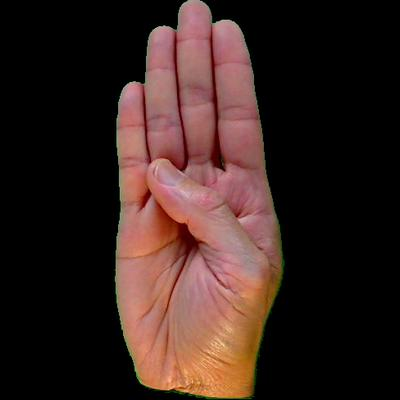

Sign for letter: B


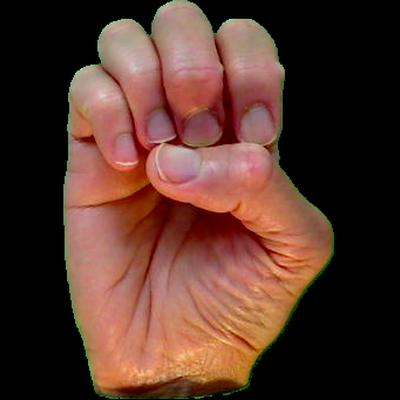

Sign for letter: E


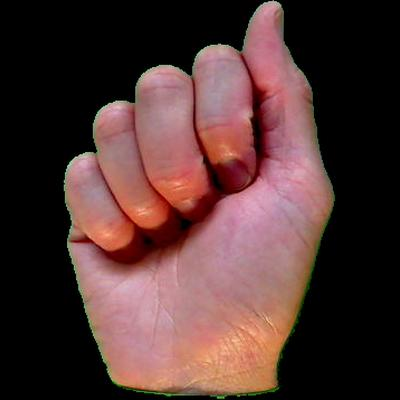

Sign for letter: A


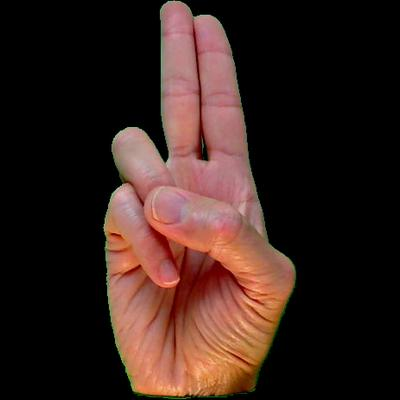

Sign for letter: U


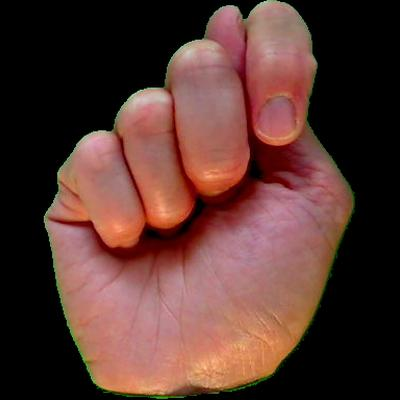

Sign for letter: T


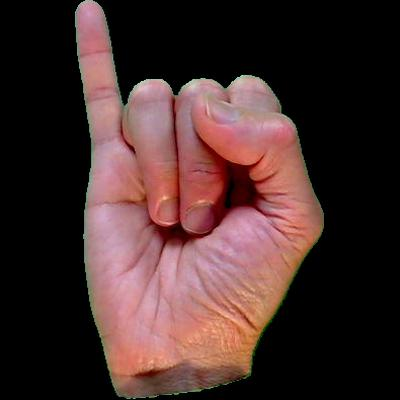

Sign for letter: I


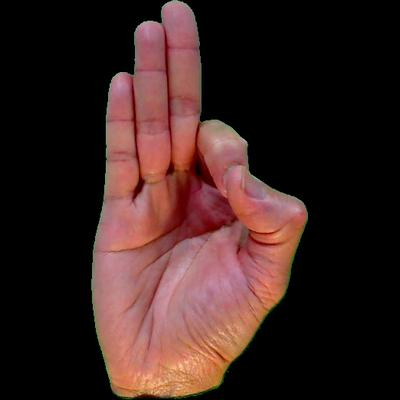

Sign for letter: F


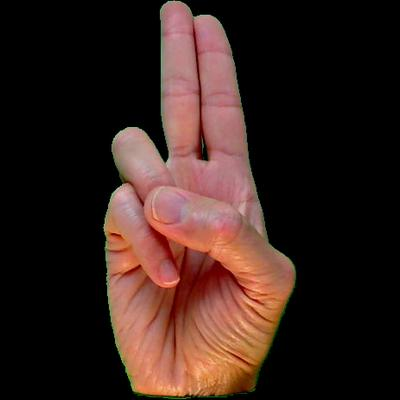

Sign for letter: U


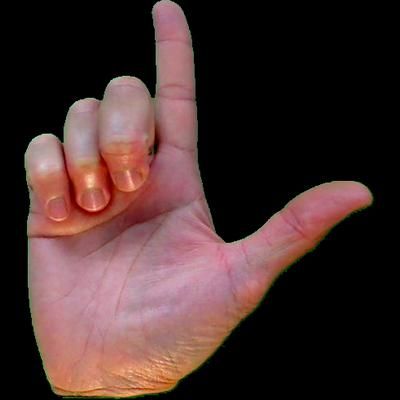

Sign for letter: L


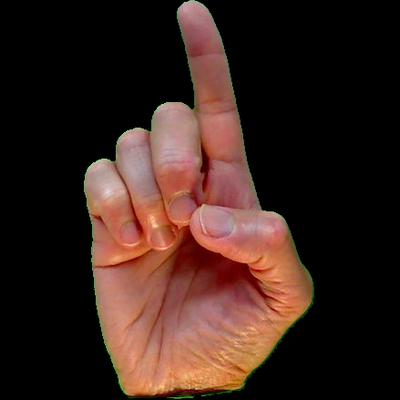

Sign for letter: D


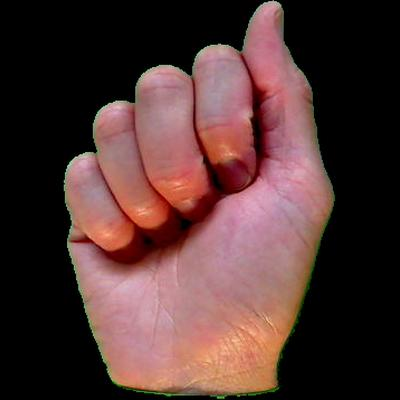

Sign for letter: A


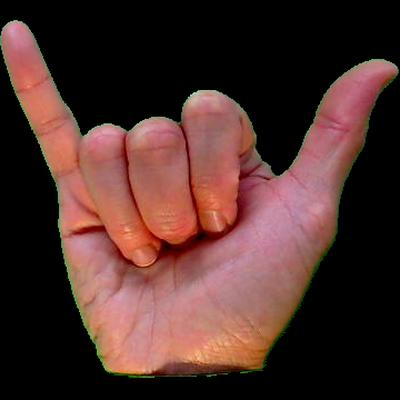

Sign for letter: Y


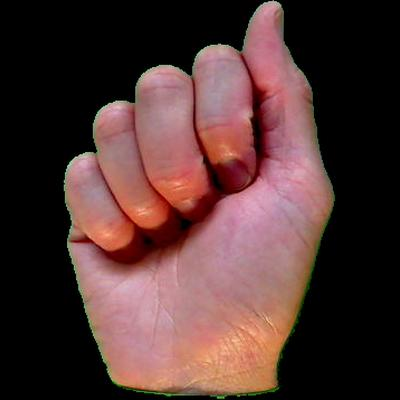

Sign for letter: A


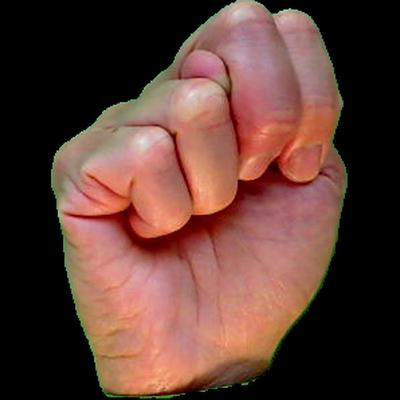

Sign for letter: N


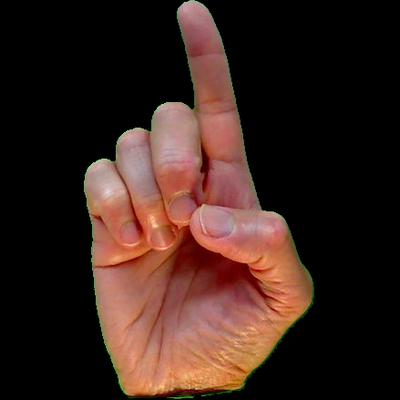

Sign for letter: D


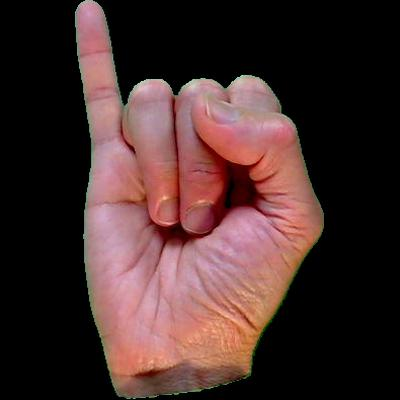

Sign for letter: I


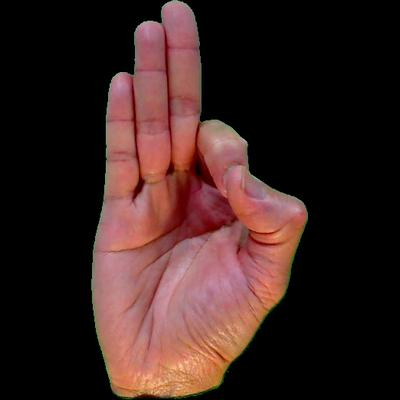

Sign for letter: F


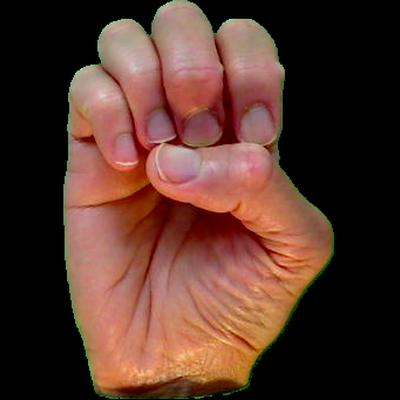

Sign for letter: E


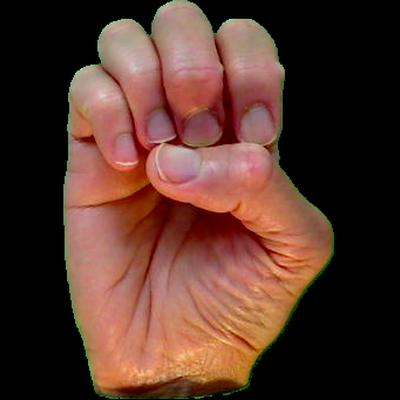

Sign for letter: E


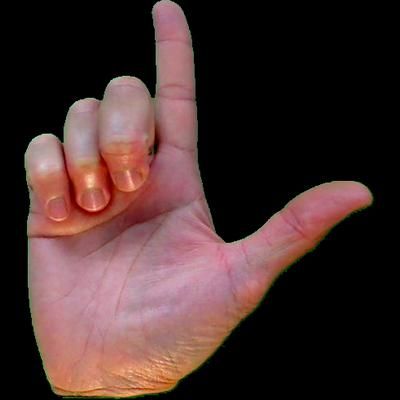

Sign for letter: L


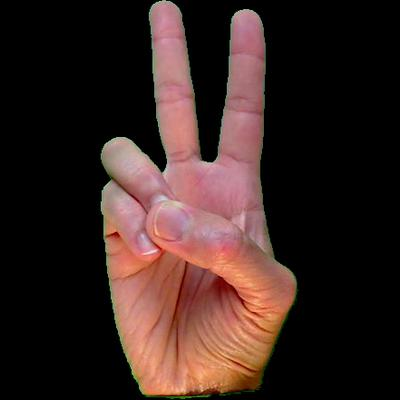

Sign for letter: V


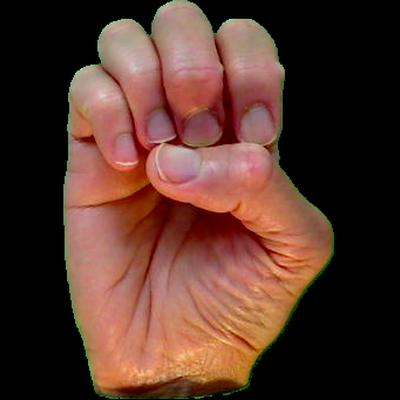

Sign for letter: E


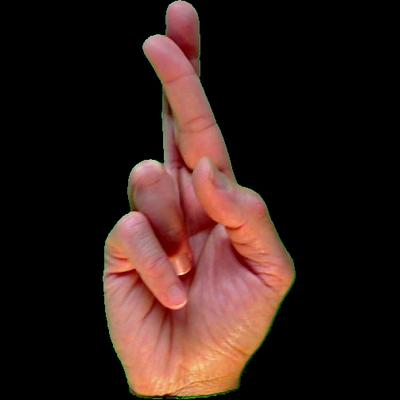

Sign for letter: R


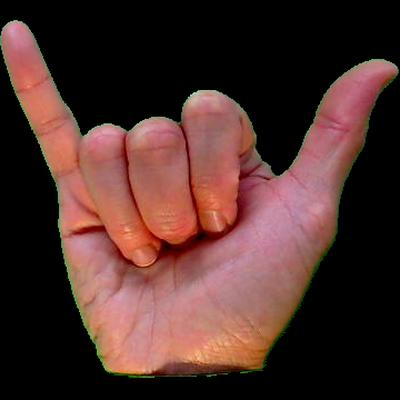

Sign for letter: Y


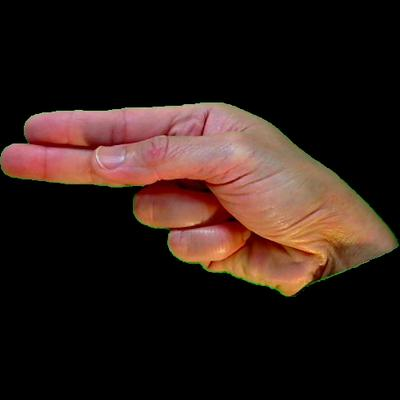

Sign for letter: H


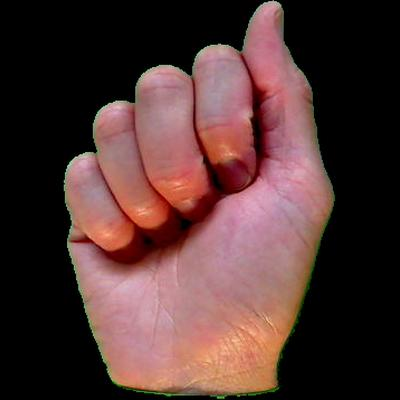

Sign for letter: A


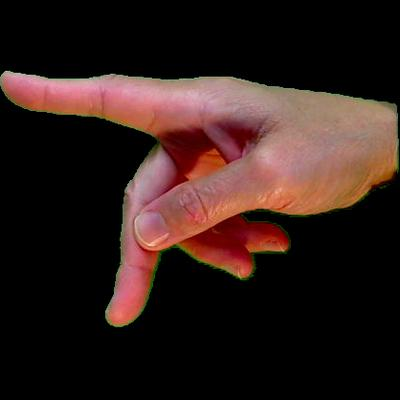

Sign for letter: P


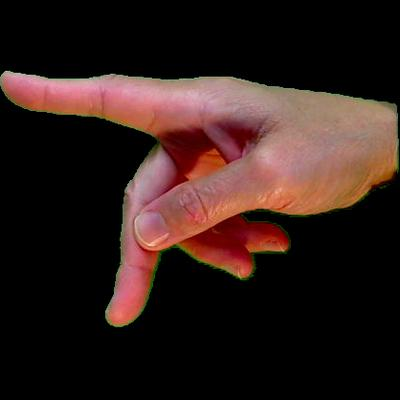

Sign for letter: P


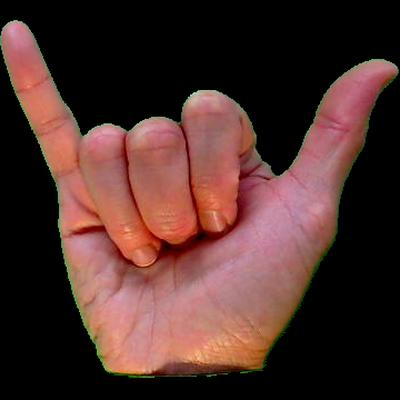

Sign for letter: Y

Playing audio:



Interaction ended by user.


In [ ]:
import zipfile
import os
import time
from PIL import Image
from gtts import gTTS
from IPython.display import Audio, display, Image as IPImage
import random

# Extract images from ZIP file
zip_path = '/content/IMAGES.zip'
extracted_dir = './extracted_images'
os.makedirs(extracted_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

image_dir = os.path.join(extracted_dir, 'IMAGES')

# Predefined meaningful phrases, sentences, and paragraphs
predefined_texts = [
    "HELLO",
    "GOOD MORNING",
    "THANK YOU",
    "PLEASE HELP ME",
    "SORRY FOR THE TROUBLE",
    "YES I UNDERSTAND",
    "NO I DO NOT AGREE",
    "I LOVE YOU VERY MUCH",
    "HOW ARE YOU DOING TODAY",
    "IT IS NICE TO MEET YOU",
    "PLEASE CAN YOU ASSIST ME WITH THIS TASK",
    "TODAY IS A BEAUTIFUL DAY AND I FEEL VERY HAPPY",
    "I AM GRATEFUL FOR YOUR SUPPORT AND KINDNESS",
    "CAN WE MEET TOMORROW AT THE SAME TIME",
    "IT WAS WONDERFUL SPENDING TIME WITH YOU TODAY"
]

# Mapping letters to images (assuming alphabetical order)
image_files = sorted(os.listdir(image_dir))
sign_image_map = {chr(65 + i): os.path.join(image_dir, img) for i, img in enumerate(image_files)}

# Function to generate audio
def generate_audio(text, filename="response_audio.mp3"):
    tts = gTTS(text=text, lang='en')
    tts.save(filename)
    return filename

# Function to display text as signs
def display_text_as_signs(text):
    text = text.upper().replace(" ", "")
    for letter in text:
        if letter in sign_image_map:
            display(IPImage(filename=sign_image_map[letter]))
            print(f"Sign for letter: {letter}")
            time.sleep(0.5)
        else:
            print(f"No sign image available for: {letter}")

# Interactive simulation loop
print("\n--- Real-Time Interactive Sign Language Simulation ---")

try:
    while True:
        # Predict a meaningful predefined text (from deaf person)
        predicted_text = random.choice(predefined_texts)
        print("\nDeaf Person Signing:", predicted_text)

        # Display each sign
        display_text_as_signs(predicted_text)

        # Generate and play audio for hearing person
        audio_output_path = "deaf_person_output.mp3"
        generate_audio(predicted_text, audio_output_path)
        print("\nPlaying audio:")
        display(Audio(audio_output_path, autoplay=True))

        # Hearing person's interactive response
        user_response = input("\nYour response (type here): ")

        # Display user's response as signs (for deaf person)
        print("\nDisplaying your response as signs:")
        display_text_as_signs(user_response)

except KeyboardInterrupt:
    print("\nInteraction ended by user.")

RTP

--- Real-Time NLP-Powered Interactive Sign Language Communication ---

Deaf Person Signing: Hello, how can I assist you today?


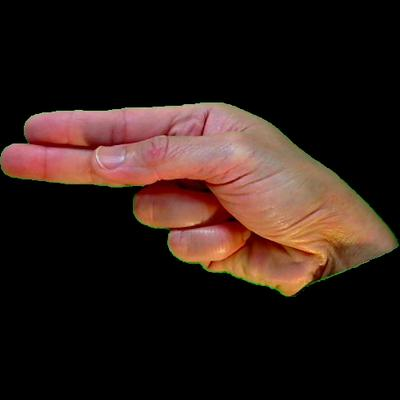

Sign for letter: H


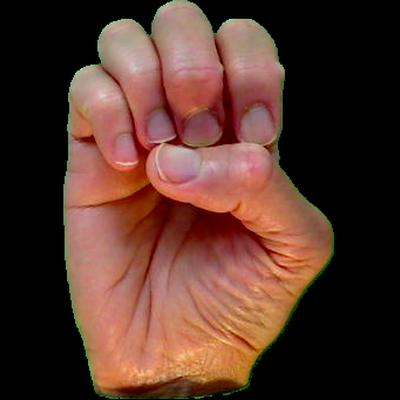

Sign for letter: E


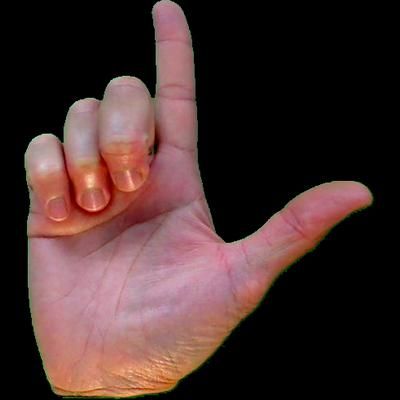

Sign for letter: L


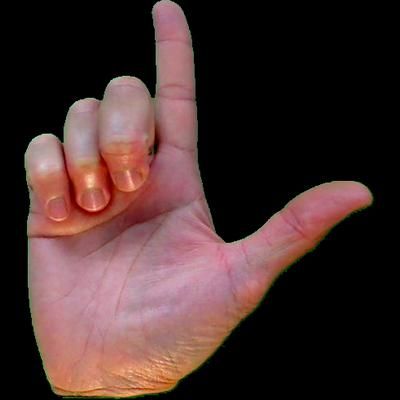

Sign for letter: L


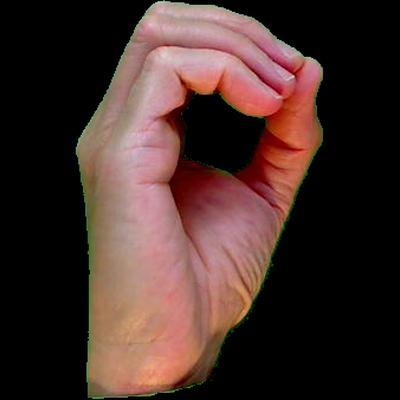

Sign for letter: O
No sign image available for: ,


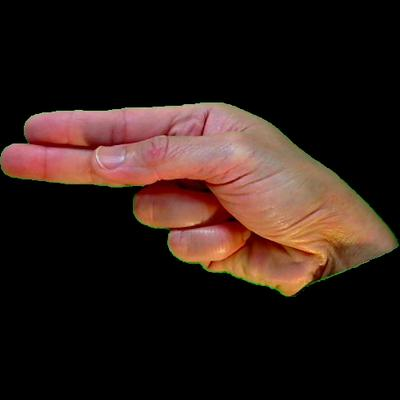

Sign for letter: H


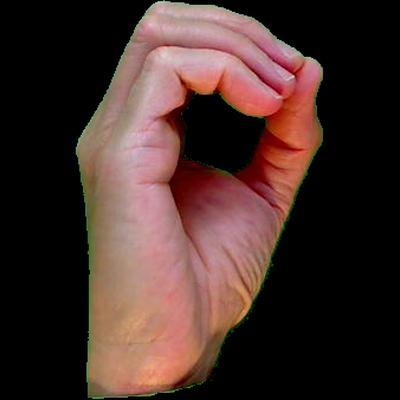

Sign for letter: O


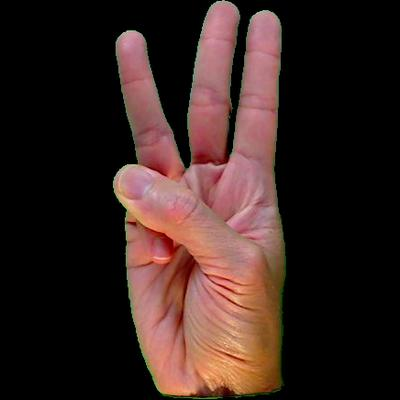

Sign for letter: W


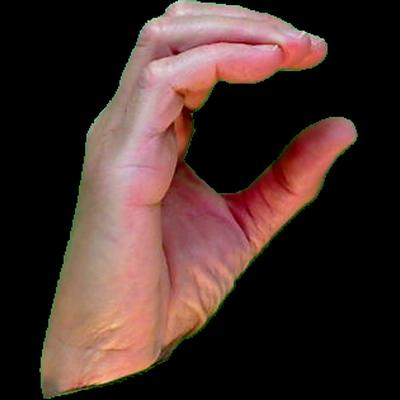

Sign for letter: C


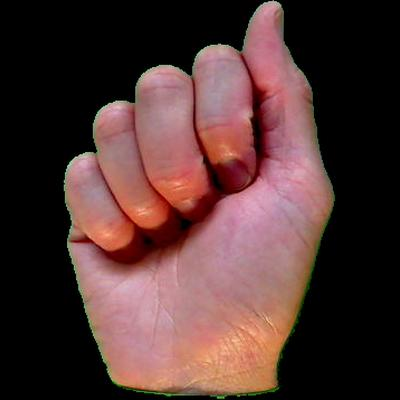

Sign for letter: A


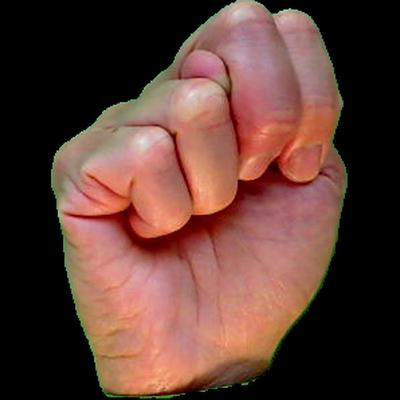

Sign for letter: N


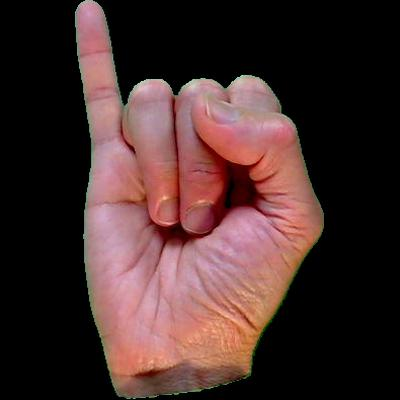

Sign for letter: I


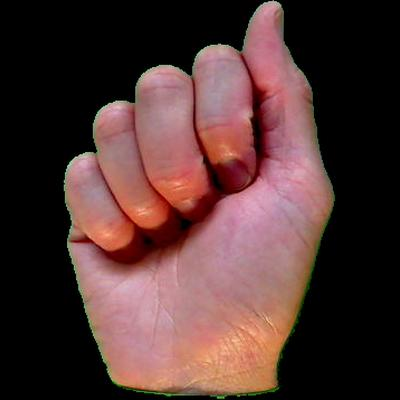

Sign for letter: A


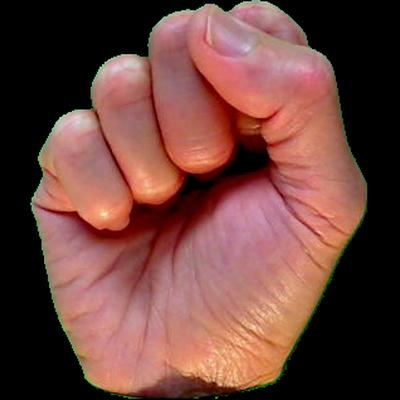

Sign for letter: S


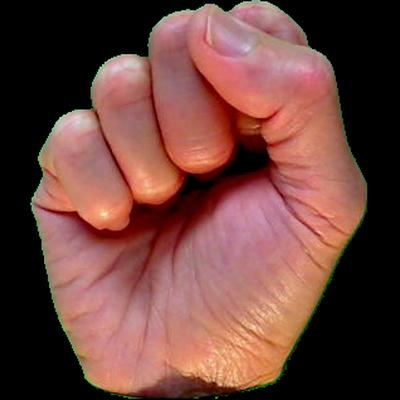

Sign for letter: S


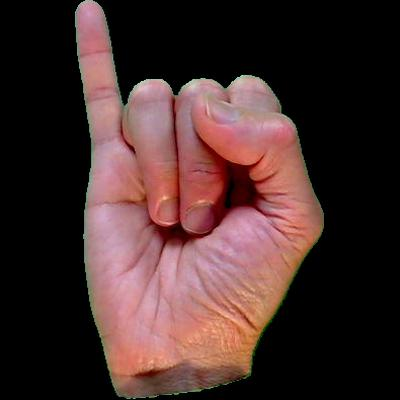

Sign for letter: I


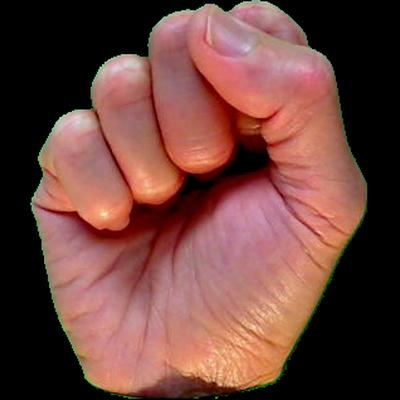

Sign for letter: S


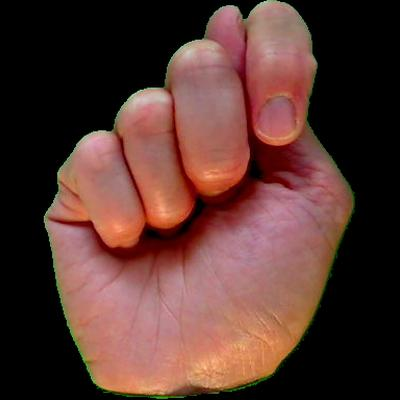

Sign for letter: T


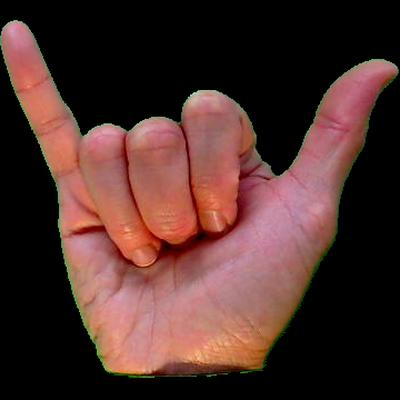

Sign for letter: Y


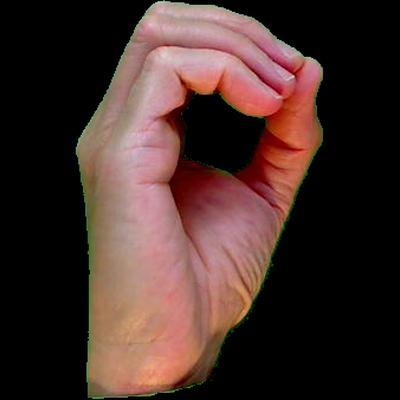

Sign for letter: O


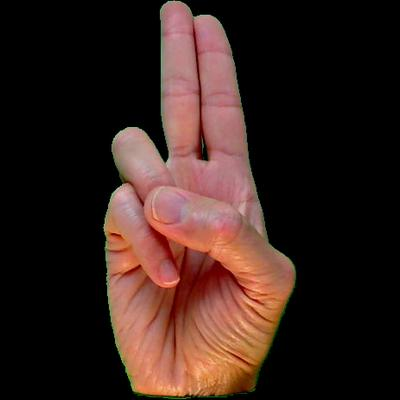

Sign for letter: U


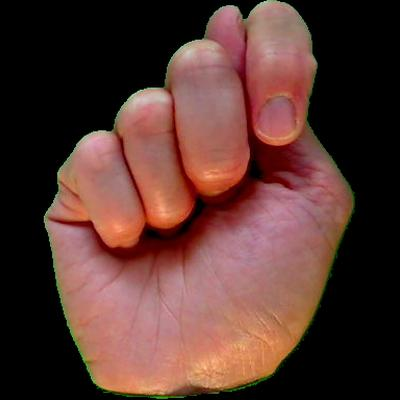

Sign for letter: T


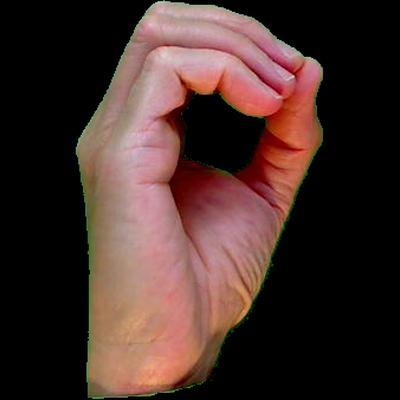

Sign for letter: O


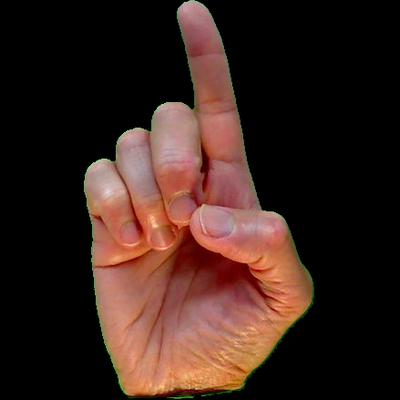

Sign for letter: D


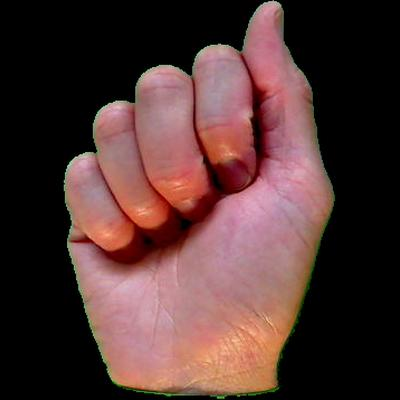

Sign for letter: A


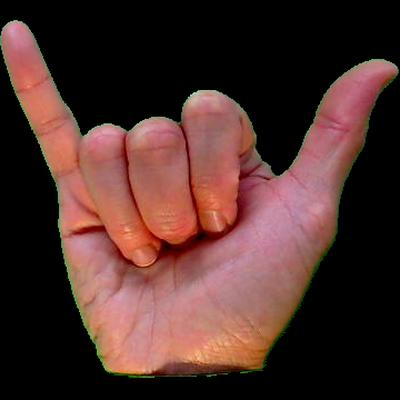

Sign for letter: Y
No sign image available for: ?

Audio for hearing person:



Your response (type here): CAN YOU HELP ME WITH MY PROJECT?

Displaying your response as signs:


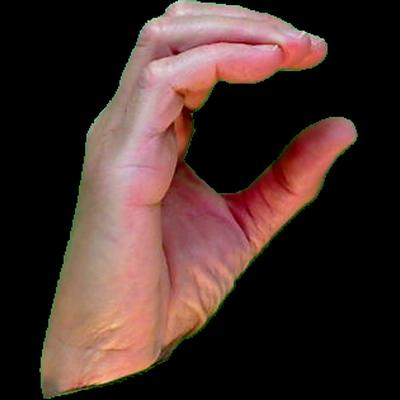

Sign for letter: C


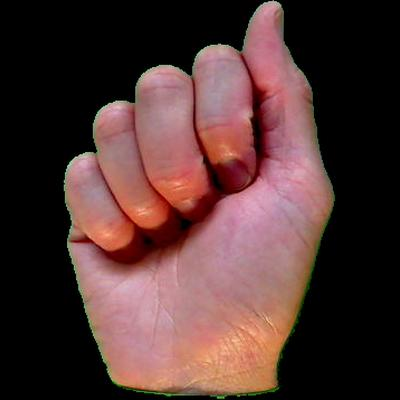

Sign for letter: A


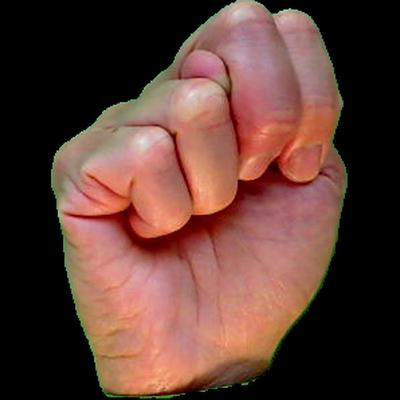

Sign for letter: N


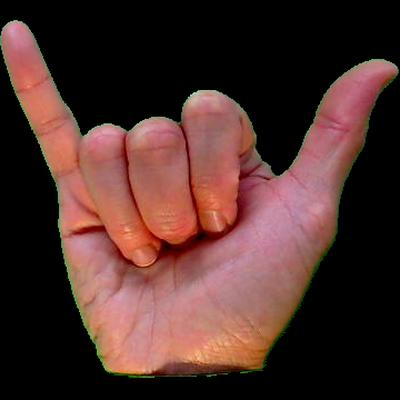

Sign for letter: Y


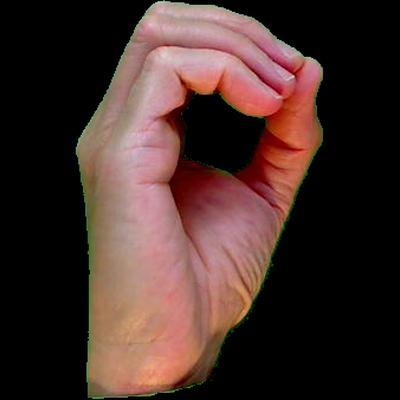

Sign for letter: O


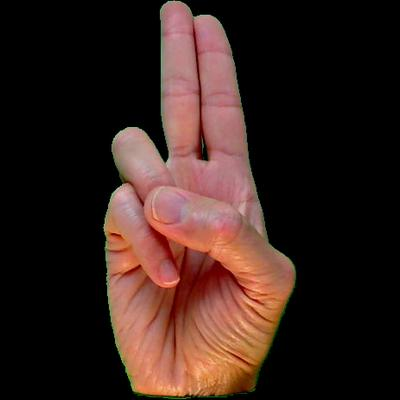

Sign for letter: U


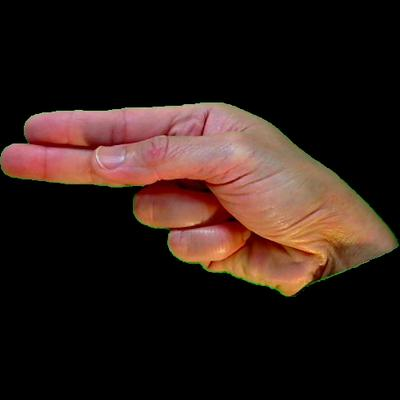

Sign for letter: H


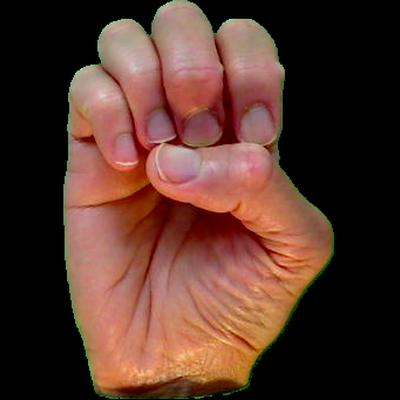

Sign for letter: E


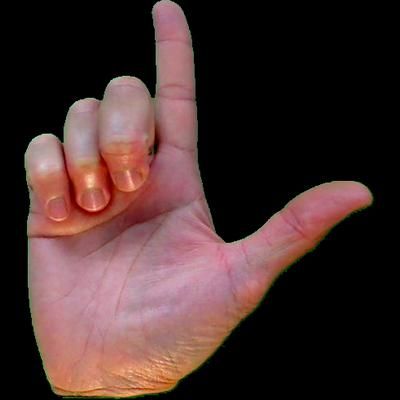

Sign for letter: L


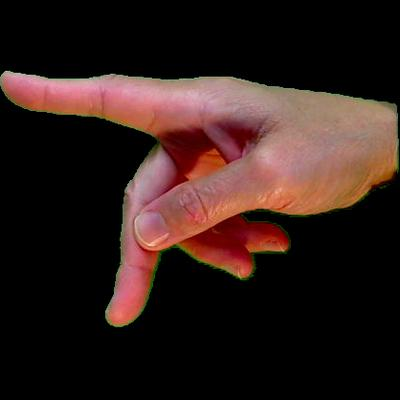

Sign for letter: P


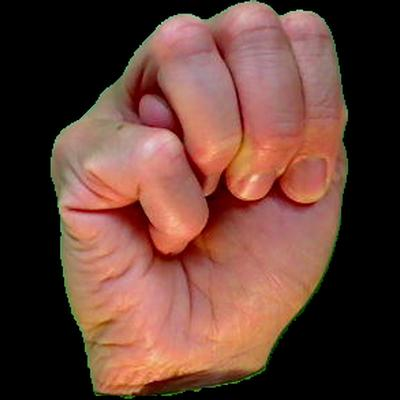

Sign for letter: M


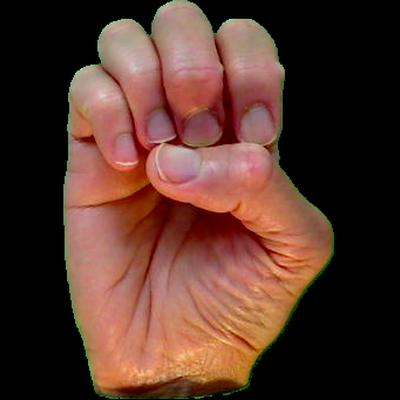

Sign for letter: E


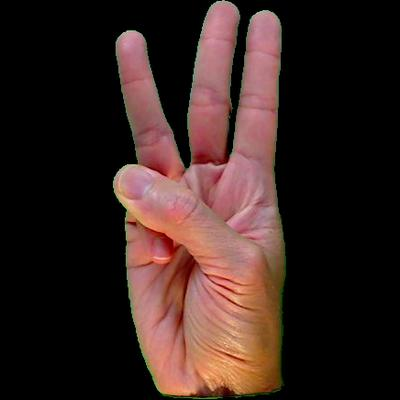

Sign for letter: W


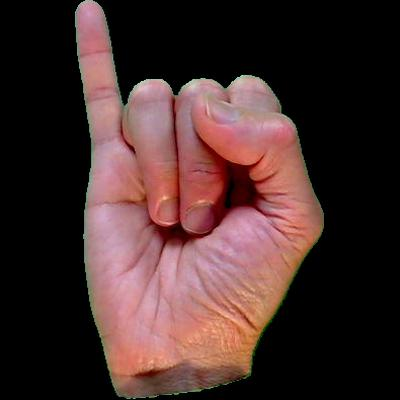

Sign for letter: I


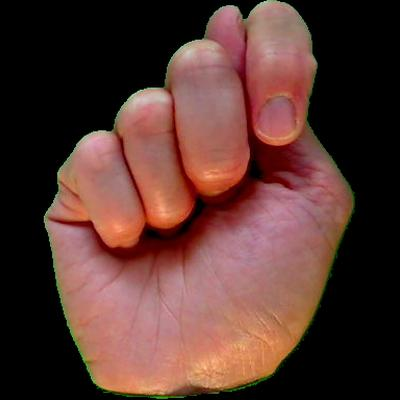

Sign for letter: T


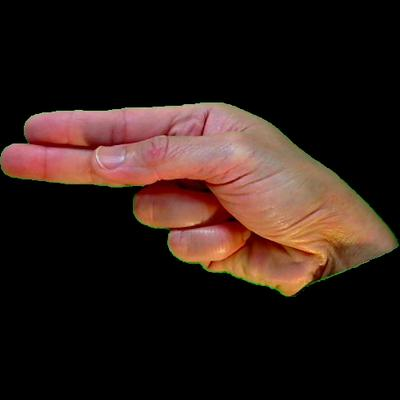

Sign for letter: H


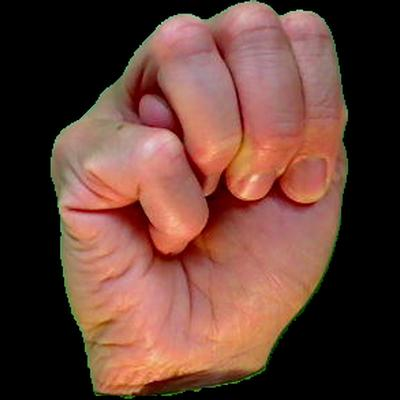

Sign for letter: M


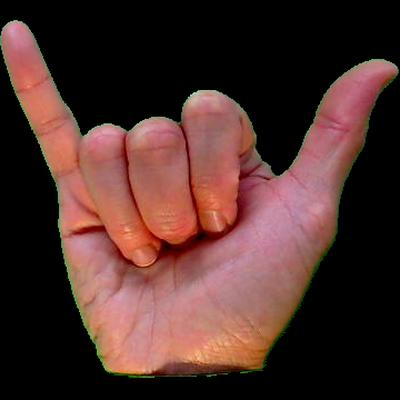

Sign for letter: Y


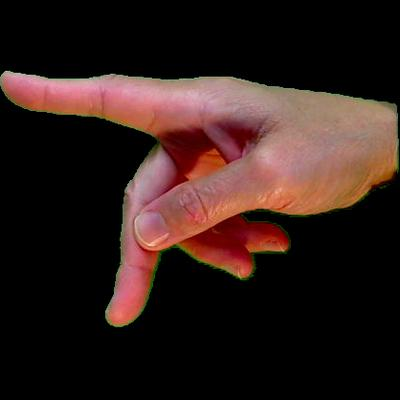

Sign for letter: P


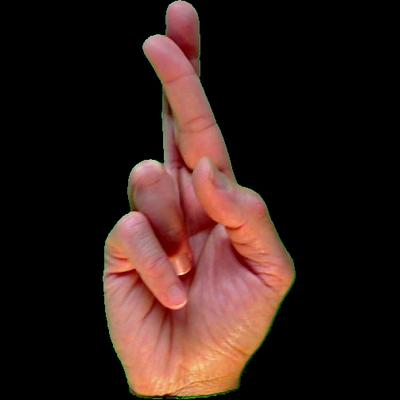

Sign for letter: R


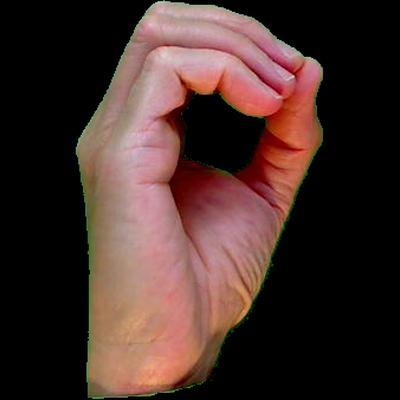

Sign for letter: O


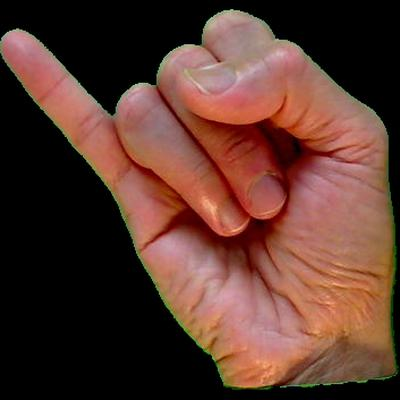

Sign for letter: J


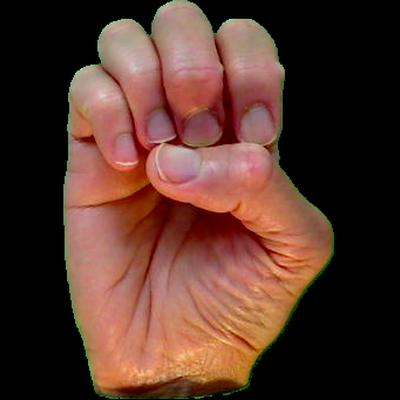

Sign for letter: E


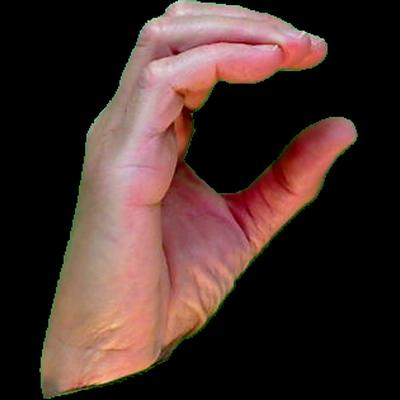

Sign for letter: C


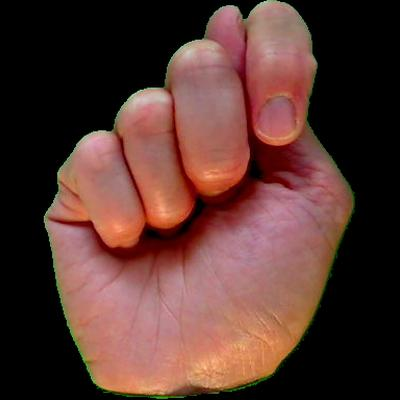

Sign for letter: T
No sign image available for: ?

Deaf Person Signing: I can help you with the project if you need it.


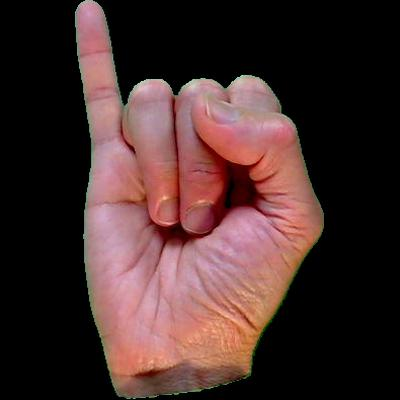

Sign for letter: I


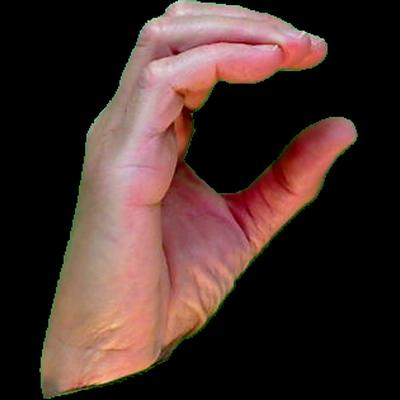

Sign for letter: C


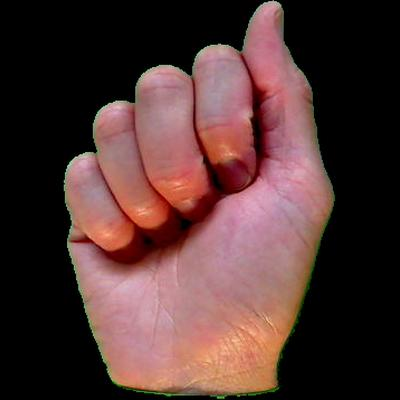

Sign for letter: A


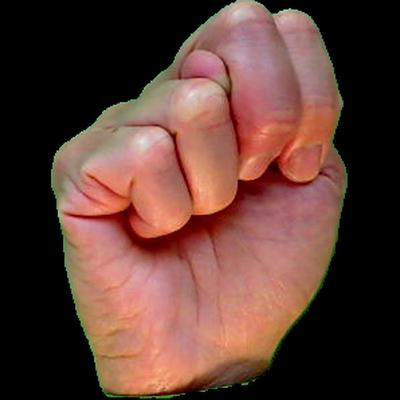

Sign for letter: N


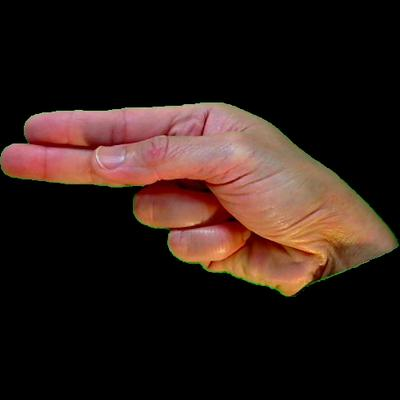

Sign for letter: H


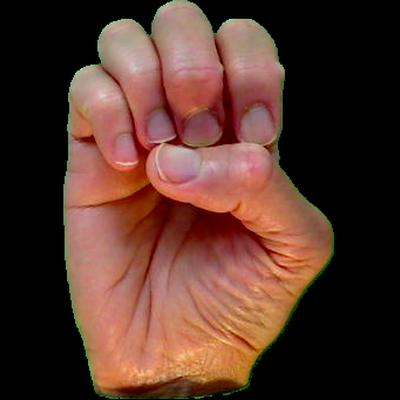

Sign for letter: E


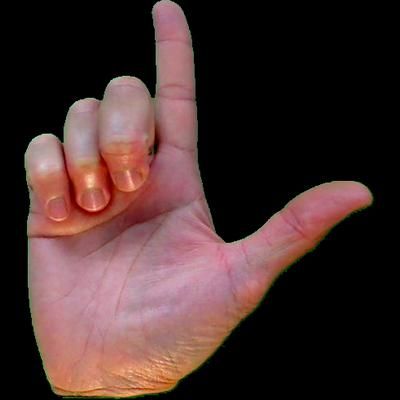

Sign for letter: L


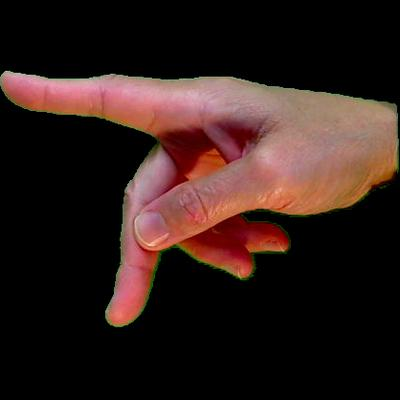

Sign for letter: P


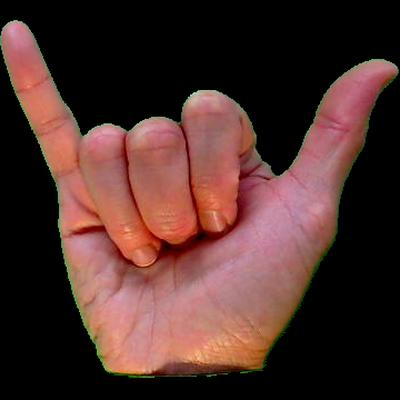

Sign for letter: Y


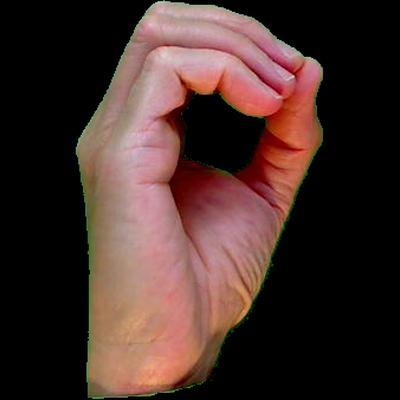

Sign for letter: O


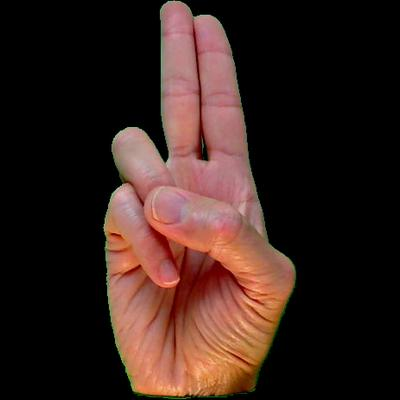

Sign for letter: U


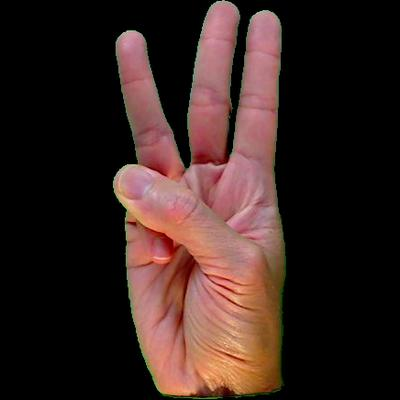

Sign for letter: W


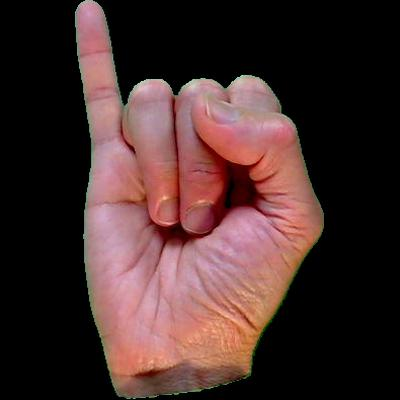

Sign for letter: I


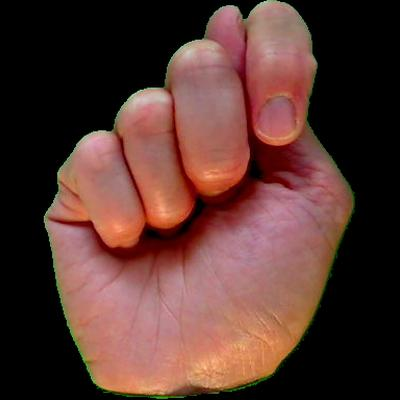

Sign for letter: T


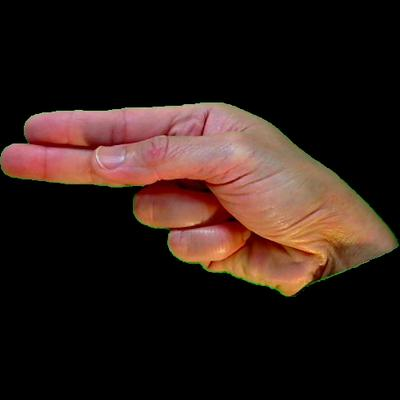

Sign for letter: H


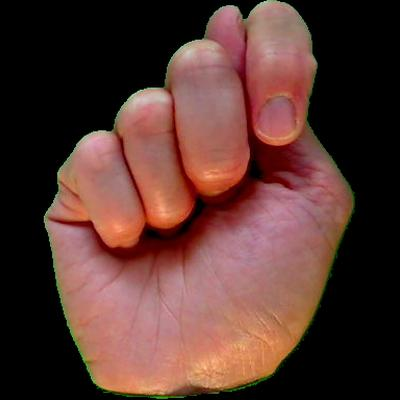

Sign for letter: T


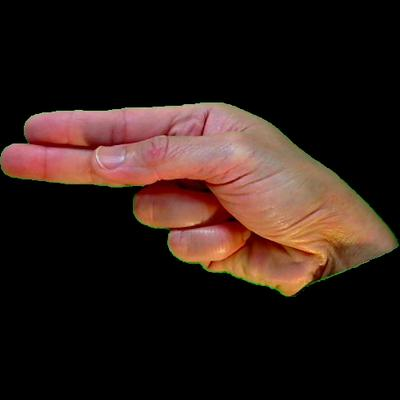

Sign for letter: H


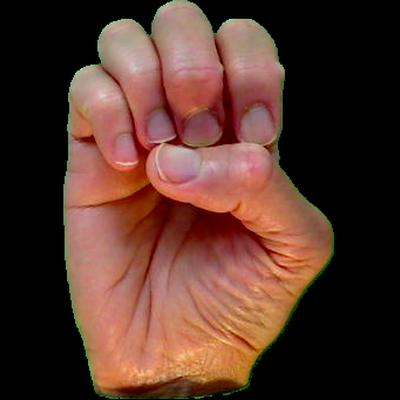

Sign for letter: E


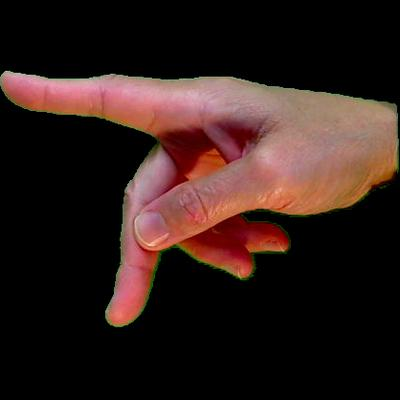

Sign for letter: P


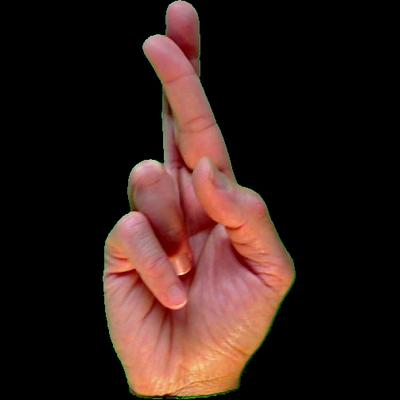

Sign for letter: R


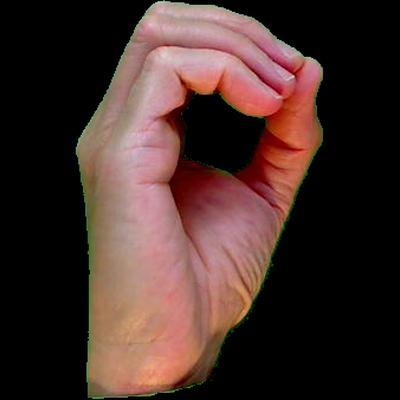

Sign for letter: O


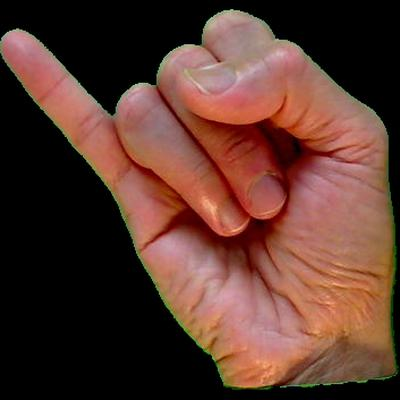

Sign for letter: J


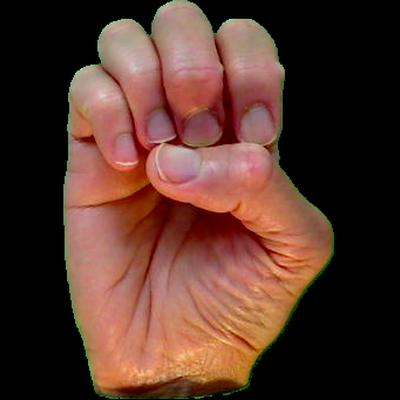

Sign for letter: E


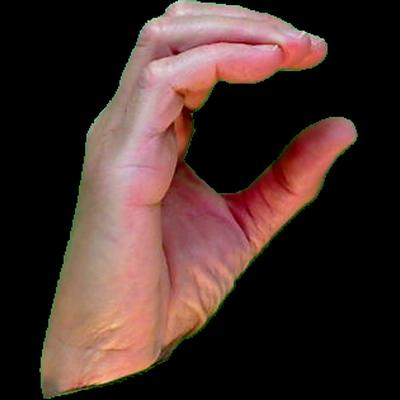

Sign for letter: C


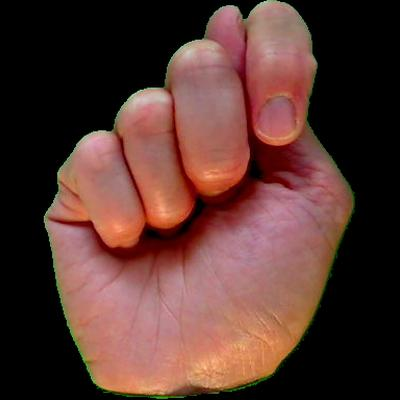

Sign for letter: T


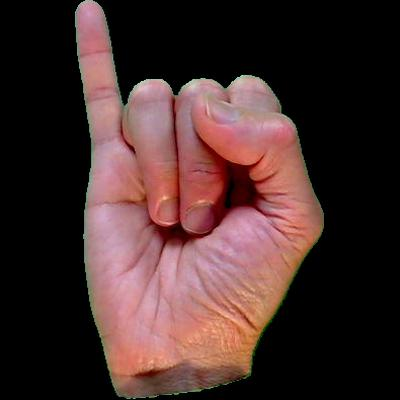

Sign for letter: I


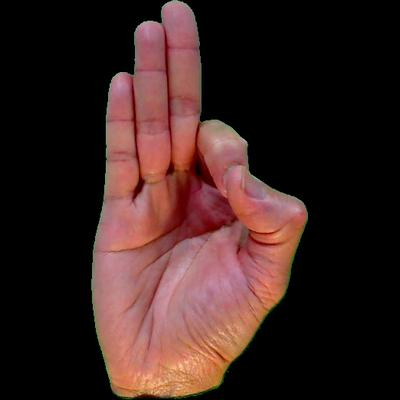

Sign for letter: F


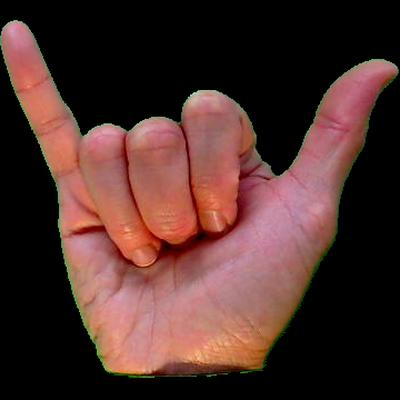

Sign for letter: Y


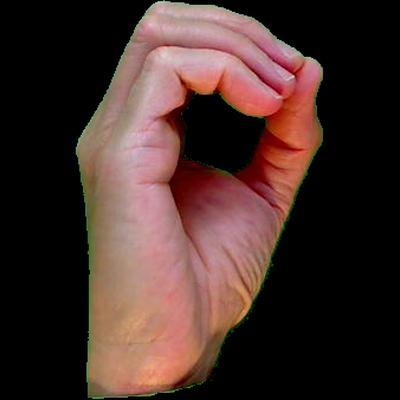

Sign for letter: O


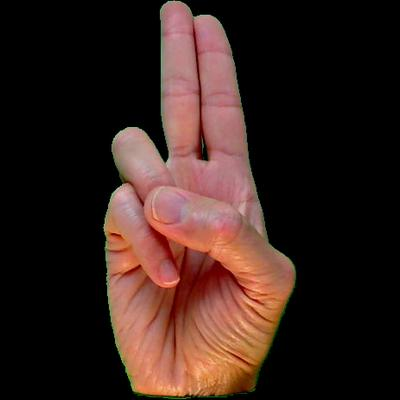

Sign for letter: U


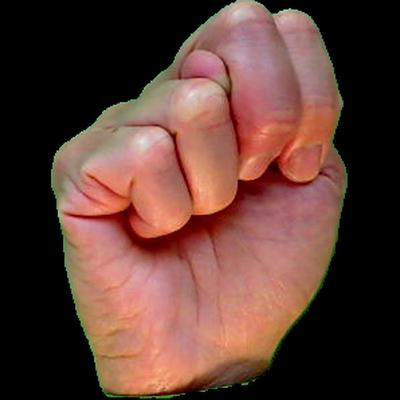

Sign for letter: N


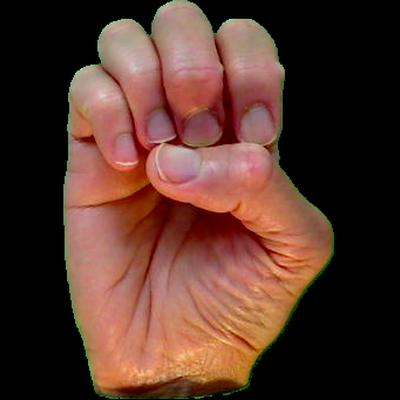

Sign for letter: E


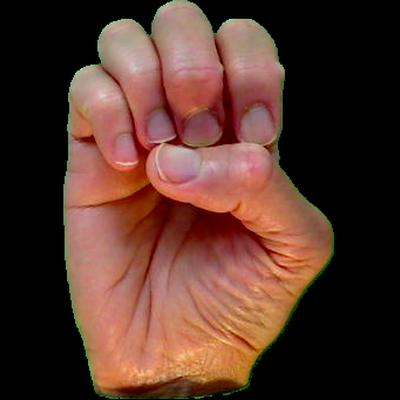

Sign for letter: E


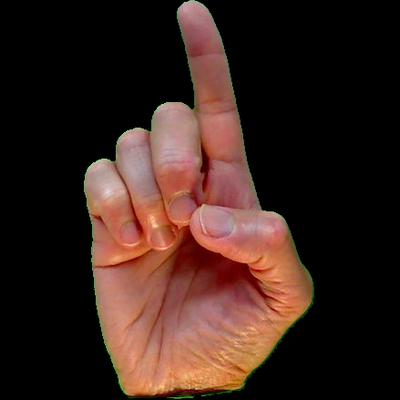

Sign for letter: D


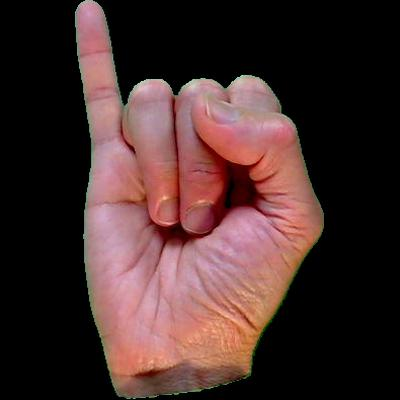

Sign for letter: I


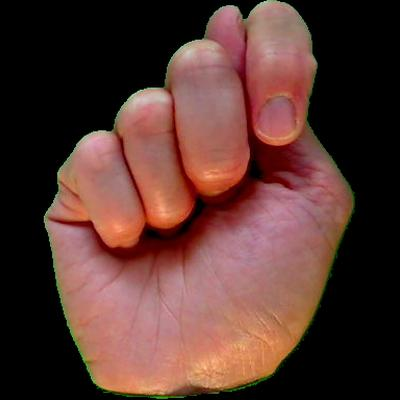

Sign for letter: T
No sign image available for: .

Audio for hearing person:



Your response (type here): THANK YOU!

Displaying your response as signs:


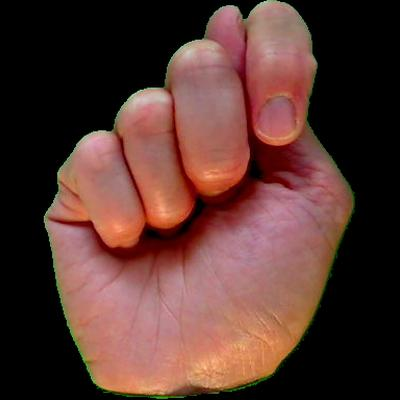

Sign for letter: T


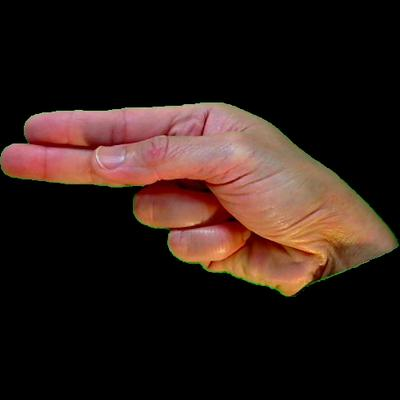

Sign for letter: H


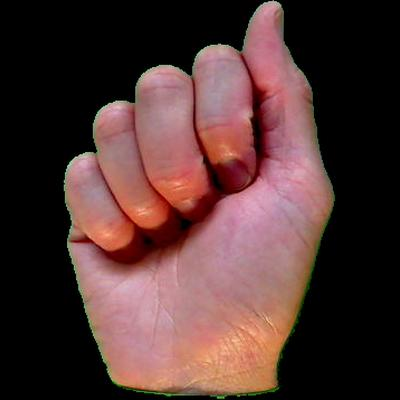

Sign for letter: A


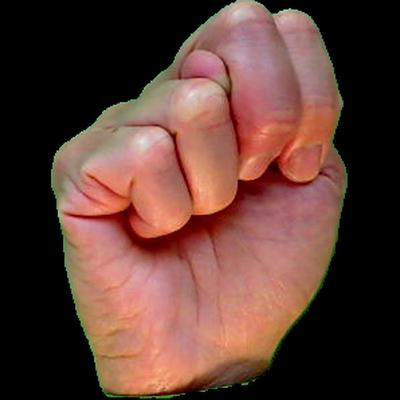

Sign for letter: N


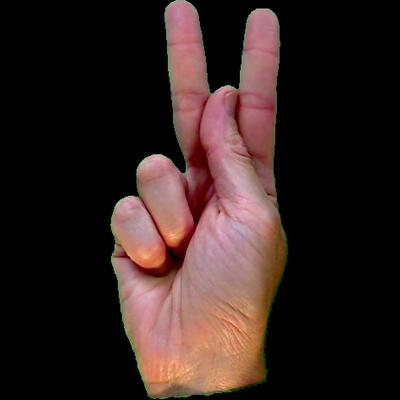

Sign for letter: K


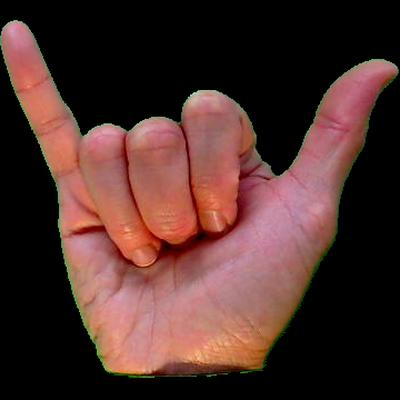

Sign for letter: Y


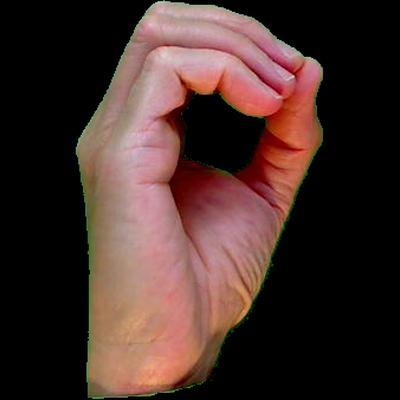

Sign for letter: O


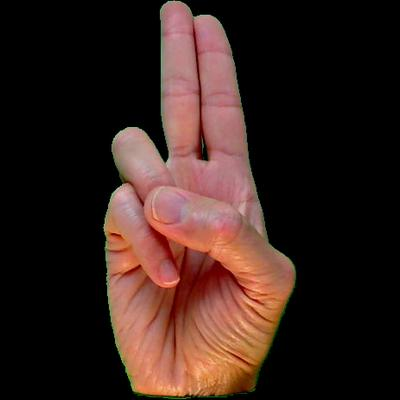

Sign for letter: U
No sign image available for: !

Deaf Person Signing: What's your email?


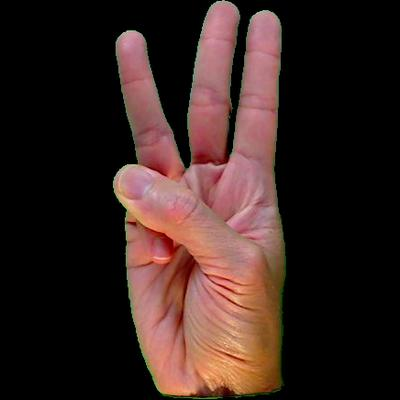

Sign for letter: W


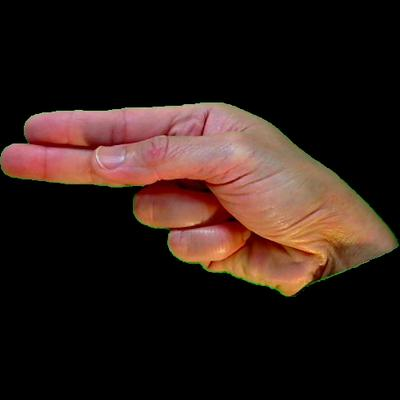

Sign for letter: H


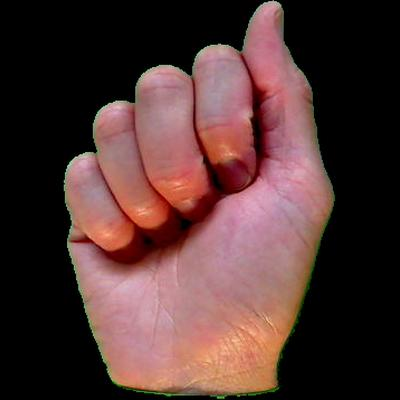

Sign for letter: A


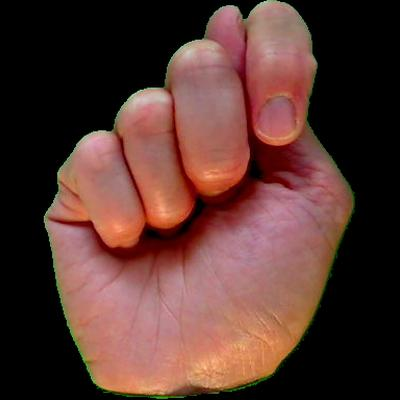

Sign for letter: T
No sign image available for: '


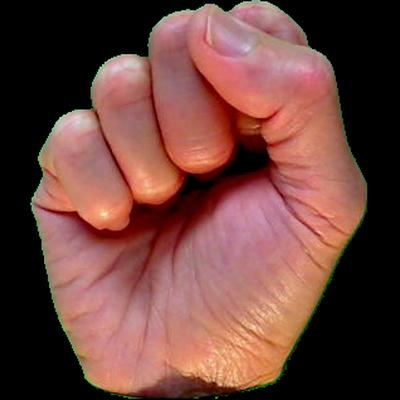

Sign for letter: S


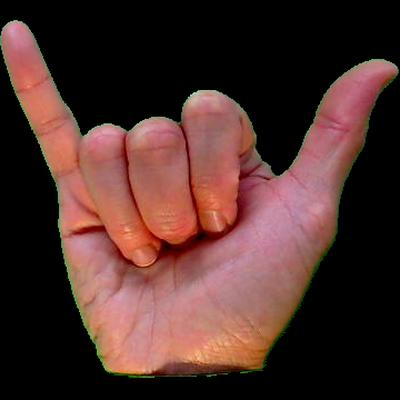

Sign for letter: Y


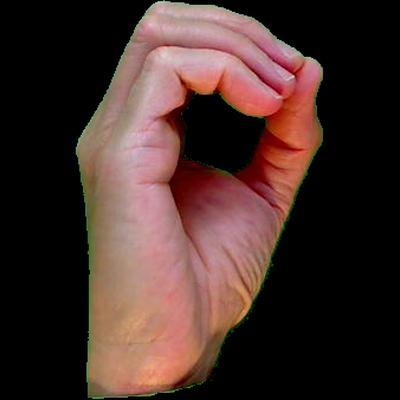

Sign for letter: O


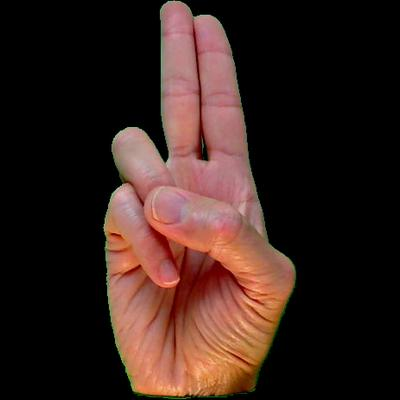

Sign for letter: U


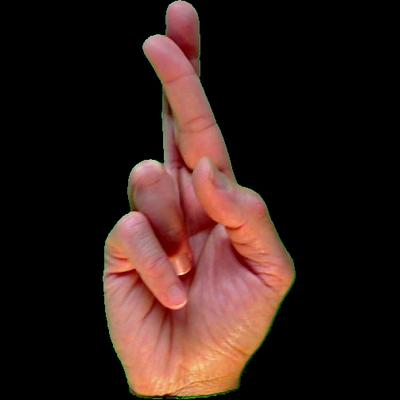

Sign for letter: R


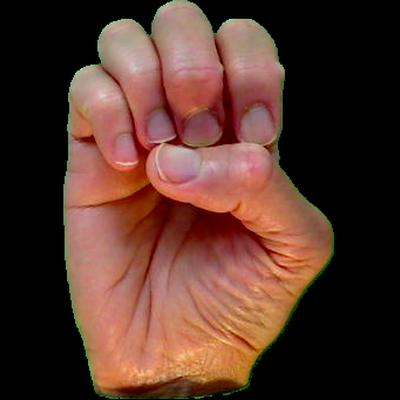

Sign for letter: E


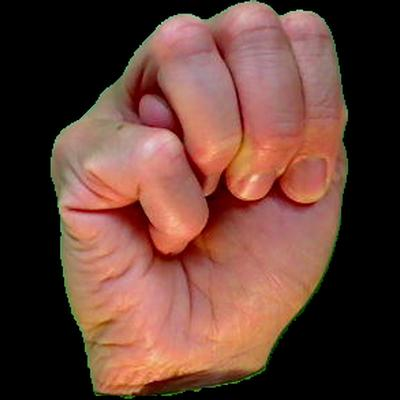

Sign for letter: M


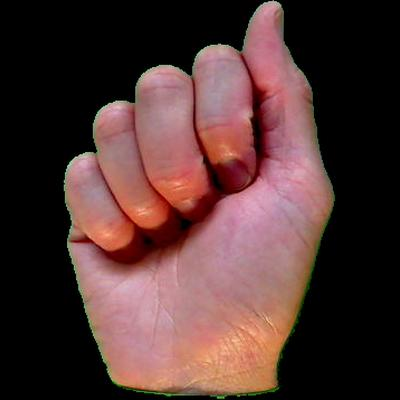

Sign for letter: A


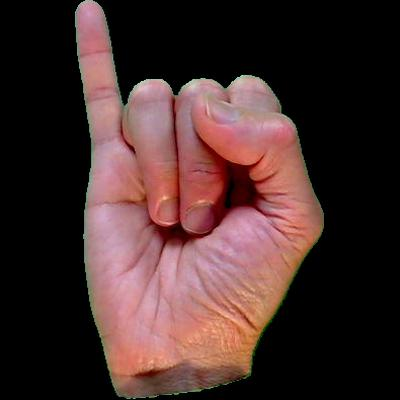

Sign for letter: I


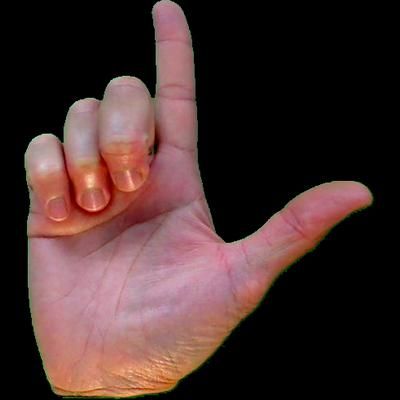

Sign for letter: L
No sign image available for: ?

Audio for hearing person:



Your response (type here): THAT'S PERSONAL

Displaying your response as signs:


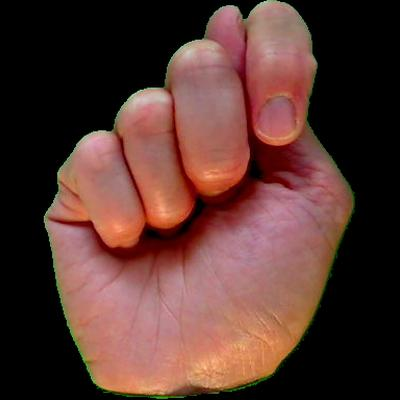

Sign for letter: T


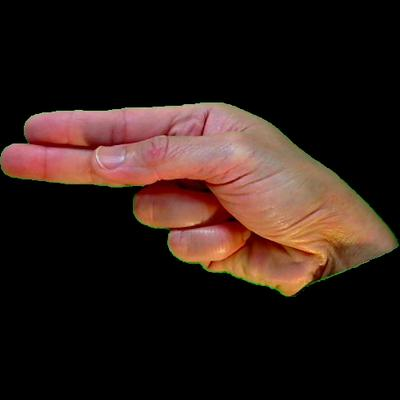

Sign for letter: H


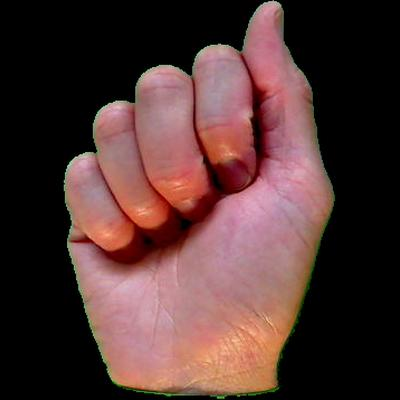

Sign for letter: A


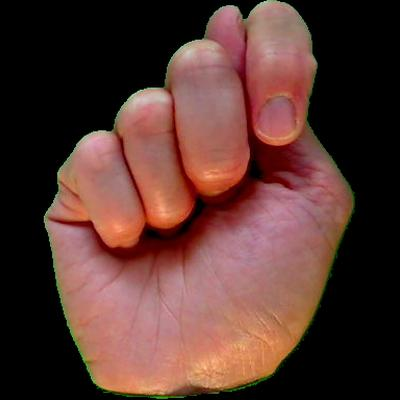

Sign for letter: T
No sign image available for: '


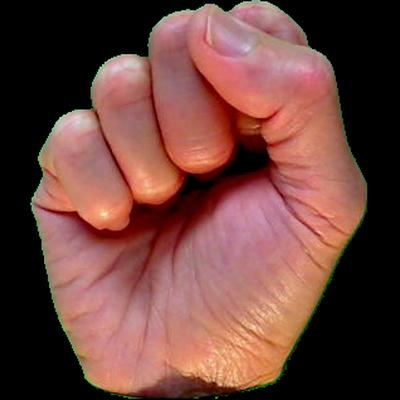

Sign for letter: S


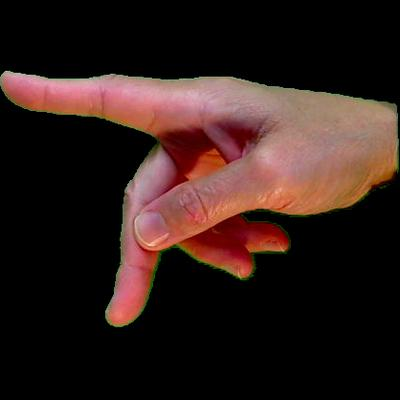

Sign for letter: P


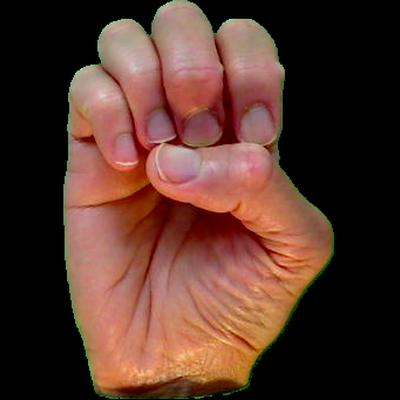

Sign for letter: E


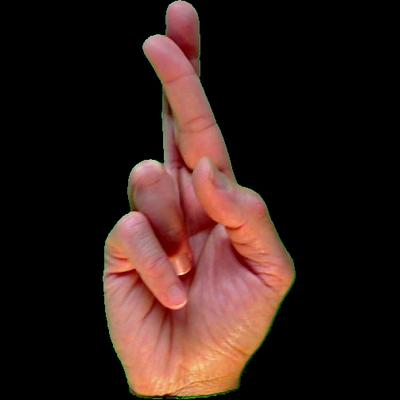

Sign for letter: R


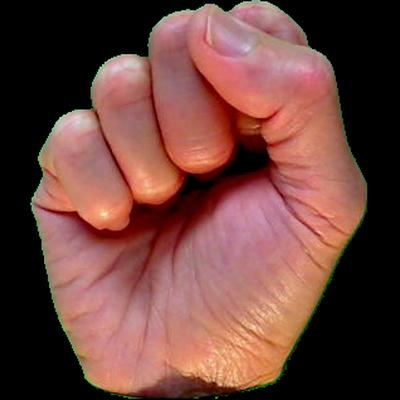

Sign for letter: S


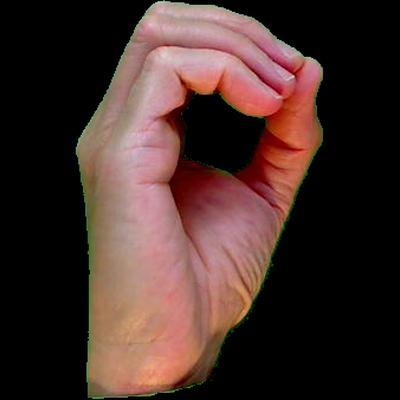

Sign for letter: O


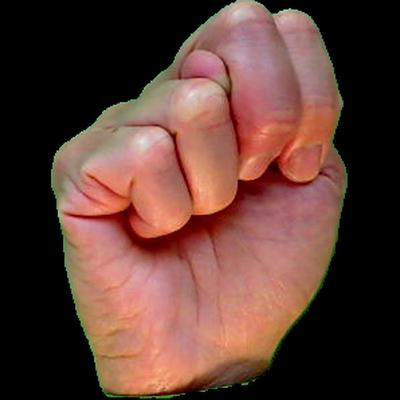

Sign for letter: N


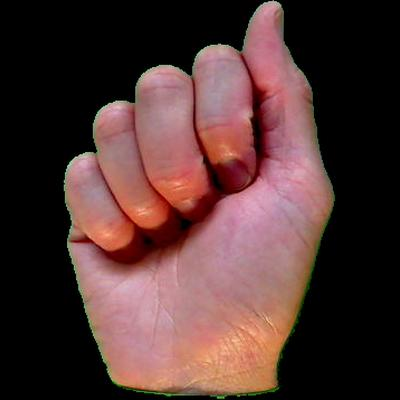

Sign for letter: A


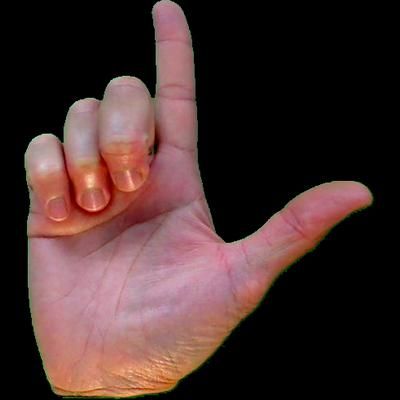

Sign for letter: L

Deaf Person Signing: It is. You can pm me your email.


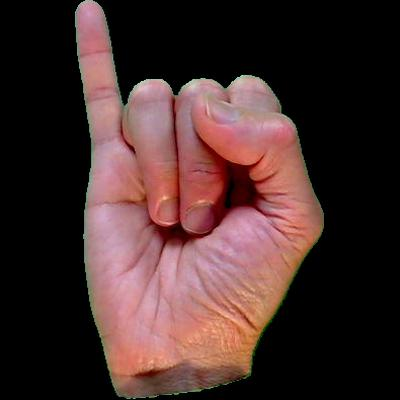

Sign for letter: I


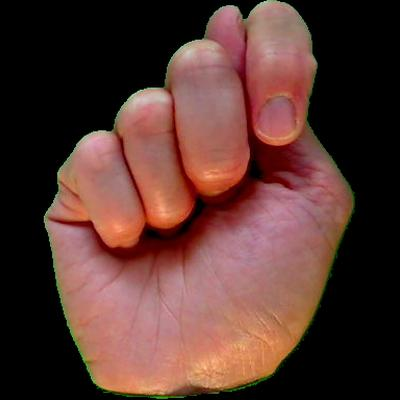

Sign for letter: T


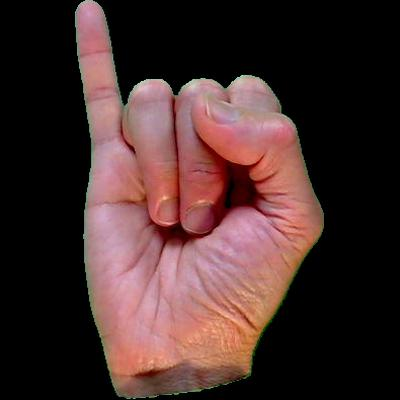

Sign for letter: I


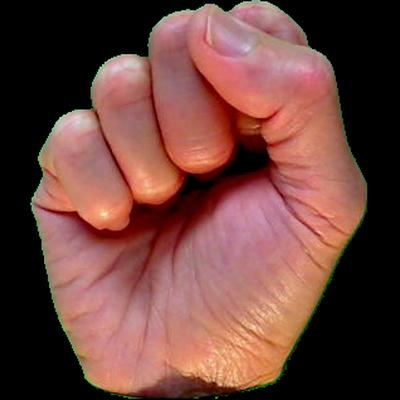

Sign for letter: S
No sign image available for: .


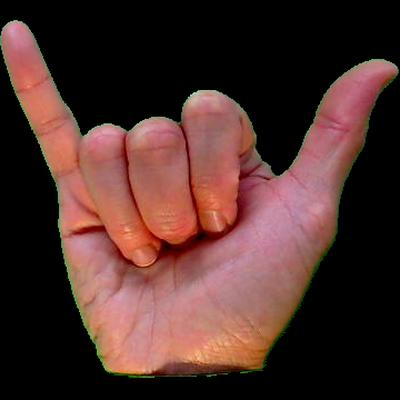

Sign for letter: Y


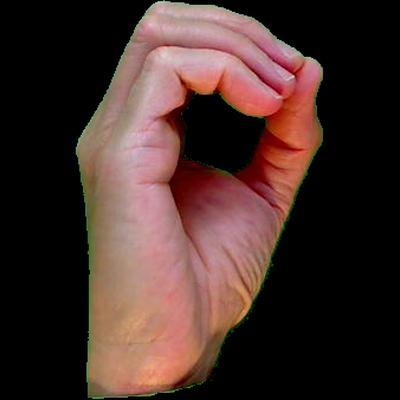

Sign for letter: O


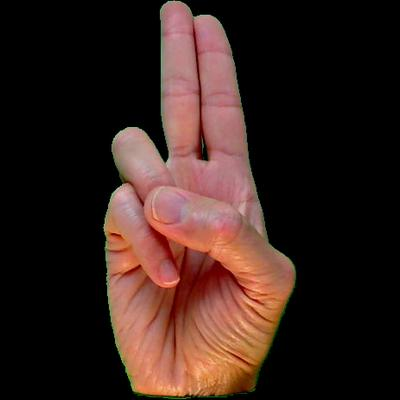

Sign for letter: U


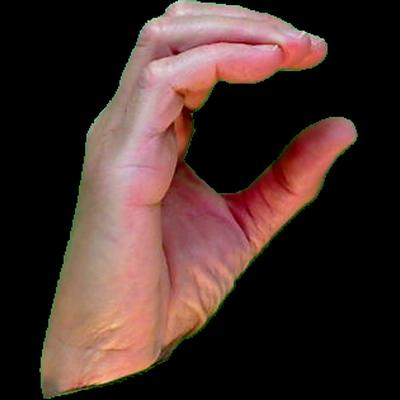

Sign for letter: C


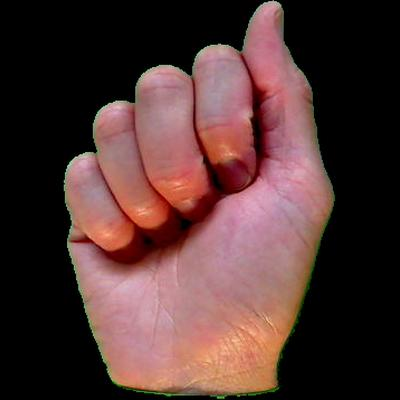

Sign for letter: A


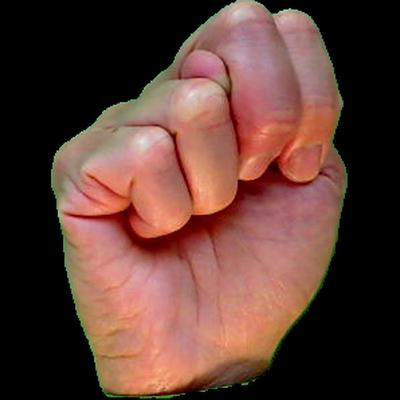

Sign for letter: N


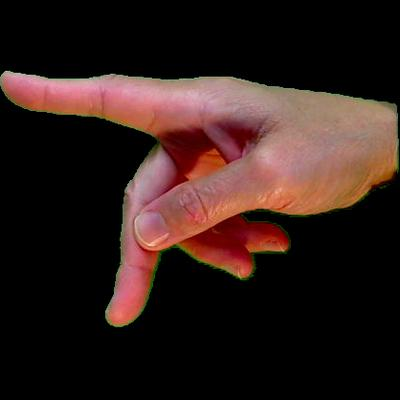

Sign for letter: P


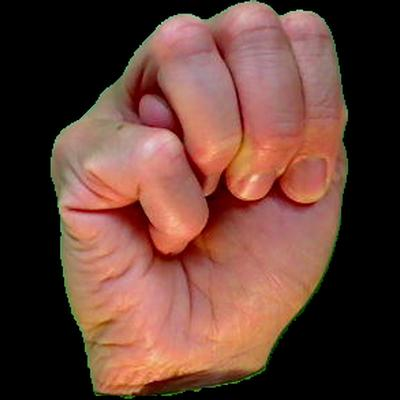

Sign for letter: M


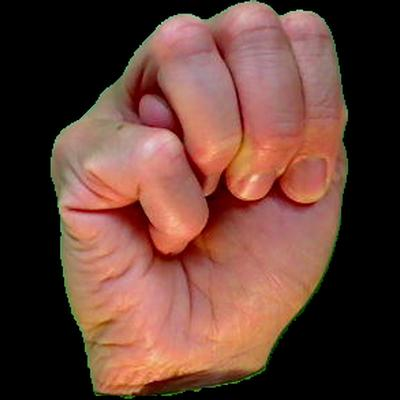

Sign for letter: M


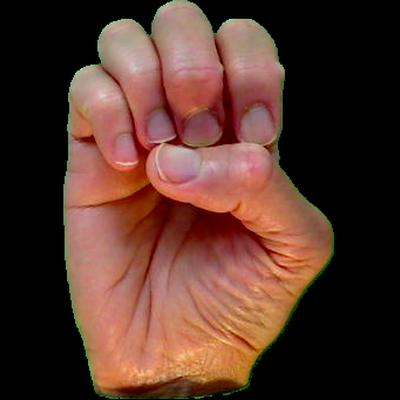

Sign for letter: E


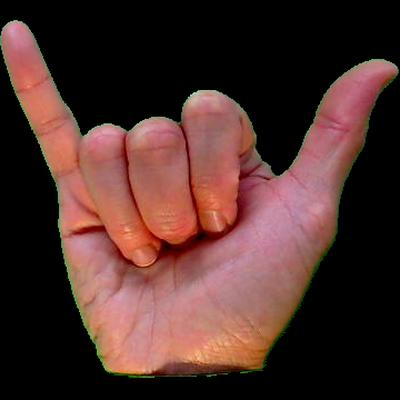

Sign for letter: Y


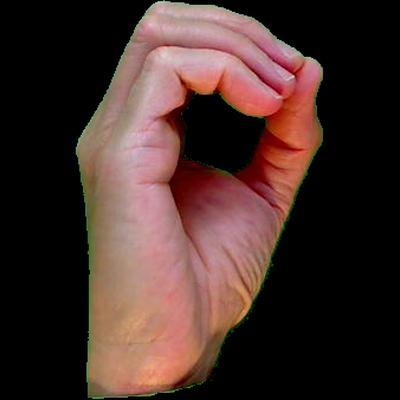

Sign for letter: O


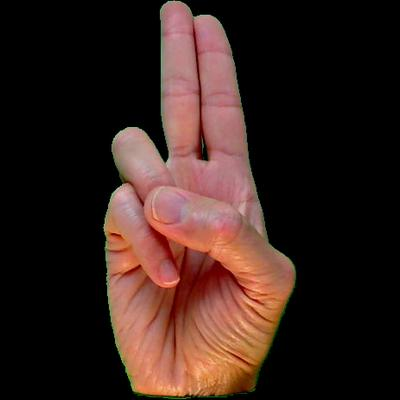

Sign for letter: U


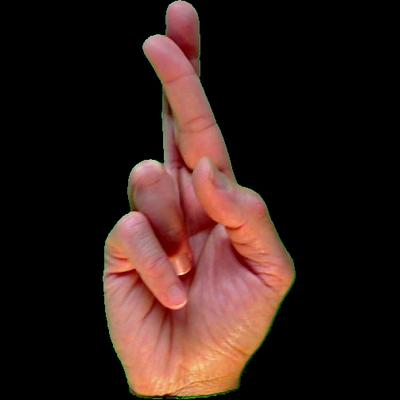

Sign for letter: R


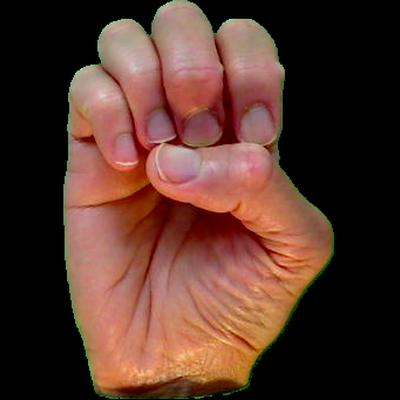

Sign for letter: E


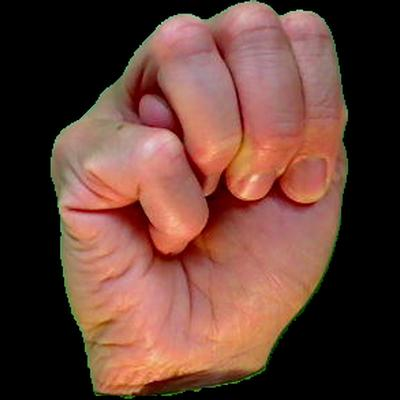

Sign for letter: M


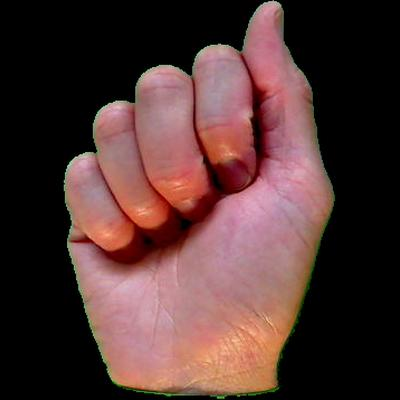

Sign for letter: A


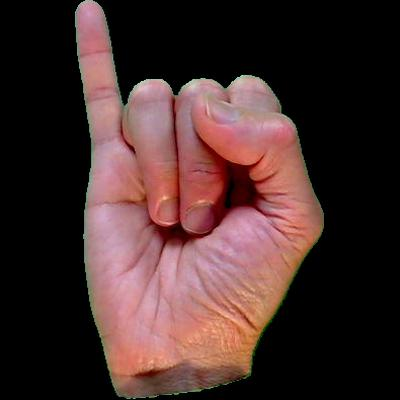

Sign for letter: I


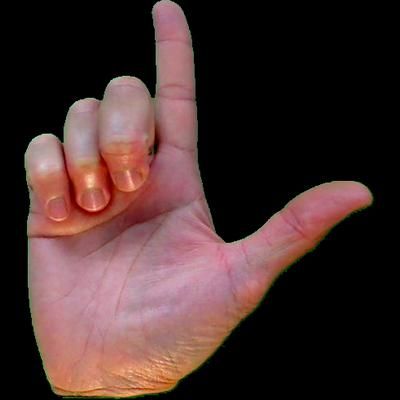

Sign for letter: L
No sign image available for: .

Audio for hearing person:



Your response (type here): OKAY. I WILL.

Displaying your response as signs:


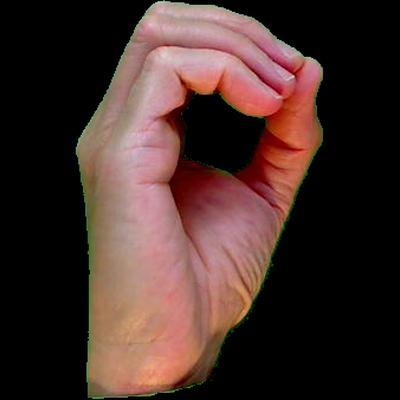

Sign for letter: O


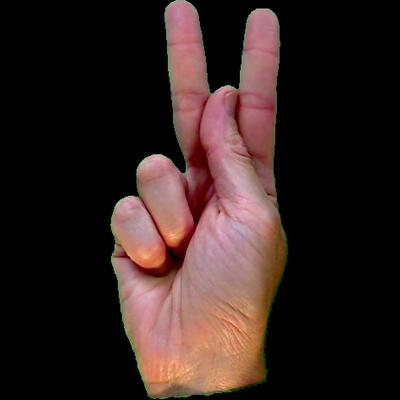

Sign for letter: K


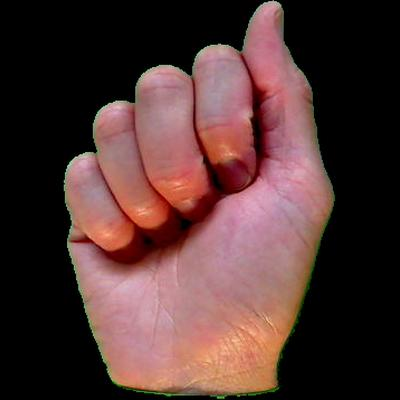

Sign for letter: A


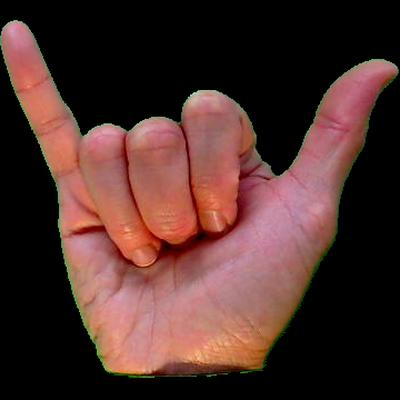

Sign for letter: Y
No sign image available for: .


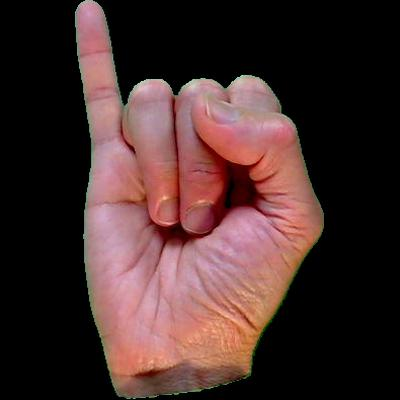

Sign for letter: I


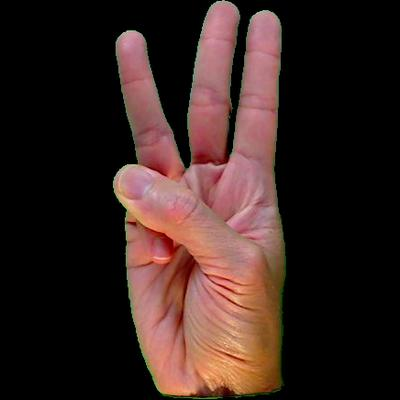

Sign for letter: W


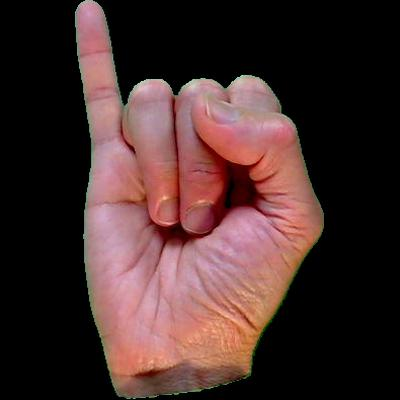

Sign for letter: I


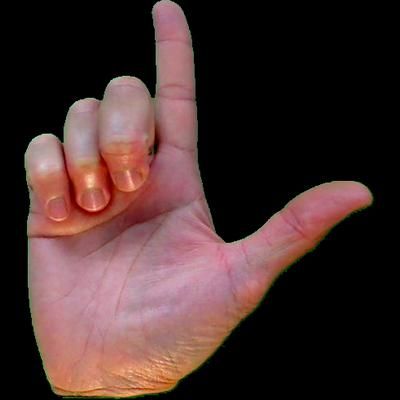

Sign for letter: L


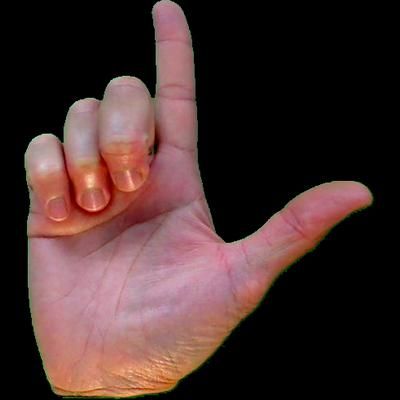

Sign for letter: L
No sign image available for: .

Deaf Person Signing: Okay. PM me your address and I'll get it to you asap.


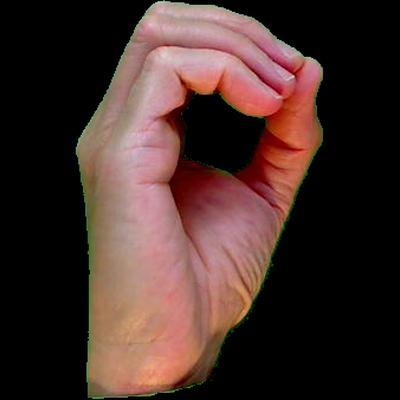

Sign for letter: O


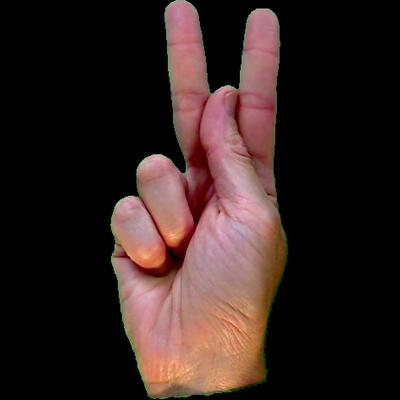

Sign for letter: K


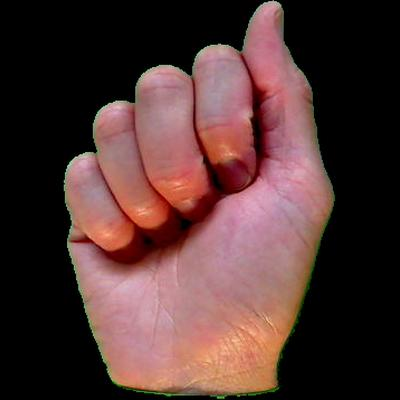

Sign for letter: A


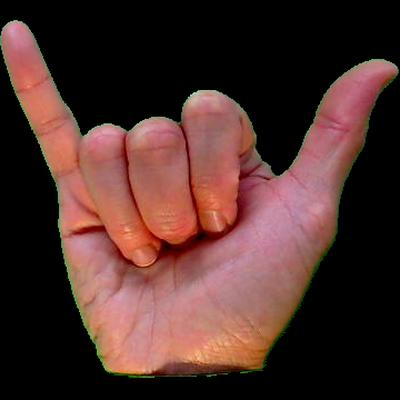

Sign for letter: Y
No sign image available for: .


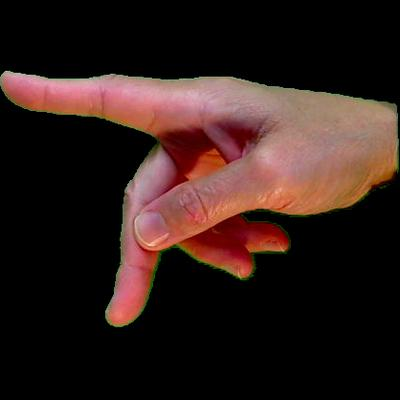

Sign for letter: P


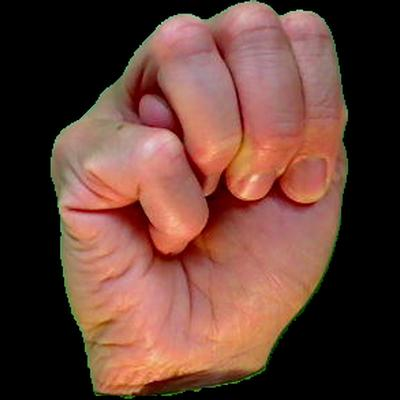

Sign for letter: M


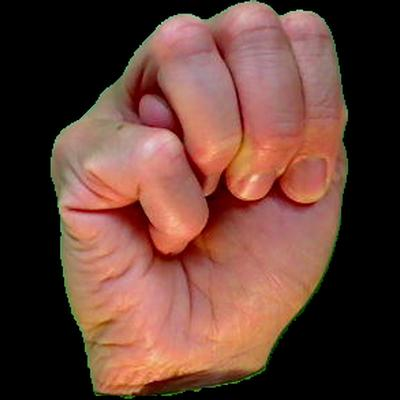

Sign for letter: M


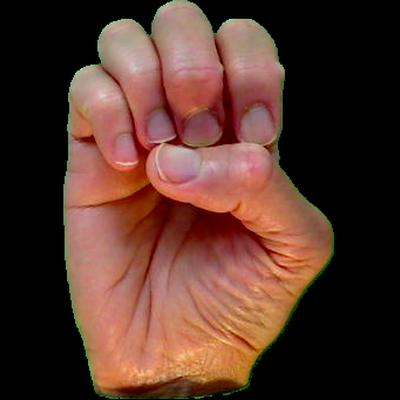

Sign for letter: E


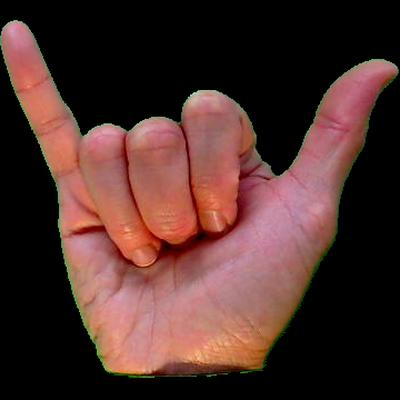

Sign for letter: Y


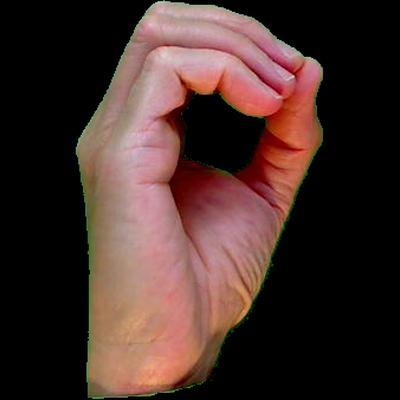

Sign for letter: O


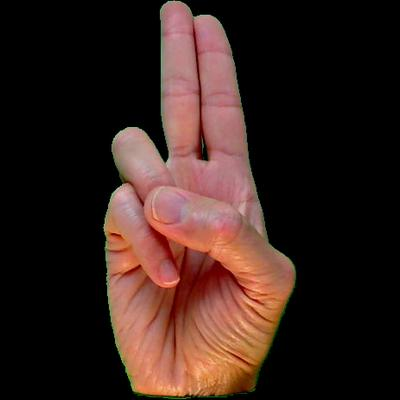

Sign for letter: U


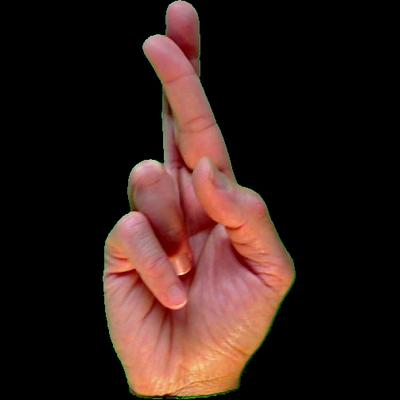

Sign for letter: R


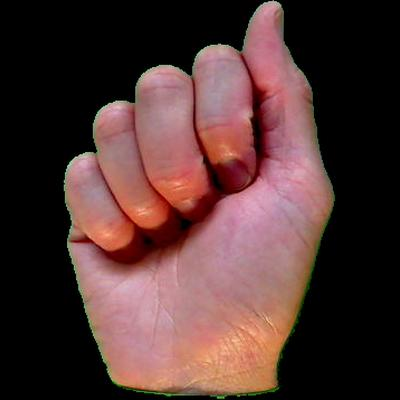

Sign for letter: A


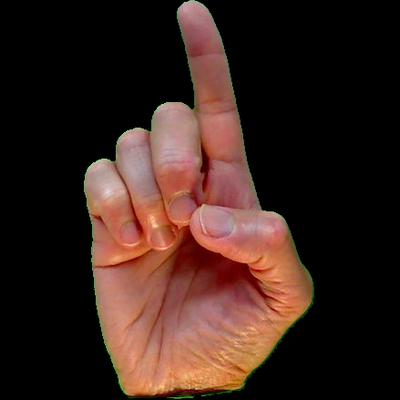

Sign for letter: D


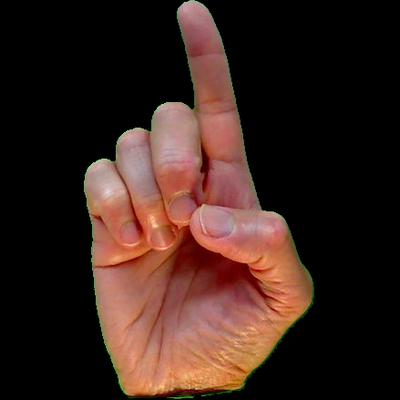

Sign for letter: D


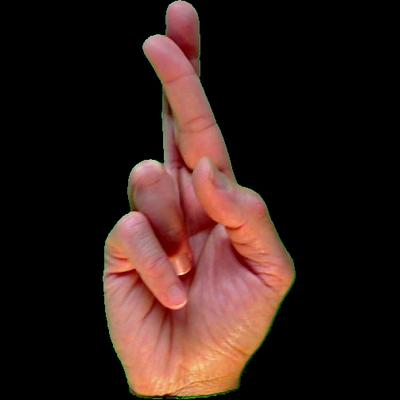

Sign for letter: R


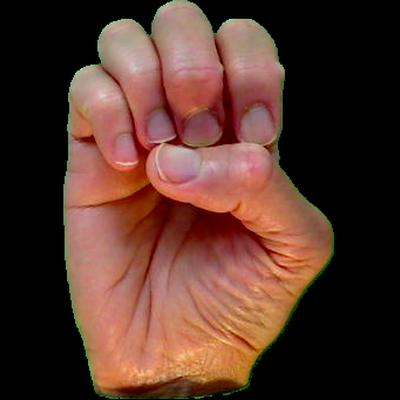

Sign for letter: E


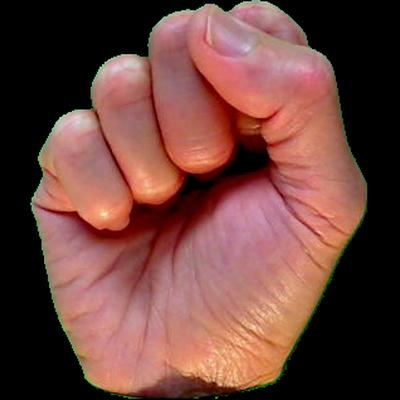

Sign for letter: S


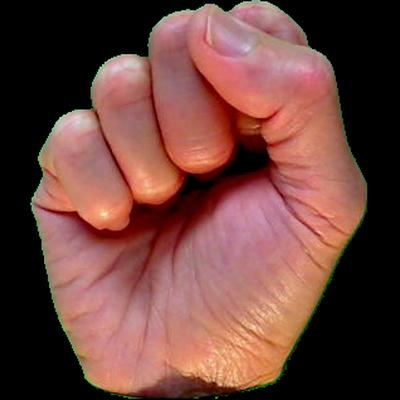

Sign for letter: S


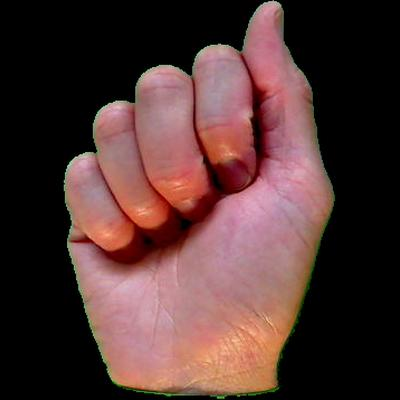

Sign for letter: A


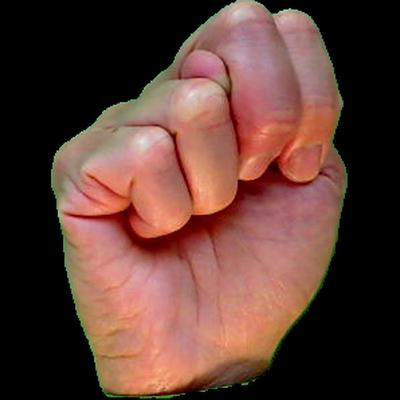

Sign for letter: N


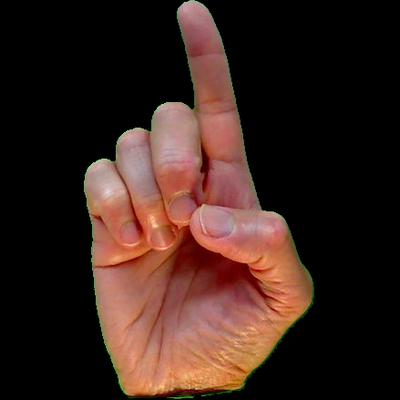

Sign for letter: D


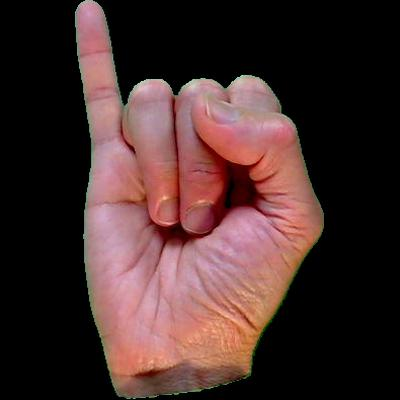

Sign for letter: I
No sign image available for: '


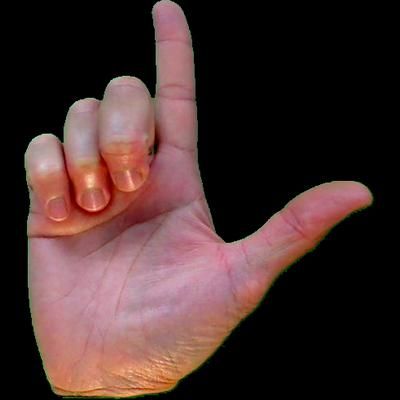

Sign for letter: L


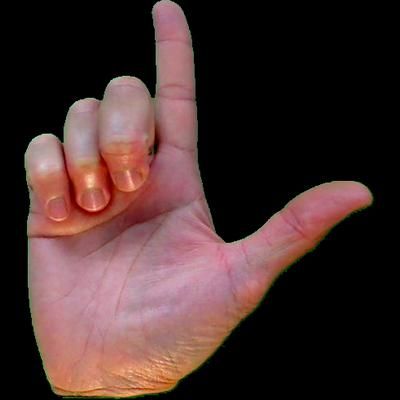

Sign for letter: L


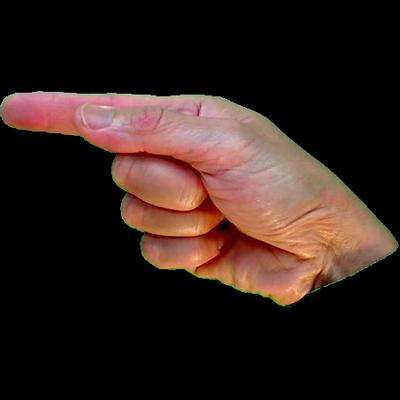

Sign for letter: G


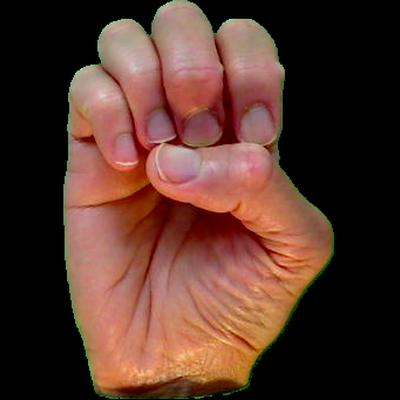

Sign for letter: E


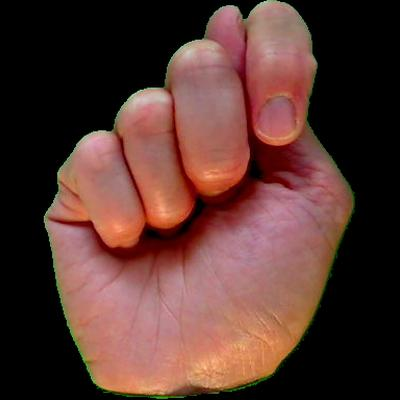

Sign for letter: T


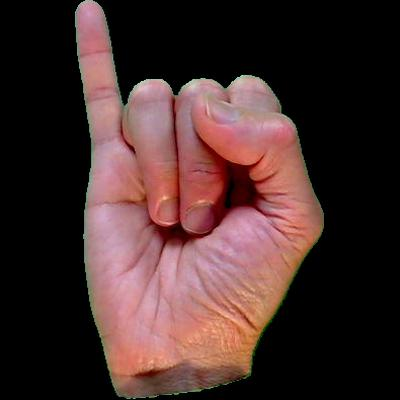

Sign for letter: I


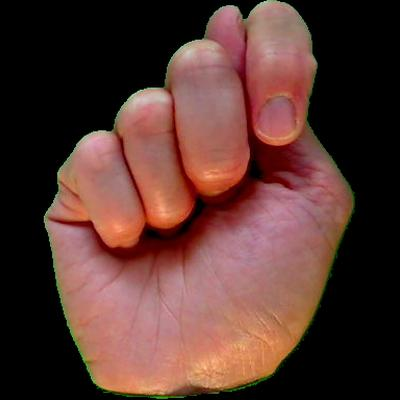

Sign for letter: T


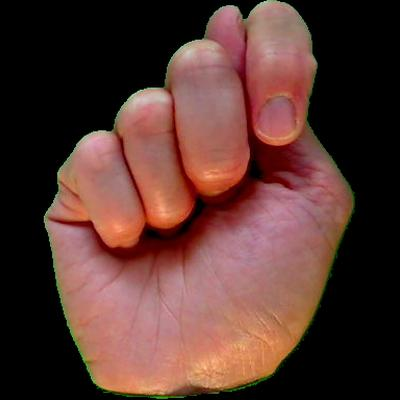

Sign for letter: T


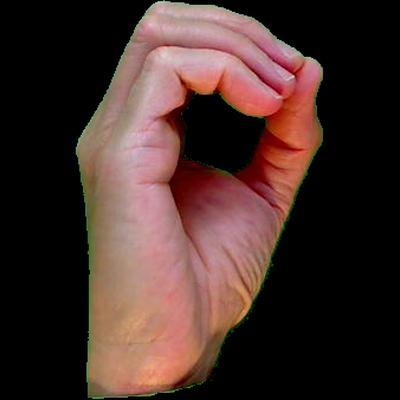

Sign for letter: O


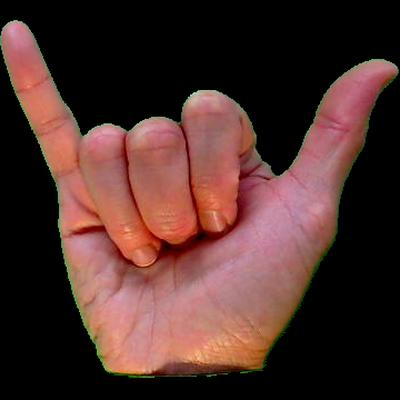

Sign for letter: Y


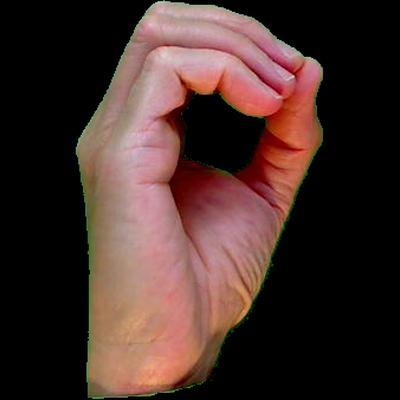

Sign for letter: O


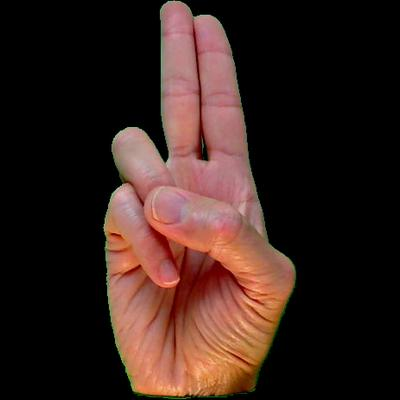

Sign for letter: U


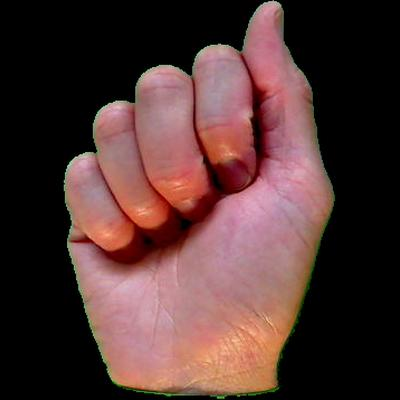

Sign for letter: A


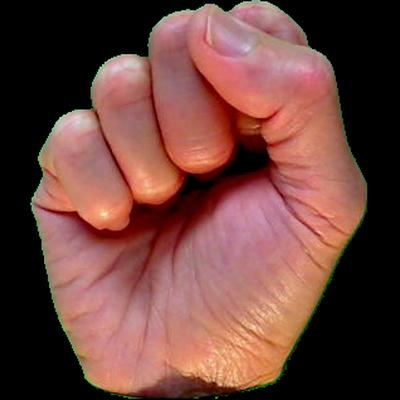

Sign for letter: S


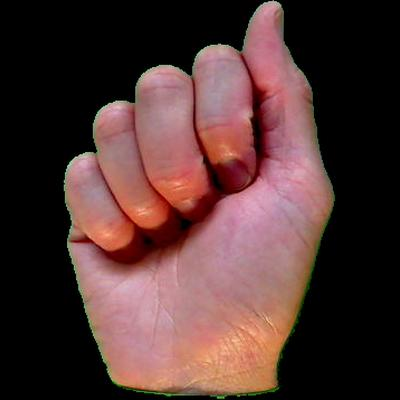

Sign for letter: A


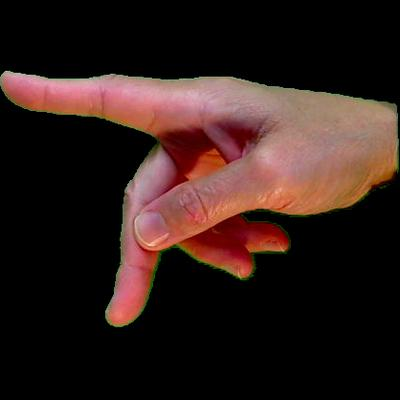

Sign for letter: P
No sign image available for: .

Audio for hearing person:



Your response (type here): THANK YOU

Displaying your response as signs:


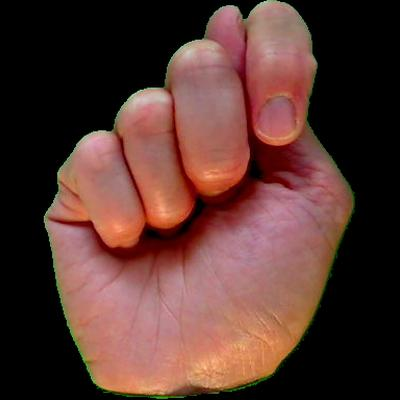

Sign for letter: T


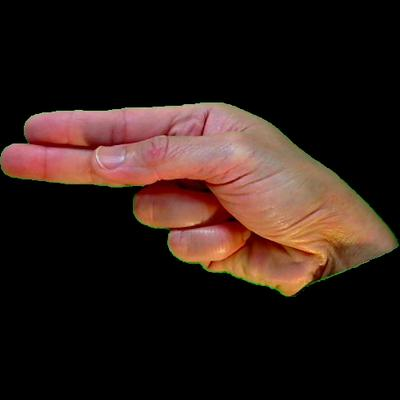

Sign for letter: H


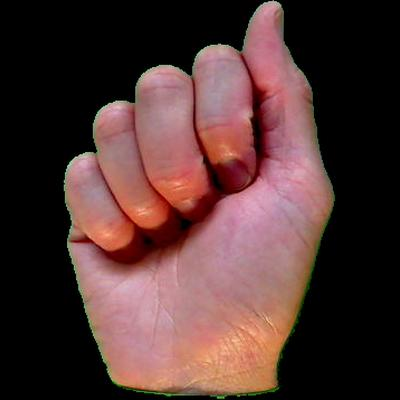

Sign for letter: A


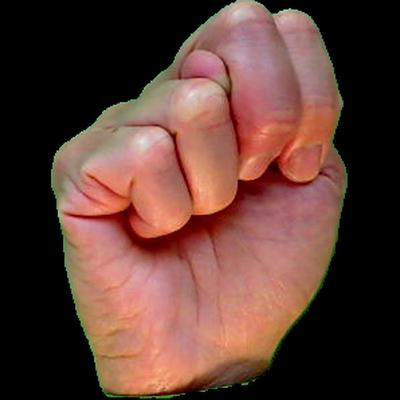

Sign for letter: N


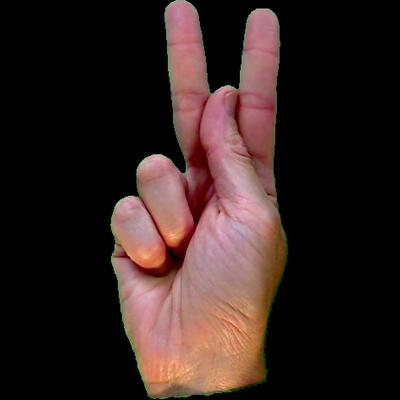

Sign for letter: K


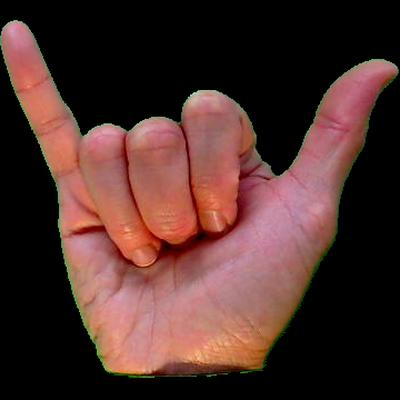

Sign for letter: Y


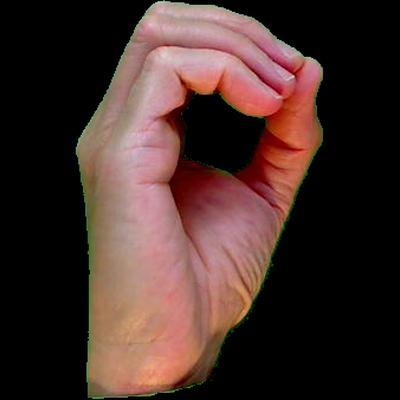

Sign for letter: O


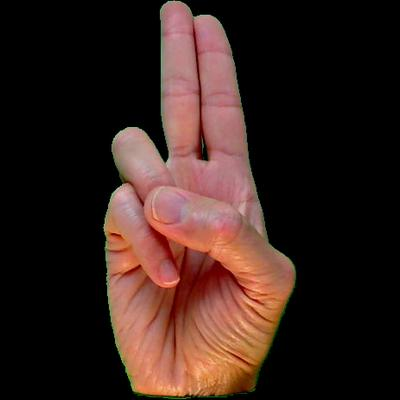

Sign for letter: U

Deaf Person Signing: PM'ed you


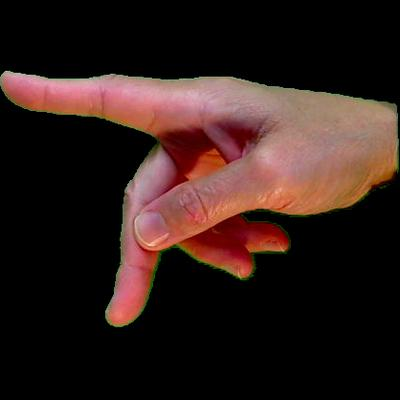

Sign for letter: P


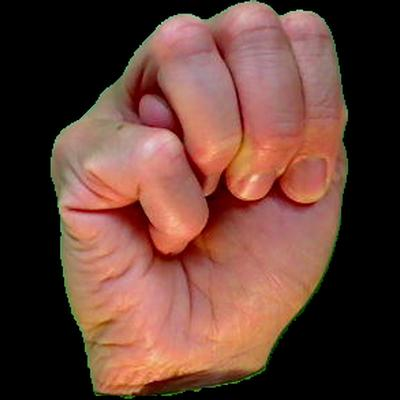

Sign for letter: M
No sign image available for: '


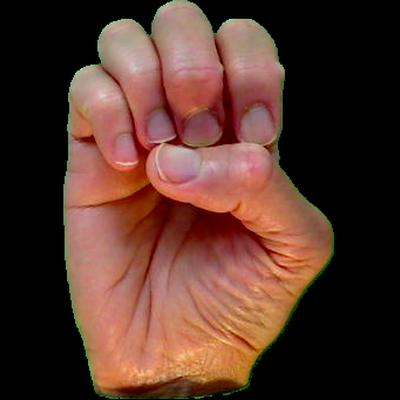

Sign for letter: E


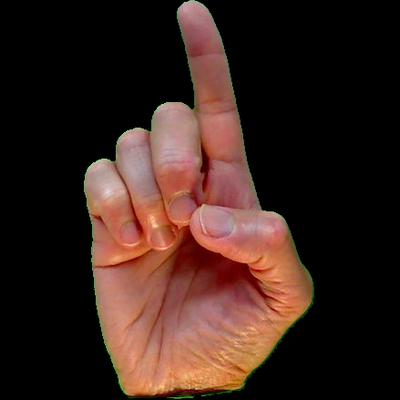

Sign for letter: D


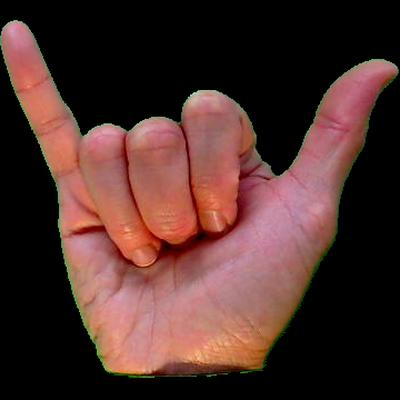

Sign for letter: Y


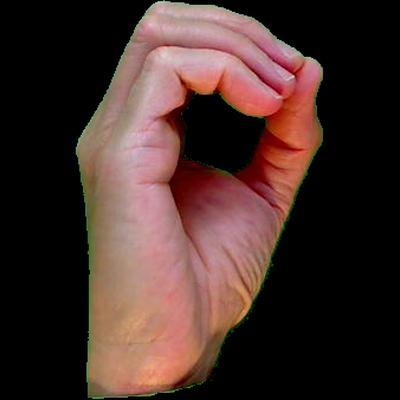

Sign for letter: O


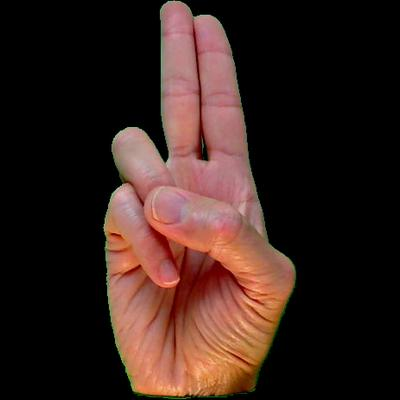

Sign for letter: U

Audio for hearing person:



Your response (type here): DONE

Displaying your response as signs:


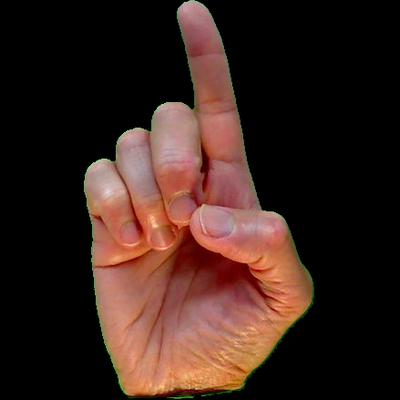

Sign for letter: D


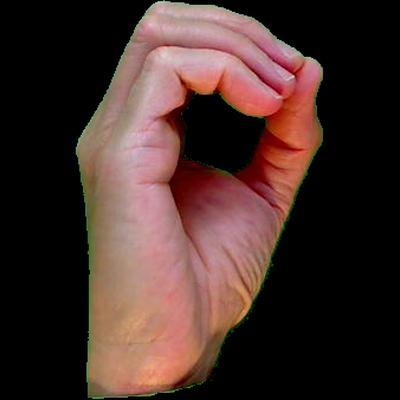

Sign for letter: O


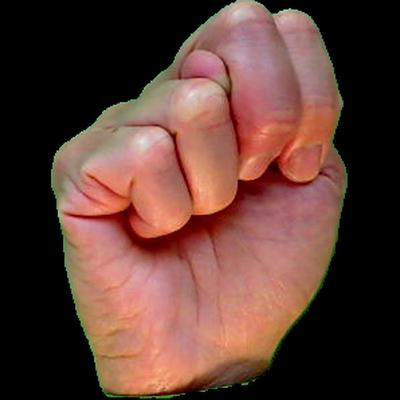

Sign for letter: N


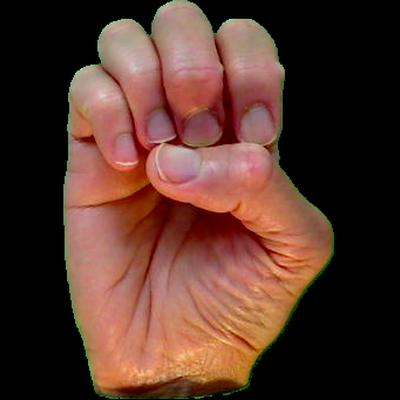

Sign for letter: E

Deaf Person Signing: PM me your info


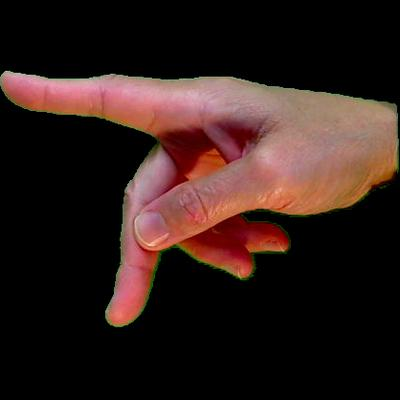

Sign for letter: P


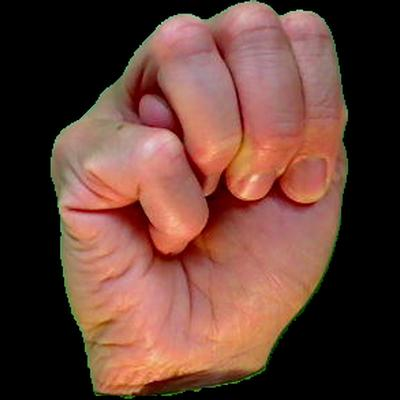

Sign for letter: M


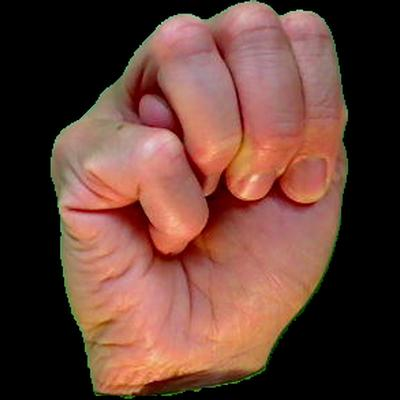

Sign for letter: M


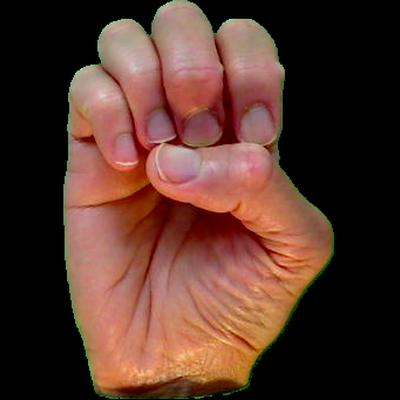

Sign for letter: E


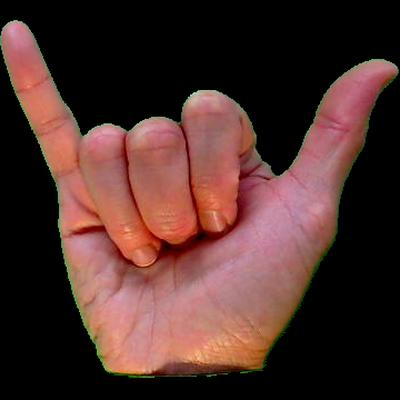

Sign for letter: Y


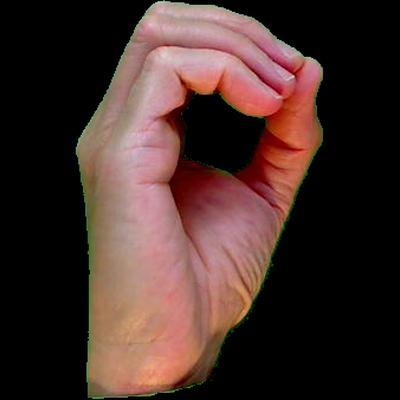

Sign for letter: O


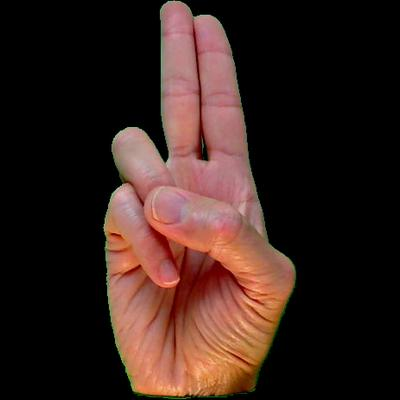

Sign for letter: U


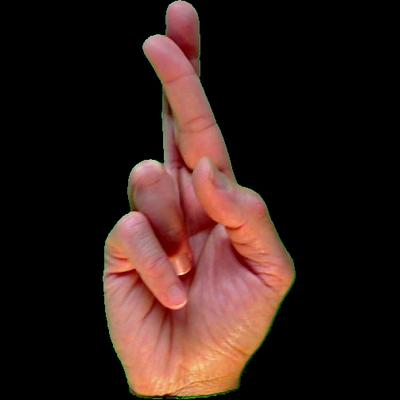

Sign for letter: R


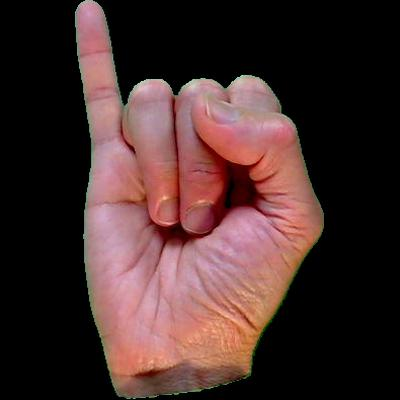

Sign for letter: I


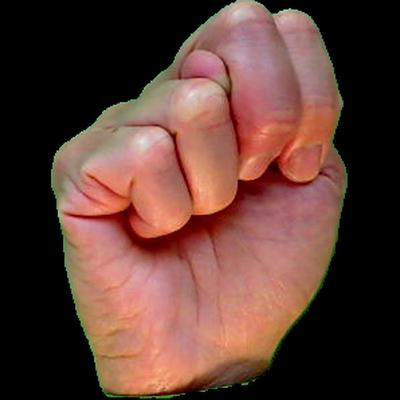

Sign for letter: N


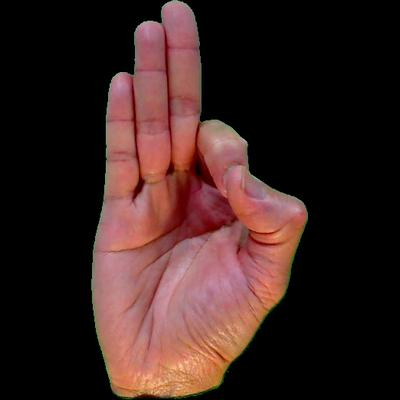

Sign for letter: F


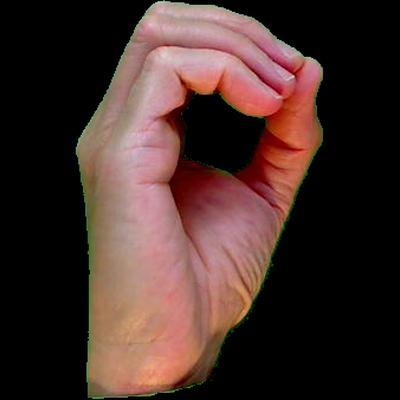

Sign for letter: O

Audio for hearing person:



Your response (type here): I WILL

Displaying your response as signs:


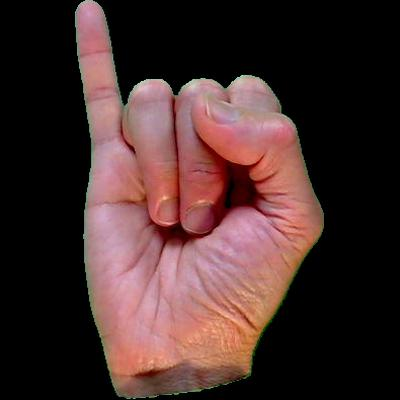

Sign for letter: I


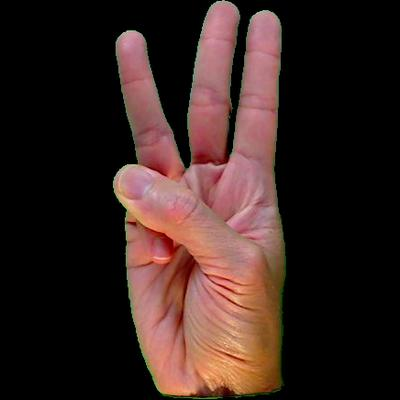

Sign for letter: W


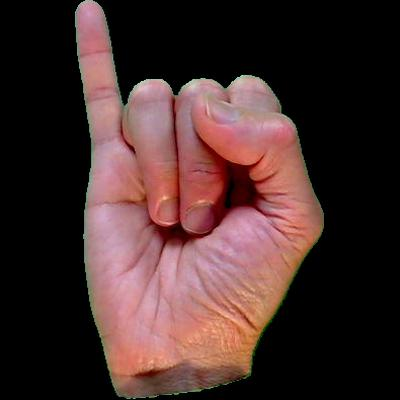

Sign for letter: I


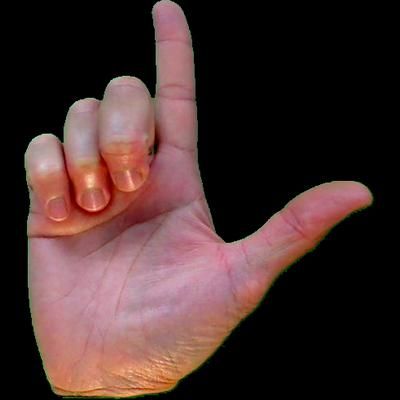

Sign for letter: L


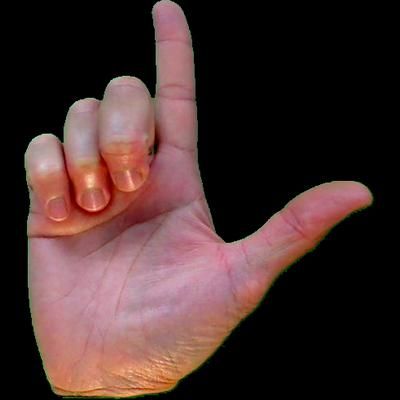

Sign for letter: L

Deaf Person Signing: Thank you!


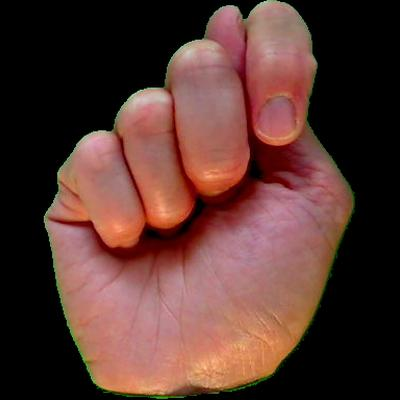

Sign for letter: T


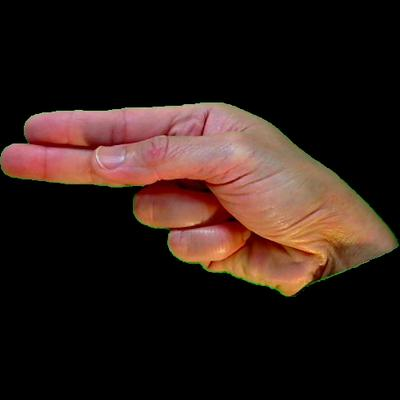

Sign for letter: H


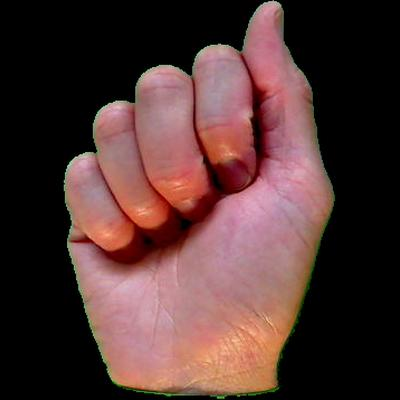

Sign for letter: A


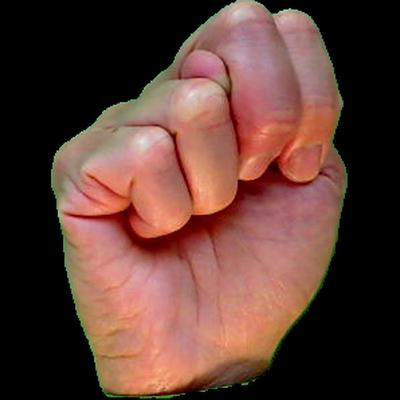

Sign for letter: N


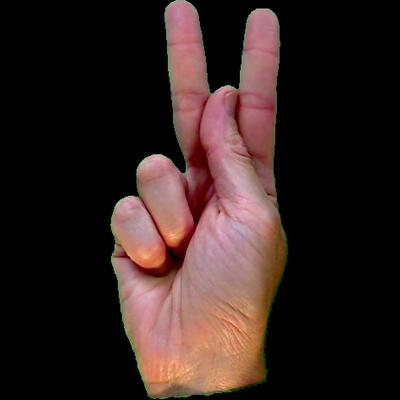

Sign for letter: K


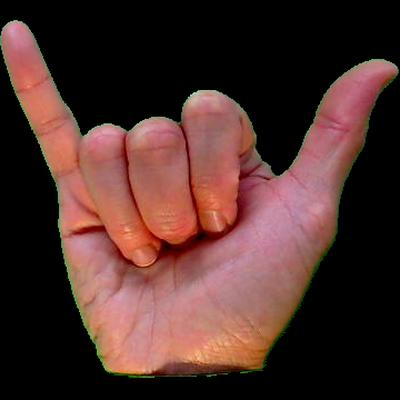

Sign for letter: Y


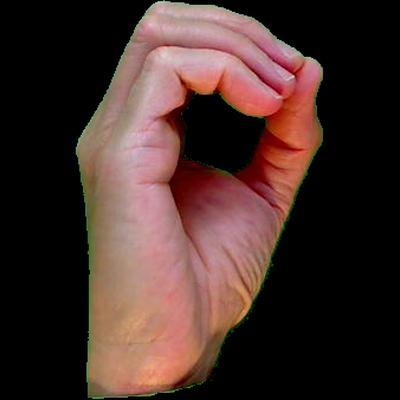

Sign for letter: O


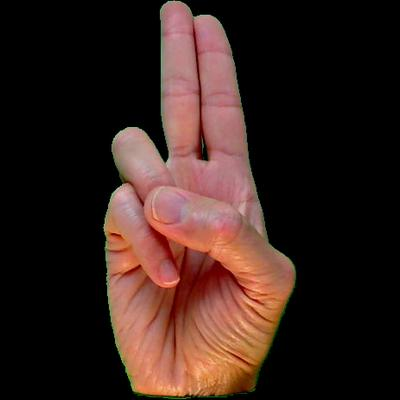

Sign for letter: U
No sign image available for: !

Audio for hearing person:



Interactive NLP-powered simulation ended.


In [ ]:
import zipfile
import os
import time
from PIL import Image
from gtts import gTTS
from IPython.display import Audio, display, Image as IPImage
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch

# Extract images from ZIP file
zip_path = '/content/IMAGES.zip'
extracted_dir = './extracted_images'
os.makedirs(extracted_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

image_dir = os.path.join(extracted_dir, 'IMAGES')

# Initialize NLP chatbot model and tokenizer
model_name = "microsoft/DialoGPT-medium"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

# Mapping letters to images (assuming alphabetical order)
image_files = sorted(os.listdir(image_dir))
sign_image_map = {chr(65 + i): os.path.join(image_dir, img) for i, img in enumerate(image_files)}

# Function to generate audio
def generate_audio(text, filename="response_audio.mp3"):
    tts = gTTS(text=text, lang='en')
    tts.save(filename)
    return filename

# Function to display text as signs
def display_text_as_signs(text):
    text = text.upper().replace(" ", "")
    for letter in text:
        if letter in sign_image_map:
            display(IPImage(filename=sign_image_map[letter]))
            print(f"Sign for letter: {letter}")
            time.sleep(0.5)
        else:
            print(f"No sign image available for: {letter}")

print("--- Real-Time NLP-Powered Interactive Sign Language Communication ---")

# Initial greeting
current_phrase = "Hello, how can I assist you today?"
chat_history_ids = None

try:
    while True:
        # Deaf person's sign (Chatbot generated)
        print("\nDeaf Person Signing:", current_phrase)
        display_text_as_signs(current_phrase)

        audio_output_path = "deaf_person_audio.mp3"
        generate_audio(current_phrase, audio_output_path)

        # Play audio for hearing person
        print("\nAudio for hearing person:")
        display(Audio(audio_output_path, autoplay=True))

        # Hearing person's response
        user_response = input("\nYour response (type here): ")

        # Display user's response as signs
        print("\nDisplaying your response as signs:")
        display_text_as_signs(user_response)

        # Chatbot generates logical next response
        new_user_input_ids = tokenizer.encode(user_response + tokenizer.eos_token, return_tensors='pt')

        if chat_history_ids is not None:
            bot_input_ids = torch.cat([chat_history_ids, new_user_input_ids], dim=-1)
        else:
            bot_input_ids = new_user_input_ids

        chat_history_ids = model.generate(
            bot_input_ids,
            max_length=1000,
            pad_token_id=tokenizer.eos_token_id,
            no_repeat_ngram_size=3,
            do_sample=True,
            top_k=100,
            top_p=0.7,
            temperature=0.8
        )

        current_phrase = tokenizer.decode(chat_history_ids[:, bot_input_ids.shape[-1]:][0], skip_special_tokens=True)

except KeyboardInterrupt:
    print("\nInteractive NLP-powered simulation ended.")


OPTIMIZED FINAL PREDICTION


--- Entire Conversation History ---

Deaf Person Signing: HELLO, HOW CAN I HELP YOU?


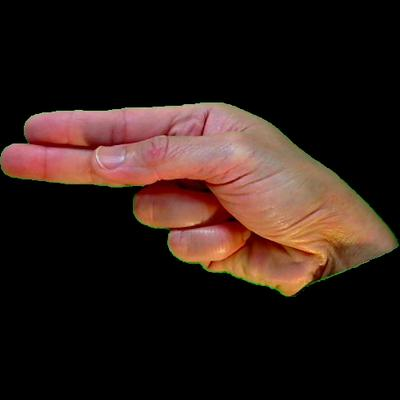

Sign: H


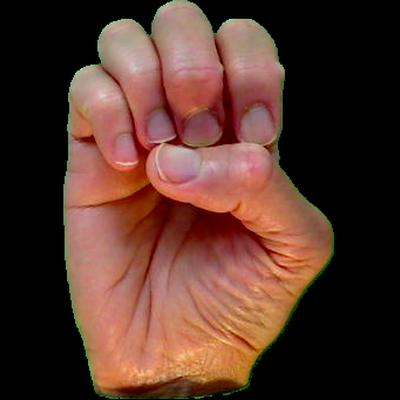

Sign: E


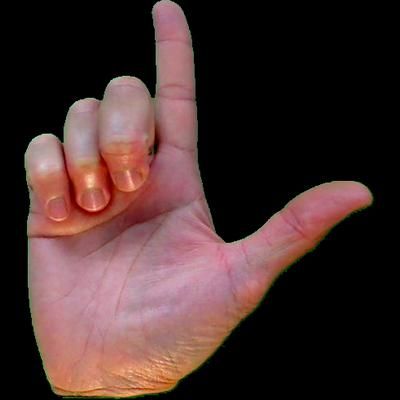

Sign: L


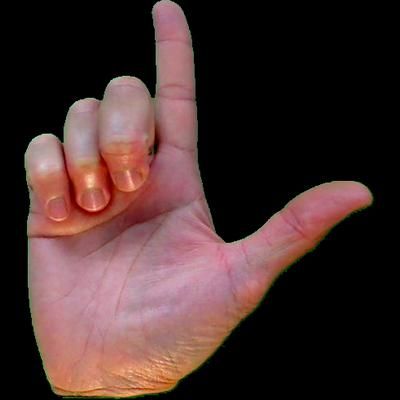

Sign: L


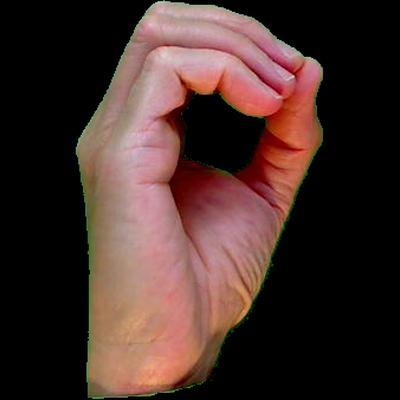

Sign: O
No sign image available for: ,


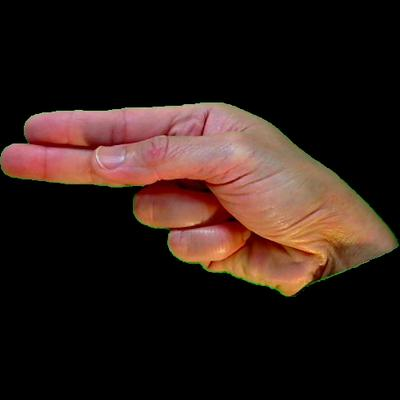

Sign: H


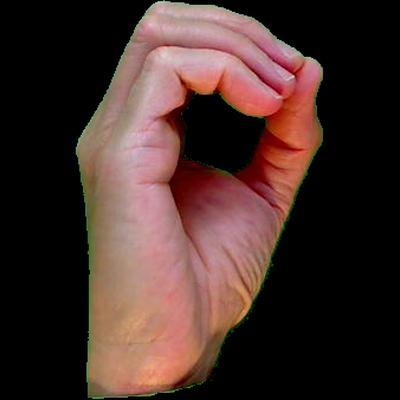

Sign: O


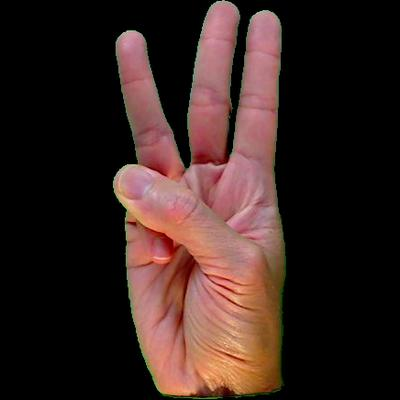

Sign: W


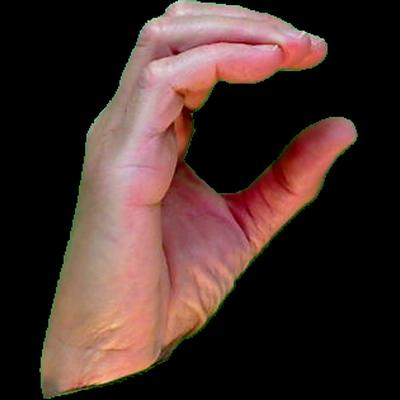

Sign: C


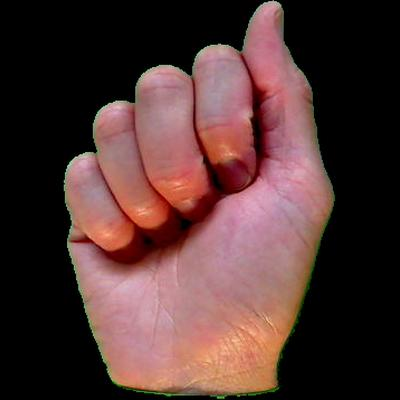

Sign: A


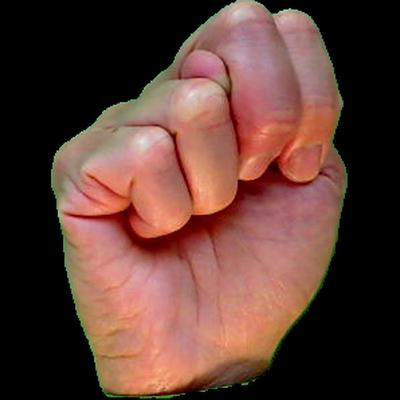

Sign: N


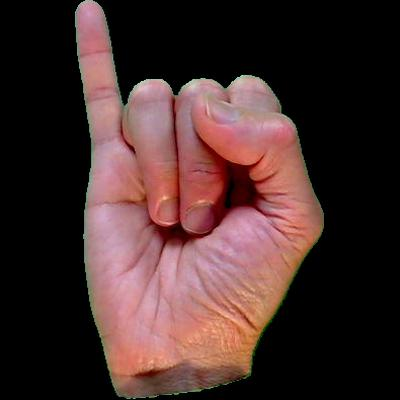

Sign: I


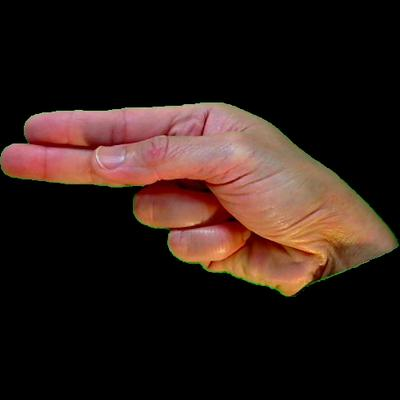

Sign: H


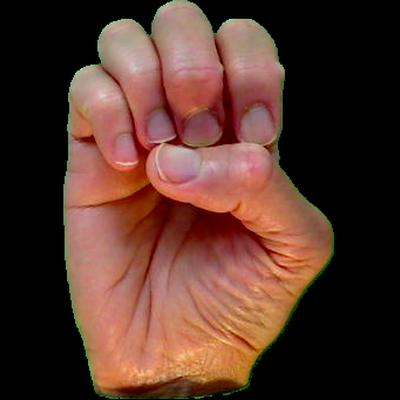

Sign: E


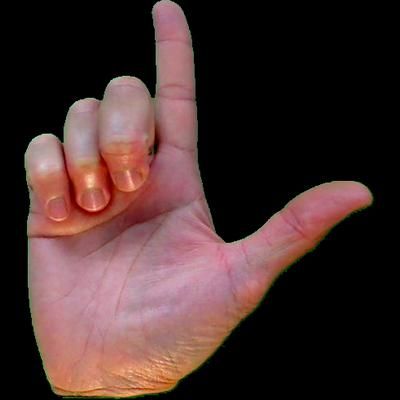

Sign: L


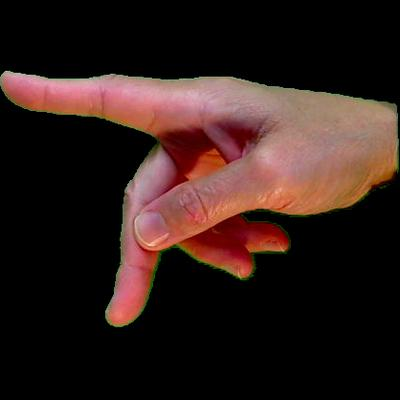

Sign: P


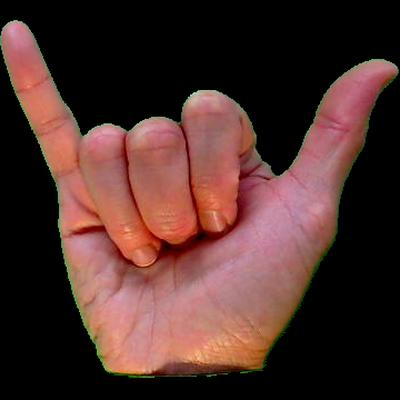

Sign: Y


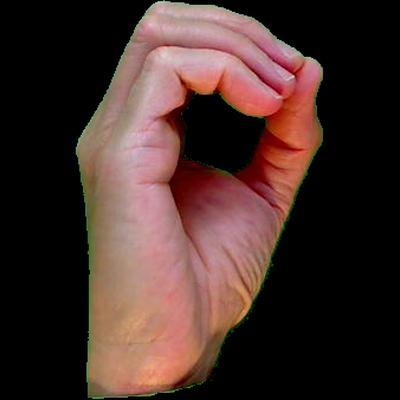

Sign: O


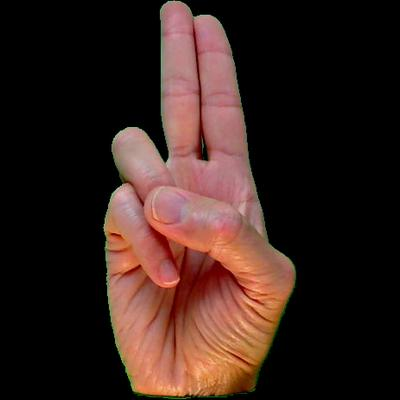

Sign: U
No sign image available for: ?



Your response: HOW ARE YOU

Your Response as Signs:


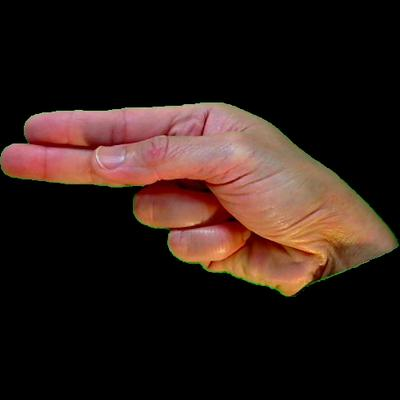

Sign: H


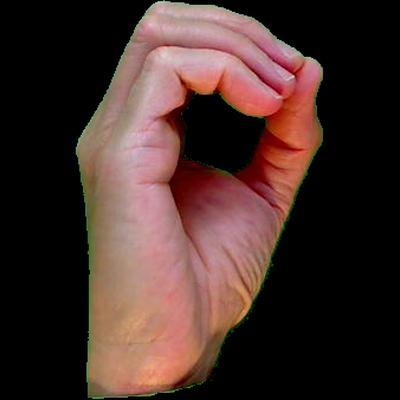

Sign: O


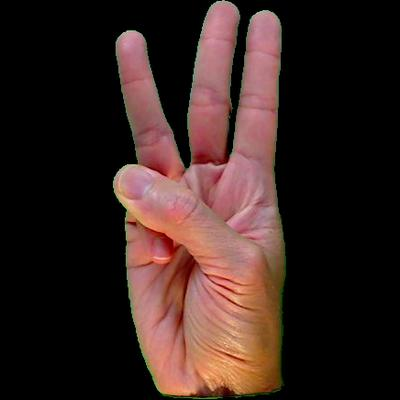

Sign: W


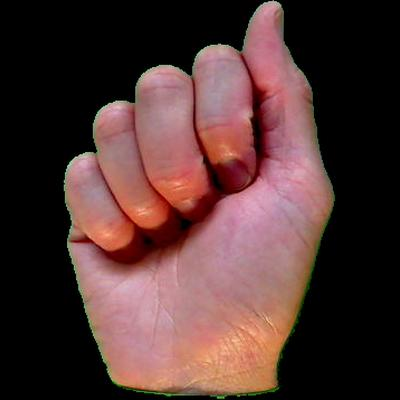

Sign: A


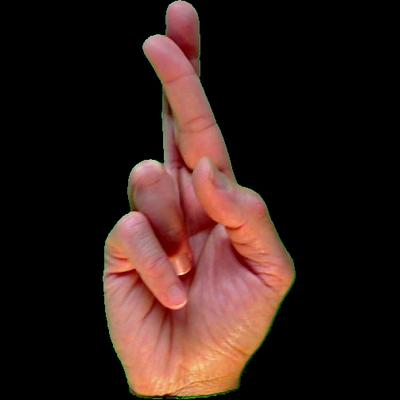

Sign: R


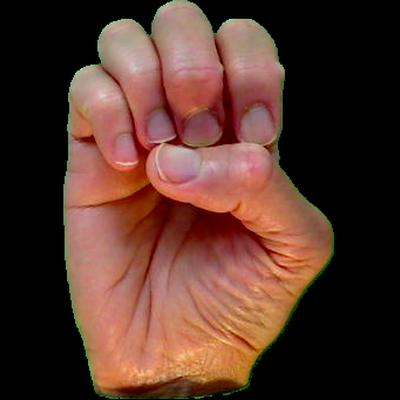

Sign: E


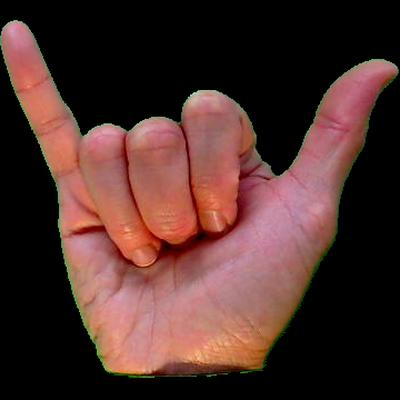

Sign: Y


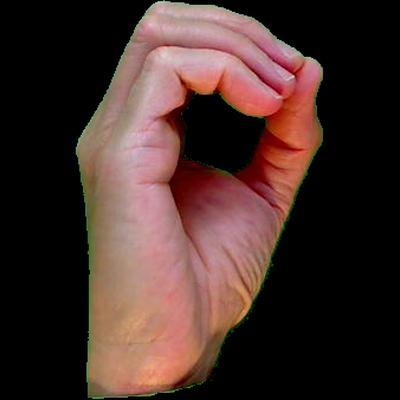

Sign: O


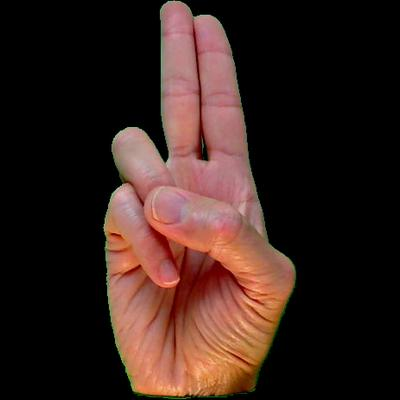

Sign: U

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU

Deaf Person Signing: Good, how are you?


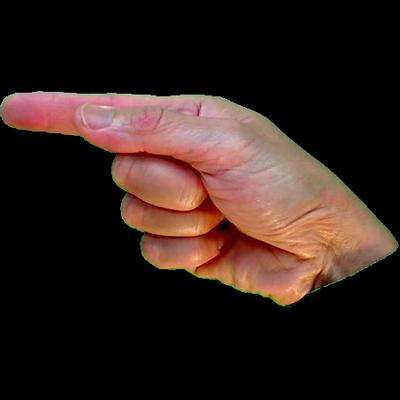

Sign: G


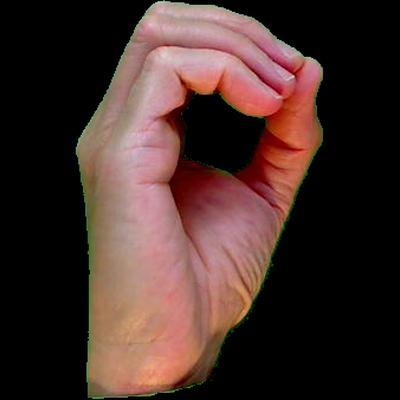

Sign: O


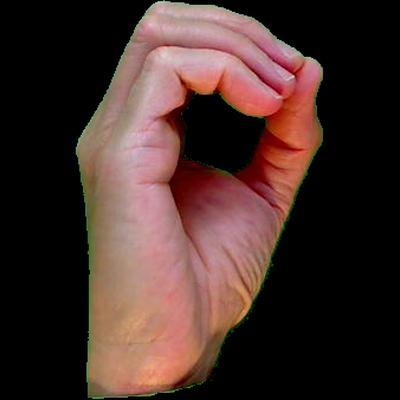

Sign: O


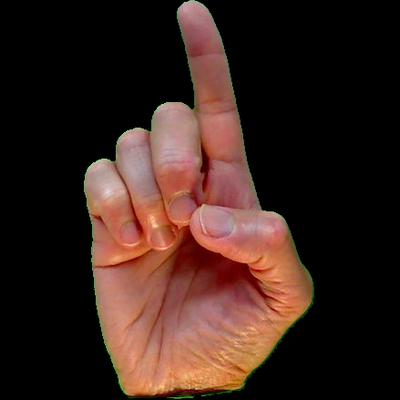

Sign: D
No sign image available for: ,


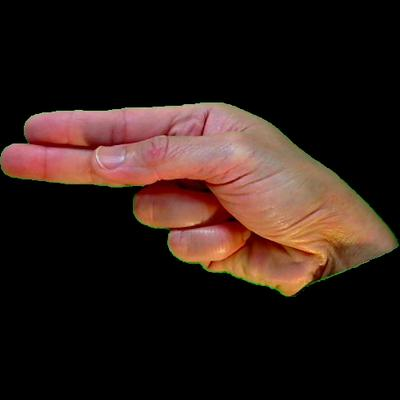

Sign: H


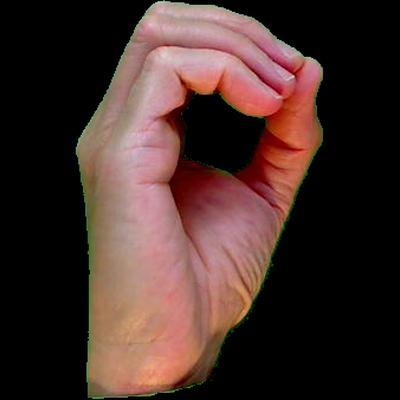

Sign: O


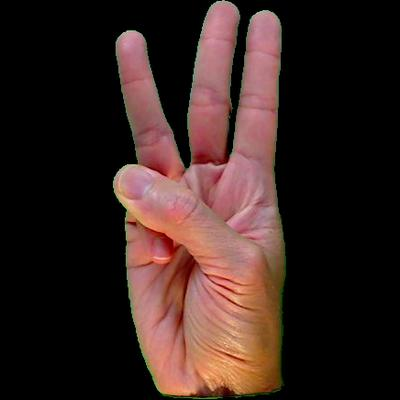

Sign: W


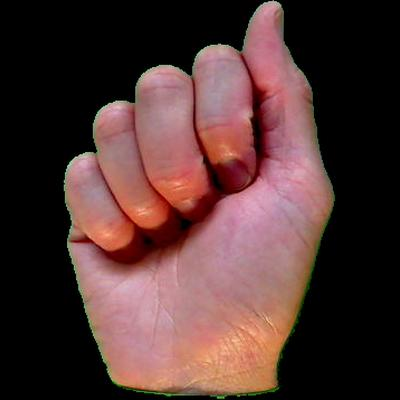

Sign: A


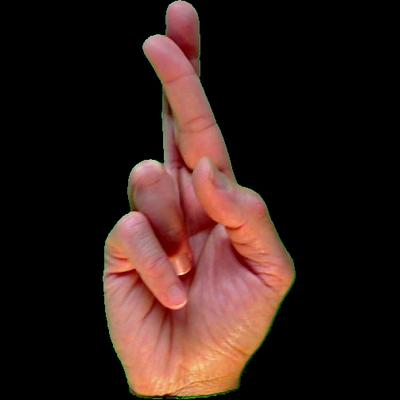

Sign: R


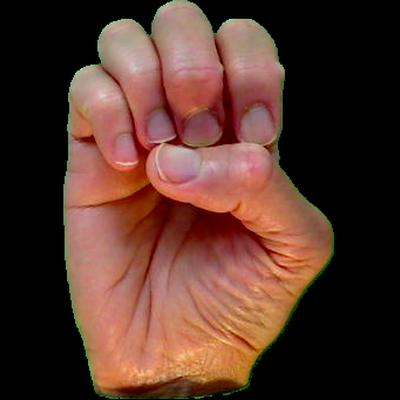

Sign: E


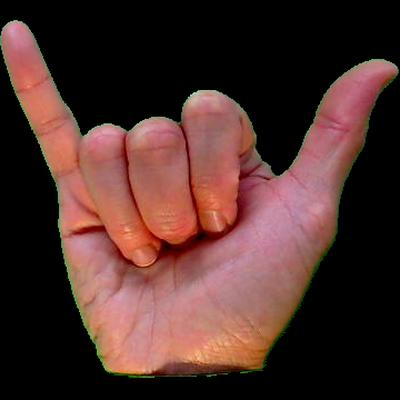

Sign: Y


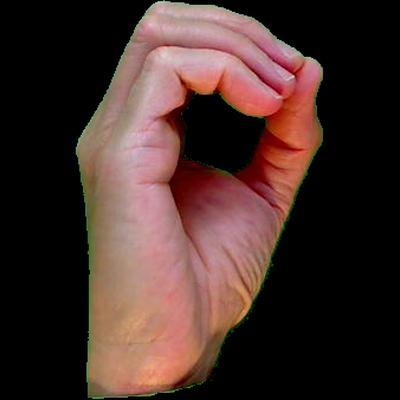

Sign: O


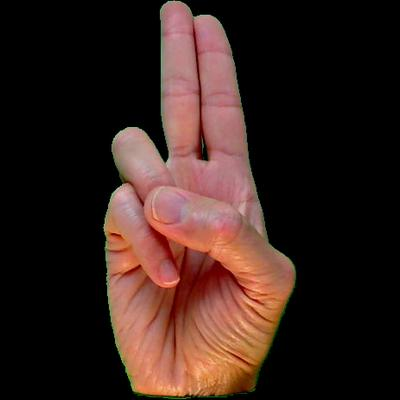

Sign: U
No sign image available for: ?



Your response: I AM FINE. CAN YOU HELP ME WITH MY PROJECT?

Your Response as Signs:


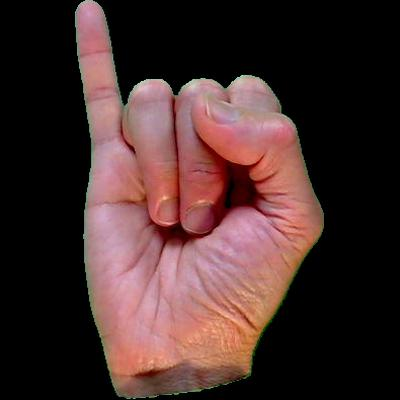

Sign: I


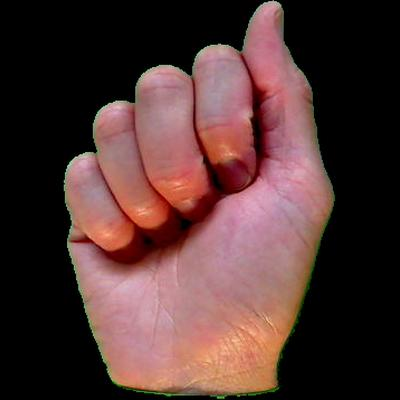

Sign: A


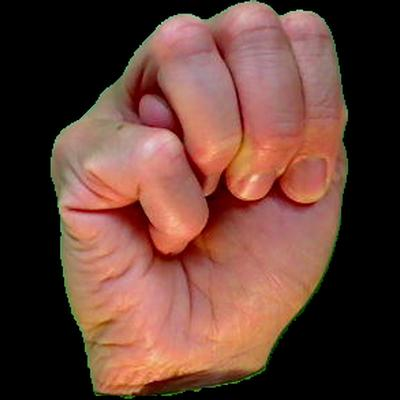

Sign: M


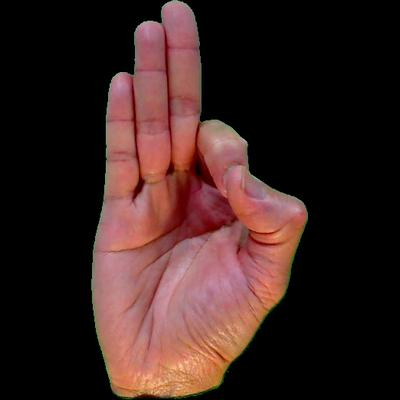

Sign: F


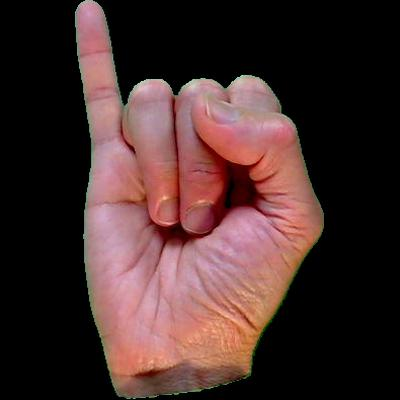

Sign: I


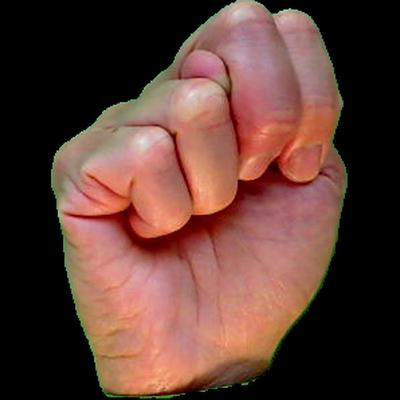

Sign: N


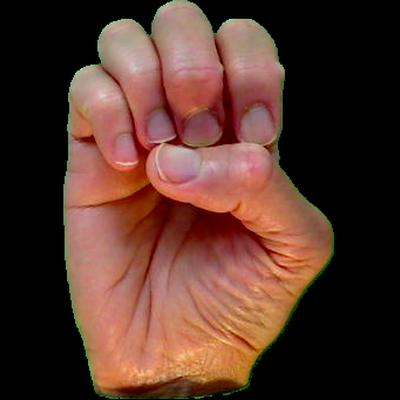

Sign: E
No sign image available for: .


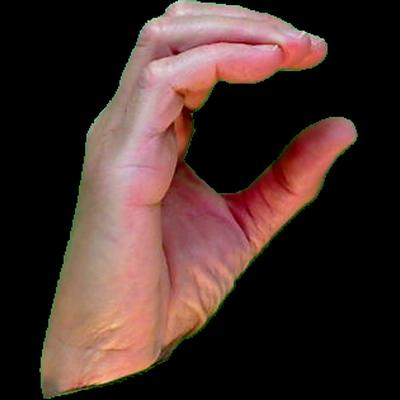

Sign: C


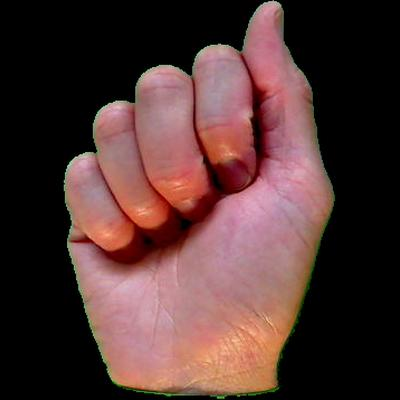

Sign: A


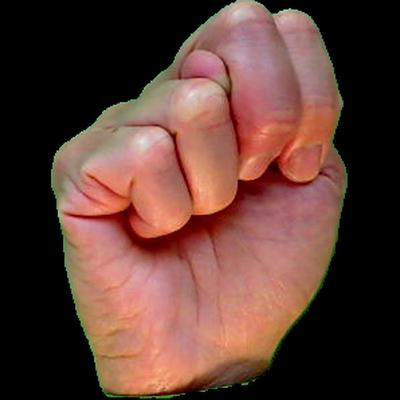

Sign: N


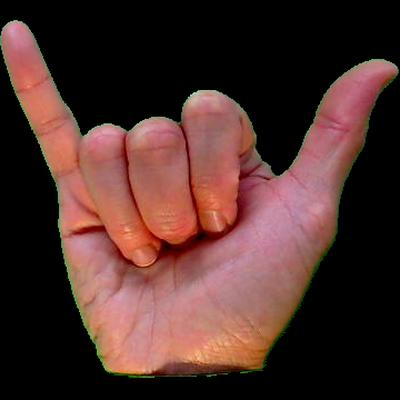

Sign: Y


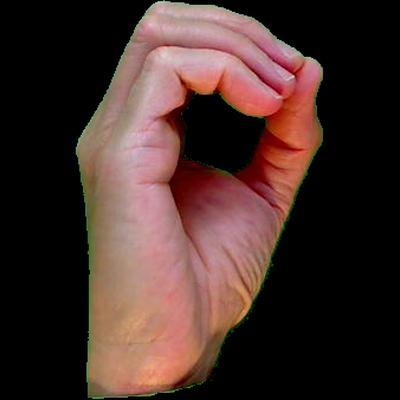

Sign: O


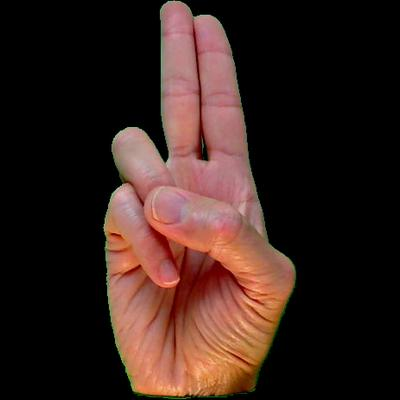

Sign: U


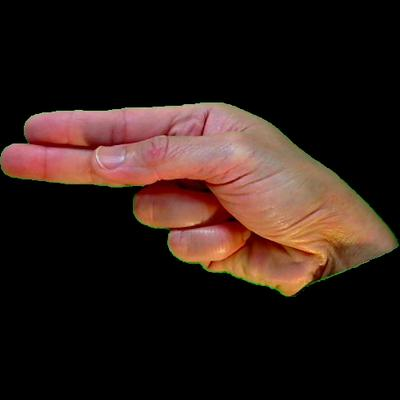

Sign: H


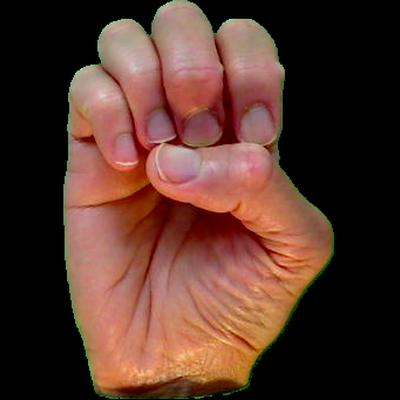

Sign: E


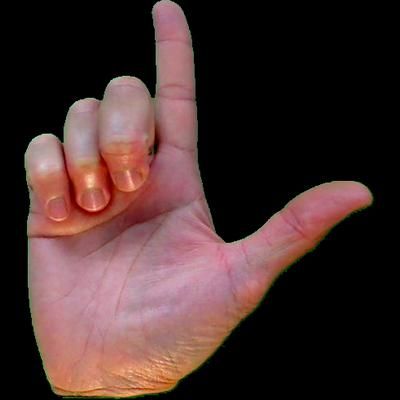

Sign: L


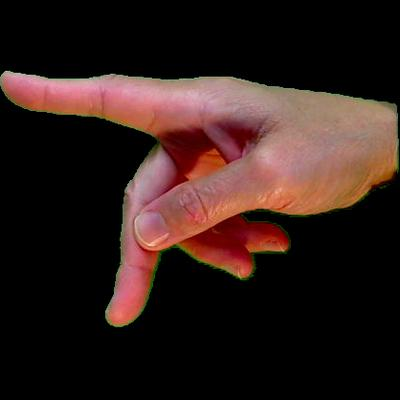

Sign: P


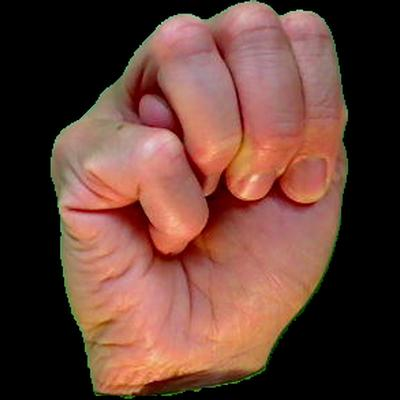

Sign: M


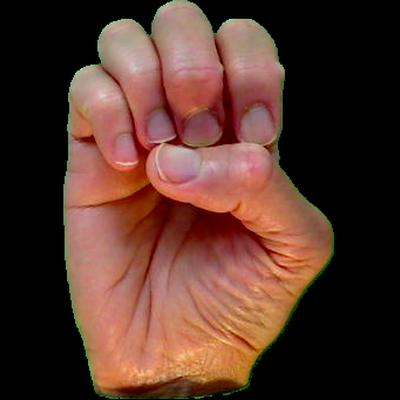

Sign: E


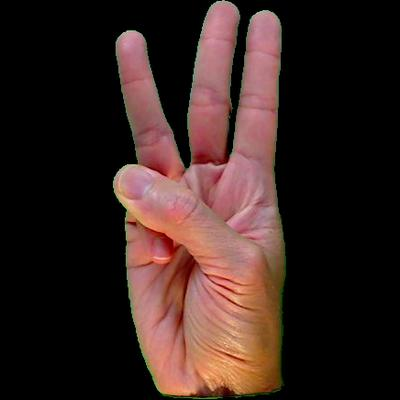

Sign: W


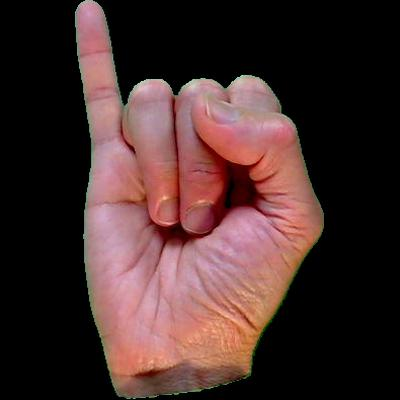

Sign: I


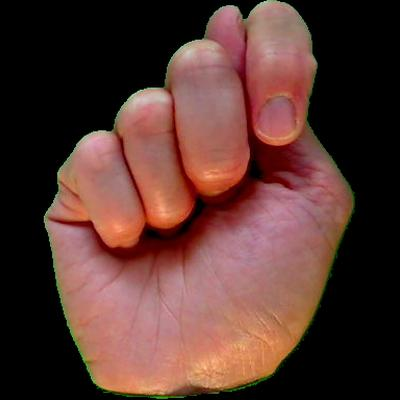

Sign: T


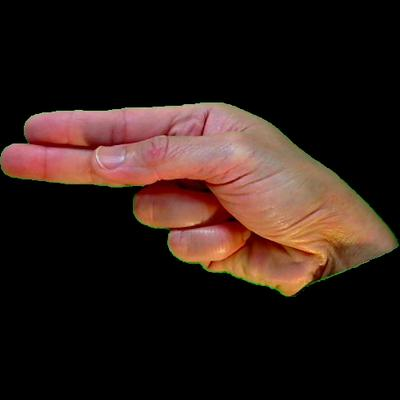

Sign: H


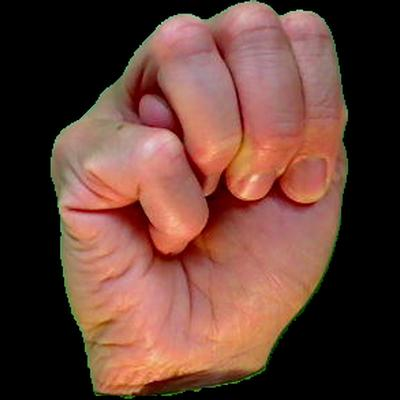

Sign: M


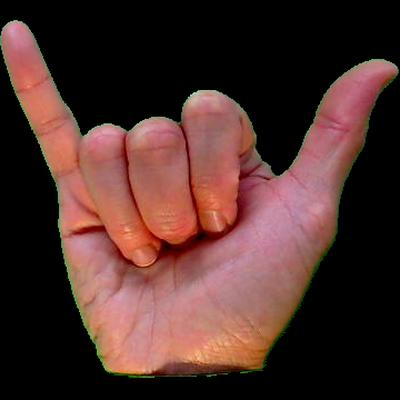

Sign: Y


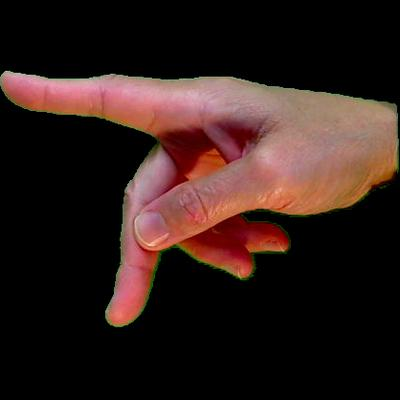

Sign: P


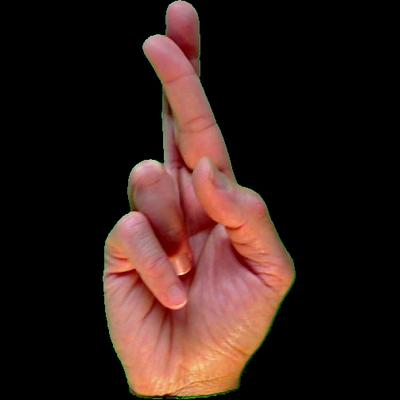

Sign: R


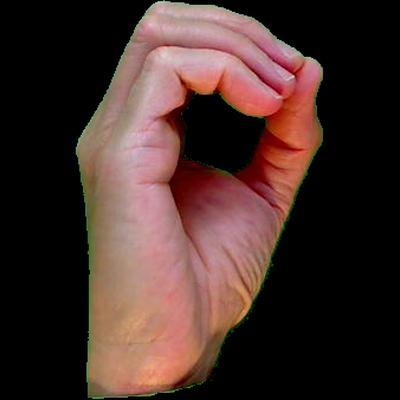

Sign: O


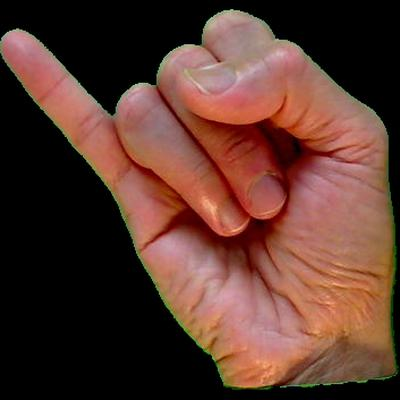

Sign: J


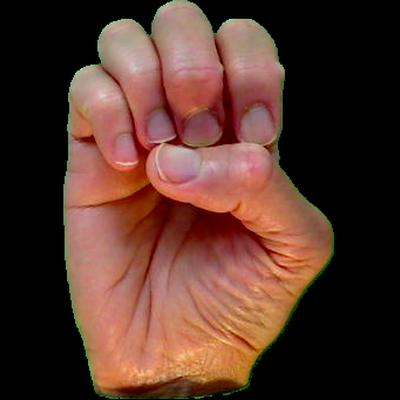

Sign: E


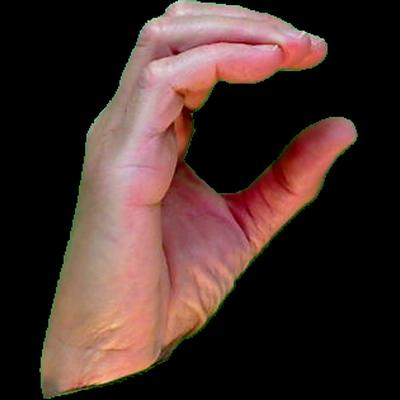

Sign: C


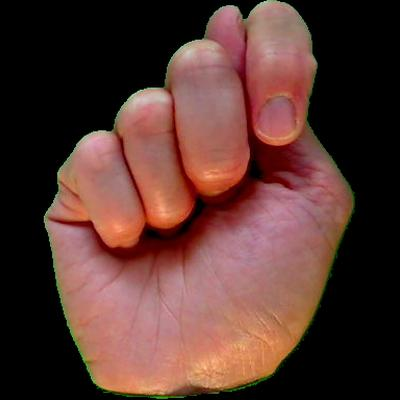

Sign: T
No sign image available for: ?

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU
Deaf Person: Good, how are you?
You: I AM FINE. CAN YOU HELP ME WITH MY PROJECT?

Deaf Person Signing: Sure, I'll help you out.


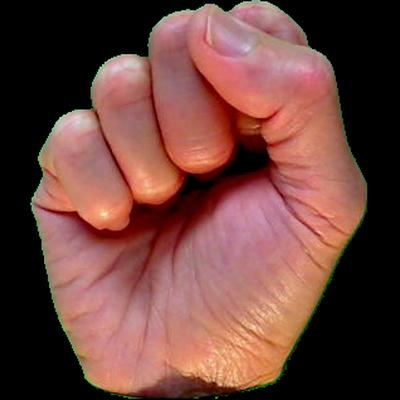

Sign: S


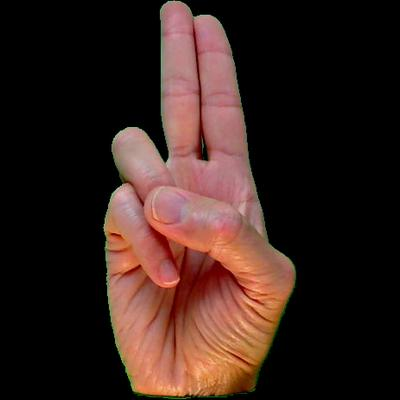

Sign: U


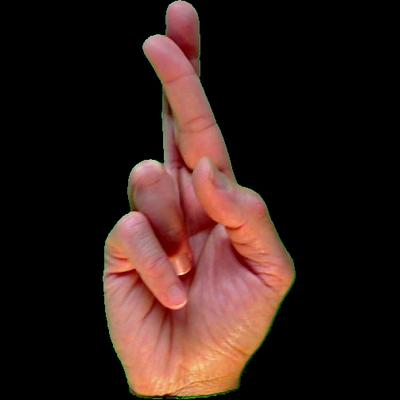

Sign: R


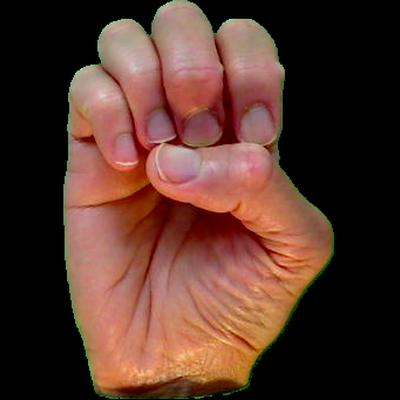

Sign: E
No sign image available for: ,


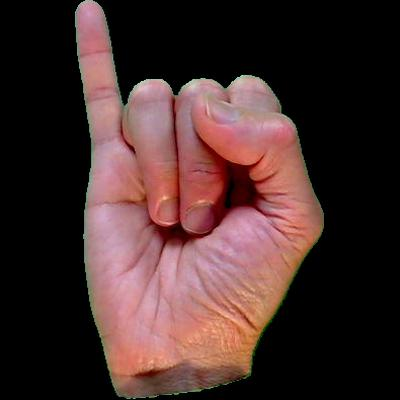

Sign: I
No sign image available for: '


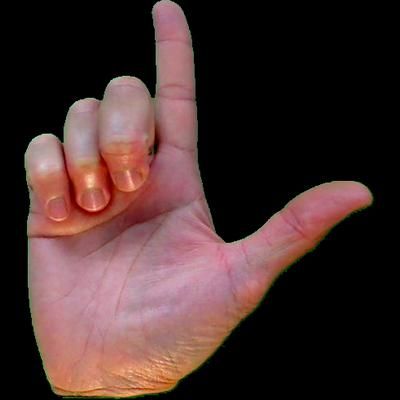

Sign: L


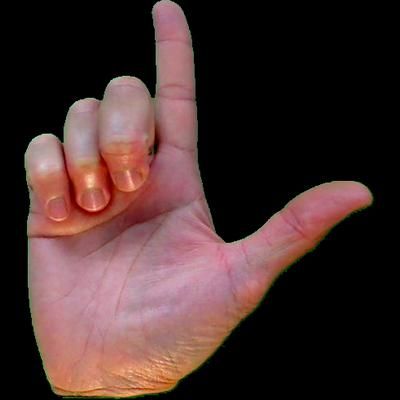

Sign: L


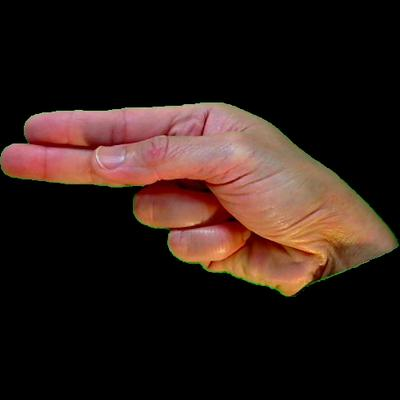

Sign: H


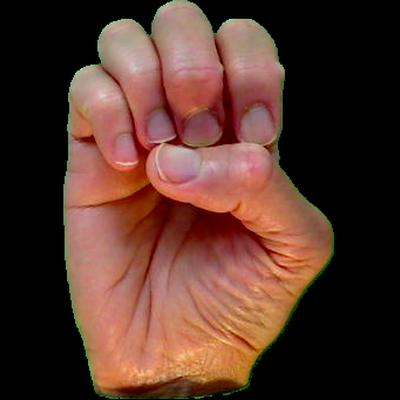

Sign: E


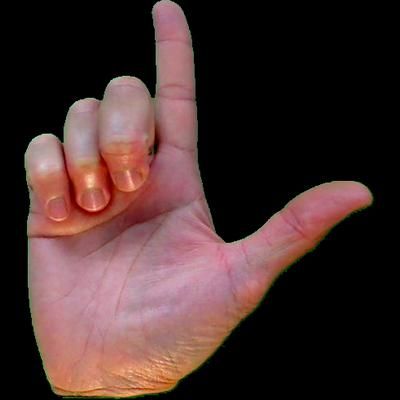

Sign: L


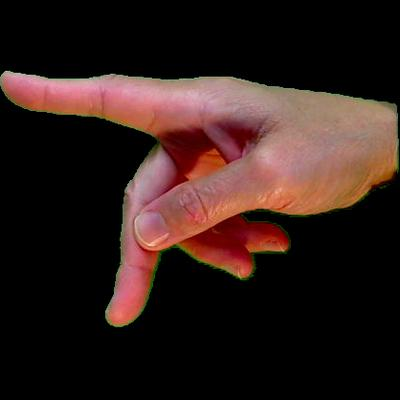

Sign: P


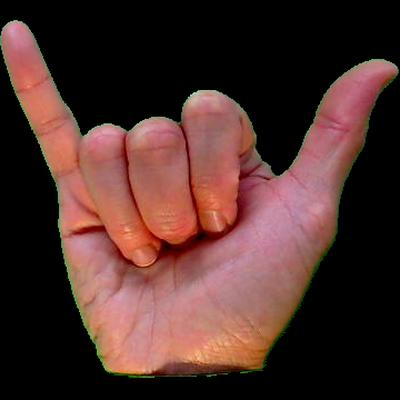

Sign: Y


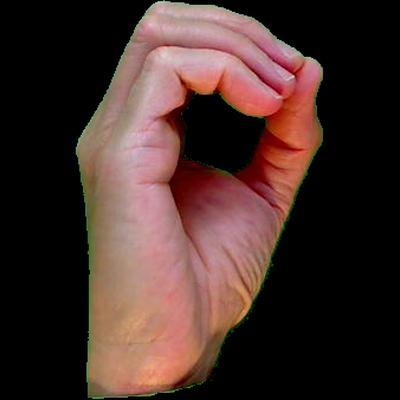

Sign: O


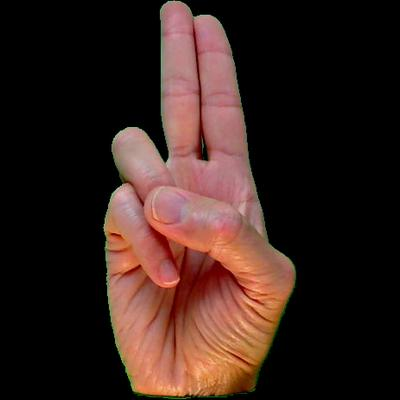

Sign: U


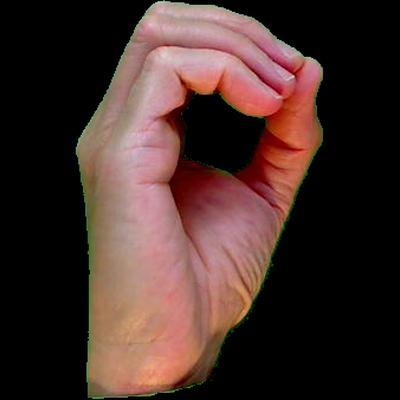

Sign: O


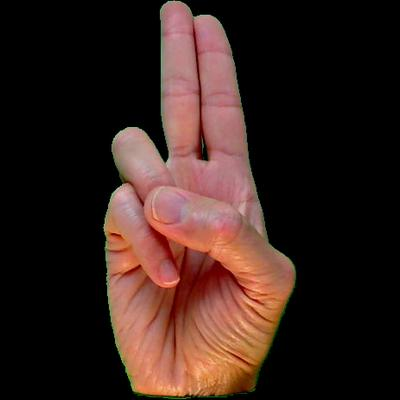

Sign: U


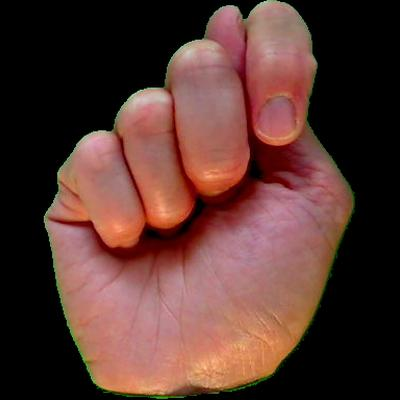

Sign: T
No sign image available for: .



Your response: WHEN ARE YOU FREE?

Your Response as Signs:


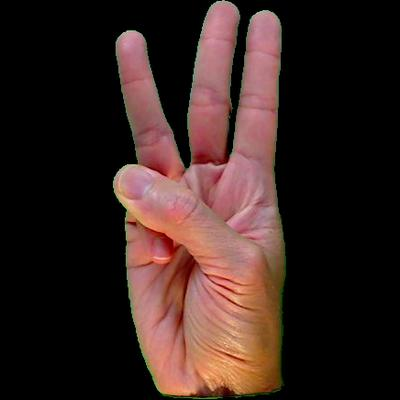

Sign: W


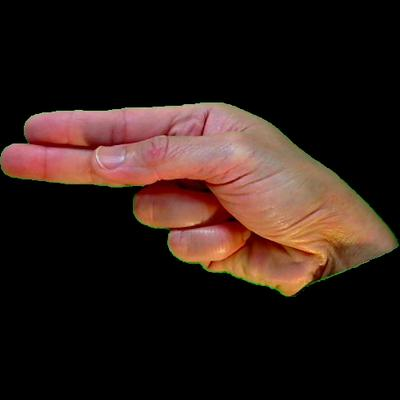

Sign: H


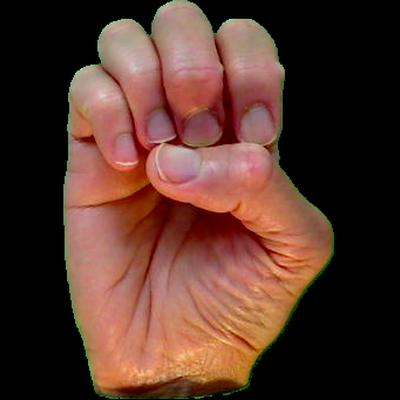

Sign: E


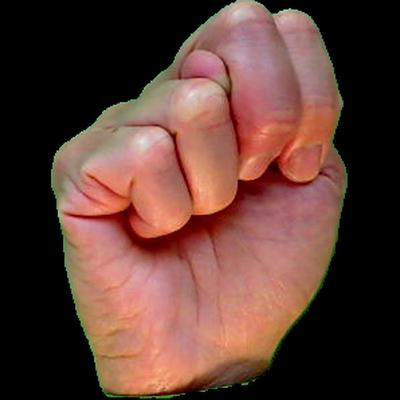

Sign: N


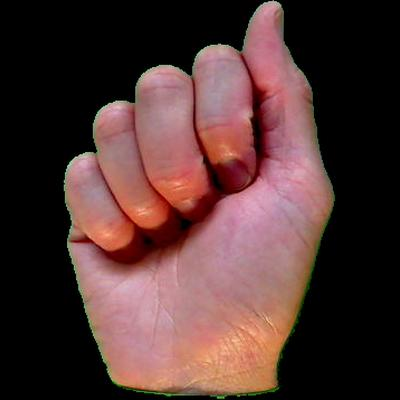

Sign: A


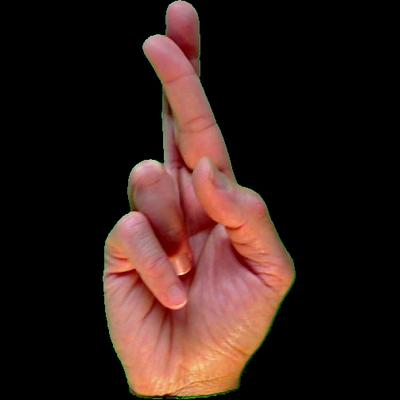

Sign: R


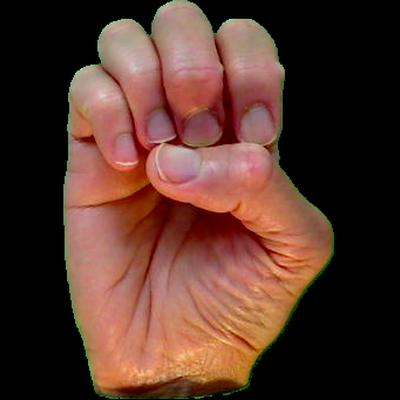

Sign: E


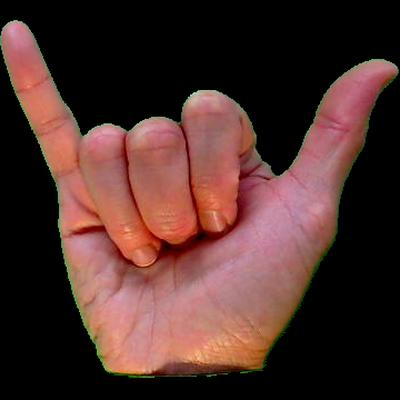

Sign: Y


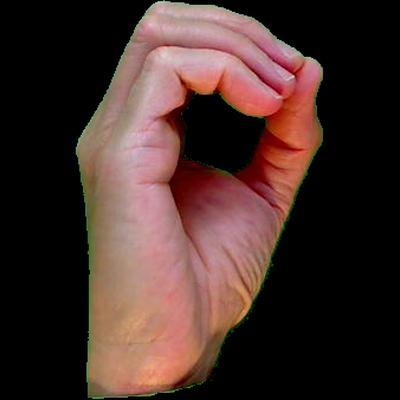

Sign: O


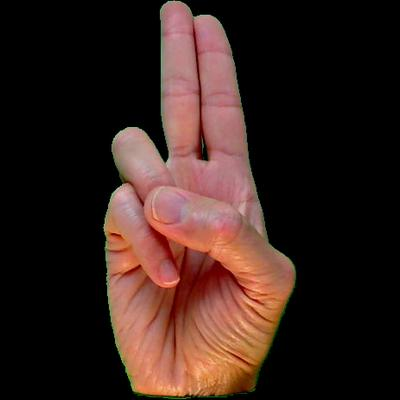

Sign: U


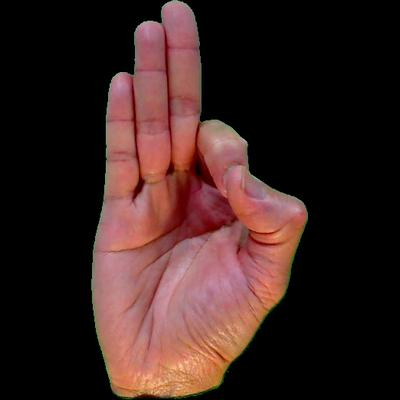

Sign: F


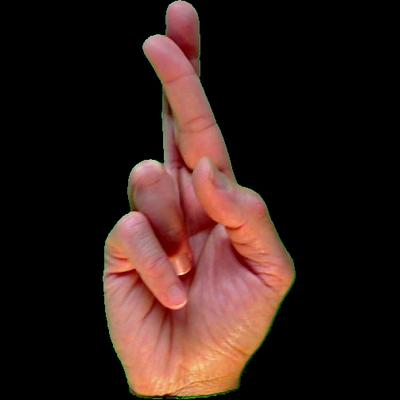

Sign: R


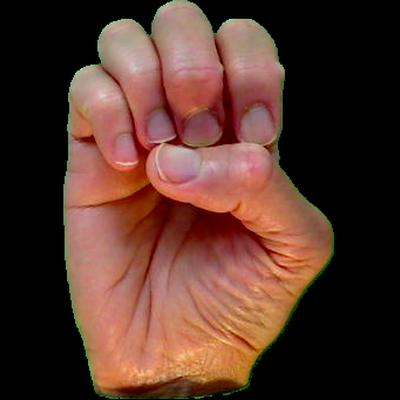

Sign: E


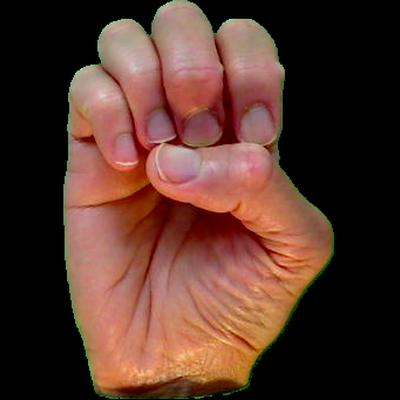

Sign: E
No sign image available for: ?

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU
Deaf Person: Good, how are you?
You: I AM FINE. CAN YOU HELP ME WITH MY PROJECT?
Deaf Person: Sure, I'll help you out.
You: WHEN ARE YOU FREE?

Deaf Person Signing: Tomorrow. I have to go to work, but I'm free all day tomorrow. You can message me on here if you want to talk about it


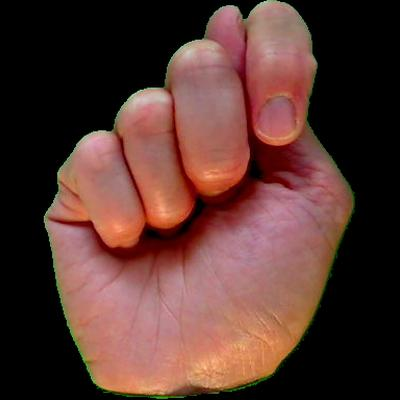

Sign: T


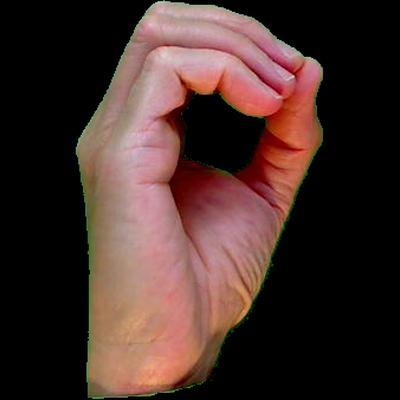

Sign: O


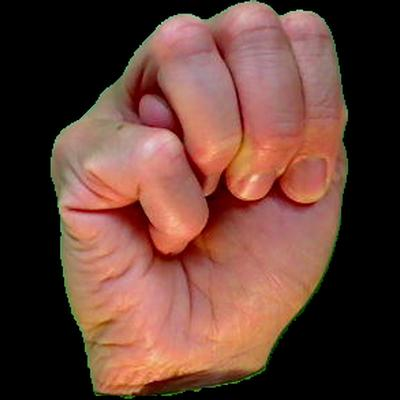

Sign: M


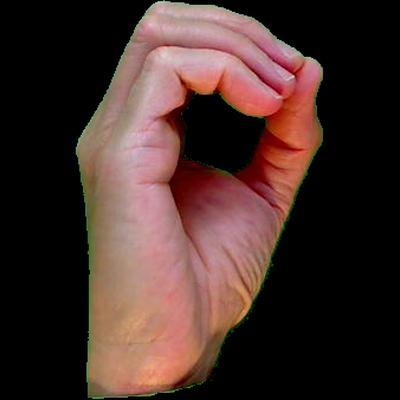

Sign: O


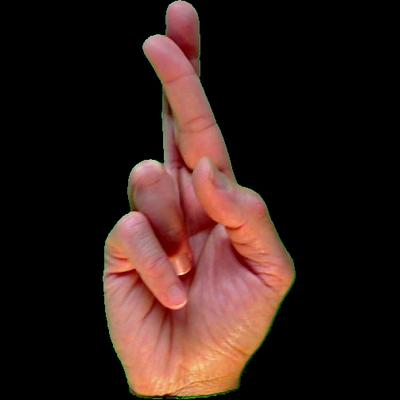

Sign: R


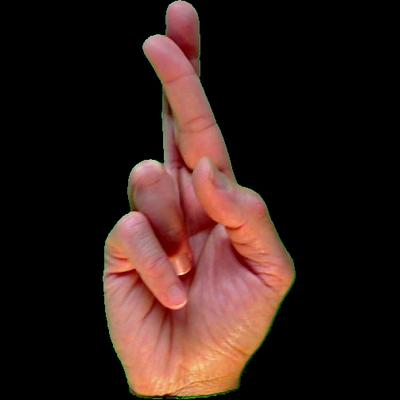

Sign: R


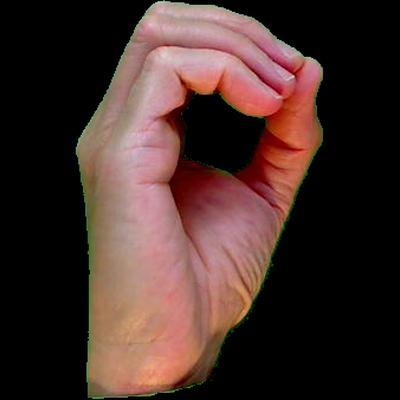

Sign: O


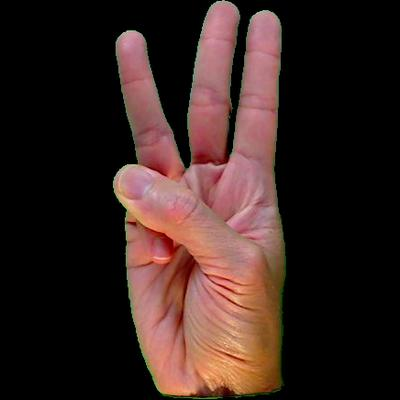

Sign: W
No sign image available for: .


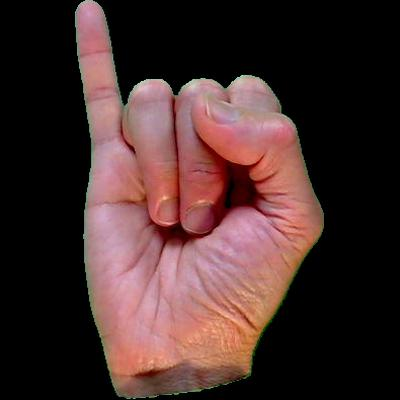

Sign: I


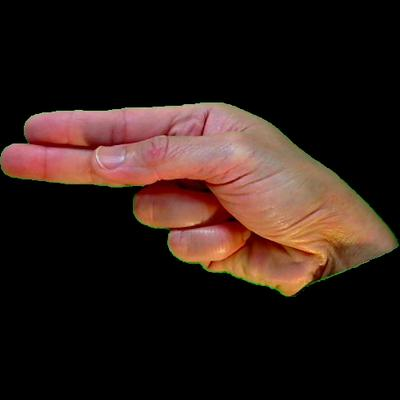

Sign: H


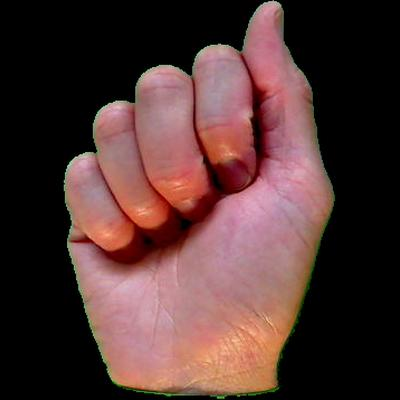

Sign: A


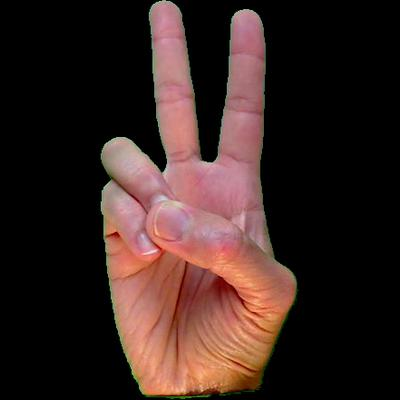

Sign: V


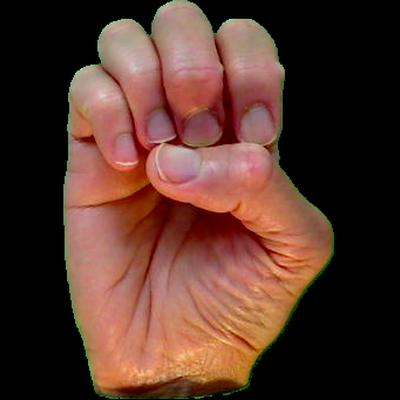

Sign: E


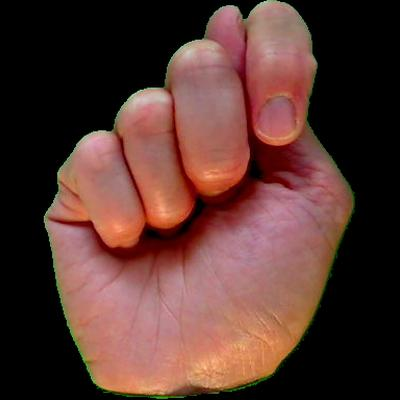

Sign: T


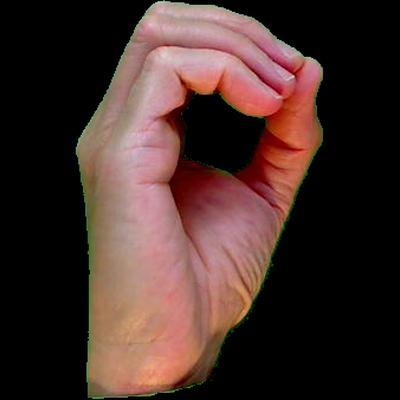

Sign: O


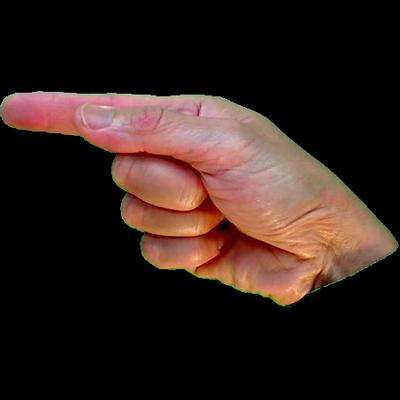

Sign: G


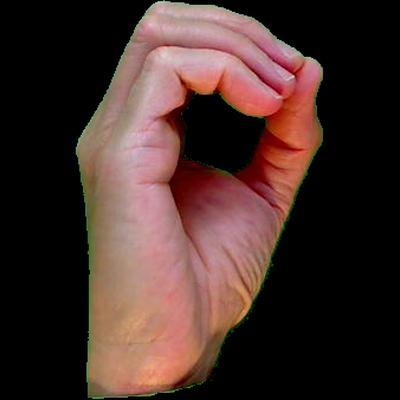

Sign: O


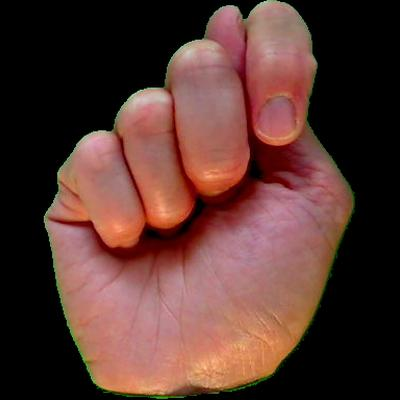

Sign: T


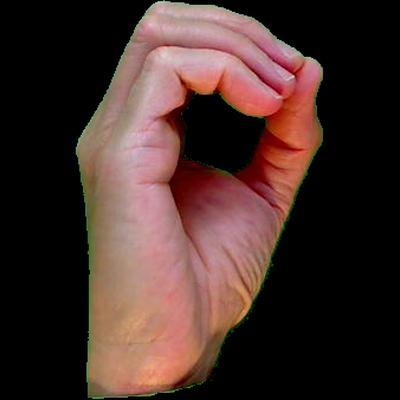

Sign: O


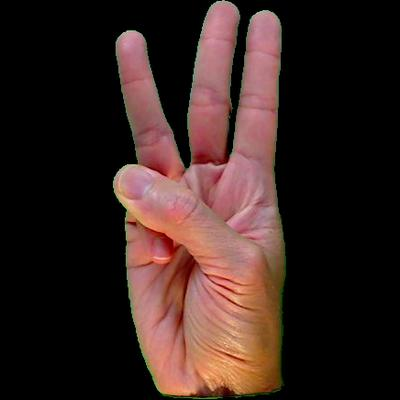

Sign: W


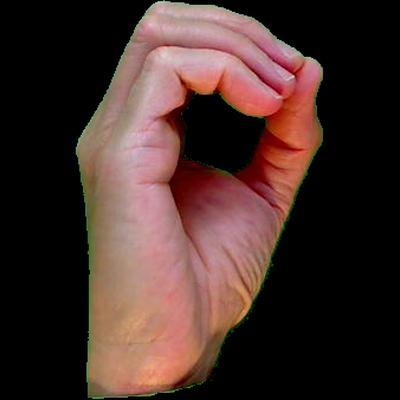

Sign: O


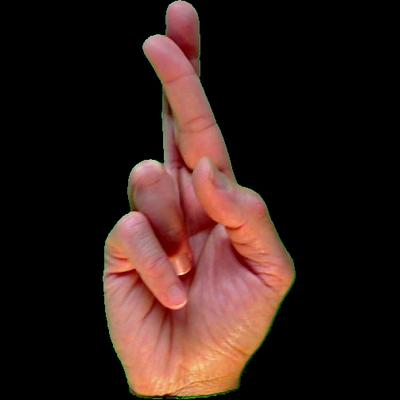

Sign: R


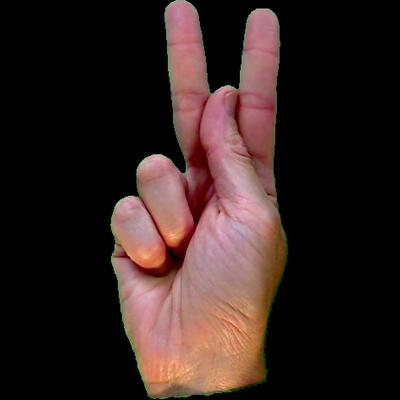

Sign: K
No sign image available for: ,


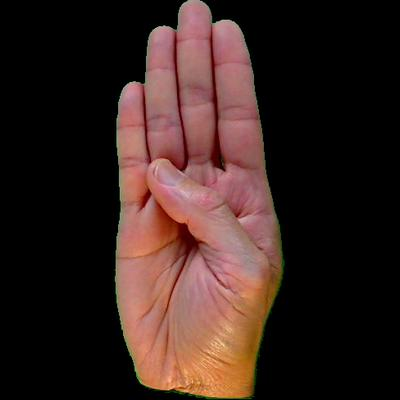

Sign: B


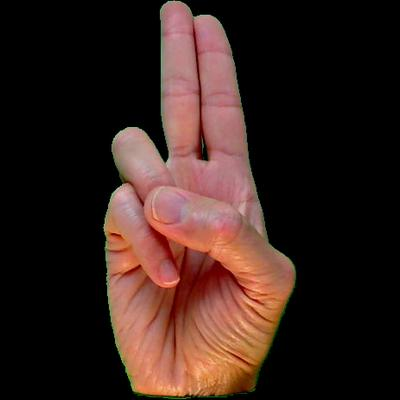

Sign: U


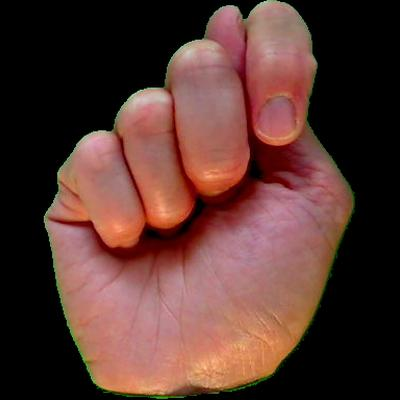

Sign: T


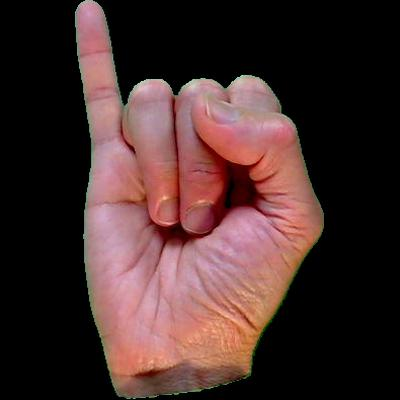

Sign: I
No sign image available for: '


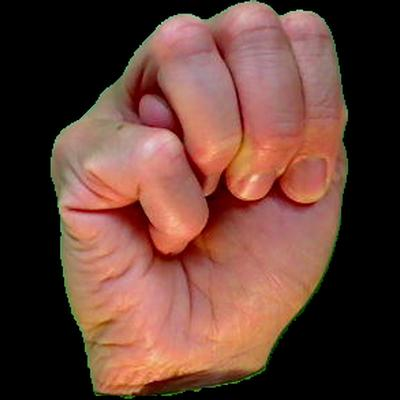

Sign: M


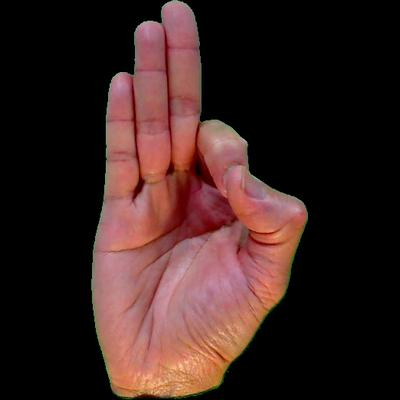

Sign: F


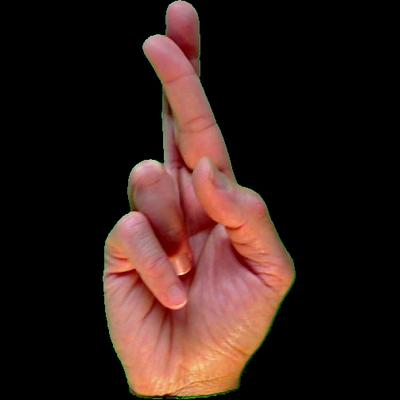

Sign: R


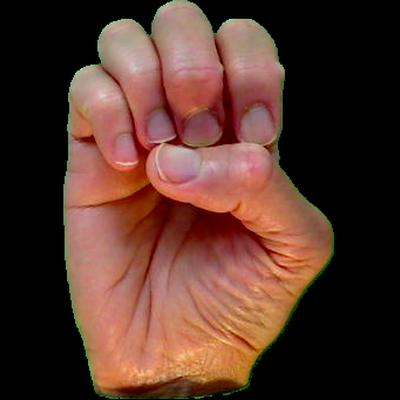

Sign: E


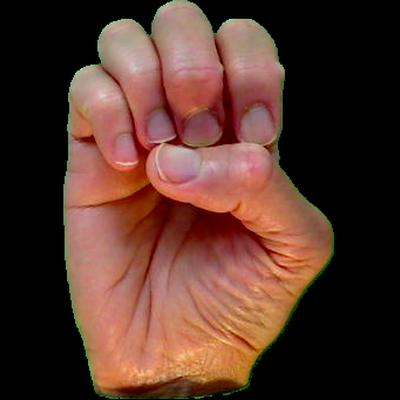

Sign: E


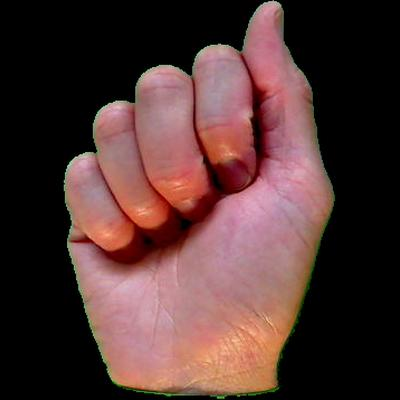

Sign: A


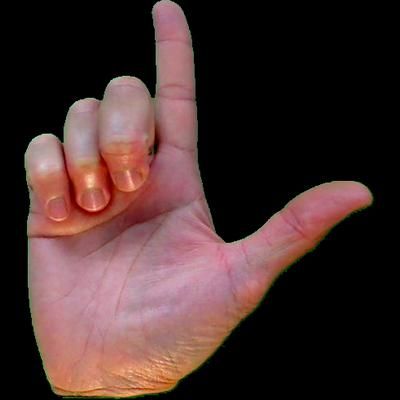

Sign: L


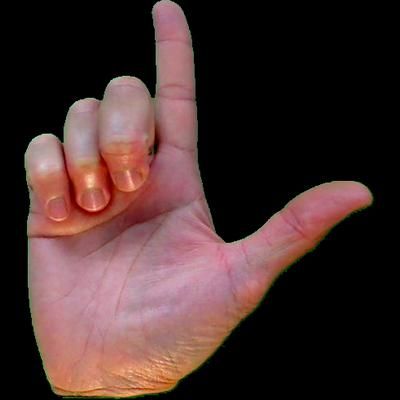

Sign: L


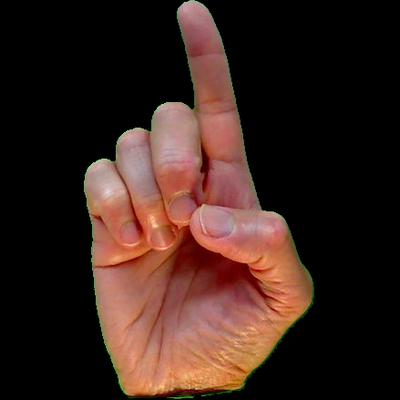

Sign: D


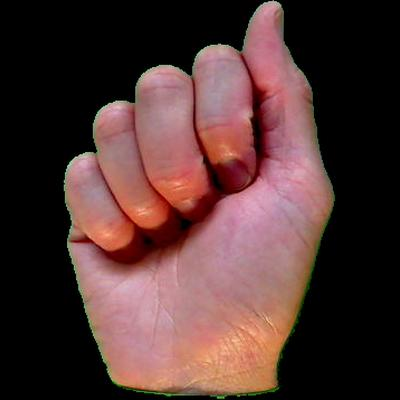

Sign: A


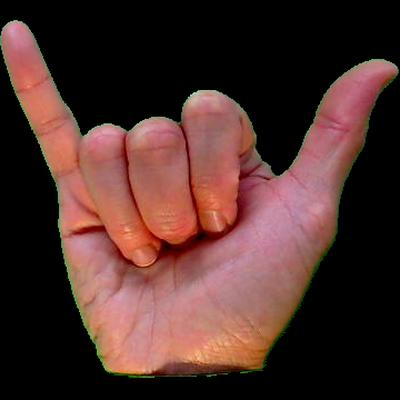

Sign: Y


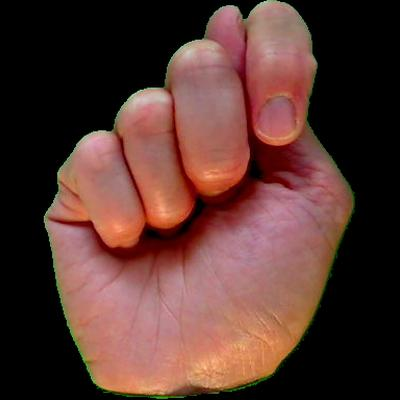

Sign: T


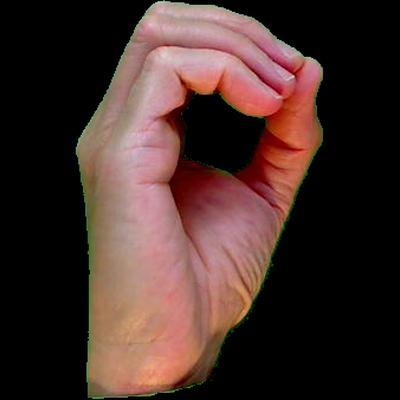

Sign: O


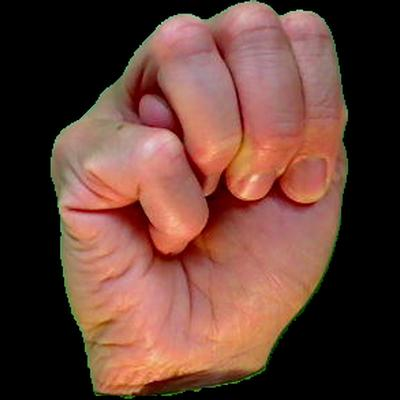

Sign: M


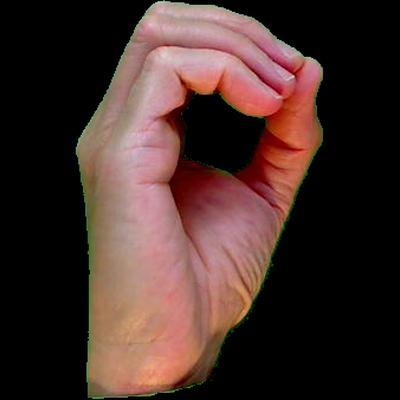

Sign: O


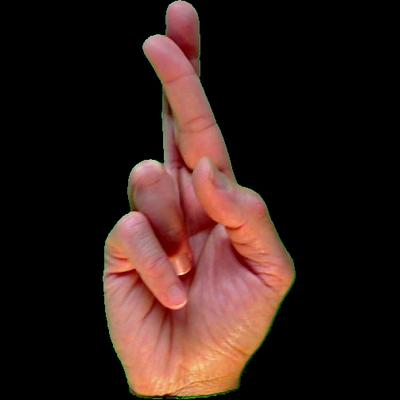

Sign: R


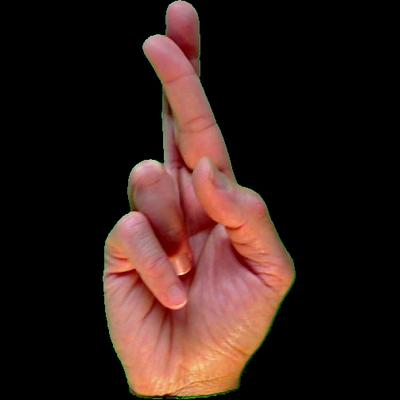

Sign: R


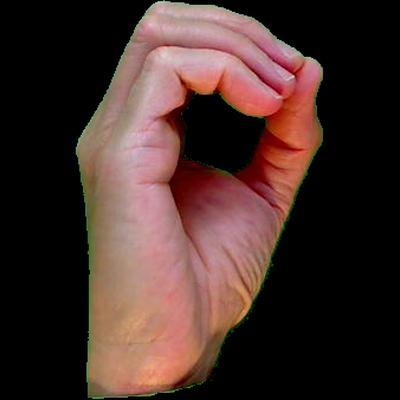

Sign: O


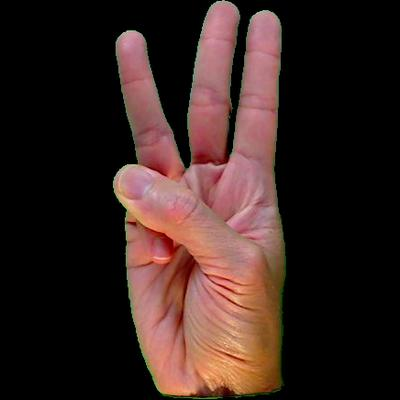

Sign: W
No sign image available for: .


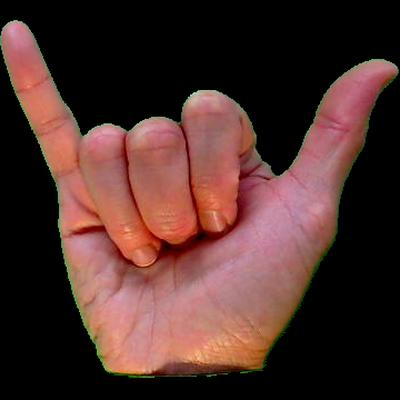

Sign: Y


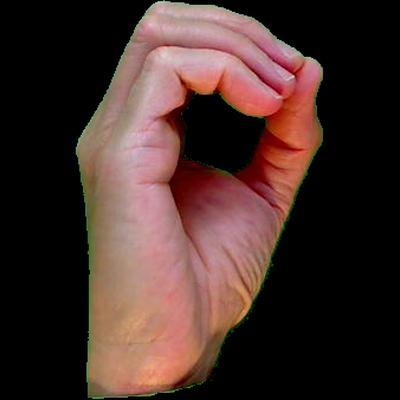

Sign: O


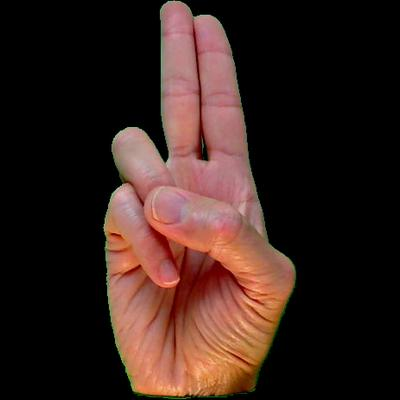

Sign: U


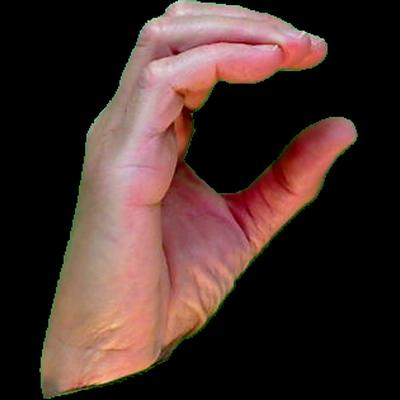

Sign: C


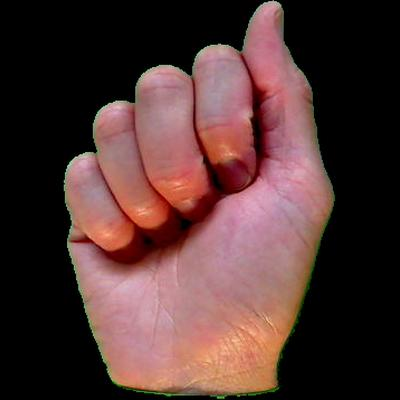

Sign: A


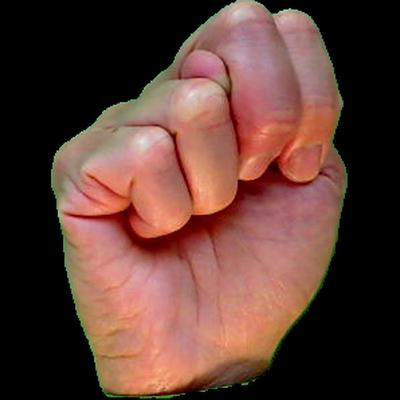

Sign: N


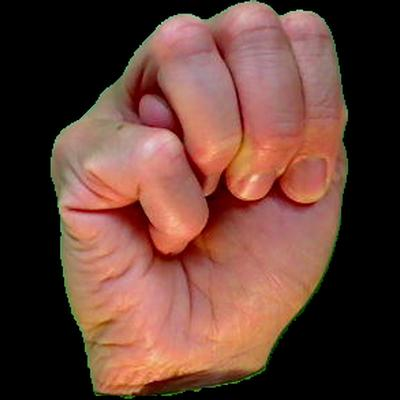

Sign: M


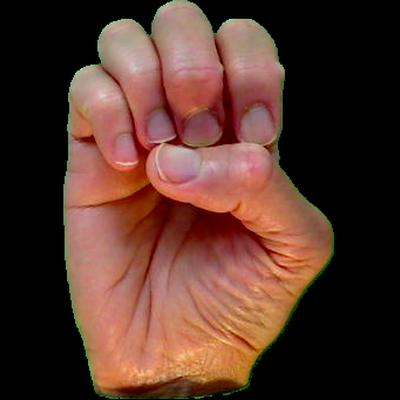

Sign: E


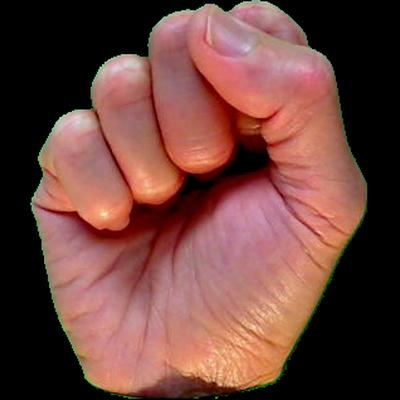

Sign: S


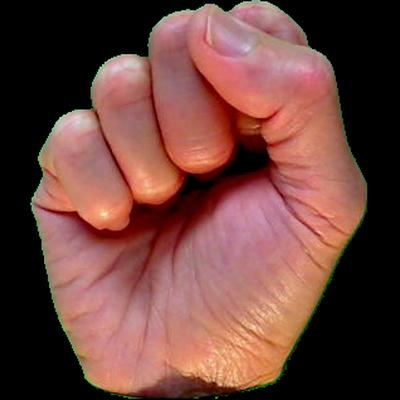

Sign: S


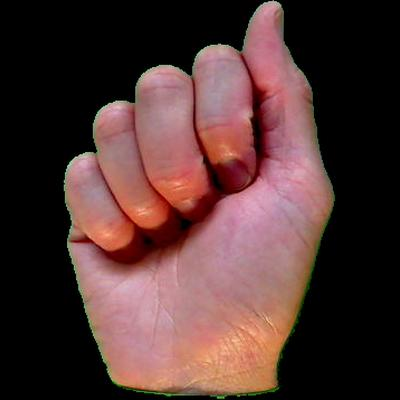

Sign: A


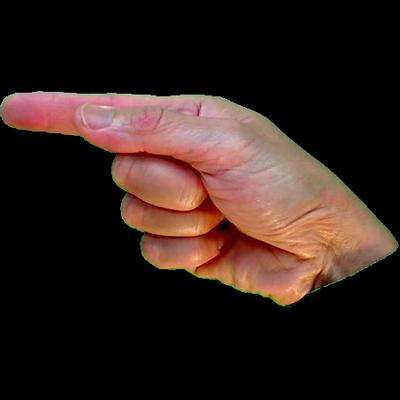

Sign: G


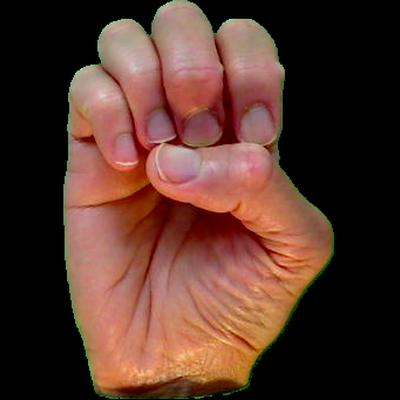

Sign: E


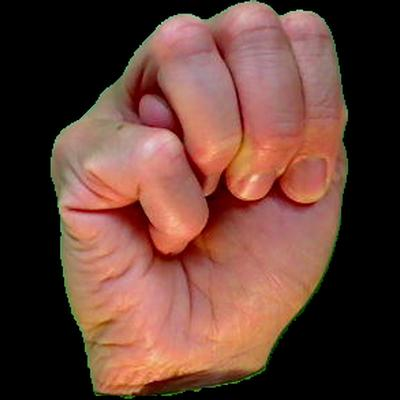

Sign: M


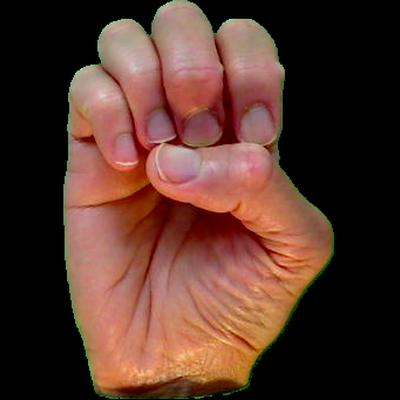

Sign: E


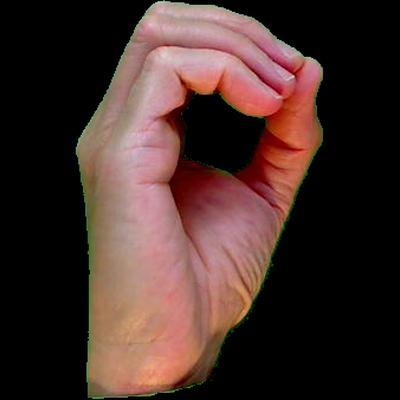

Sign: O


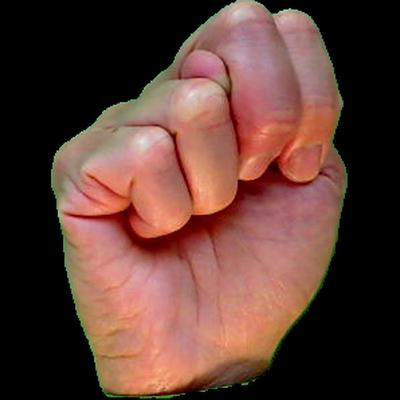

Sign: N


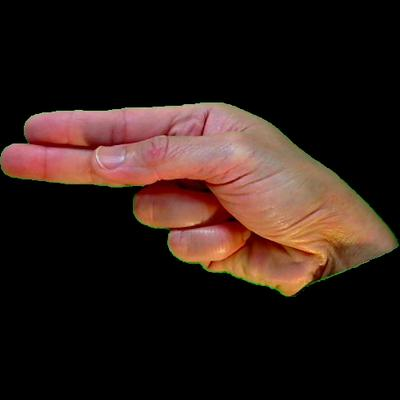

Sign: H


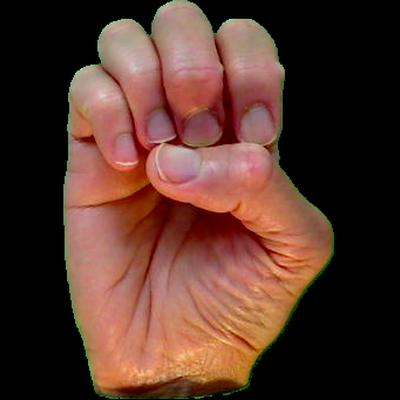

Sign: E


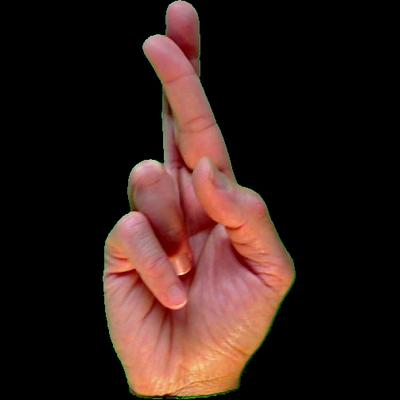

Sign: R


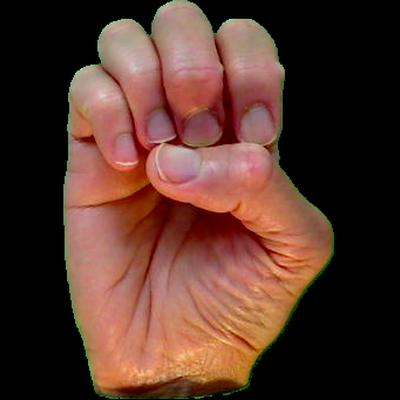

Sign: E


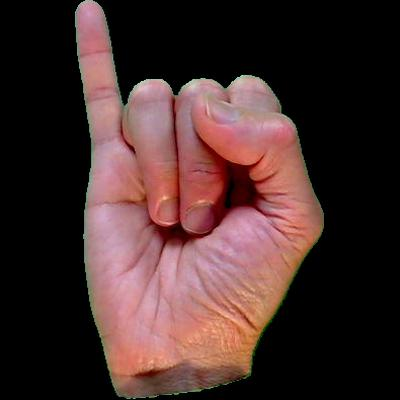

Sign: I


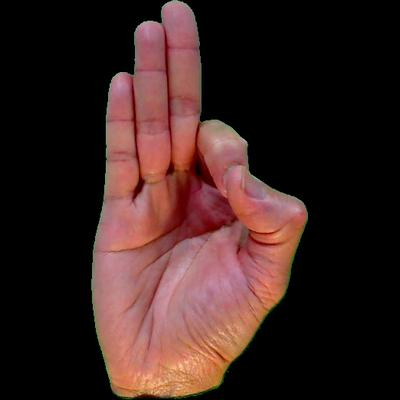

Sign: F


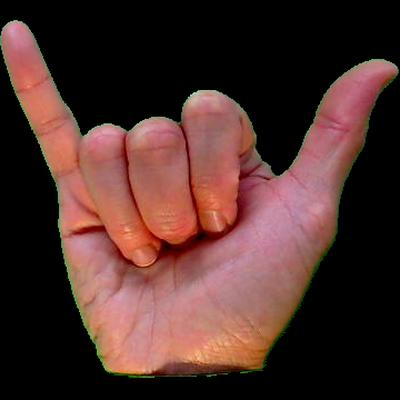

Sign: Y


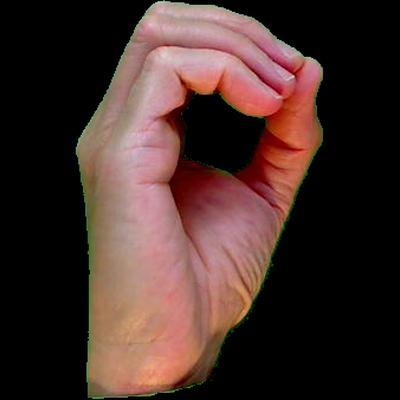

Sign: O


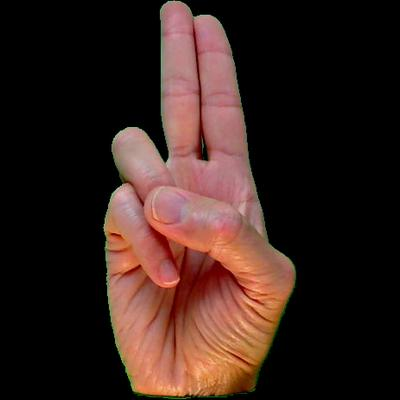

Sign: U


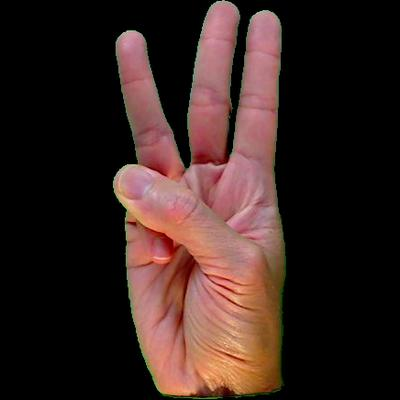

Sign: W


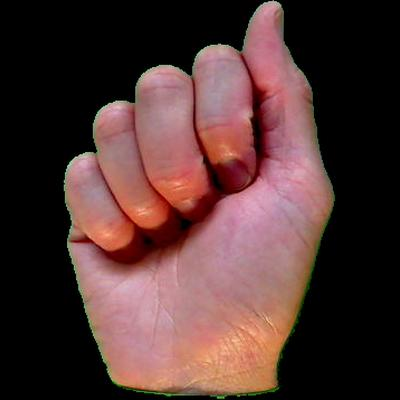

Sign: A


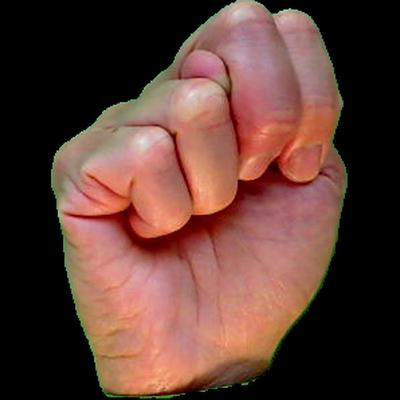

Sign: N


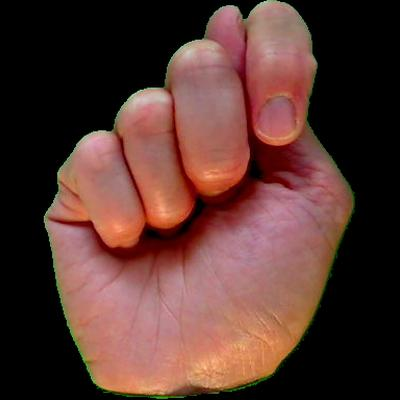

Sign: T


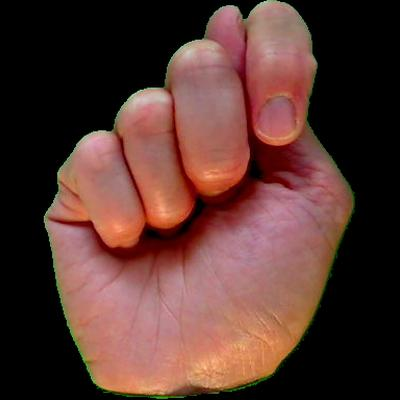

Sign: T


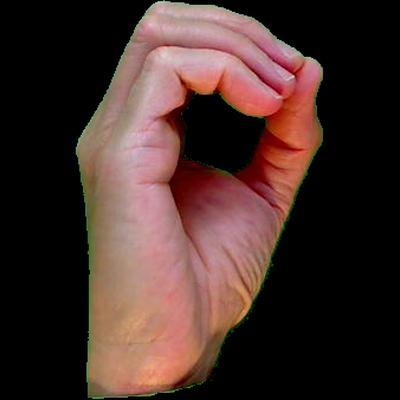

Sign: O


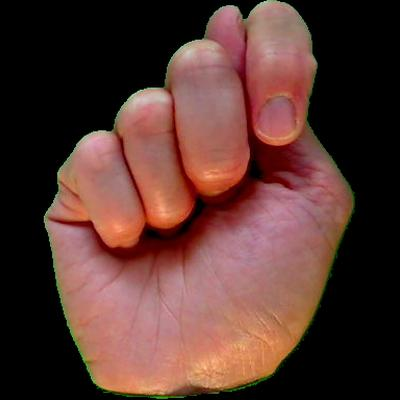

Sign: T


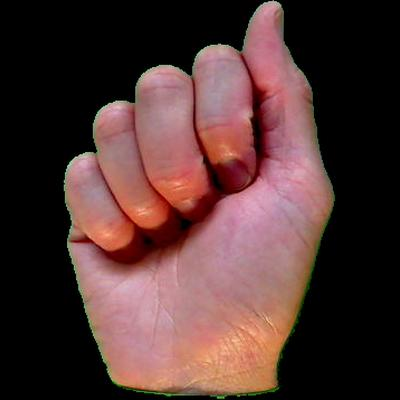

Sign: A


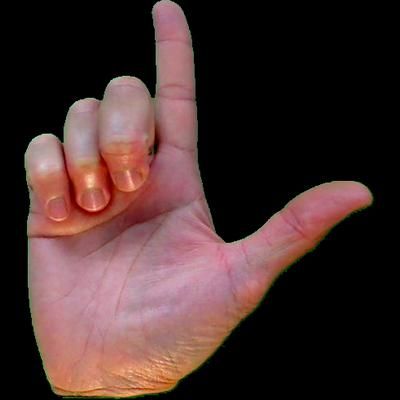

Sign: L


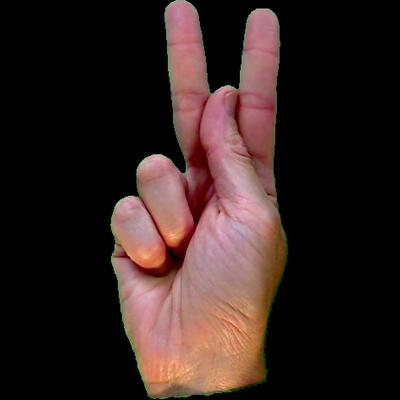

Sign: K


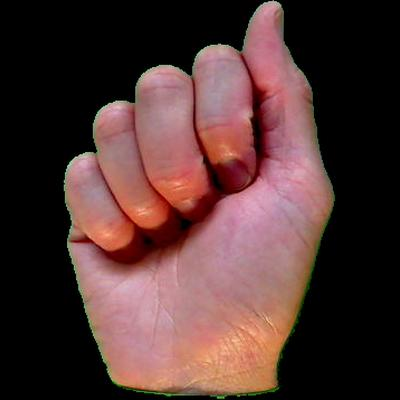

Sign: A


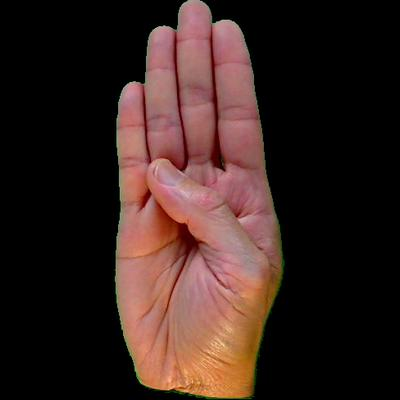

Sign: B


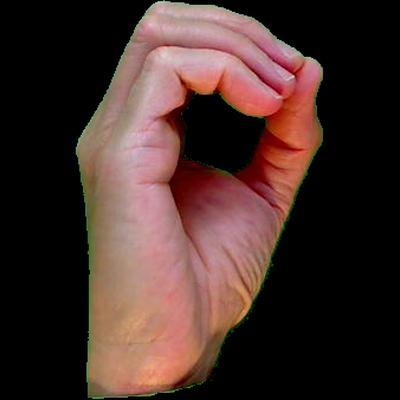

Sign: O


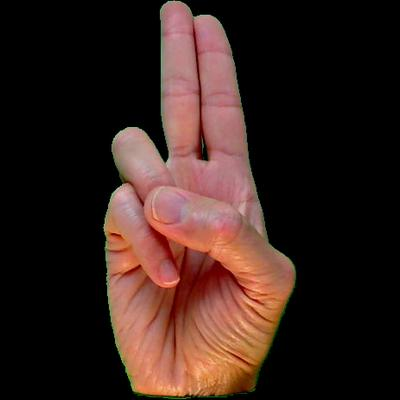

Sign: U


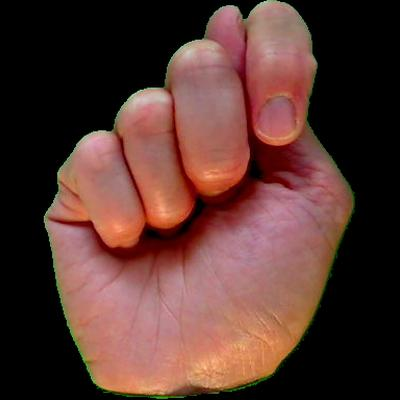

Sign: T


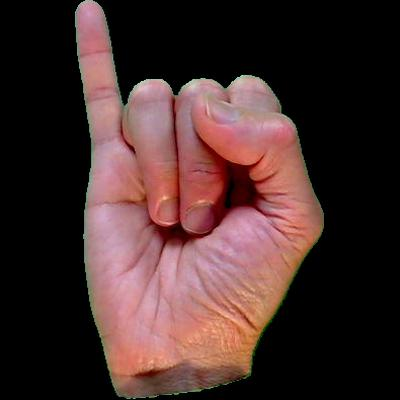

Sign: I


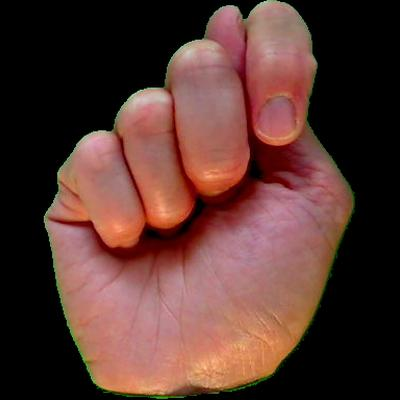

Sign: T



Your response: DONE. THANK YOU.

Your Response as Signs:


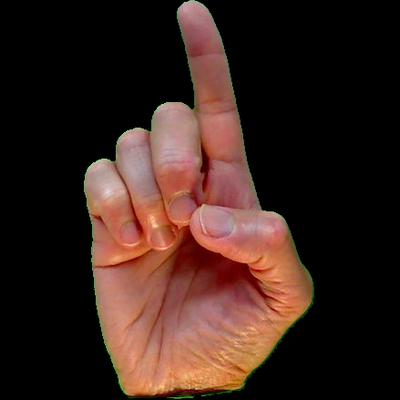

Sign: D


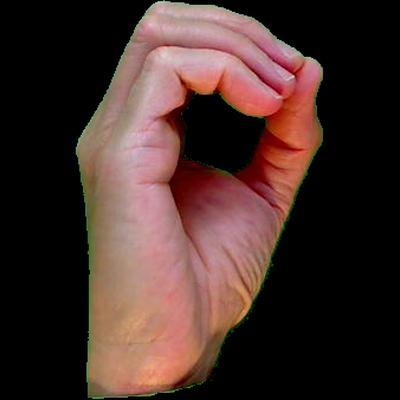

Sign: O


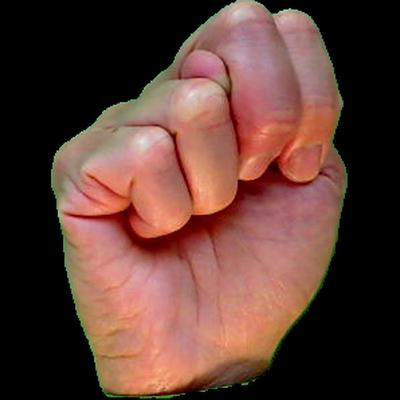

Sign: N


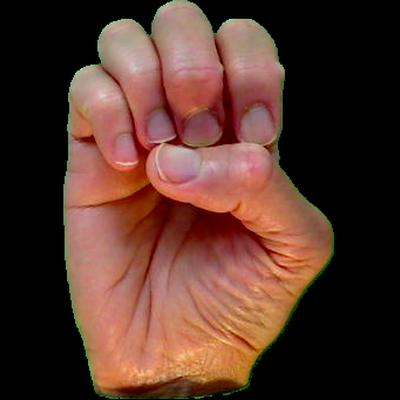

Sign: E
No sign image available for: .


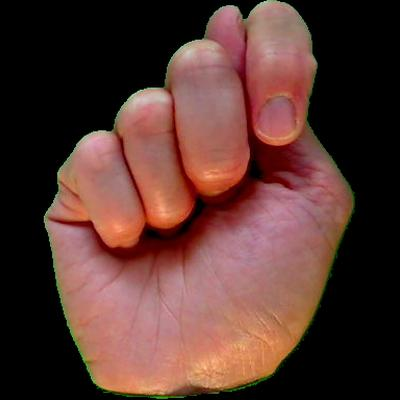

Sign: T


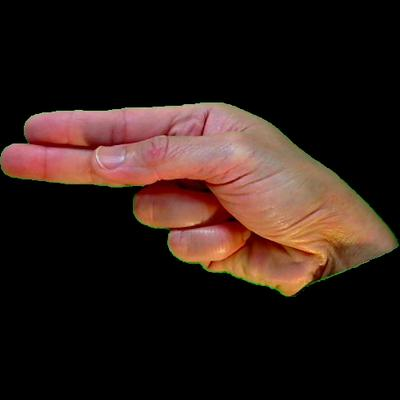

Sign: H


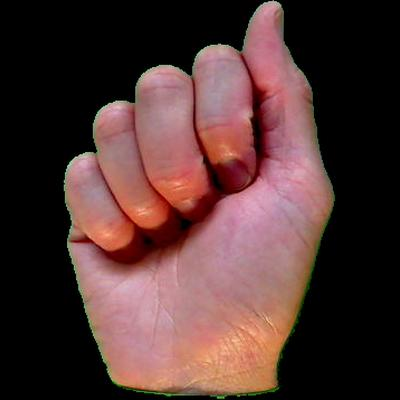

Sign: A


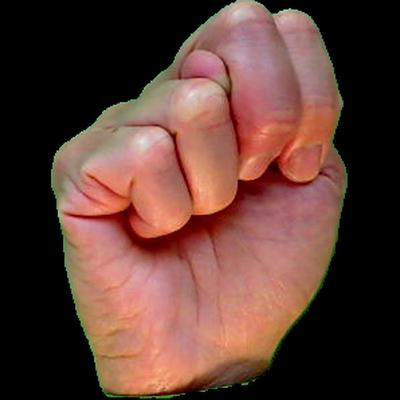

Sign: N


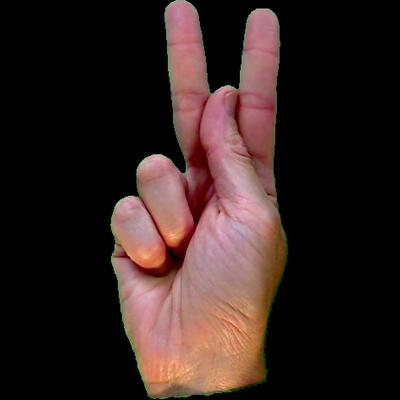

Sign: K


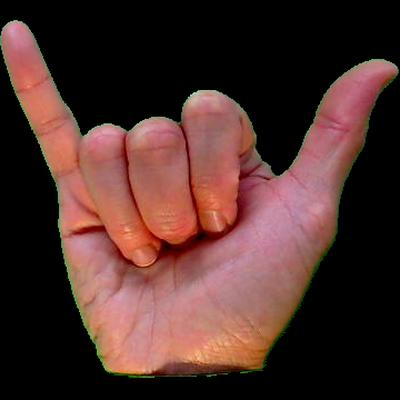

Sign: Y


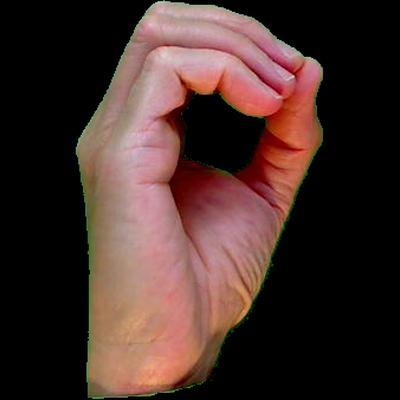

Sign: O


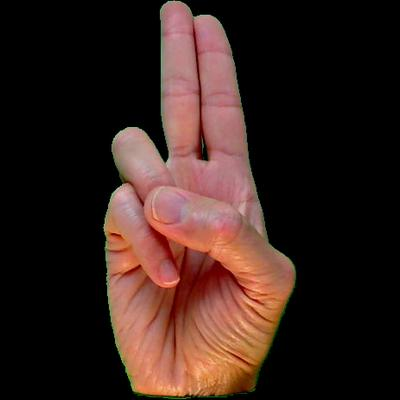

Sign: U
No sign image available for: .

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU
Deaf Person: Good, how are you?
You: I AM FINE. CAN YOU HELP ME WITH MY PROJECT?
Deaf Person: Sure, I'll help you out.
You: WHEN ARE YOU FREE?
Deaf Person: Tomorrow. I have to go to work, but I'm free all day tomorrow. You can message me on here if you want to talk about it
You: DONE. THANK YOU.

Deaf Person Signing: You're welcome


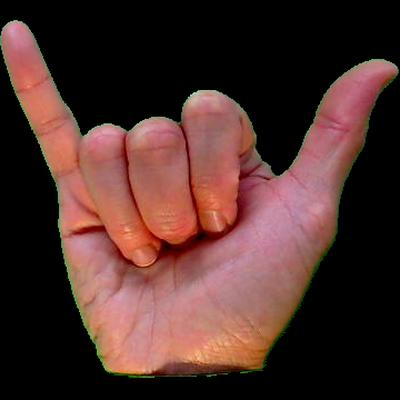

Sign: Y


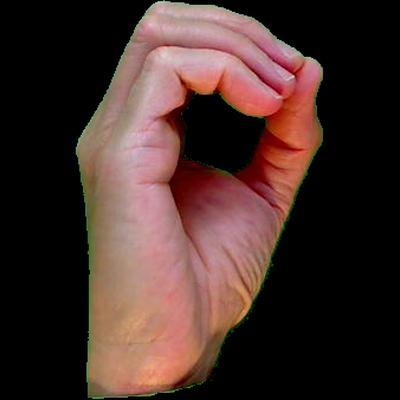

Sign: O


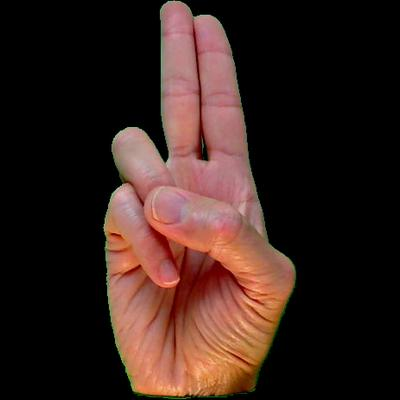

Sign: U
No sign image available for: '


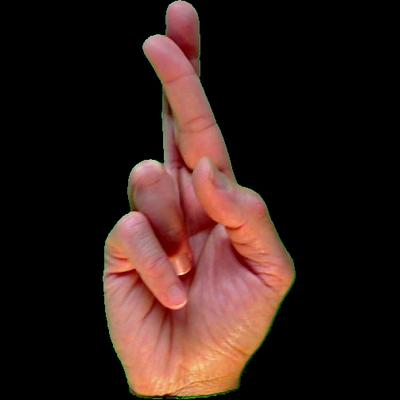

Sign: R


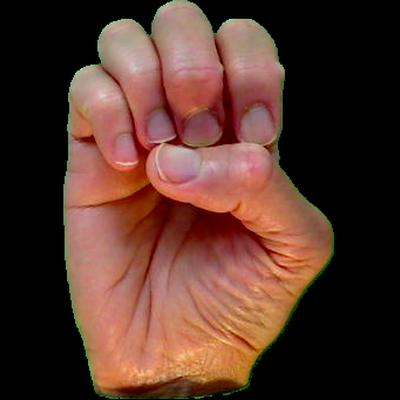

Sign: E


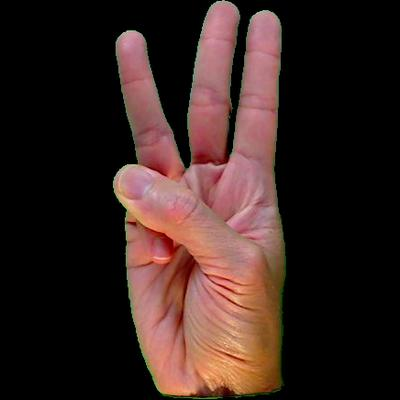

Sign: W


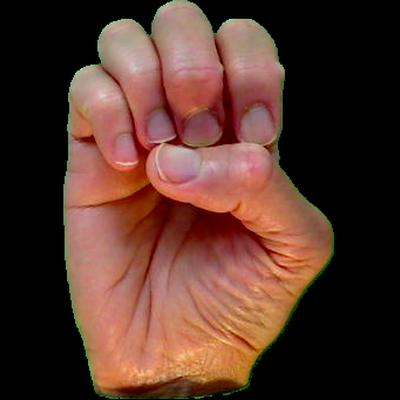

Sign: E


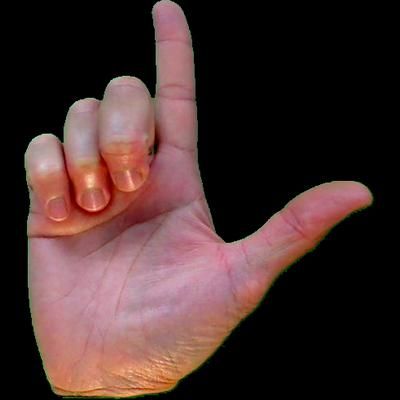

Sign: L


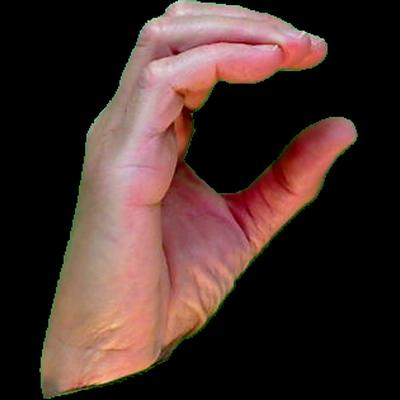

Sign: C


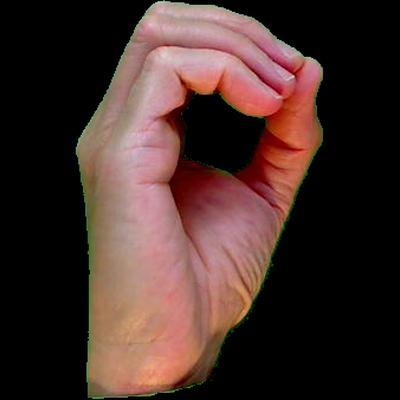

Sign: O


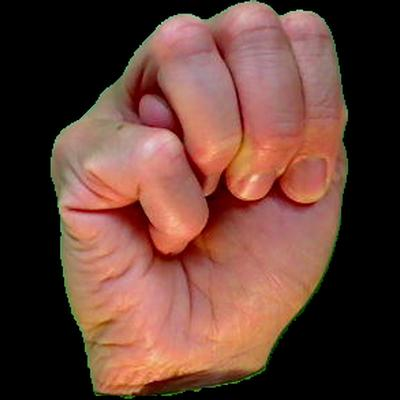

Sign: M


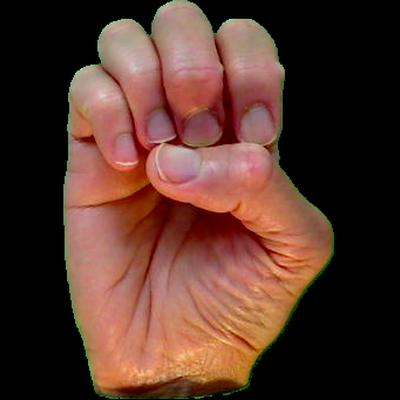

Sign: E



Interactive simulation safely ended.


In [ ]:
import zipfile
import os
import time
import random
from PIL import Image
from gtts import gTTS
from IPython.display import Audio, display, Image as IPImage
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch

# Extract images from ZIP file
zip_path = '/content/IMAGES.zip'
extracted_dir = './extracted_images'
os.makedirs(extracted_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

image_dir = os.path.join(extracted_dir, 'IMAGES')

# Initialize NLP chatbot model and tokenizer
model_name = "microsoft/DialoGPT-medium"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

# Mapping letters to images
image_files = sorted(os.listdir(image_dir))
sign_image_map = {chr(65 + i): os.path.join(image_dir, img) for i, img in enumerate(image_files)}

# Generate audio function
def generate_audio(text, filename):
    tts = gTTS(text=text, lang='en')
    tts.save(filename)
    return filename

# Function to display text as signs with notation clearly after each sign
def display_text_as_signs(text):
    text = text.upper().replace(" ", "")
    for letter in text:
        if letter in sign_image_map:
            display(IPImage(filename=sign_image_map[letter]))
            print(f"Sign: {letter}")
            time.sleep(0.3)
        else:
            print(f"No sign image available for: {letter}")

# Clearly defined fallback responses
fallback_responses = [
    "CAN YOU PLEASE REPEAT?",
    "SORRY, COULD YOU SAY THAT AGAIN?",
    "I'M NOT SURE I UNDERSTOOD, PLEASE REPEAT.",
    "CAN YOU REPHRASE THAT?"
]

def get_fallback_response():
    return random.choice(fallback_responses)

conversation_history = []
current_phrase = "HELLO, HOW CAN I HELP YOU?"
chat_history_ids = None
turn_counter = 0

try:
    while True:
        print("\n--- Entire Conversation History ---")
        for speaker, phrase in conversation_history:
            print(f"{speaker}: {phrase}")

        # Deaf person's turn
        print(f"\nDeaf Person Signing: {current_phrase}")
        display_text_as_signs(current_phrase)
        audio_output_path = f"deaf_person_audio_{len(conversation_history)}.mp3"
        generate_audio(current_phrase, audio_output_path)
        display(Audio(audio_output_path, autoplay=True))
        conversation_history.append(("Deaf Person", current_phrase))

        # Hearing person's turn
        user_response = input("\nYour response: ")
        conversation_history.append(("You", user_response))

        print("\nYour Response as Signs:")
        display_text_as_signs(user_response)

        new_user_input_ids = tokenizer.encode(user_response + tokenizer.eos_token, return_tensors='pt')
        bot_input_ids = new_user_input_ids if chat_history_ids is None else torch.cat([chat_history_ids, new_user_input_ids], dim=-1)

        chat_history_ids = model.generate(
            bot_input_ids,
            max_length=150,
            pad_token_id=tokenizer.eos_token_id,
            do_sample=True,
            top_k=15,
            top_p=0.7,
            temperature=0.4,
            num_beams=5,
            early_stopping=True,
            no_repeat_ngram_size=2
        )

        response_text = tokenizer.decode(chat_history_ids[:, bot_input_ids.shape[-1]:][0], skip_special_tokens=True).strip()

        if response_text.strip() == "" or response_text in user_response or response_text == current_phrase:
            current_phrase = random.choice(fallback_responses)
        else:
            current_phrase = response_text

        # Save each audio output clearly
        audio_filename = f"conversation_turn_{len(conversation_history)}.mp3"
        generate_audio(current_phrase, audio_filename)

except KeyboardInterrupt:
    print("\nInteractive simulation safely ended.")



Deaf Person Signing: No problem, thank you!


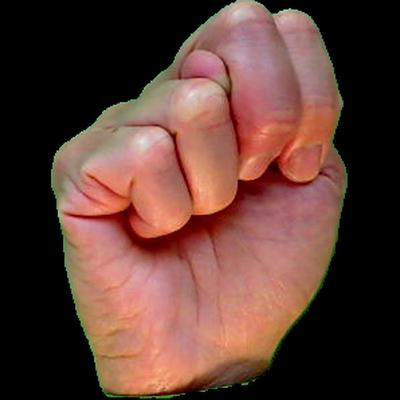

Sign: N


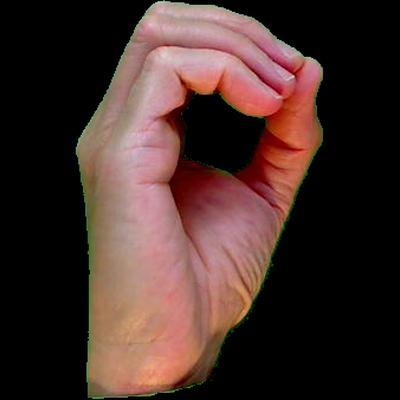

Sign: O


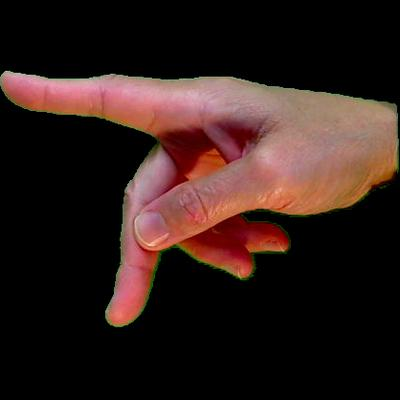

Sign: P


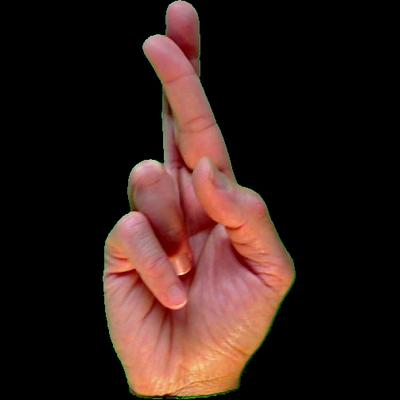

Sign: R


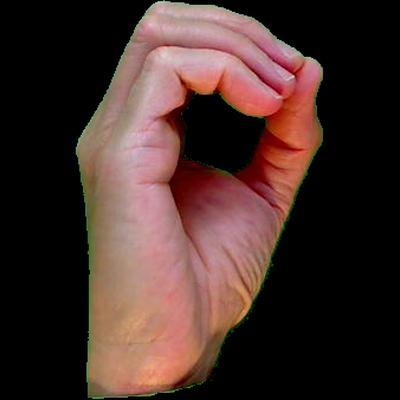

Sign: O


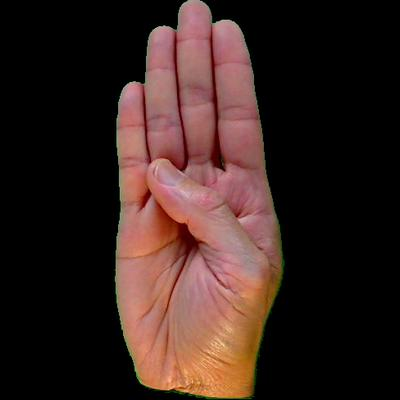

Sign: B


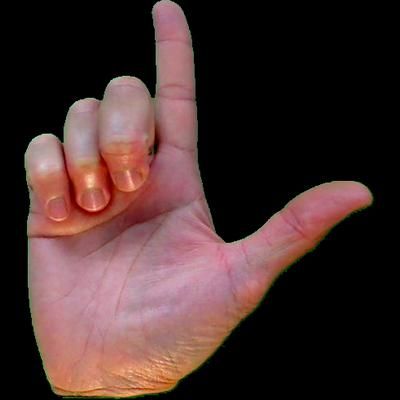

Sign: L


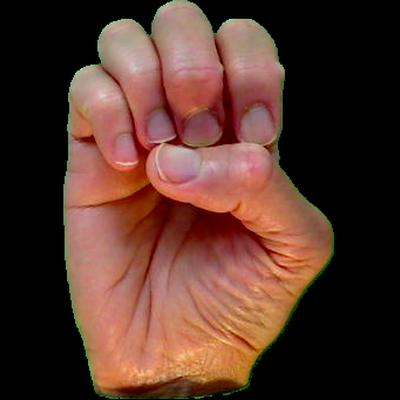

Sign: E


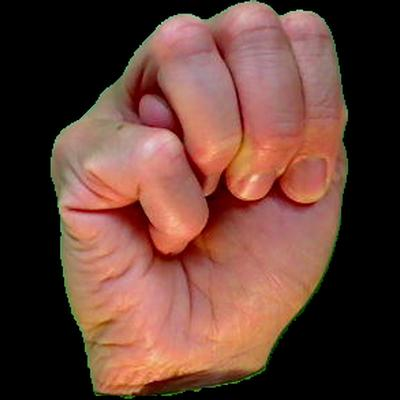

Sign: M
No sign image available for: ,


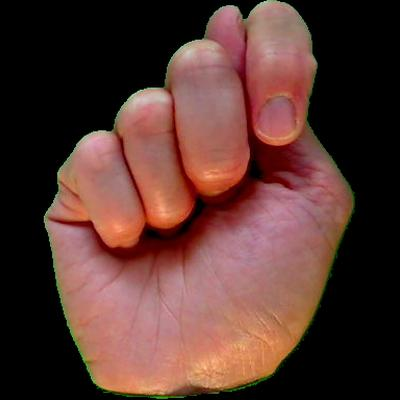

Sign: T


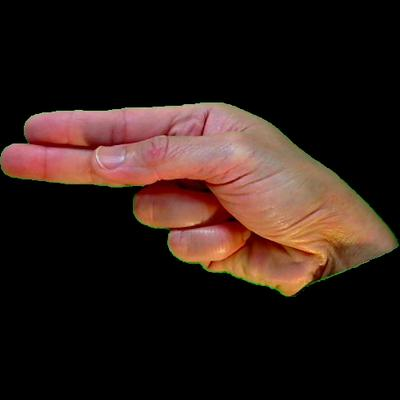

Sign: H


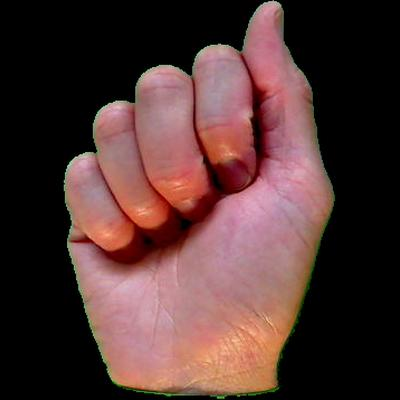

Sign: A


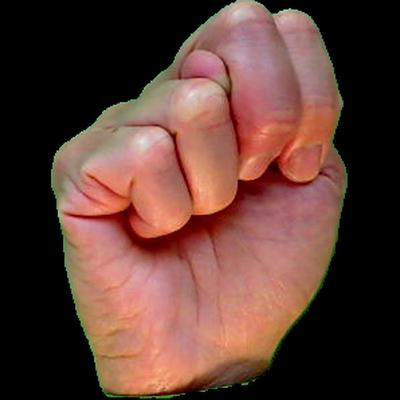

Sign: N


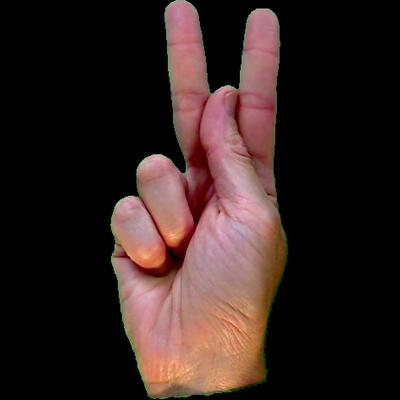

Sign: K


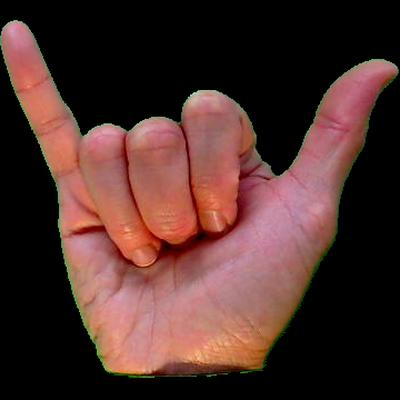

Sign: Y


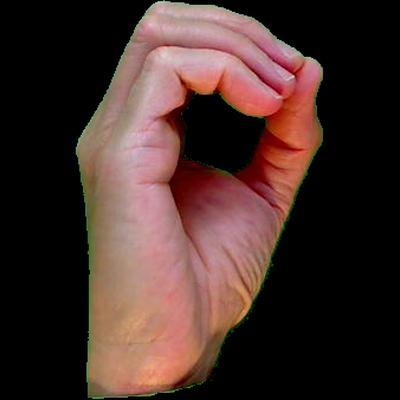

Sign: O


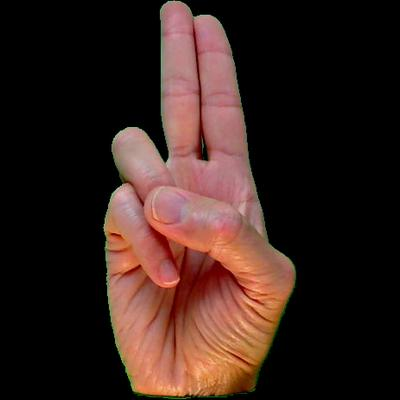

Sign: U
No sign image available for: !

Audio for hearing person:



Interactive simulation safely ended.


In [ ]:
import zipfile
import os
import time
from PIL import Image
from gtts import gTTS
from IPython.display import Audio, display, Image as IPImage, clear_output
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch

# Extract images from ZIP file
zip_path = '/content/IMAGES.zip'
extracted_dir = './extracted_images'
os.makedirs(extracted_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

image_dir = os.path.join(extracted_dir, 'IMAGES')

# Initialize NLP chatbot model and tokenizer
model_name = "microsoft/DialoGPT-medium"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

# Mapping letters to images
image_files = sorted(os.listdir(image_dir))
sign_image_map = {chr(65 + i): os.path.join(image_dir, img) for i, img in enumerate(image_files)}

# Generate audio function
def generate_audio(text, filename="response_audio.mp3"):
    tts = gTTS(text=text, lang='en')
    tts.save(filename)
    return filename

# Function to display text as signs with notation clearly after each sign
def display_text_as_signs(text):
    text = text.upper().replace(" ", "")
    for letter in text:
        if letter in sign_image_map:
            display(IPImage(filename=sign_image_map[letter]))
            print(f"Sign: {letter}")
            time.sleep(0.3)
        else:
            print(f"No sign image available for: {letter}")

# Fallback responses clearly defined
fallback_responses = [
    "CAN YOU PLEASE REPEAT?",
    "I'M SORRY, I DID NOT GET THAT.",
    "COULD YOU PLEASE REPHRASE?",
    "PLEASE SAY THAT AGAIN, CLEARLY."
]

def get_fallback_response():
    return random.choice(fallback_responses)

fallback_responses = fallback_responses = [
    "CAN YOU PLEASE REPEAT?",
    "SORRY, COULD YOU SAY THAT AGAIN?",
    "I'M NOT SURE I UNDERSTOOD, PLEASE REPEAT.",
    "CAN YOU REPHRASE THAT?"
]

print("\n--- Realistic NLP-powered Interactive Sign Language Communication ---")

current_phrase = "HELLO, HOW CAN I HELP YOU?"
chat_history_ids = None

try:
    while True:
        clear_output(wait=True)
        print(f"\nDeaf Person Signing: {current_phrase}")
        display_text_as_signs(current_phrase)

        audio_output_path = "deaf_person_audio.mp3"
        generate_audio(current_phrase, audio_output_path)

        print("\nAudio for hearing person:")
        display(Audio(audio_output_path, autoplay=True))

        user_response = input("\nYour response: ")

        print("\nYour Response as Signs:")
        display_text_as_signs(user_response)

        new_user_input_ids = tokenizer.encode(user_response + tokenizer.eos_token, return_tensors='pt')
        bot_input_ids = new_user_input_ids if chat_history_ids is None else torch.cat([chat_history_ids, new_user_input_ids], dim=-1)

        chat_history_ids = model.generate(
            bot_input_ids,
            max_length=100,
            pad_token_id=tokenizer.eos_token_id,
            do_sample=True,
            top_k=15,
            top_p=0.7,
            temperature=0.4,
            num_beams=5,
            early_stopping=True,
            no_repeat_ngram_size=2
        )

        response_text = tokenizer.decode(chat_history_ids[:, bot_input_ids.shape[-1]:][0], skip_special_tokens=True).strip()

        # Check for relevance or repetition, fallback if necessary
        if response_text.strip() == "" or response_text in user_response or response_text == current_phrase:
            current_phrase = get_fallback_response()
        else:
            current_phrase = response_text

except KeyboardInterrupt:
    print("\nInteractive simulation safely ended.")


--- Entire Conversation History ---

Deaf Person Signing: HELLO, HOW CAN I HELP YOU?


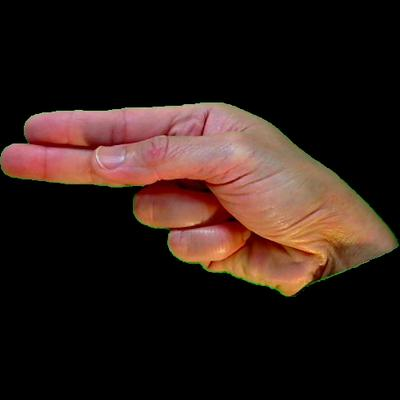

Sign: H


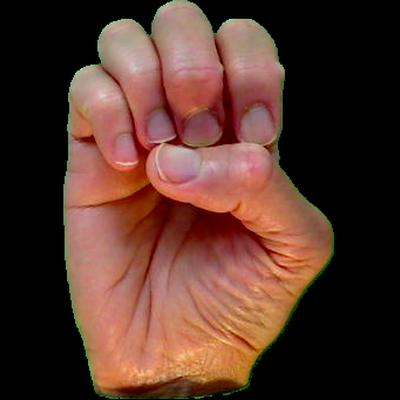

Sign: E


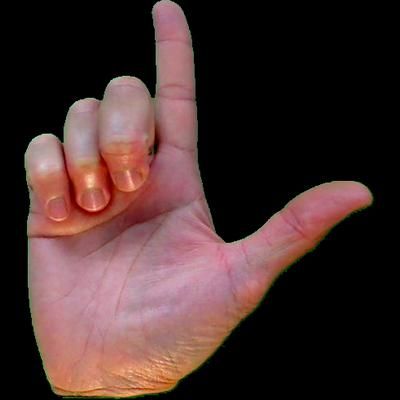

Sign: L


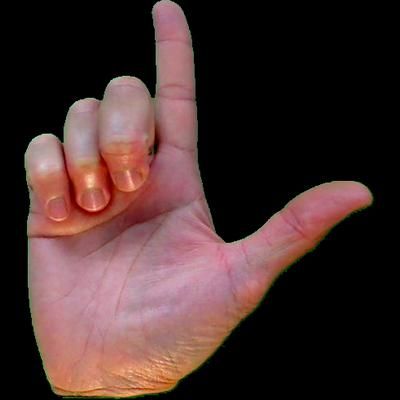

Sign: L


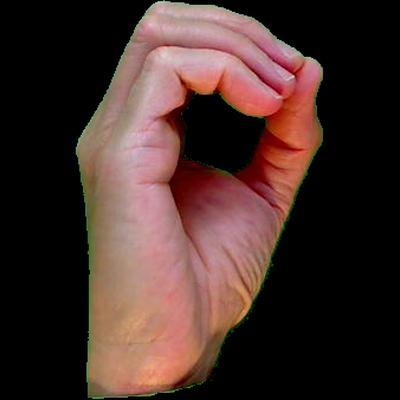

Sign: O
No sign image available for: ,


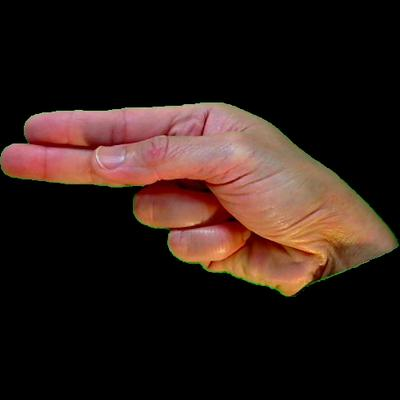

Sign: H


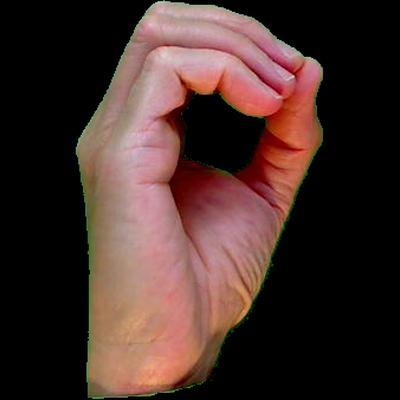

Sign: O


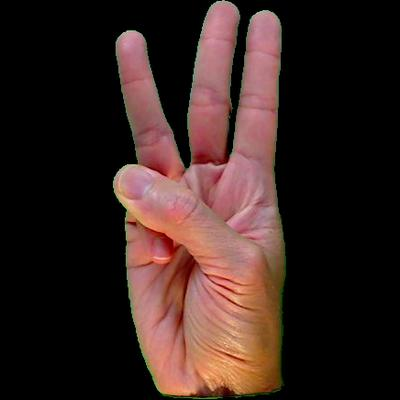

Sign: W


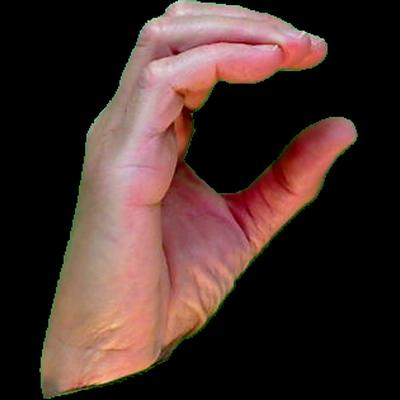

Sign: C


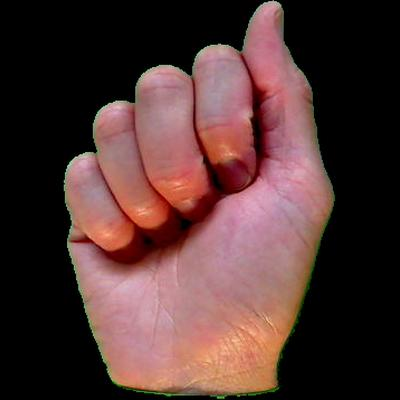

Sign: A


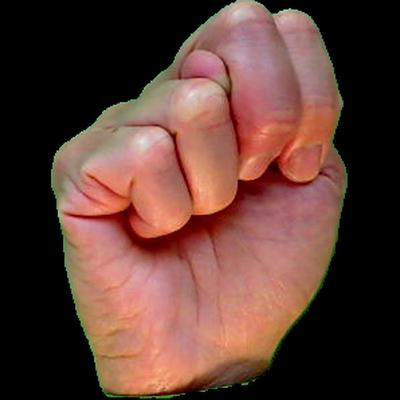

Sign: N


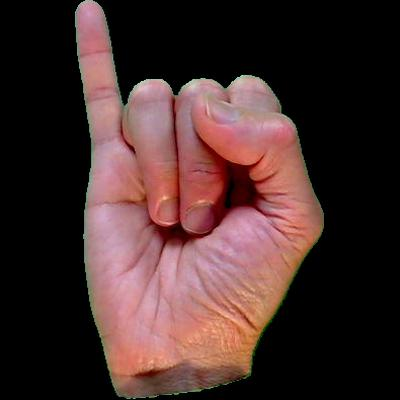

Sign: I


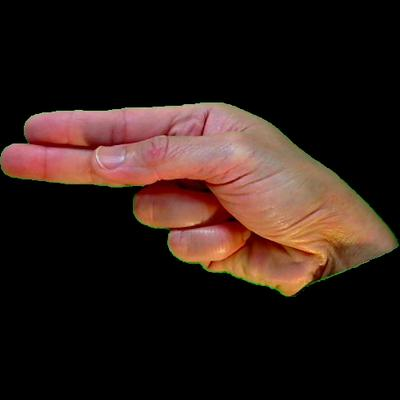

Sign: H


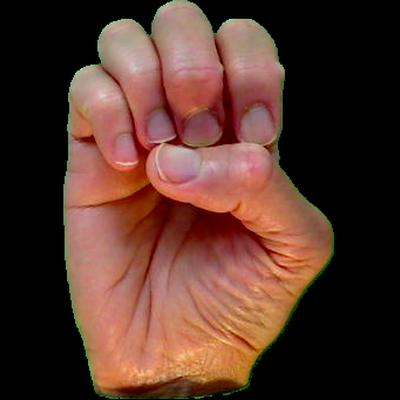

Sign: E


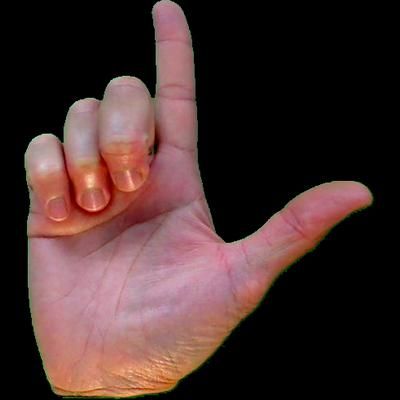

Sign: L


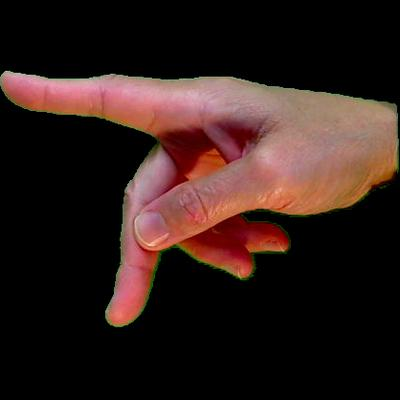

Sign: P


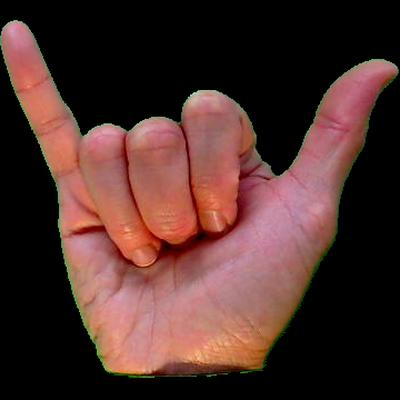

Sign: Y


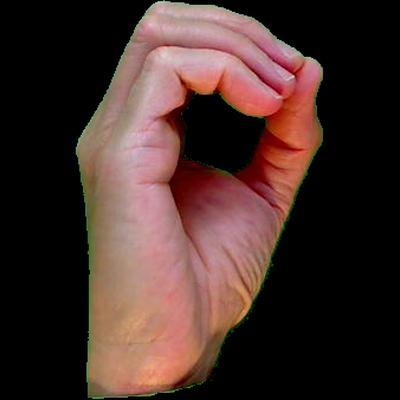

Sign: O


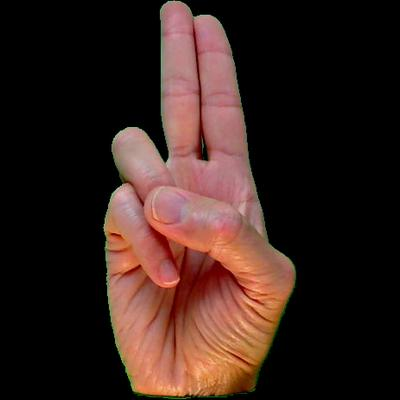

Sign: U
No sign image available for: ?

Audio for hearing person:



Your response: HOW ARE YOU

Your Response as Signs:


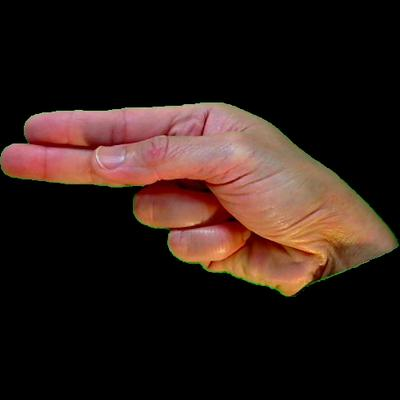

Sign: H


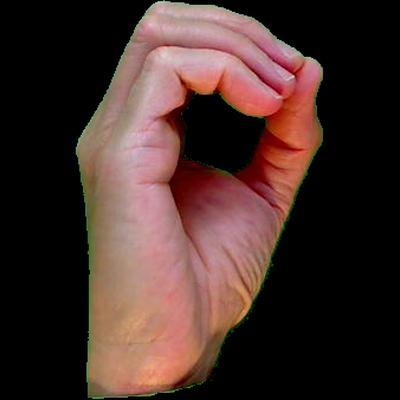

Sign: O


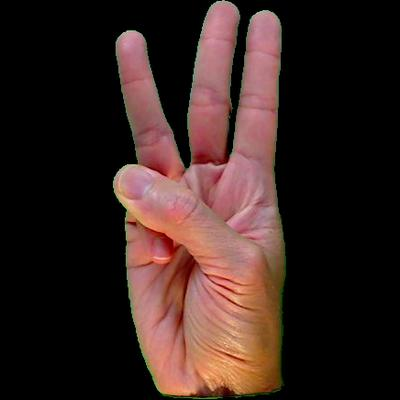

Sign: W


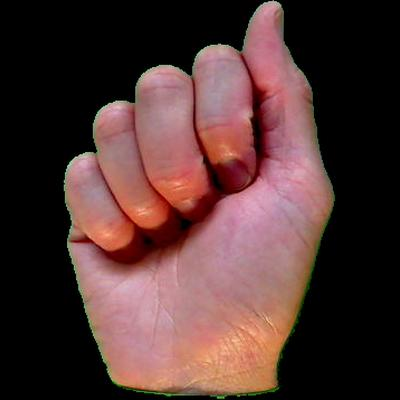

Sign: A


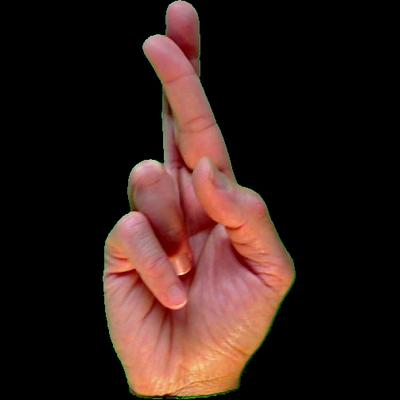

Sign: R


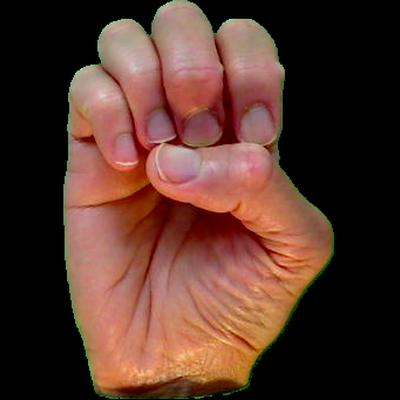

Sign: E


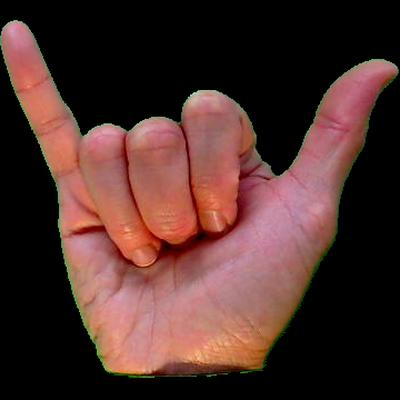

Sign: Y


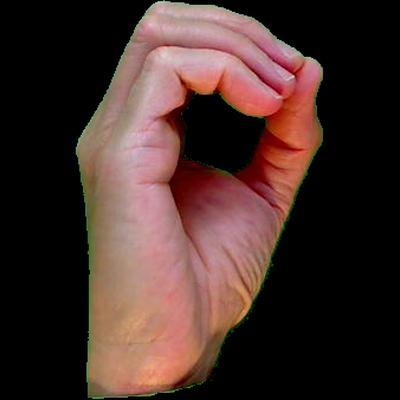

Sign: O


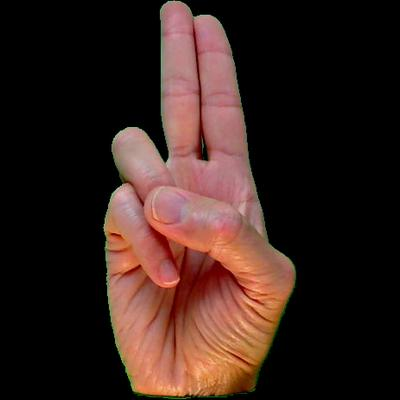

Sign: U

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU

Deaf Person Signing: Good, how are you?


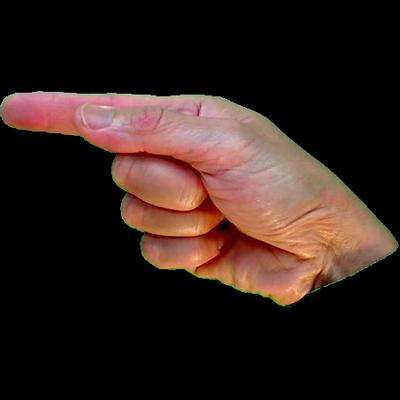

Sign: G


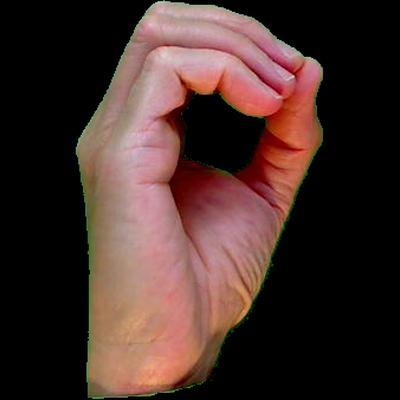

Sign: O


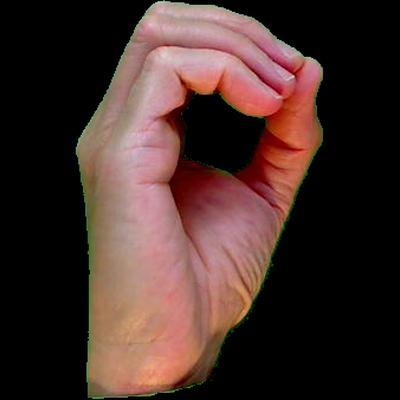

Sign: O


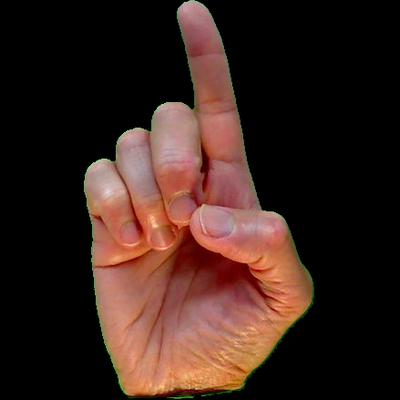

Sign: D
No sign image available for: ,


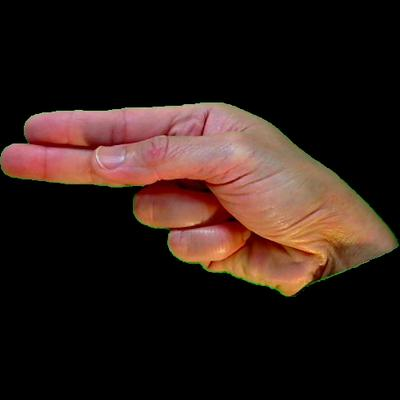

Sign: H


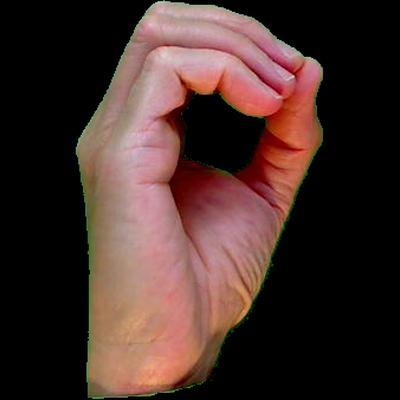

Sign: O


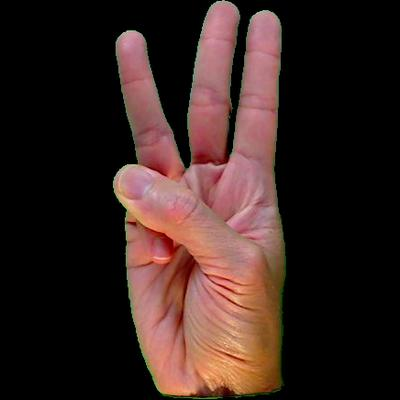

Sign: W


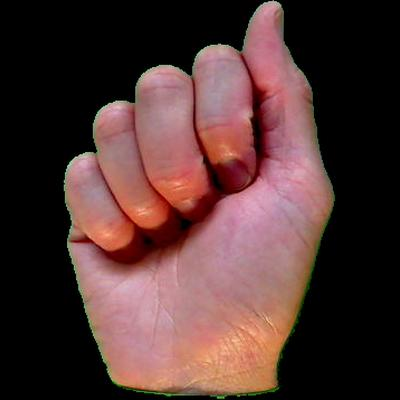

Sign: A


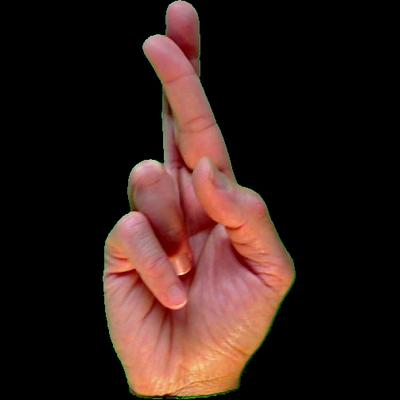

Sign: R


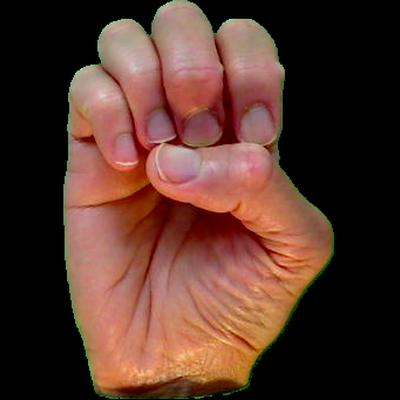

Sign: E


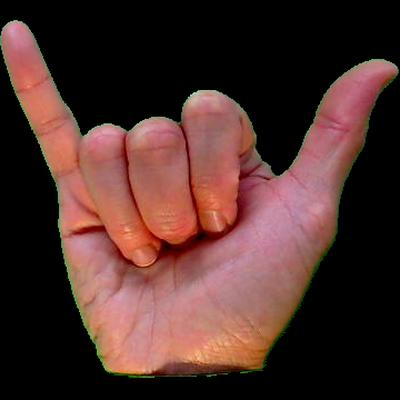

Sign: Y


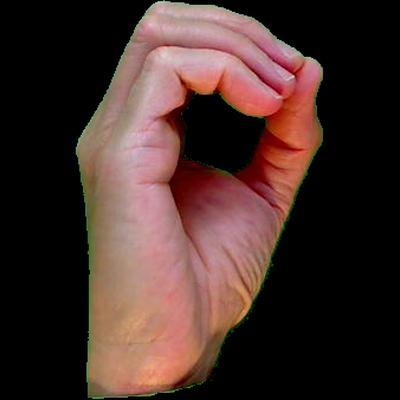

Sign: O


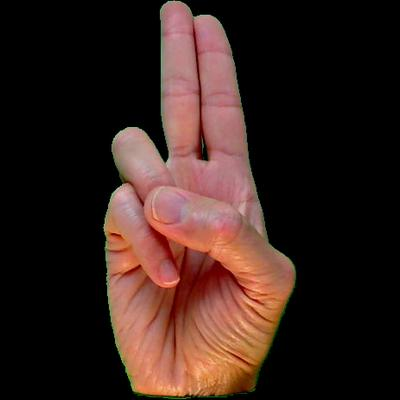

Sign: U
No sign image available for: ?

Audio for hearing person:



Your response: I AM FINE. CAN YOU HELP ME WITH MY PROJECT 

Your Response as Signs:


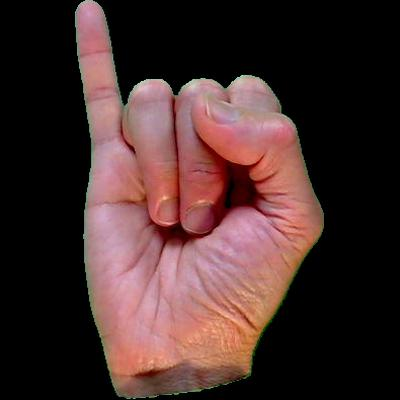

Sign: I


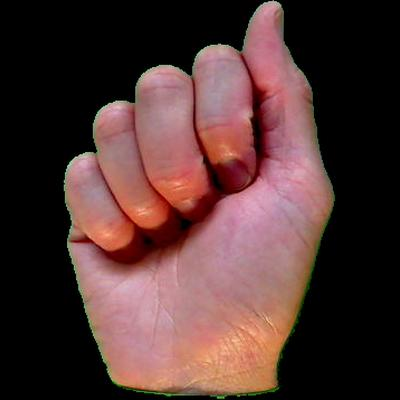

Sign: A


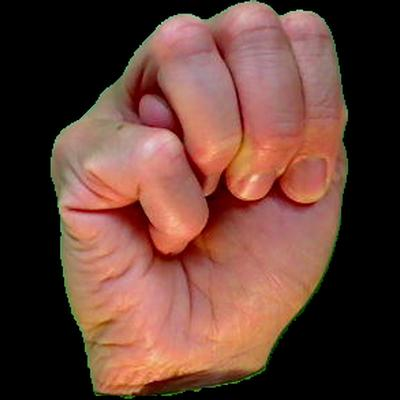

Sign: M


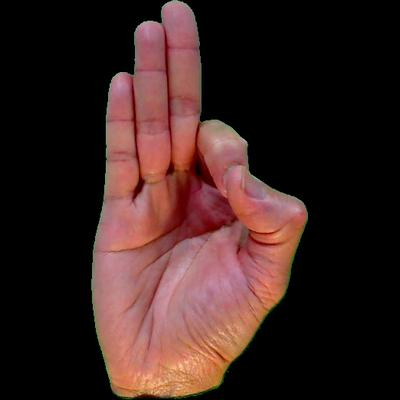

Sign: F


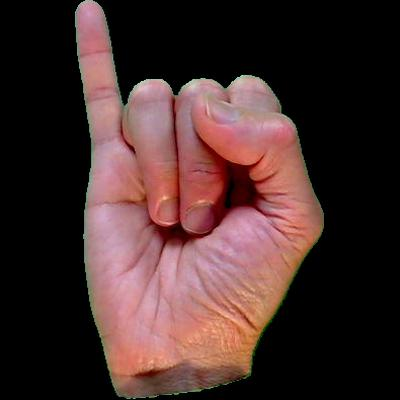

Sign: I


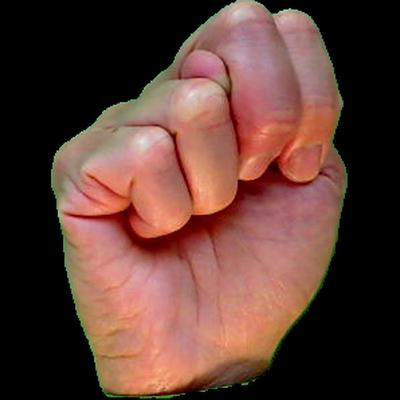

Sign: N


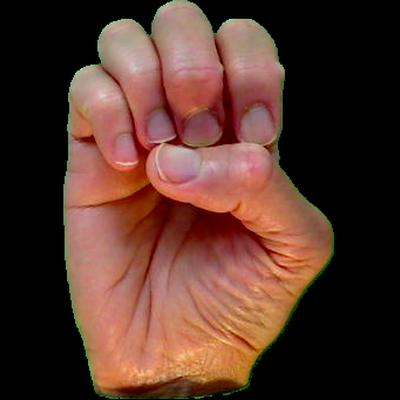

Sign: E
No sign image available for: .


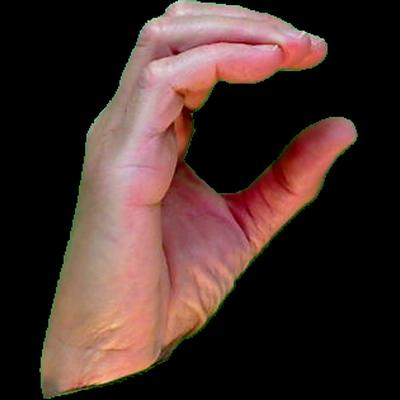

Sign: C


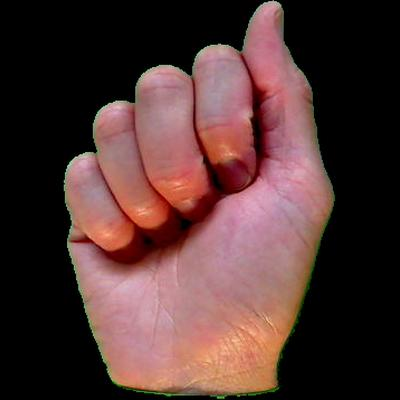

Sign: A


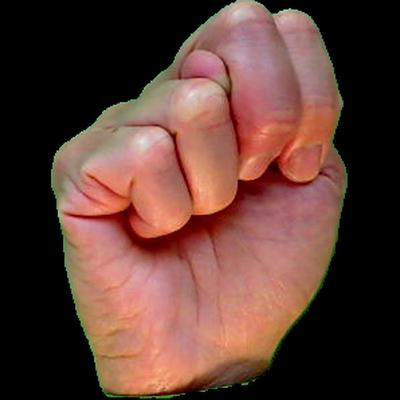

Sign: N


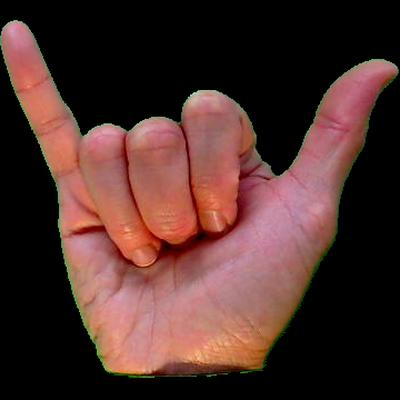

Sign: Y


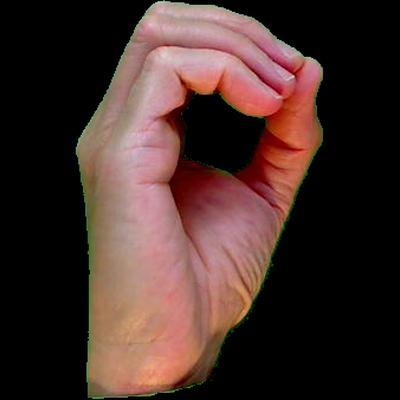

Sign: O


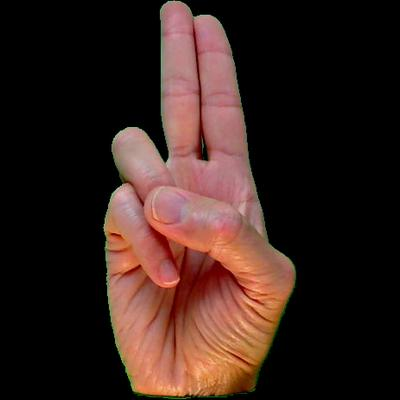

Sign: U


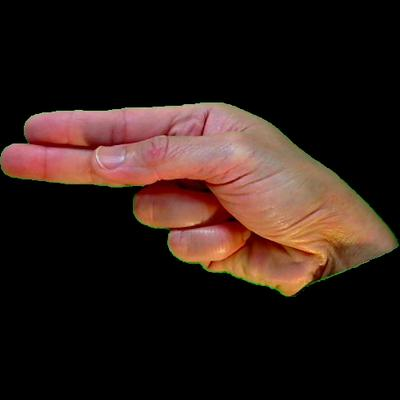

Sign: H


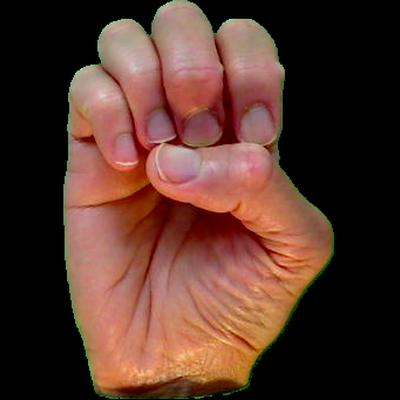

Sign: E


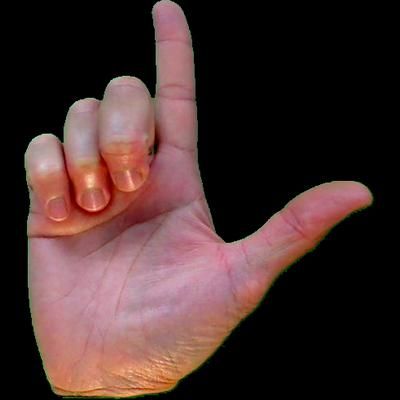

Sign: L


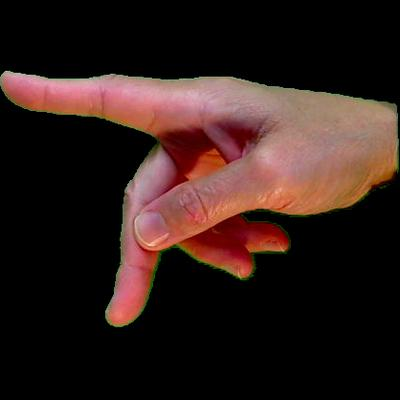

Sign: P


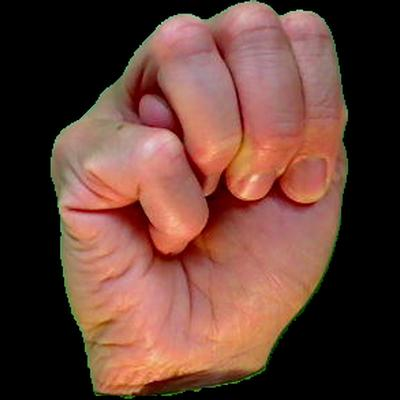

Sign: M


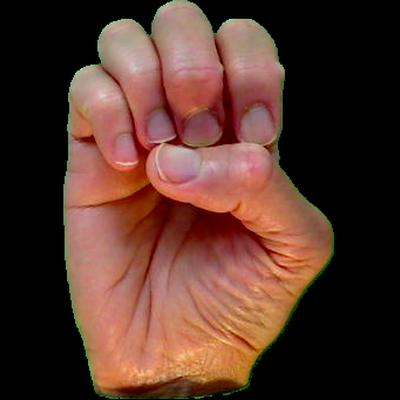

Sign: E


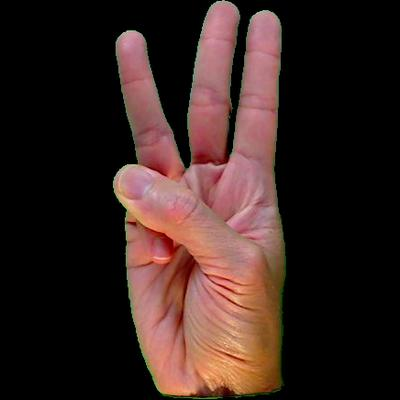

Sign: W


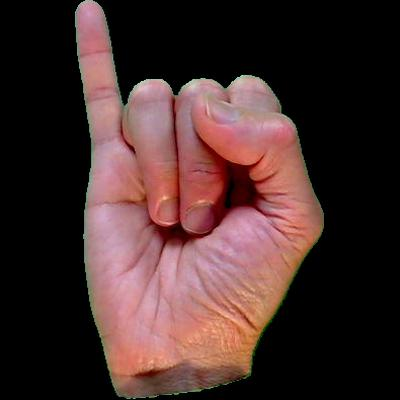

Sign: I


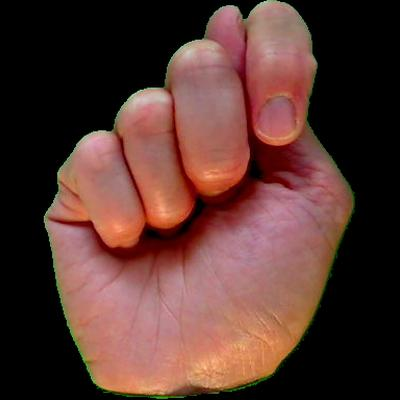

Sign: T


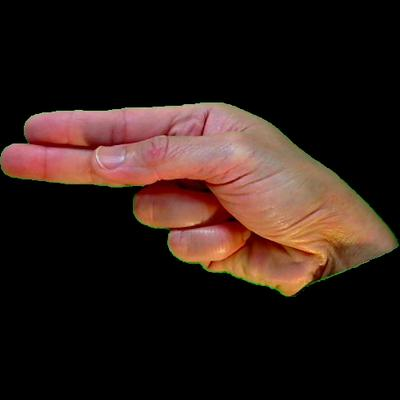

Sign: H


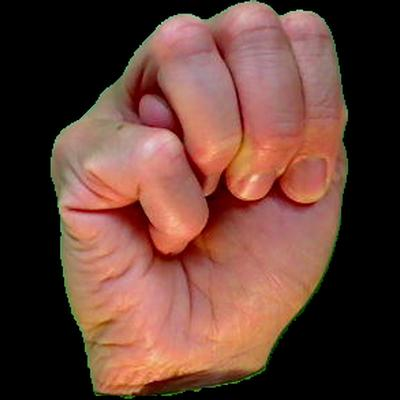

Sign: M


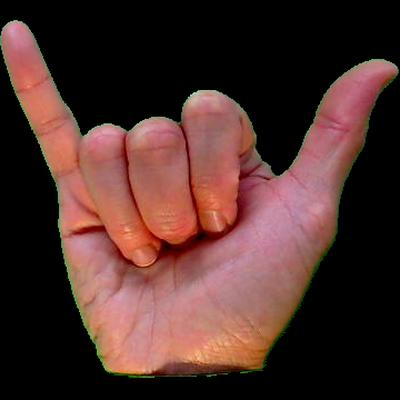

Sign: Y


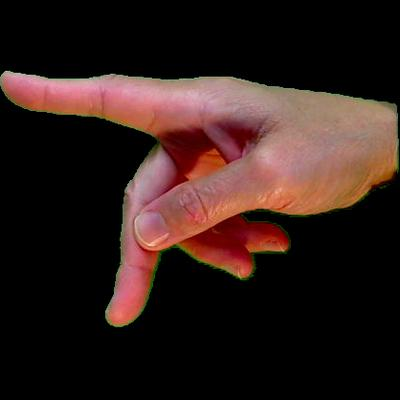

Sign: P


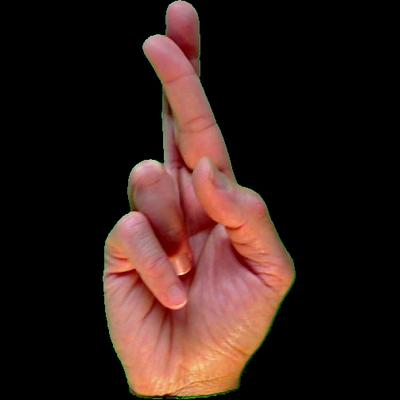

Sign: R


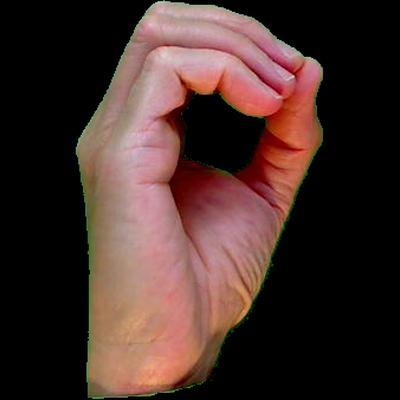

Sign: O


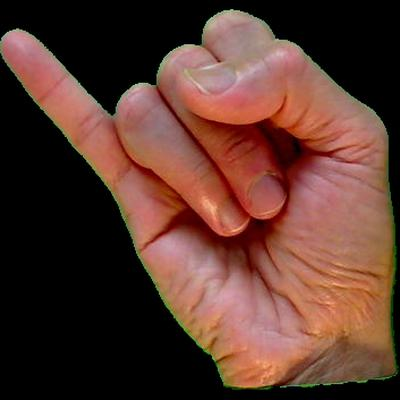

Sign: J


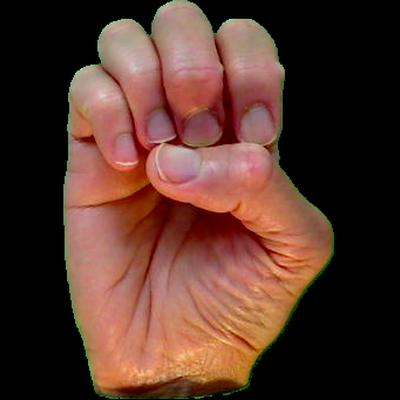

Sign: E


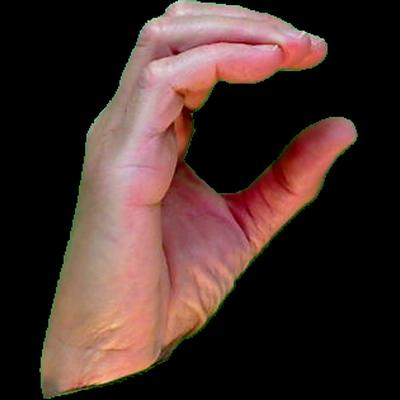

Sign: C


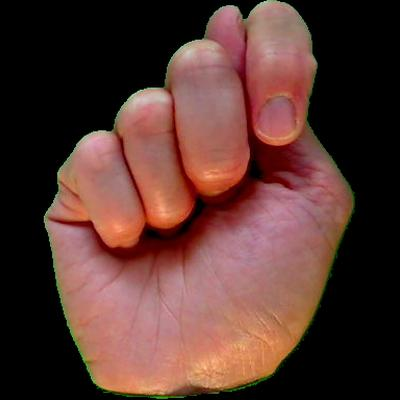

Sign: T

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU
Deaf Person: Good, how are you?
You: I AM FINE. CAN YOU HELP ME WITH MY PROJECT 

Deaf Person Signing: Of course!


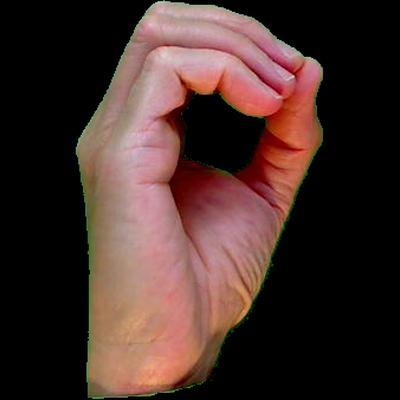

Sign: O


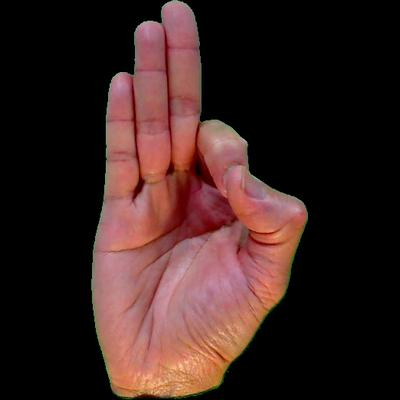

Sign: F


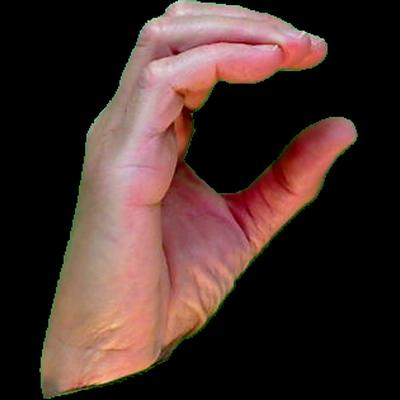

Sign: C


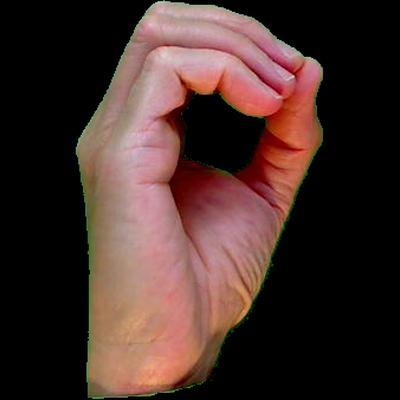

Sign: O


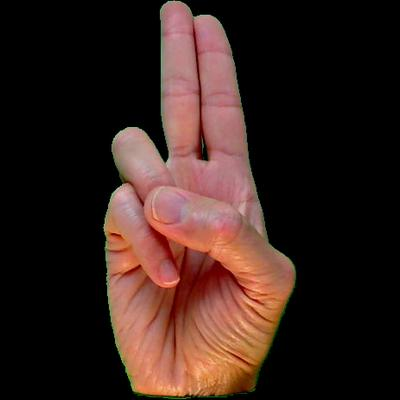

Sign: U


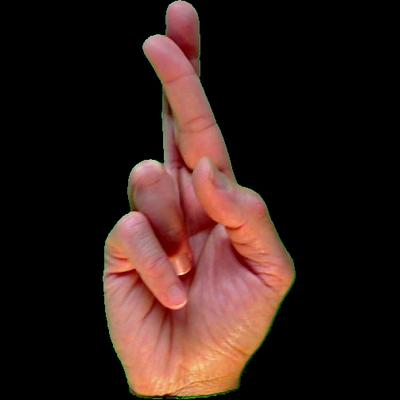

Sign: R


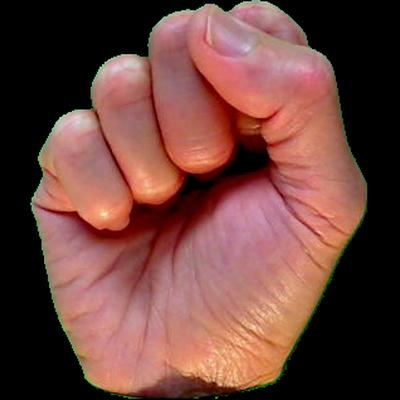

Sign: S


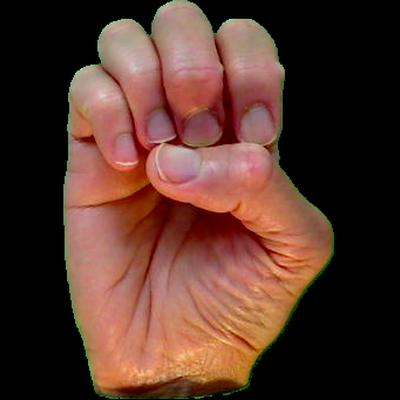

Sign: E
No sign image available for: !

Audio for hearing person:



Your response: WHEN ARE YOU FREE

Your Response as Signs:


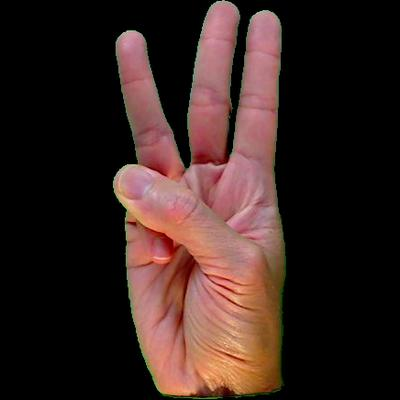

Sign: W


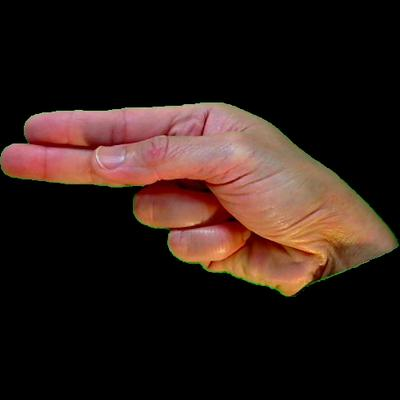

Sign: H


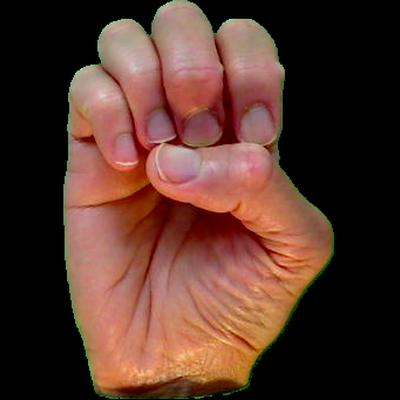

Sign: E


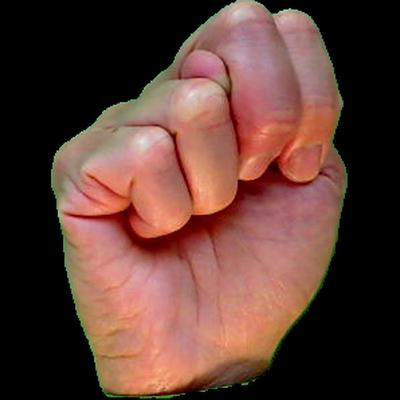

Sign: N


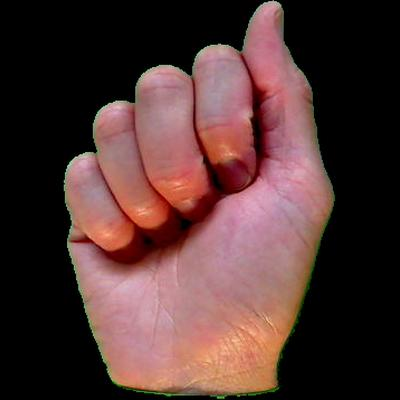

Sign: A


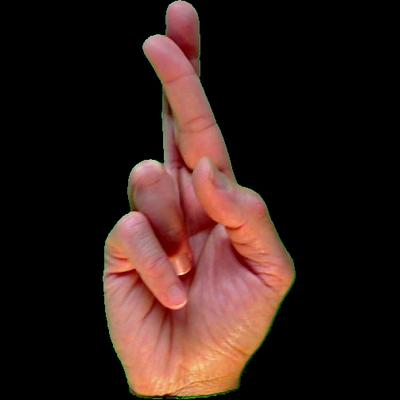

Sign: R


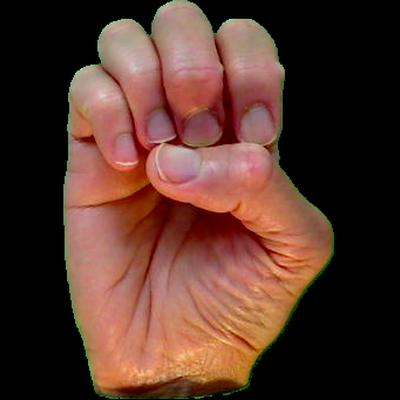

Sign: E


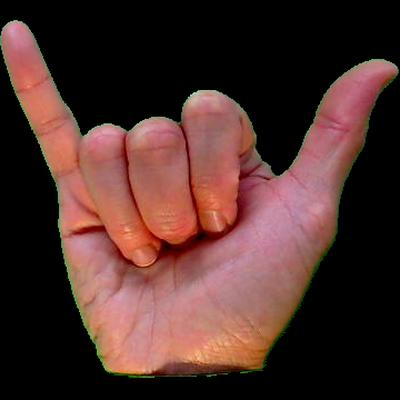

Sign: Y


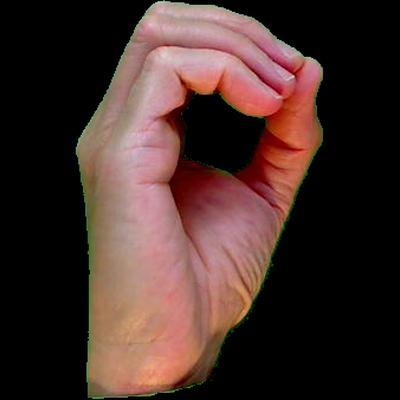

Sign: O


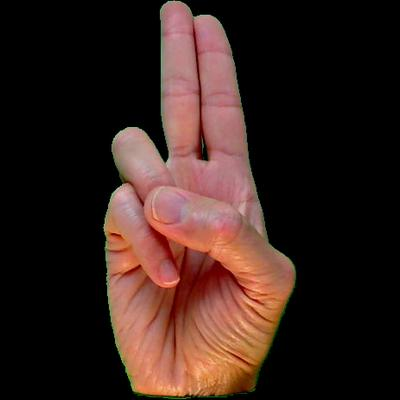

Sign: U


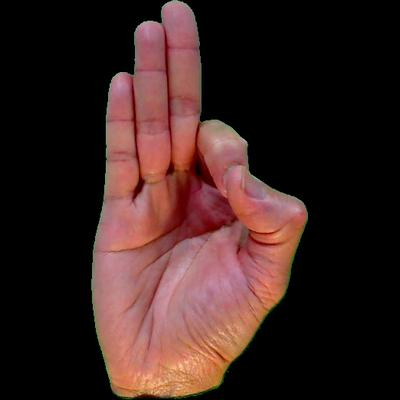

Sign: F


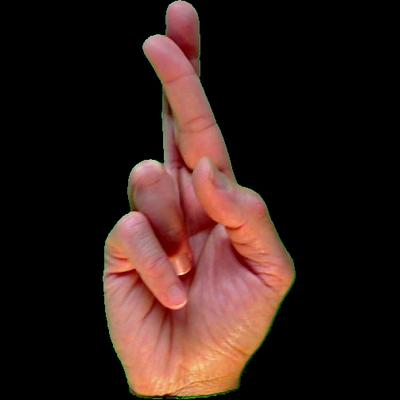

Sign: R


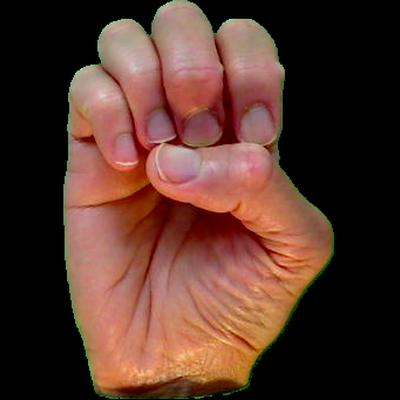

Sign: E


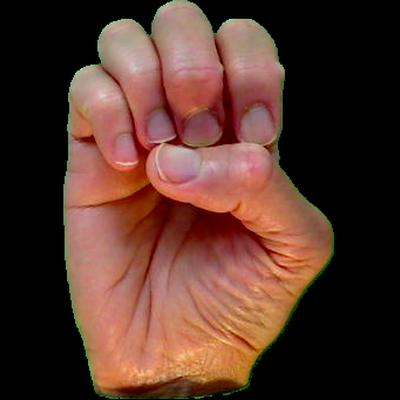

Sign: E

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU
Deaf Person: Good, how are you?
You: I AM FINE. CAN YOU HELP ME WITH MY PROJECT 
Deaf Person: Of course!
You: WHEN ARE YOU FREE

Deaf Person Signing: Tonight, I'm free all night.


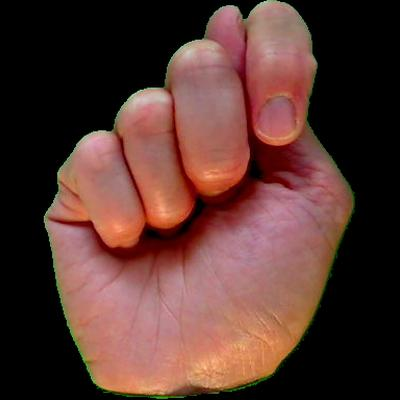

Sign: T


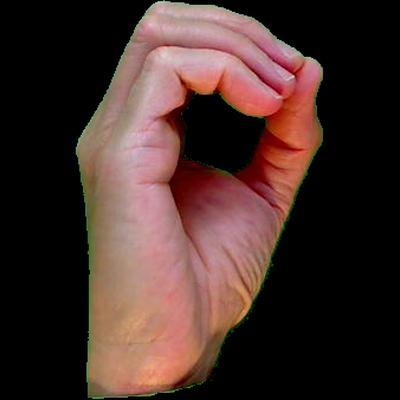

Sign: O


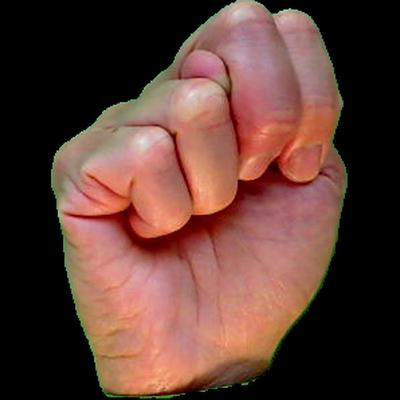

Sign: N


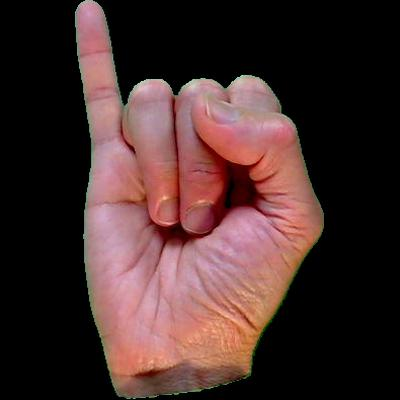

Sign: I


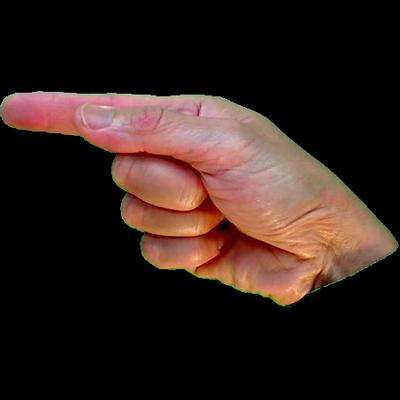

Sign: G


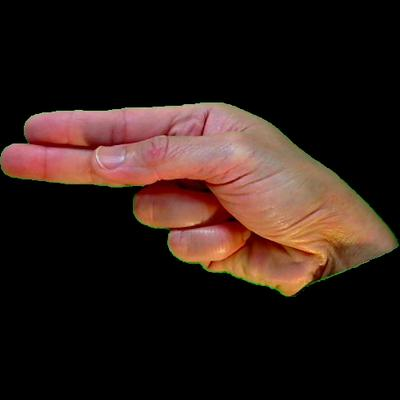

Sign: H


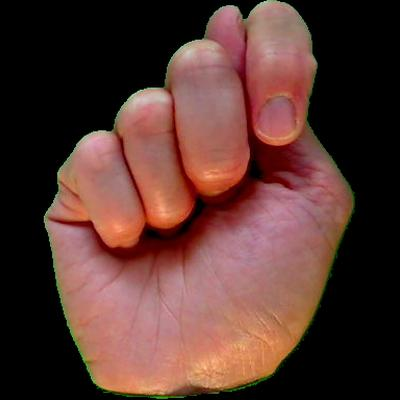

Sign: T
No sign image available for: ,


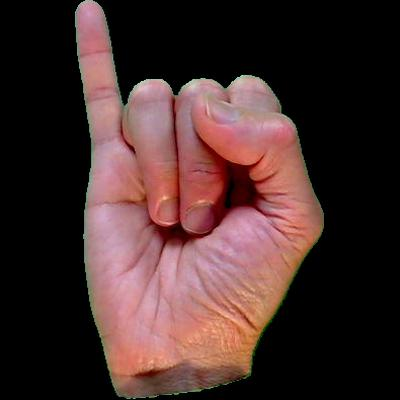

Sign: I
No sign image available for: '


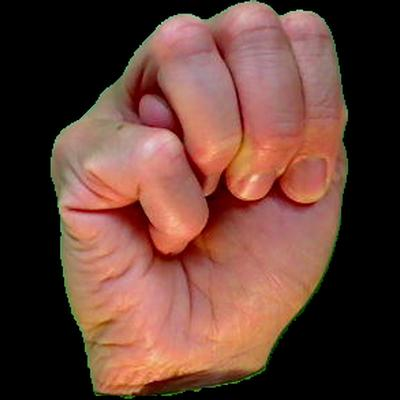

Sign: M


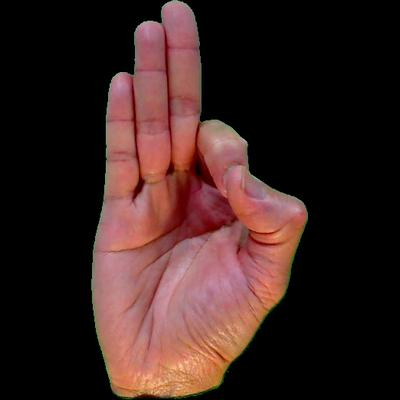

Sign: F


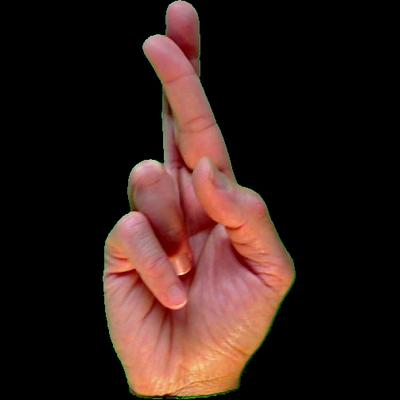

Sign: R


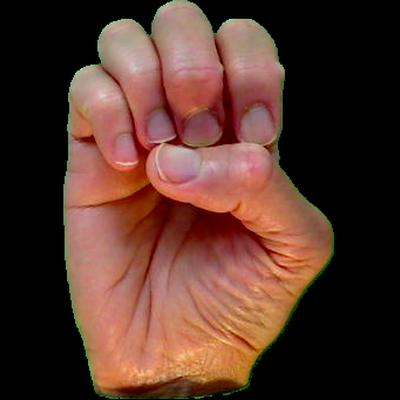

Sign: E


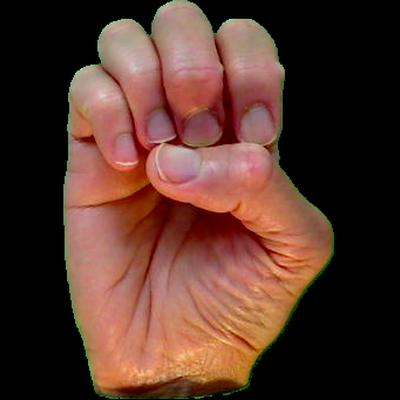

Sign: E


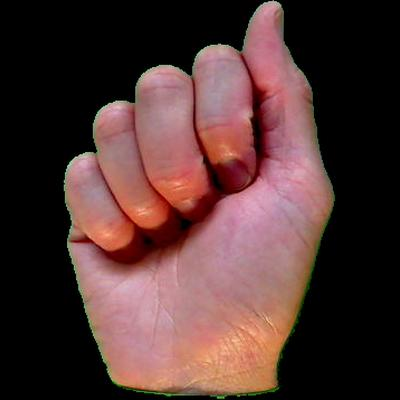

Sign: A


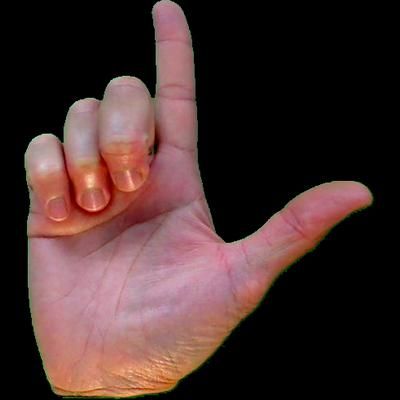

Sign: L


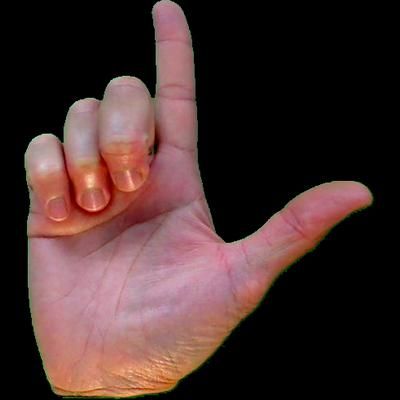

Sign: L


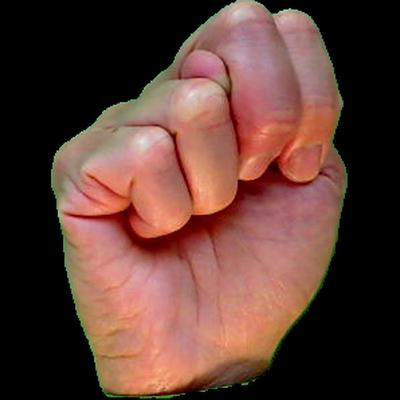

Sign: N


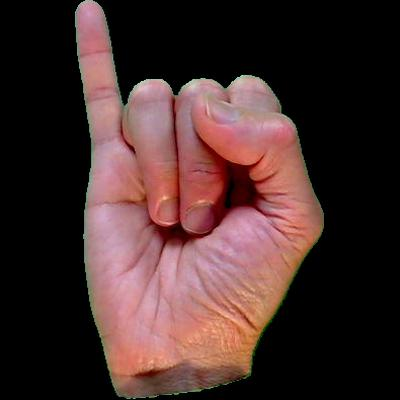

Sign: I


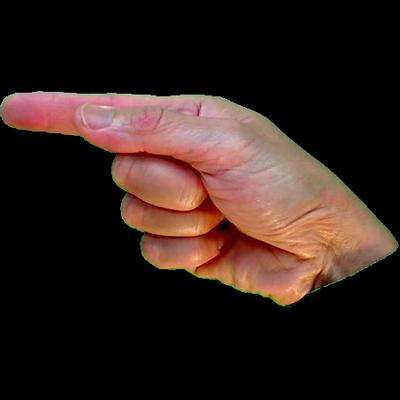

Sign: G


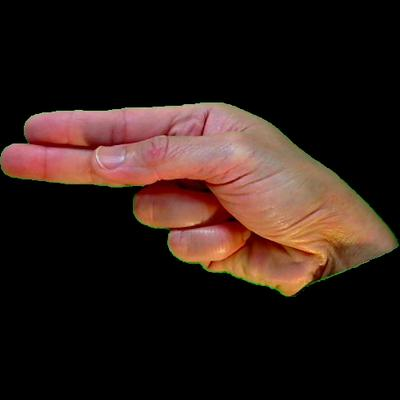

Sign: H


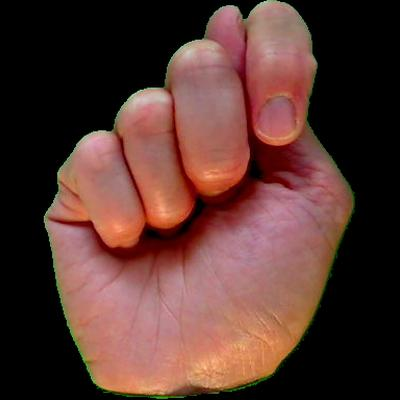

Sign: T
No sign image available for: .

Audio for hearing person:



Your response: DONE. THANK YOU.

Your Response as Signs:


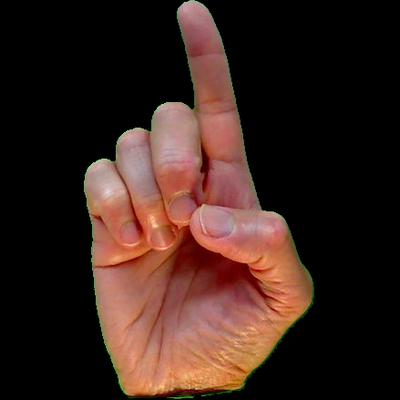

Sign: D


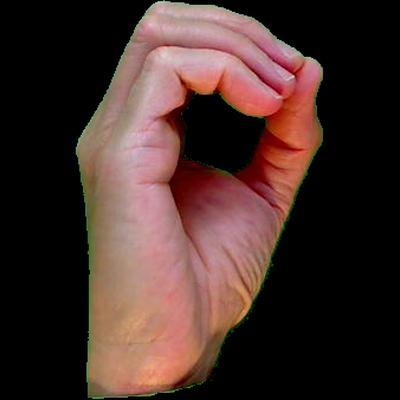

Sign: O


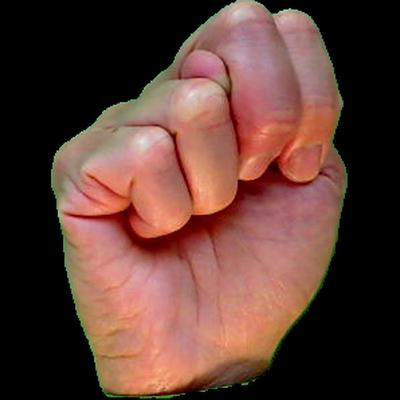

Sign: N


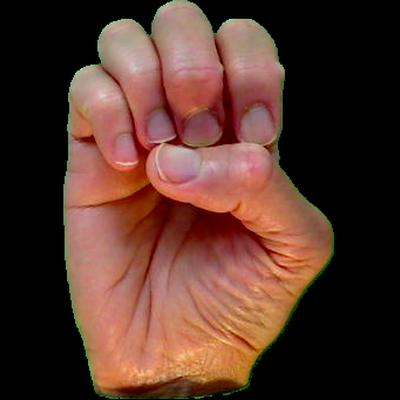

Sign: E
No sign image available for: .


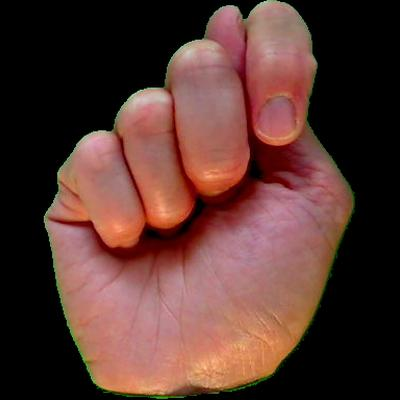

Sign: T


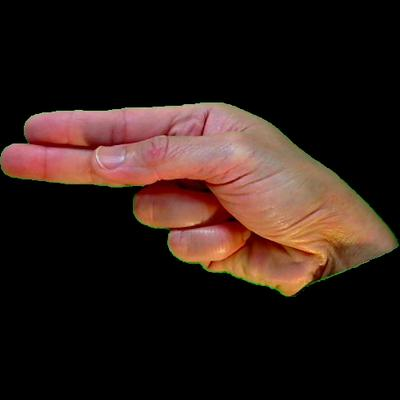

Sign: H


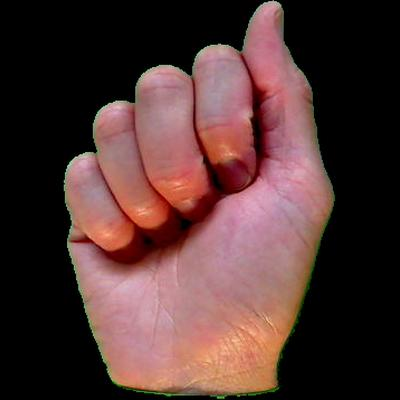

Sign: A


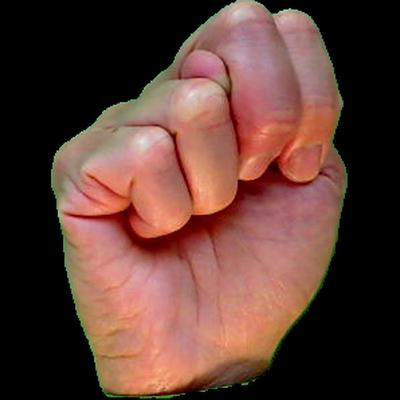

Sign: N


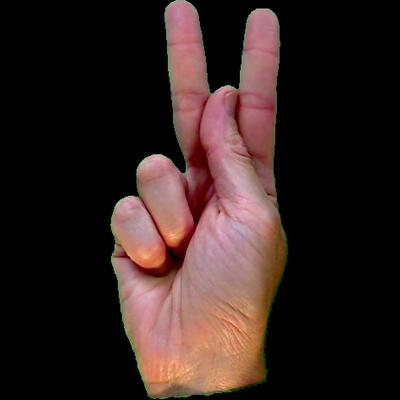

Sign: K


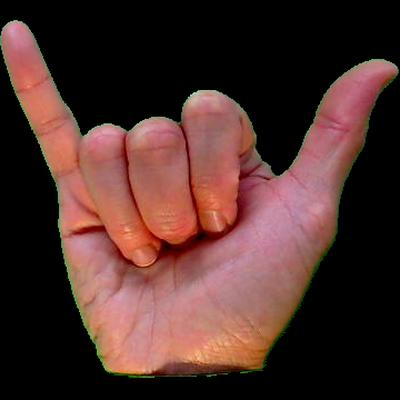

Sign: Y


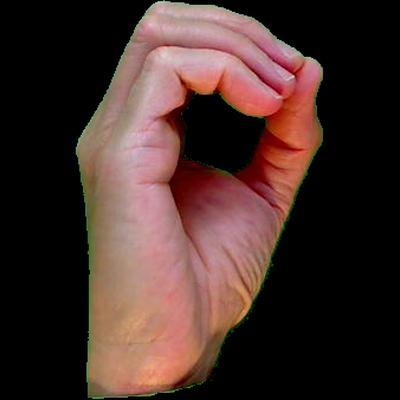

Sign: O


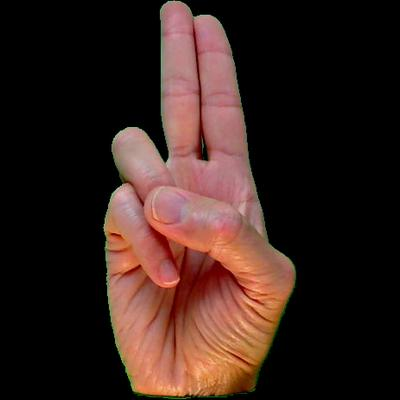

Sign: U
No sign image available for: .

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU
Deaf Person: Good, how are you?
You: I AM FINE. CAN YOU HELP ME WITH MY PROJECT 
Deaf Person: Of course!
You: WHEN ARE YOU FREE
Deaf Person: Tonight, I'm free all night.
You: DONE. THANK YOU.

Deaf Person Signing: You're welcome


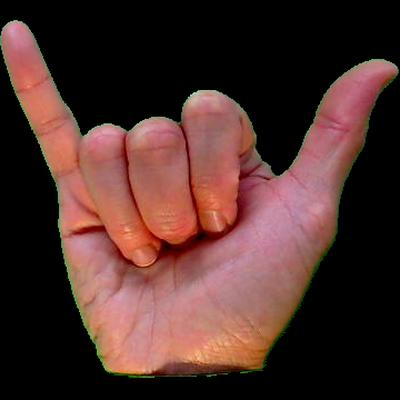

Sign: Y


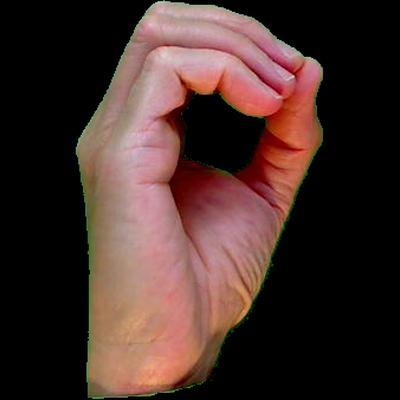

Sign: O


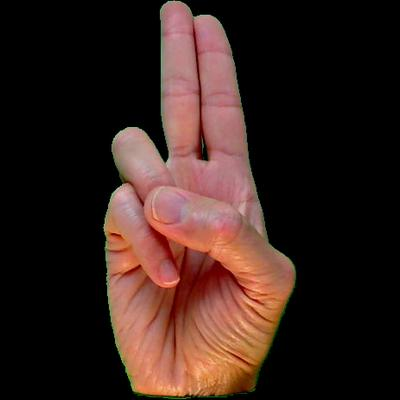

Sign: U
No sign image available for: '


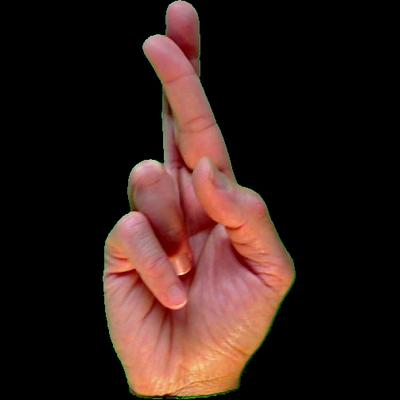

Sign: R


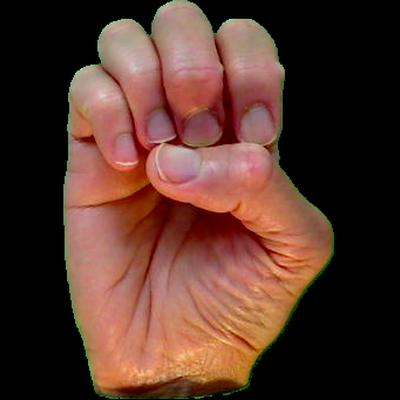

Sign: E


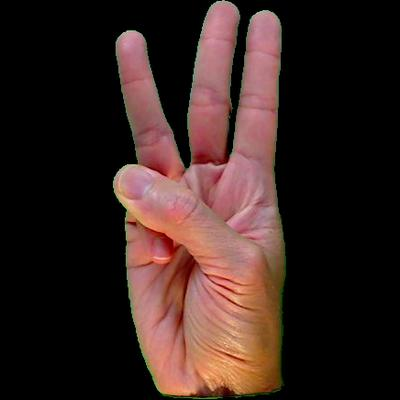

Sign: W


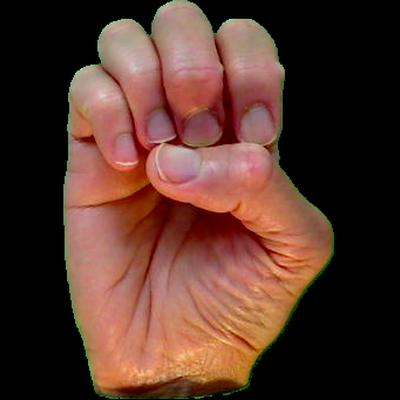

Sign: E


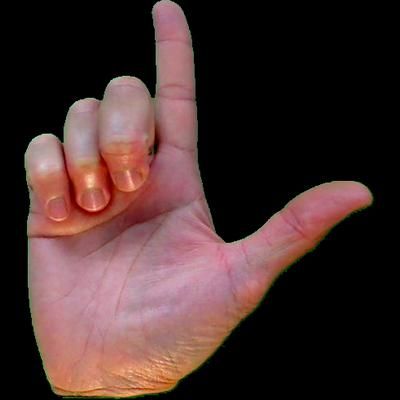

Sign: L


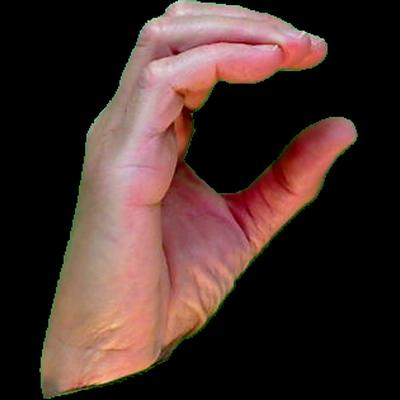

Sign: C


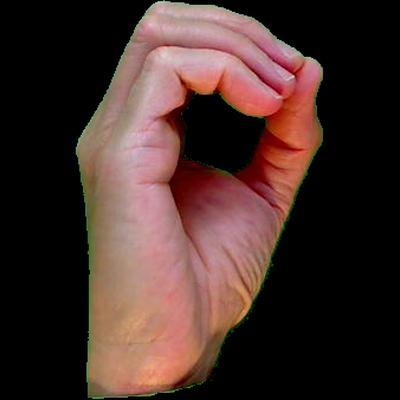

Sign: O


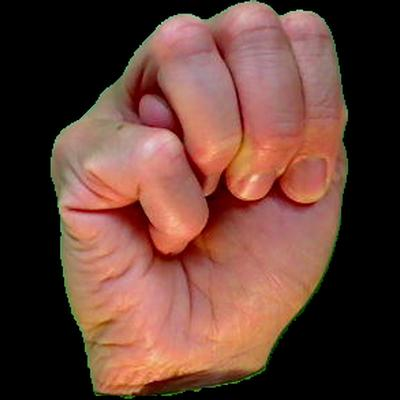

Sign: M


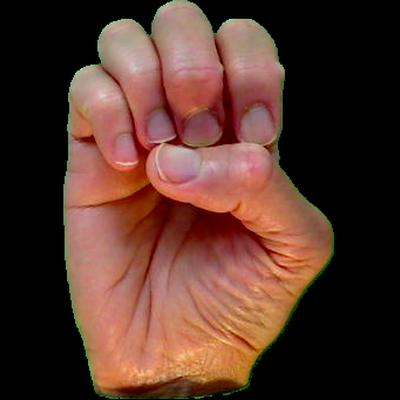

Sign: E

Audio for hearing person:



Your response: YOU ARE GREAT

Your Response as Signs:


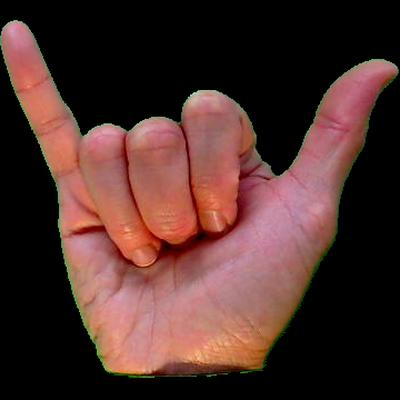

Sign: Y


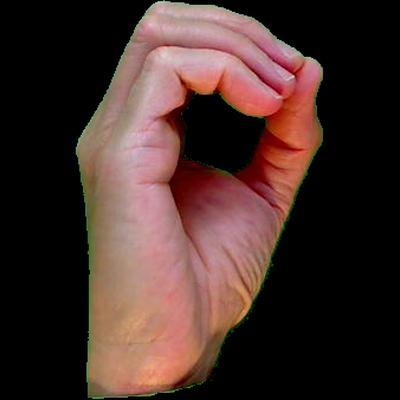

Sign: O


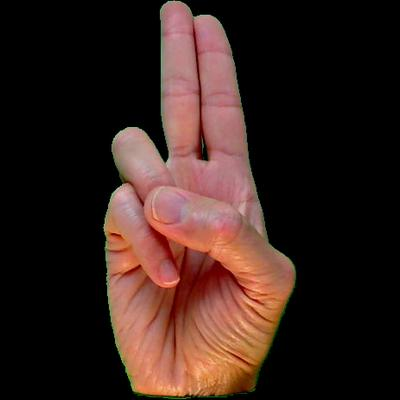

Sign: U


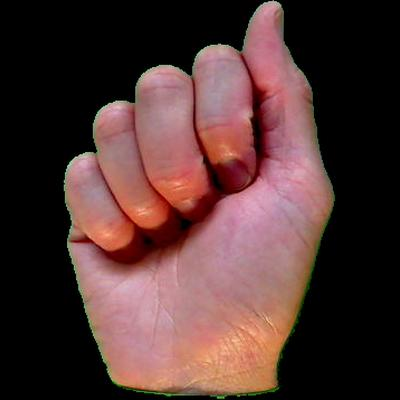

Sign: A


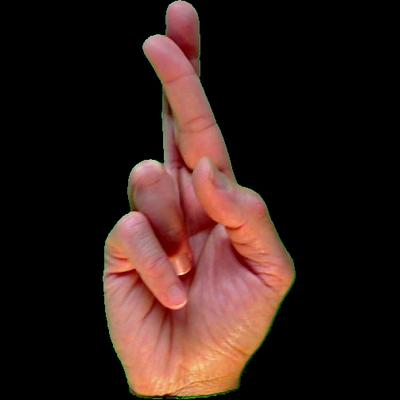

Sign: R


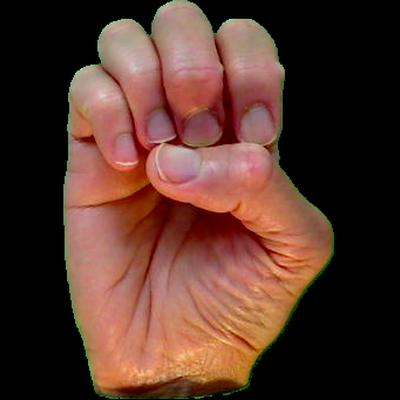

Sign: E


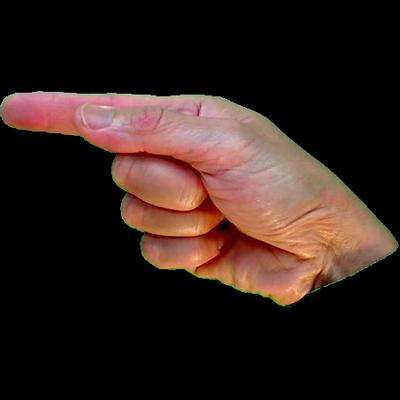

Sign: G


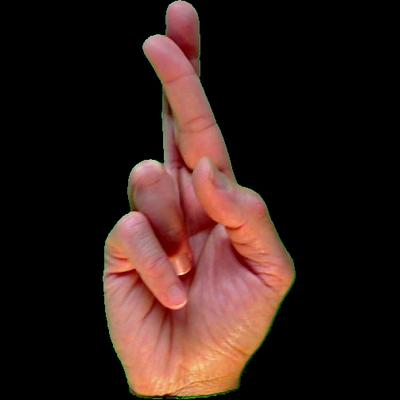

Sign: R


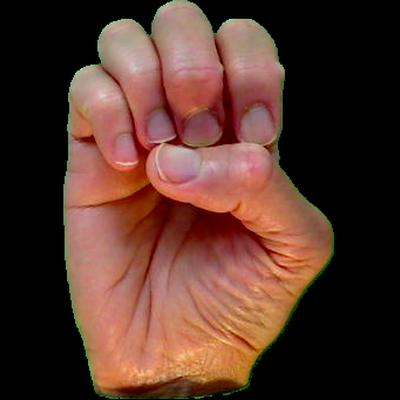

Sign: E


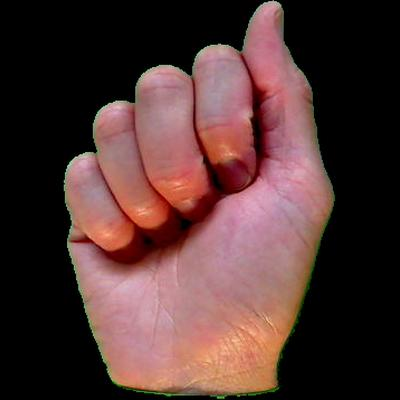

Sign: A


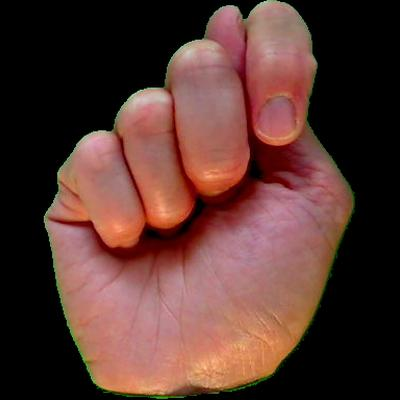

Sign: T

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU
Deaf Person: Good, how are you?
You: I AM FINE. CAN YOU HELP ME WITH MY PROJECT 
Deaf Person: Of course!
You: WHEN ARE YOU FREE
Deaf Person: Tonight, I'm free all night.
You: DONE. THANK YOU.
Deaf Person: You're welcome
You: YOU ARE GREAT

Deaf Person Signing: NO YOU'RE NOT


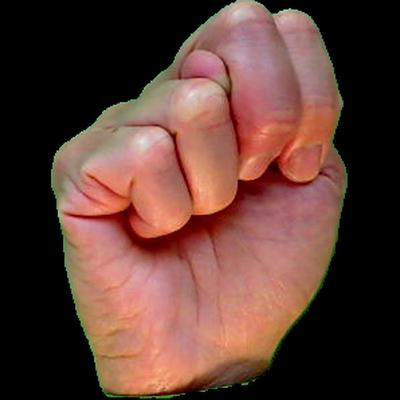

Sign: N


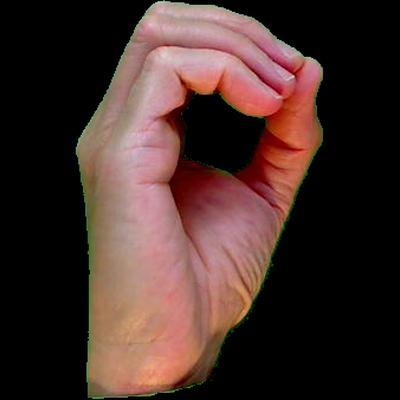

Sign: O


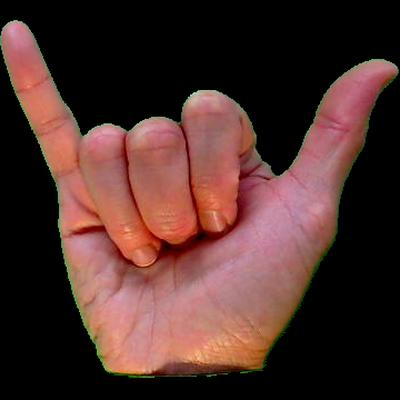

Sign: Y


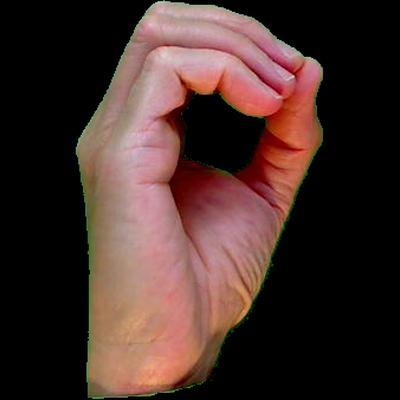

Sign: O


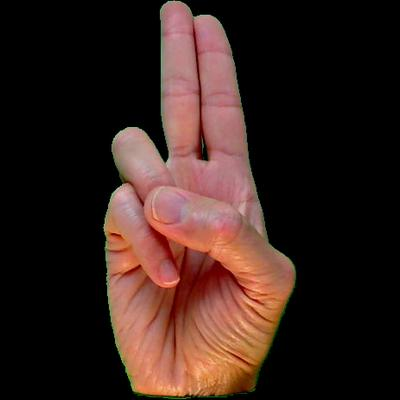

Sign: U
No sign image available for: '


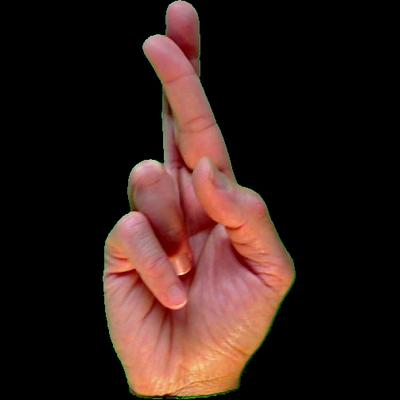

Sign: R


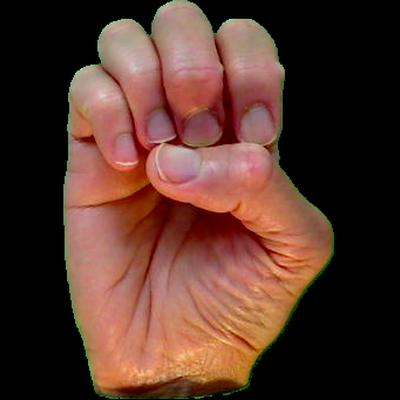

Sign: E


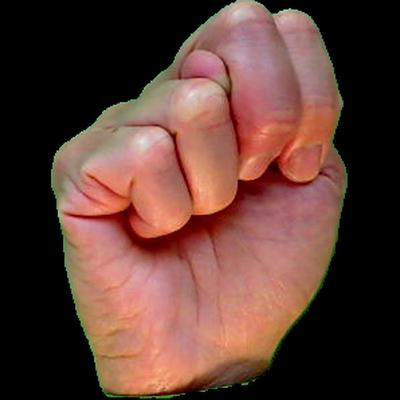

Sign: N


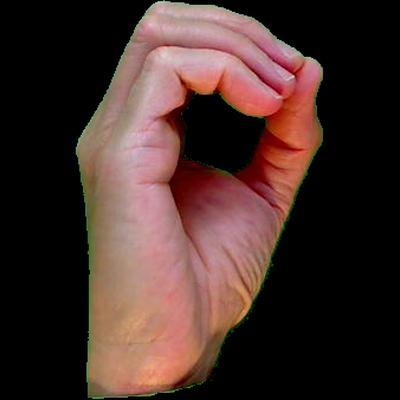

Sign: O


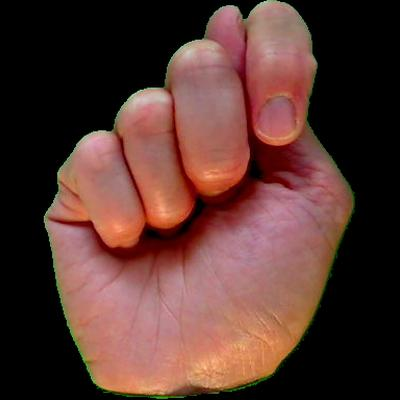

Sign: T

Audio for hearing person:



Your response: HAHA. I AM JOKING.

Your Response as Signs:


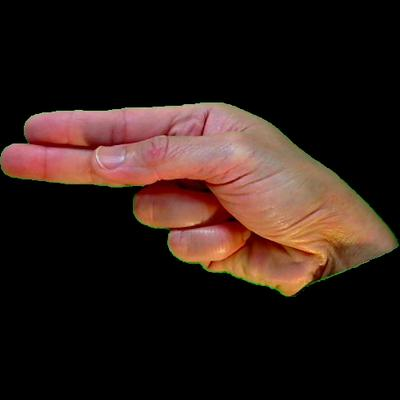

Sign: H


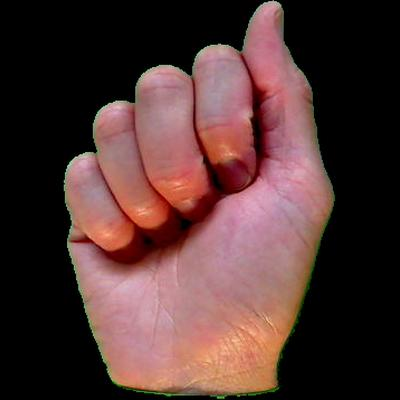

Sign: A


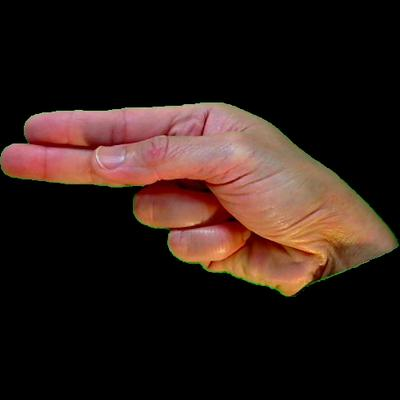

Sign: H


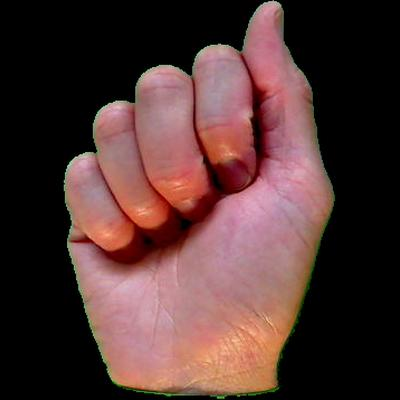

Sign: A
No sign image available for: .


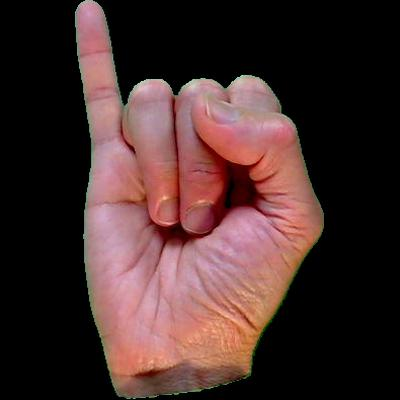

Sign: I


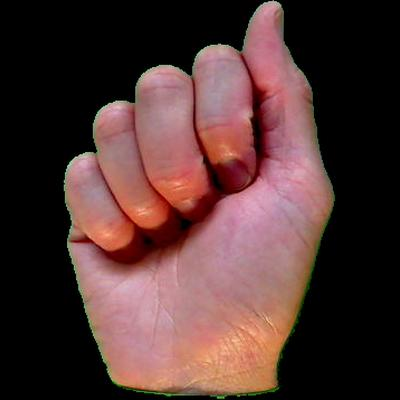

Sign: A


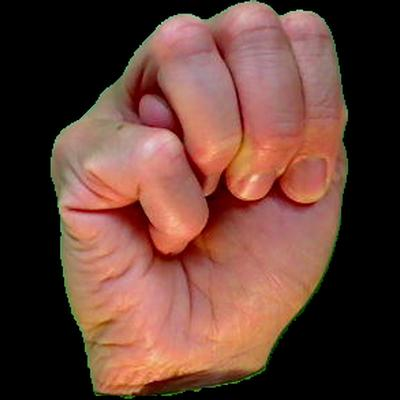

Sign: M


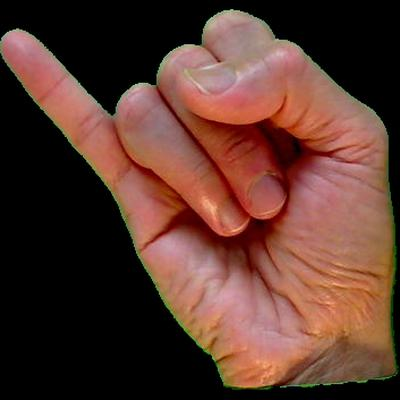

Sign: J


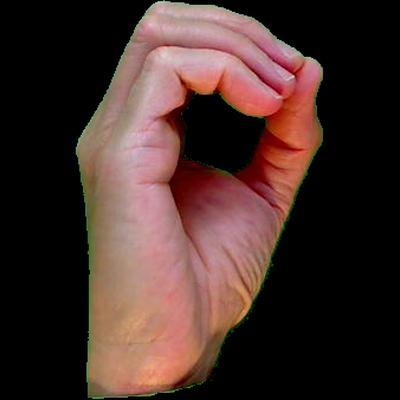

Sign: O


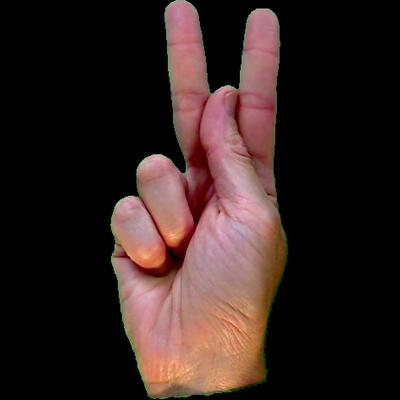

Sign: K


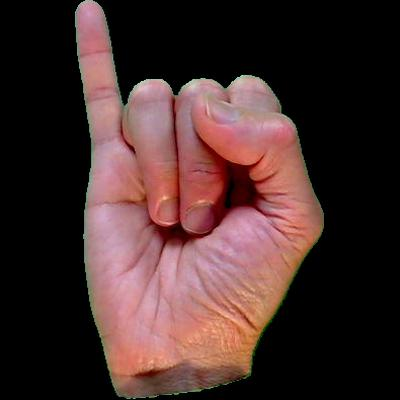

Sign: I


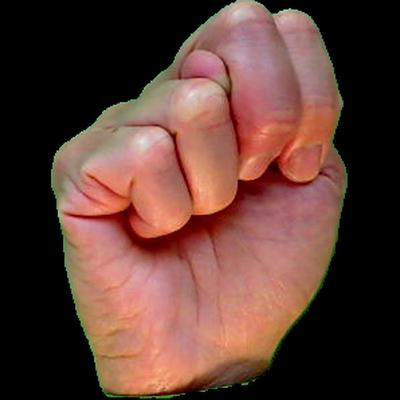

Sign: N


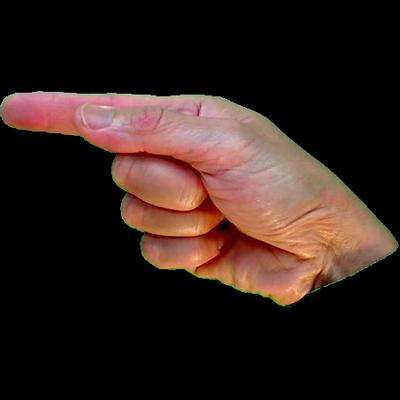

Sign: G
No sign image available for: .

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU
Deaf Person: Good, how are you?
You: I AM FINE. CAN YOU HELP ME WITH MY PROJECT 
Deaf Person: Of course!
You: WHEN ARE YOU FREE
Deaf Person: Tonight, I'm free all night.
You: DONE. THANK YOU.
Deaf Person: You're welcome
You: YOU ARE GREAT
Deaf Person: NO YOU'RE NOT
You: HAHA. I AM JOKING.

Deaf Person Signing: No, YOU are great


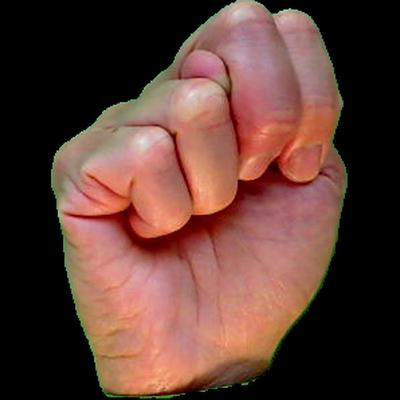

Sign: N


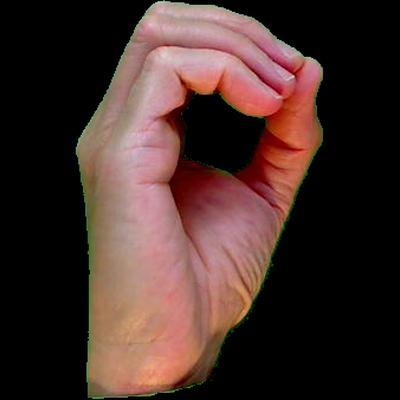

Sign: O
No sign image available for: ,


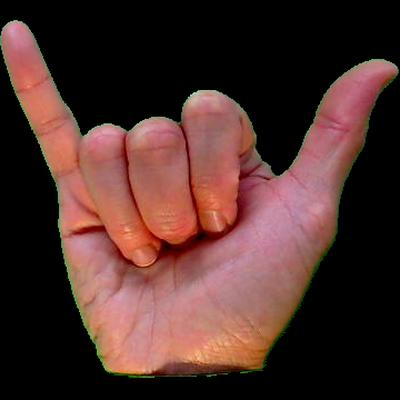

Sign: Y


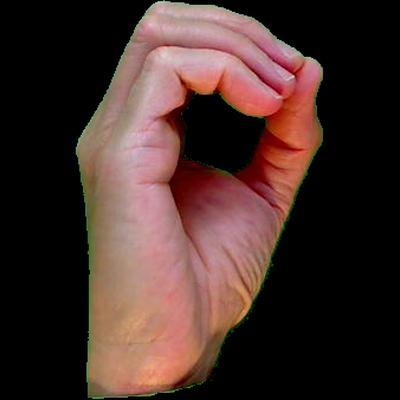

Sign: O


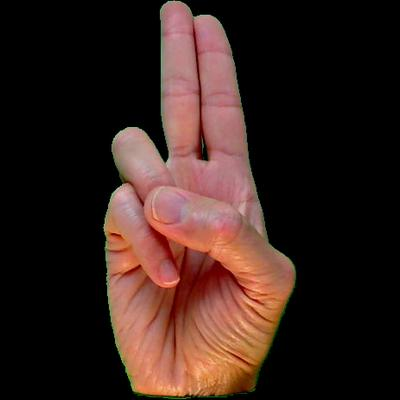

Sign: U


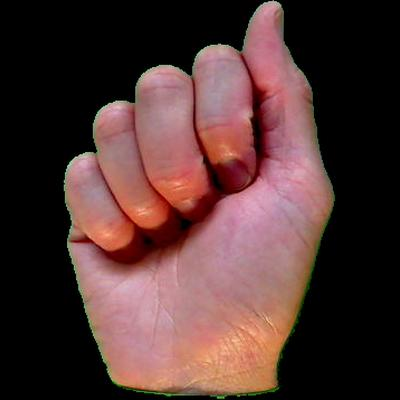

Sign: A


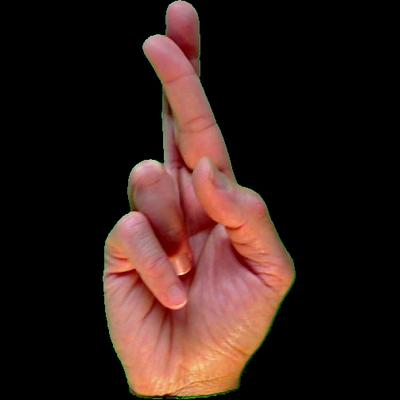

Sign: R


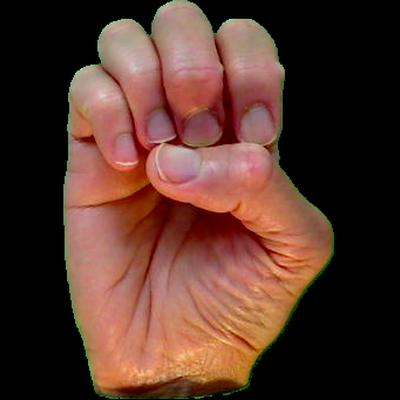

Sign: E


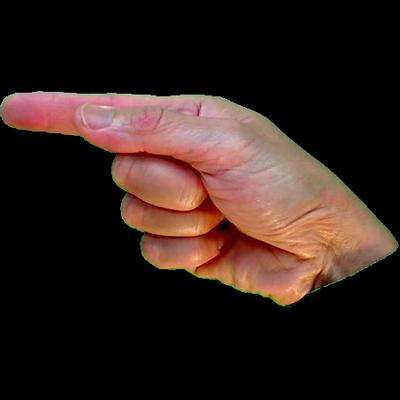

Sign: G


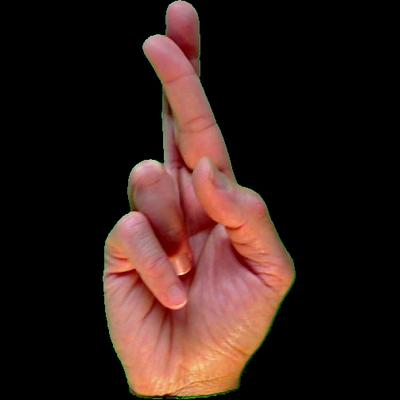

Sign: R


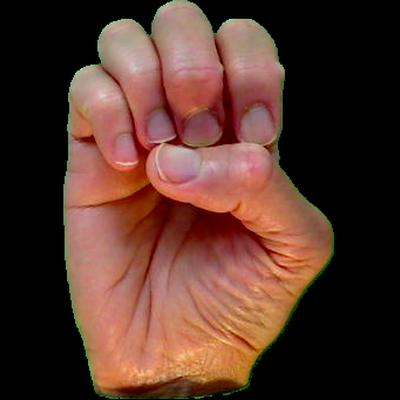

Sign: E


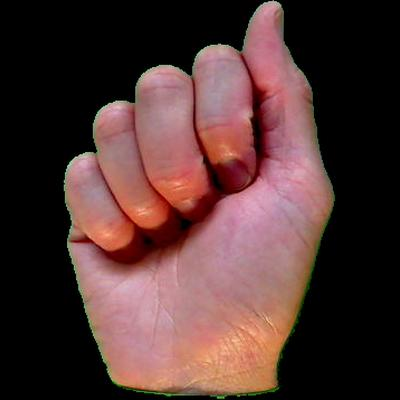

Sign: A


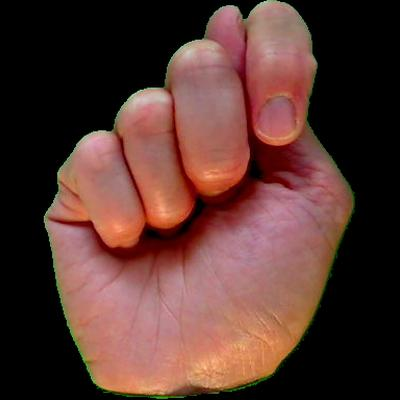

Sign: T

Audio for hearing person:



Your response: THANK YOU

Your Response as Signs:


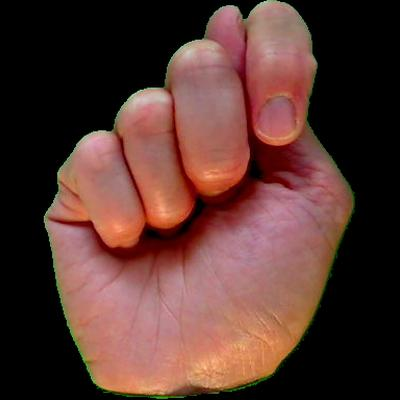

Sign: T


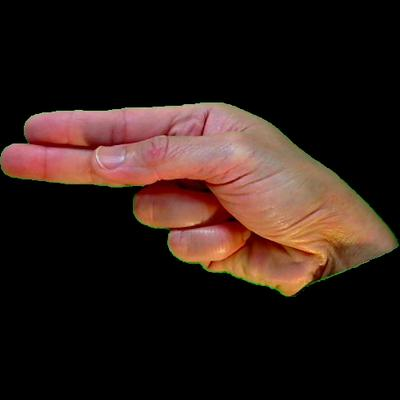

Sign: H


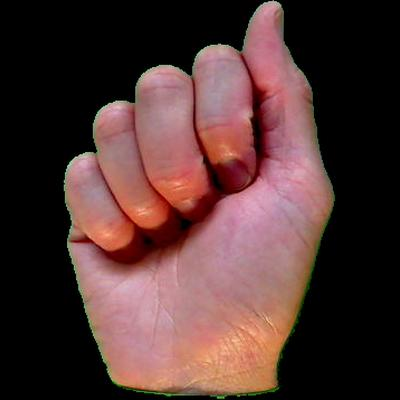

Sign: A


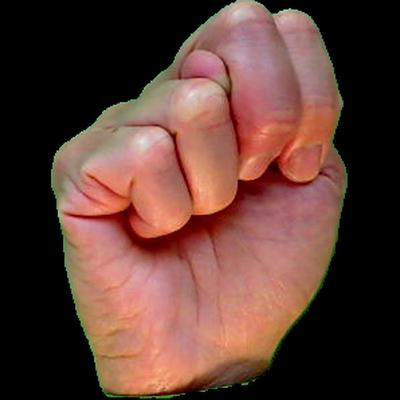

Sign: N


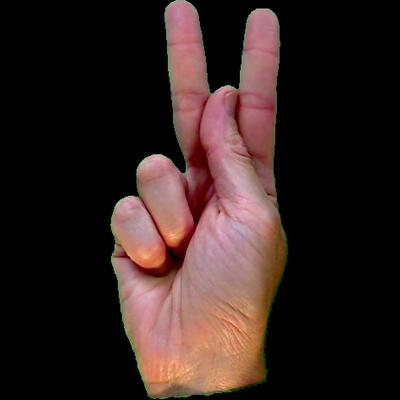

Sign: K


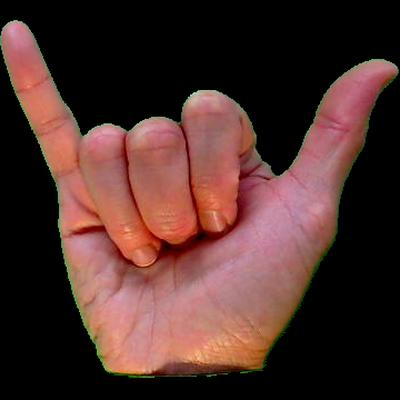

Sign: Y


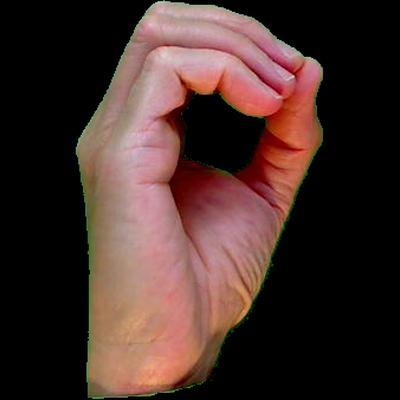

Sign: O


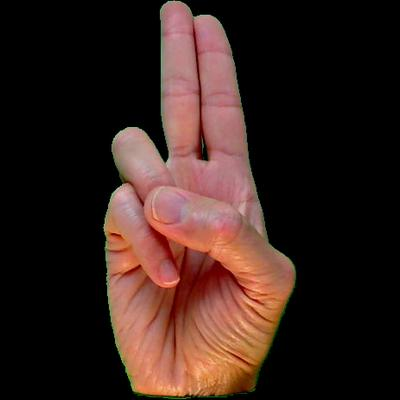

Sign: U

--- Entire Conversation History ---
Deaf Person: HELLO, HOW CAN I HELP YOU?
You: HOW ARE YOU
Deaf Person: Good, how are you?
You: I AM FINE. CAN YOU HELP ME WITH MY PROJECT 
Deaf Person: Of course!
You: WHEN ARE YOU FREE
Deaf Person: Tonight, I'm free all night.
You: DONE. THANK YOU.
Deaf Person: You're welcome
You: YOU ARE GREAT
Deaf Person: NO YOU'RE NOT
You: HAHA. I AM JOKING.
Deaf Person: No, YOU are great
You: THANK YOU

Deaf Person Signing: Thank you


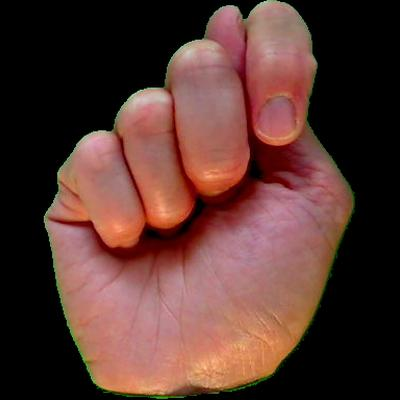

Sign: T


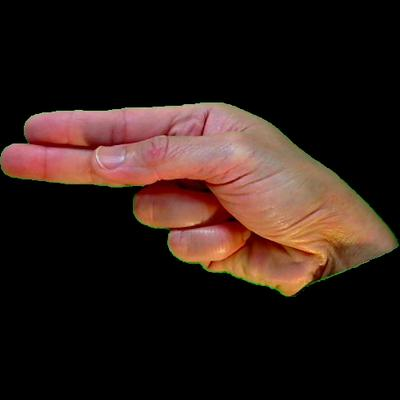

Sign: H


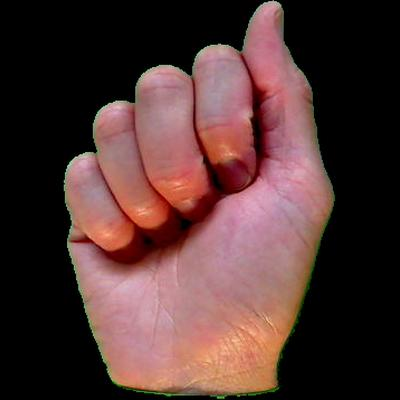

Sign: A


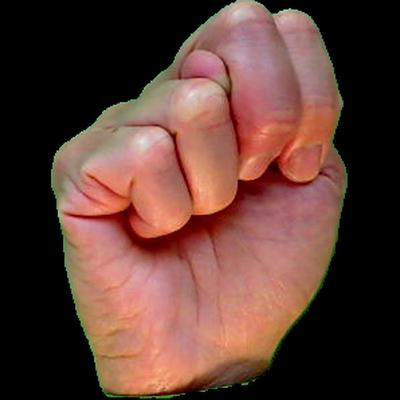

Sign: N


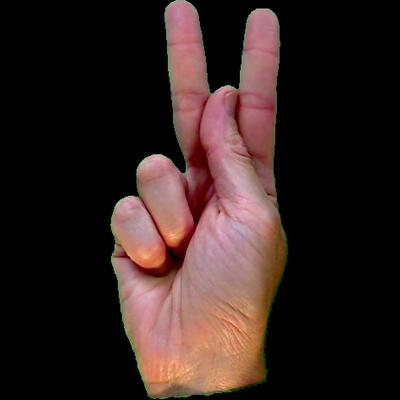

Sign: K


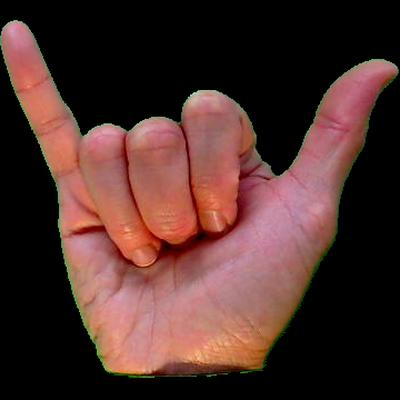

Sign: Y


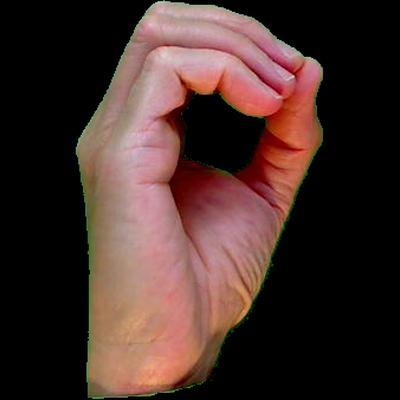

Sign: O


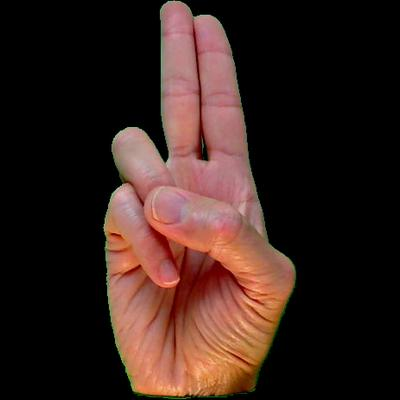

Sign: U

Audio for hearing person:



Interactive simulation safely ended.


In [ ]:
import zipfile
import os
import time
import random
from PIL import Image
from gtts import gTTS
from IPython.display import Audio, display, Image as IPImage
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch

# Extract images from ZIP file
zip_path = '/content/IMAGES.zip'
extracted_dir = './extracted_images'
os.makedirs(extracted_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

image_dir = os.path.join(extracted_dir, 'IMAGES')

# Initialize NLP chatbot model and tokenizer
model_name = "microsoft/DialoGPT-medium"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

# Mapping letters to images
image_files = sorted(os.listdir(image_dir))
sign_image_map = {chr(65 + i): os.path.join(image_dir, img) for i, img in enumerate(image_files)}

# Generate audio function
def generate_audio(text, filename="response_audio.mp3"):
    tts = gTTS(text=text, lang='en')
    tts.save(filename)
    return filename

# Function to display text as signs with notation clearly after each sign
def display_text_as_signs(text):
    text = text.upper().replace(" ", "")
    for letter in text:
        if letter in sign_image_map:
            display(IPImage(filename=sign_image_map[letter]))
            print(f"Sign: {letter}")
            time.sleep(0.3)
        else:
            print(f"No sign image available for: {letter}")

# Fallback responses clearly defined
fallback_responses = [
    "CAN YOU PLEASE REPEAT?",
    "SORRY, COULD YOU SAY THAT AGAIN?",
    "I'M NOT SURE I UNDERSTOOD, PLEASE REPEAT.",
    "CAN YOU REPHRASE THAT?"
]

def get_fallback_response():
    return random.choice(fallback_responses)

conversation_history = []
current_phrase = "HELLO, HOW CAN I HELP YOU?"
chat_history_ids = None

try:
    while True:
        # Display entire conversation clearly
        print("\n--- Entire Conversation History ---")
        for speaker, phrase in conversation_history:
            print(f"{speaker}: {phrase}")

        # Deaf person's turn
        print(f"\nDeaf Person Signing: {current_phrase}")
        display_text_as_signs(current_phrase)
        conversation_history.append(("Deaf Person", current_phrase))

        audio_output_path = "deaf_person_audio.mp3"
        generate_audio(current_phrase, audio_output_path)

        print("\nAudio for hearing person:")
        display(Audio(audio_output_path, autoplay=True))

        # Hearing person's turn
        user_response = input("\nYour response: ")
        conversation_history.append(("You", user_response))

        print("\nYour Response as Signs:")
        display_text_as_signs(user_response)

        new_user_input_ids = tokenizer.encode(user_response + tokenizer.eos_token, return_tensors='pt')
        bot_input_ids = new_user_input_ids if chat_history_ids is None else torch.cat([chat_history_ids, new_user_input_ids], dim=-1)

        chat_history_ids = model.generate(
            bot_input_ids,
            max_length=100,
            pad_token_id=tokenizer.eos_token_id,
            do_sample=True,
            top_k=15,
            top_p=0.7,
            temperature=0.4,
            num_beams=5,
            early_stopping=True,
            no_repeat_ngram_size=2
        )

        response_text = tokenizer.decode(chat_history_ids[:, bot_input_ids.shape[-1]:][0], skip_special_tokens=True).strip()

        if response_text.strip() == "" or response_text in user_response or response_text == current_phrase:
            current_phrase = get_fallback_response()
        else:
            current_phrase = response_text

except KeyboardInterrupt:
    print("\nInteractive simulation safely ended.")
